In [1]:
## find marker gene
'''
1. get marker genes from every cell by attention weights 
2. choose most frequent marker genes from same cell type
3. del marker genes from input data
4. analysis change of cell type prediction

'''

'\n1. get marker genes from every cell by attention weights \n2. choose most frequent marker genes from same cell type\n3. del marker genes from input data\n4. analysis change of cell type prediction\n\n'

In [2]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "1"
project_path = '/media/workspace/caoguangshuo/scPlantGPT'
os.chdir(f'{project_path}/s03_scPlantGPT/trainer')
import matplotlib.pyplot as plt
import torch 
import numpy as np
import sys
import pandas as pd
import torch.nn.functional as F
from torch import nn
sys.path.insert(0, "../")
from Util.utils import *
from scgpt.model import TransformerModel, AdversarialDiscriminator
from s01_pretrain import data_loader, test_cross#, train, evaluate
from einops import rearrange
import seaborn as sns

In [3]:
seed=1234
set_seed(seed)
config = load_config('/media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/Util/test_annotation.json')
logger = setup_custom_logger(f"L05.attention_weights", './../Log/')

In [4]:
data_path = f'/mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/model_data/ara_root/PRJNA989636_has_celltype'
batch_size=64
logger.info(f"loading data from {data_path}")
train_sampler, train_loader, train_metadata = data_loader(data_path,  data_type='test',start_chunk=1, num_chunks=1, batch_size=batch_size,logger=logger, append_cls=True, parallel=False)


2025-02-25 15:34:03,426 - INFO - 3823979538 - loading data from /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/model_data/ara_root/PRJNA989636_has_celltype
2025-02-25 15:34:03,429 - INFO - s01_pretrain - Loading test data from chunk 1...
2025-02-25 15:34:04,229 - INFO - s01_pretrain - Combining test data from chunks 1 to 1...
2025-02-25 15:34:04,271 - INFO - s01_pretrain - Combined test data from chunks 1 to 1. Done!
2025-02-25 15:34:04,310 - INFO - s01_pretrain - Transformed test data from h5file to numpy array.
2025-02-25 15:34:04,348 - INFO - s01_pretrain - Load test data from /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/model_data/ara_root/PRJNA989636_has_celltype. The number of samples is 1221.


In [5]:
hyperparameter_defaults = dict(
    parallel=False,
    epochs=15, #pretrain 30
    batch_size=batch_size, # 64 
    lr=1e-4,
    ntoken= 185622, #Ara 45416, cross 185622
    nctype= 87, #54,
    nbatch_effect= 238,#156,
    ecs_threshold=0.8,  # Elastic cell similarity objective, 0.0 to 1.0, 0.0 to disable
    layer_size=512,
    hlayer_size=512,
    nlayers=6,
    nhead=8,
    nlayers_cls=3,
    dropout=0.5,
    schedule_ratio=0.9,  # ratio of epochs for learning rate schedule
    save_eval_interval=5,
    fast_transformer=True,
    explicit_zero_prob=False,
    pre_norm=True,
    Species='cross',
)

In [6]:
if config.input_emb_style == "category":
    n_input_bins = config.n_bins  + 2 # pad_value:-2, cls_value:0, masked_value:-1
else:
    n_input_bins = config.n_bins

In [7]:
os.environ['CUDA_VISIBLE_DEVICES'] = "2"
device = torch.device('cuda', 0)
model = TransformerModel(
    ntoken=hyperparameter_defaults['ntoken'],
    d_model=hyperparameter_defaults['layer_size'],
    nhead=hyperparameter_defaults['nhead'],
    d_hid=hyperparameter_defaults['hlayer_size'],
    nlayers=hyperparameter_defaults['nlayers'],
    n_cls=hyperparameter_defaults['nctype'],
    nlayers_cls=hyperparameter_defaults['nlayers_cls'], 
    pad_value=int(config.pad_value),
    pad_token_id=config.pad_token_id,
    input_emb_style=config.input_emb_style,
    n_input_bins=n_input_bins,
    use_fast_transformer=hyperparameter_defaults['fast_transformer'],
    do_mvc=config.GEPC, 
    do_dab=True, 
    use_batch_labels=config.use_batch_labels, 
    num_batch_labels=hyperparameter_defaults['nbatch_effect'],
    domain_spec_batchnorm=config.DSBN, 
    cell_emb_style="cls", 
    mvc_decoder_style="inner product", 
    ecs_threshold=hyperparameter_defaults['ecs_threshold'], 
    explicit_zero_prob=hyperparameter_defaults['explicit_zero_prob'], 

    pre_norm=hyperparameter_defaults['pre_norm'],
    
    
)
model.to(device)

/mnt/public3/caogs/anaconda3/envs/scPlantGPT/lib/python3.11/site-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer was not TransformerEncoderLayer
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


TransformerModel(
  (encoder): GeneEncoder(
    (embedding): Embedding(185622, 512, padding_idx=0)
    (enc_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  )
  (value_encoder): CategoryValueEncoder(
    (embedding): Embedding(103, 512, padding_idx=101)
    (enc_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  )
  (transformer_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-5): 6 x FlashTransformerEncoderLayer(
        (self_attn): FlashMHA(
          (Wqkv): Linear(in_features=512, out_features=1536, bias=True)
          (inner_attn): FlashAttention()
          (out_proj): Linear(in_features=512, out_features=512, bias=True)
        )
        (linear1): Linear(in_features=512, out_features=512, bias=True)
        (dropout): Dropout(p=0.5, inplace=False)
        (linear2): Linear(in_features=512, out_features=512, bias=True)
        (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((512,), eps=1e-05, e

In [8]:
project_path = '/media/workspace/caoguangshuo/scPlantGPT'

load_model = True
freeze = False
if load_model:
    # model_name = f'{project_path}/s03.scPlantGPT/trainer/model_param/finetune_CLS_cross_train_clean_label/best_model/best_model_category_7_2024Y07M02D04H35M09S.pth'
    model_name=f"{project_path}/s03_scPlantGPT/trainer/model_param/scAraGPT_finetune_CLS/best_model/best_model_category_8_2024Y08M18D12H54M09S.pth"
    logger.info(f"Loading model from {model_name}")
    # model_name = './model_param/pretrain/2024Y05M15D22H58M33S_model_3.pth'
    try:
        model.load_state_dict(torch.load(model_name))
        logger.info(f"Loading all model params from {model_name}")
        if freeze:
            for name, param in model.named_parameters():
                if 'decoder' not in name:  # 冻结
                    param.requires_grad = False
                    logger.info(f"Freeze {name}")
            for name, param in model.named_parameters():
                logger.info(f'{name}: requires_grad={param.requires_grad}')

    except:
        logger.info(f"Because of the model structure change, only load params that are in the model and match the size!")
        # only load params that are in the model and match the size
        model_dict = model.state_dict()
        pretrained_dict = torch.load(model_name)
        pretrained_dict = {
            k: v
            for k, v in pretrained_dict.items()
            if k in model_dict and v.shape == model_dict[k].shape
        }
        for k, v in pretrained_dict.items():
            logger.info(f"Loading params {k} with shape {v.shape}")
        model_dict.update(pretrained_dict)
        model.load_state_dict(model_dict)
        if freeze:
            for name, param in model.named_parameters():
                if 'decoder' not in name:  # 冻结
                    param.requires_grad = False
                    logger.info(f"Freeze {name}")
            for name, param in model.named_parameters():
                logger.info(f'{name}: requires_grad={param.requires_grad}')

2025-02-25 15:34:05,993 - INFO - 2287179990 - Loading model from /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/trainer/model_param/scAraGPT_finetune_CLS/best_model/best_model_category_8_2024Y08M18D12H54M09S.pth
2025-02-25 15:34:06,332 - INFO - 2287179990 - Because of the model structure change, only load params that are in the model and match the size!
2025-02-25 15:34:06,650 - INFO - 2287179990 - Loading params encoder.embedding.weight with shape torch.Size([185622, 512])
2025-02-25 15:34:06,652 - INFO - 2287179990 - Loading params encoder.enc_norm.weight with shape torch.Size([512])
2025-02-25 15:34:06,653 - INFO - 2287179990 - Loading params encoder.enc_norm.bias with shape torch.Size([512])
2025-02-25 15:34:06,655 - INFO - 2287179990 - Loading params value_encoder.embedding.weight with shape torch.Size([103, 512])
2025-02-25 15:34:06,656 - INFO - 2287179990 - Loading params value_encoder.enc_norm.weight with shape torch.Size([512])
2025-02-25 15:34:06,658 - INFO - 2287179

In [9]:
num_attn_layers = 5
topk_genes = []
cell_types_labels = []
attn_scores = []
cell_names = []
all_topk_indices = []
all_input_gene_ids = []
# topk_gene_ids = []
for batch, data in enumerate(train_loader):
    batch_data = data[0]
    cell_index = data[1]
    input_gene_ids = batch_data["gene_ids"].to(device).long()
    target_values = batch_data["expressions"]
    batch_labels = batch_data["batch_effects"].to(device).long()
    batch_labels = torch.squeeze(batch_labels)
    
    all_input_gene_ids.extend(input_gene_ids.cpu().numpy())
    
    celltype_labels = batch_data["cell_types"].long()
    celltype_labels =  torch.squeeze(celltype_labels)
    cell_types_label = list(celltype_labels.cpu().numpy())
    cell_types_labels.extend(cell_types_label)
    
    cell_name = train_metadata['cell_names'][cell_index]
    cell_name = [byte_string.decode('utf-8') for byte_string in cell_name]
    cell_names.extend(cell_name)
    
            
    M = input_gene_ids.size(1)
    if config.input_emb_style == "category":
            pad_value = config.n_bins
            mask_value = config.mask_value + 1
            target_values[target_values == config.pad_value] = pad_value
            n_bins = config.n_bins + 2
    else:
            pad_value = config.pad_value
            mask_value = config.mask_value
    target_values = target_values.to(device)#.float()
    src_key_padding_mask = input_gene_ids.eq(config.pad_token_id)
    
    model.eval()
    with torch.no_grad(), torch.cuda.amp.autocast(enabled=True):
        src_embs = model.encoder(input_gene_ids)
        val_embs = model.value_encoder(target_values)
        
        total_embs = src_embs + val_embs
        #total_embs = model.bn(total_embs.permute(0, 2, 1)).permute(0, 2, 1)
        for layer in model.transformer_encoder.layers[:num_attn_layers]:
            total_embs = layer(total_embs, src_key_padding_mask=src_key_padding_mask.to(device))
        
        # ref flash_attenion
        heads = hyperparameter_defaults['nhead']
        qkv = model.transformer_encoder.layers[num_attn_layers].self_attn.Wqkv(total_embs)
        qkv = rearrange(qkv, 'b s (three h d) -> b s three h d', three=3, h=heads)
        q = qkv[:, :, 0, :, :]  #[16, 1501, 8, 64]
        k = qkv[:, :, 1, :, :]
        v = qkv[:, :, 2, :, :]
        
        q = q.permute(0, 2, 1, 3)  # [batch, n_heads, seq_len, n_hid]
        k = k.permute(0, 2, 1, 3)  # [batch, n_heads, seq_len, n_hid]

        attn_score = torch.einsum('b h i d, b h j d -> b h i j', q, k)  # [batch, nheads, seq_len, seq_len]
        src_key_padding_mask[:, 0] = True
        # 处理填充掩码，设置填充位置的注意力分数为 -inf
        # attn_mask = src_key_padding_mask.unsqueeze(1).unsqueeze(2)  # [batch, 1, 1, gene]
        # attn_mask = attn_mask.expand_as(attn_score)  
        # attn_score.masked_fill_(attn_mask, float('-inf'))

        attn_score = attn_score.mean(dim=1)
        attn_scores.append(attn_score.cpu())

        mean_attn_scores = attn_score.mean(dim=-1)  # [batch, seq_len]

        # 从平均注意力分数中选择 Top-k 基因
        key = 32  # 选择 top k 个基因
        topk_indices = torch.topk(mean_attn_scores, key, dim=-1).indices  # [batch, top_k]
        all_topk_indices.append(topk_indices.cpu())
        # 获取每个样本的 top-k 基因ID
        batch_topk_gene_ids = []
        for batch_idx in range(topk_indices.size(0)):
            cell_topk_indices = topk_indices[batch_idx]  # [top_k]
            cell_gene_ids = input_gene_ids[batch_idx, cell_topk_indices]  # 使用这些索引从 input_gene_ids 中提取基因 ID
            batch_topk_gene_ids.append(cell_gene_ids.cpu().numpy())

        # 将当前 batch 的 top k 基因 ID 添加到主列表中
        topk_genes.extend(batch_topk_gene_ids)

attn_scores = torch.cat(attn_scores, dim=0)
all_topk_indices = torch.cat(all_topk_indices, dim=0)
topk_genes = np.array(topk_genes)

import torch

torch.cuda.empty_cache()


In [10]:
import pickle
import os

def save_results(file_path, attn_scores, all_topk_indices, topk_genes, all_input_gene_ids, cell_names, cell_types_labels):
    """
    保存注意力得分、Top-k 基因索引、基因名称等结果到磁盘。

    参数：
    file_path (str): 保存文件的路径。
    attn_scores (torch.Tensor): 注意力得分矩阵。
    all_topk_indices (torch.Tensor): Top-k 基因的索引。
    topk_genes (np.ndarray): Top-k 基因ID。
    all_input_gene_ids (list): 所有样本的基因ID列表。
    cell_names (list): 细胞名称列表。
    cell_types_labels (list): 细胞类型标签列表。
    """
    os.makedirs(os.path.dirname(file_path), exist_ok=True)
    with open(file_path, 'wb') as f:
        pickle.dump({
            'attn_scores': attn_scores,
            'all_topk_indices': all_topk_indices,
            'topk_genes': topk_genes,
            'all_input_gene_ids': all_input_gene_ids,
            'cell_names': cell_names,
            'cell_types_labels': cell_types_labels,
        }, f)
    print(f"Results saved to {file_path}.")

def load_results(file_path):
    """
    从磁盘加载保存的注意力得分、Top-k 基因索引、基因名称等结果。

    参数：
    file_path (str): 要加载的文件路径。

    返回：
    dict: 包含加载结果的字典。
    """
    if os.path.exists(file_path):
        with open(file_path, 'rb') as f:
            data = pickle.load(f)
        print(f"Results loaded from {file_path}.")
        return data
    else:
        print(f"No saved results found at {file_path}. Starting from scratch.")
        return None




In [28]:
# 保存结果的文件路径
results_path = "/mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/attention_map_result/attention_analysis_results.pkl"
# 假设之前已经计算了 attn_scores, all_topk_indices, topk_genes, all_input_gene_ids, cell_names, cell_types_labels
# save_results(results_path, attn_scores, all_topk_indices, topk_genes, all_input_gene_ids, cell_names, cell_types_labels)
loaded_data = load_results(results_path)

Results loaded from /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/attention_map_result/attention_analysis_results.pkl.


In [29]:
# 检查是否成功加载
if loaded_data is not None:
    # 提取每个字段
    attn_scores = loaded_data['attn_scores']
    all_topk_indices = loaded_data['all_topk_indices']
    topk_genes = loaded_data['topk_genes']
    all_input_gene_ids = loaded_data['all_input_gene_ids']
    cell_names = loaded_data['cell_names']
    cell_types_labels = loaded_data['cell_types_labels']
    
    # 打印以确认成功加载
    print("Attention Scores Shape:", attn_scores.shape if hasattr(attn_scores, 'shape') else "N/A")
    print("All Top-k Indices Shape:", all_topk_indices.shape if hasattr(all_topk_indices, 'shape') else "N/A")
    print("Top-k Genes:", topk_genes[:5])  # 示例打印前 5 个基因
    print("All Input Gene IDs:", all_input_gene_ids[:5])  # 示例打印前 5 个基因 ID
    print("Cell Names:", cell_names[:5])  # 示例打印前 5 个细胞名称
    print("Cell Types Labels:", cell_types_labels[:5])  # 示例打印前 5 个细胞类型标签
else:
    print("No data found to load.")

Attention Scores Shape: torch.Size([1216, 1501, 1501])
All Top-k Indices Shape: torch.Size([1216, 32])
Top-k Genes: [[17811 13913 31591  6795  5703 23945 51596 17504 16863 21564 16686 13332
   8339 15073  5714 30644  7120  1532  1247  1894 29704 21218 15281 48687
  16693 22236 16690 24813 14568  8898 10806 14868]
 [32202 21601 25503  9303 23557 22671 16559  3548 24813 10687 31375 11244
  24510 51434 23409 13913  5238 12097  3008 20594 17531 32122 19896 10119
    349 41468 11598  2162 12688 24240  7251 26098]
 [ 9037 11598 23409 30644  7687 52853  5703 37243 51596 21955 32133 21381
  16686 21564 15915 30284 22950 12659  8339 19779  2246 24150 24348 12826
  11017 30569  1532 22236 17797 18893 25216 10473]
 [17811 11598  5703 25216 26098 30569   349 30178 42700  1532 21564 37243
  13332 13709 17771 14568  7899 37389  1247 10394  1260  6795 24595  5714
  22882  7524 30644 22236 15281  8240 46054 23362]
 [24518 31591 13333 26102 26904  1894  7899 30644 29704 42700 37243 13709
  22236  1567 

In [30]:
import json
gene_vocab_file = f'{project_path}/s03_scPlantGPT/cross_data/cross_gene_vocab.json'
with open(gene_vocab_file) as f:
    gene_vocab = json.load(f)
id_to_gene = {v: k for k, v in gene_vocab.items()}

celltype_vocab_path = f'/mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/metadata/ara_root/PRJNA989636_has_celltype/cell_type_vocab.meta.json'
with open(celltype_vocab_path) as f:
        celltype_vocab = json.load(f)
celltype_vocab = {value : key for key, value in celltype_vocab.items()} #key: index, value: celltype

# topk_gene_names = [[id_to_gene[gene_id] for gene_id in gene_list if gene_id in id_to_gene] for gene_list in topk_gene_ids]  
cell_types = [celltype_vocab[celltype] for celltype in cell_types_labels]

In [31]:
import pandas as pd
gene_mapping_file = "/public/workspace/caoguangshuo/scPlantGPT_analysis/attention_map/gene_mapping.csv"
gene_mapping_df = pd.read_csv(gene_mapping_file)

# 将基因映射转换为字典（用于查找）
gene_mapping = dict(zip( gene_mapping_df["Gene_ID"],gene_mapping_df["Gene_Name"]))

['AT3G42850', 'AT3G02480', 'AT5G62850', 'AT1G65730', 'AT1G54450', 'AT4G31420', 'AthLNC022870', 'AT3G28820', 'AT3G23300', 'AT4G11030', 'AT3G21945', 'AT2G45403', 'AT1G79950', 'AT3G08800', 'AT1G54560', 'AT5G54095', 'AT1G68610', 'AT1G08600', 'AT1G07540', 'AT1G09910', 'AT5G45570', 'AT4G08670', 'AT3G09930', 'AthLNC019416', 'AT3G21990', 'AT4G16480', 'AT3G21970', 'AT4G39260', 'AT3G05960', 'AT2G04675', 'AT2G22795', 'AT3G07620']


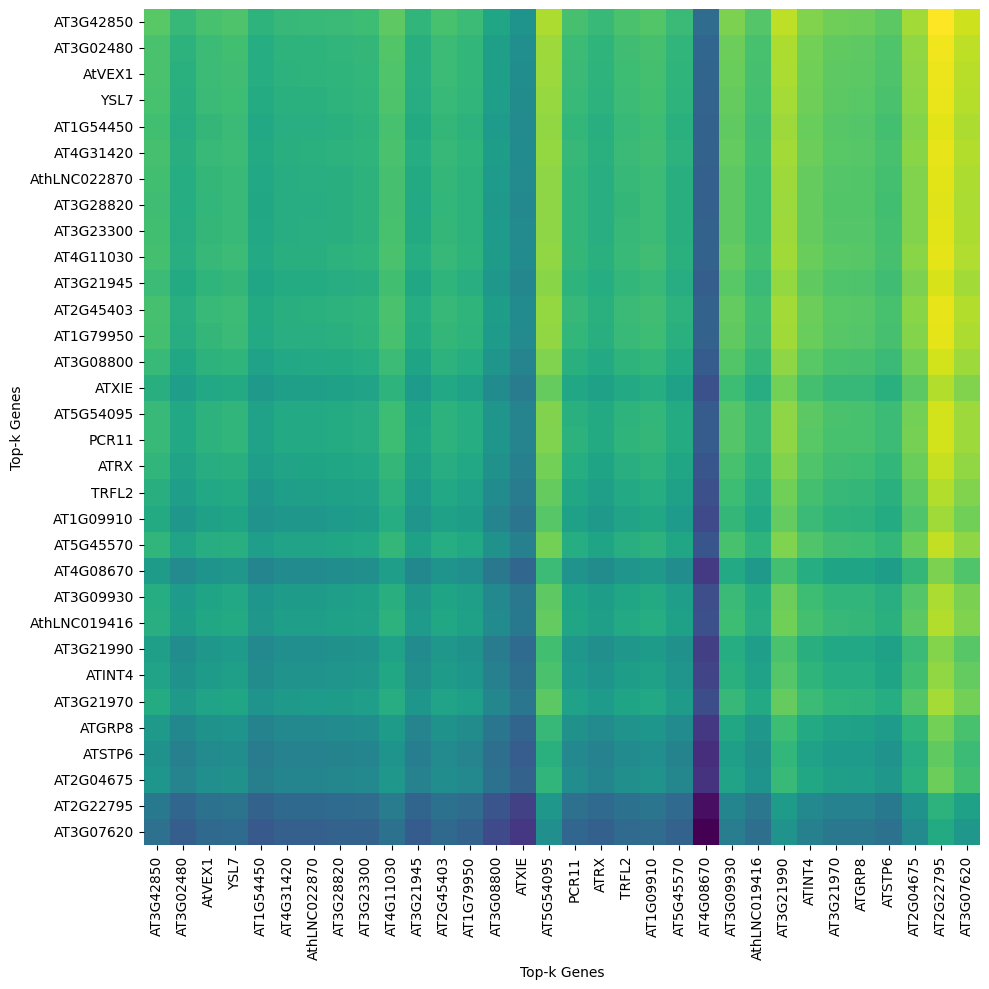

Attention scores heatmap for cell SRX20853656@@_CGGGTGTTCCAAAGGG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_late_bi_heatmap_output_SRX20853656@@_CGGGTGTTCCAAAGGG-1.pdf
['ATCG01130', 'AT4G11380', 'AT5G04110', 'AT2G07698', 'AT4G28000', 'AT4G20260', 'AT3G20865', 'AT1G25098', 'AT4G39260', 'AT2G21660', 'AT5G60800', 'AT2G26610', 'AT4G36520', 'AthLNC022670', 'AT4G26640', 'AT3G02480', 'AT1G50310', 'AT2G34300', 'AT1G19890', 'AT4G04450', 'AT3G28980', 'ATCG00020', 'AT3G62200', 'AT2G16586', 'AT1G04080', 'AthLNC010982', 'AT2G29880', 'AT1G12080', 'AT2G39705', 'AT4G34060', 'AT1G69750', 'AT5G07530']


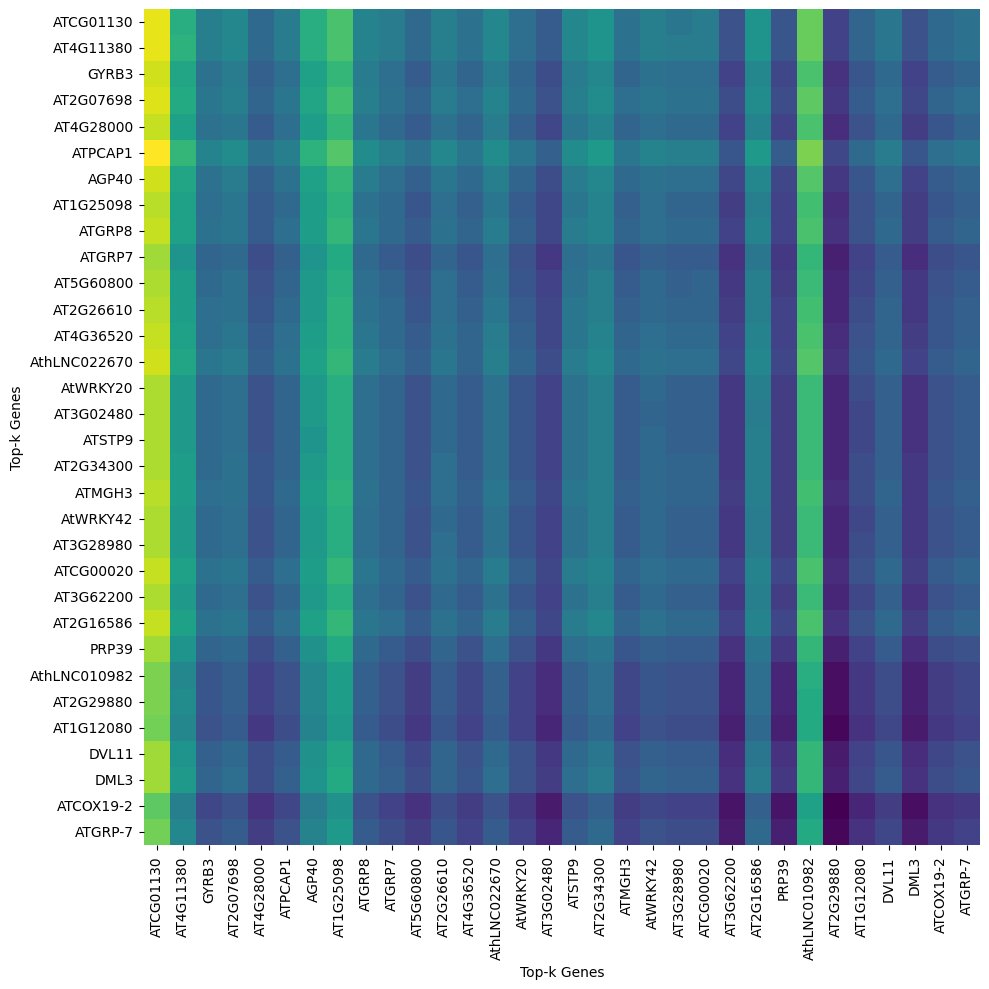

Attention scores heatmap for cell SRX20853656@@_GATTCTTCACACCGAC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_GATTCTTCACACCGAC-1.pdf
['AT2G05642', 'AT2G29880', 'AT4G26640', 'AT5G54095', 'AT1G73860', 'AthLNC024348', 'AT1G54450', 'AthLNC005935', 'AthLNC022870', 'AT4G14315', 'ATCG00170', 'AT4G09644', 'AT3G21945', 'AT4G11030', 'AT3G15280', 'AT5G50830', 'AT4G22590', 'AT2G39420', 'AT1G79950', 'AT3G61160', 'AT1G12840', 'AT4G33270', 'AT4G35010', 'AT2G40850', 'AT2G24650', 'AT5G53460', 'AT1G08600', 'AT4G16480', 'AT3G42640', 'AT3G52920', 'AT5G02500', 'AT2G19860']


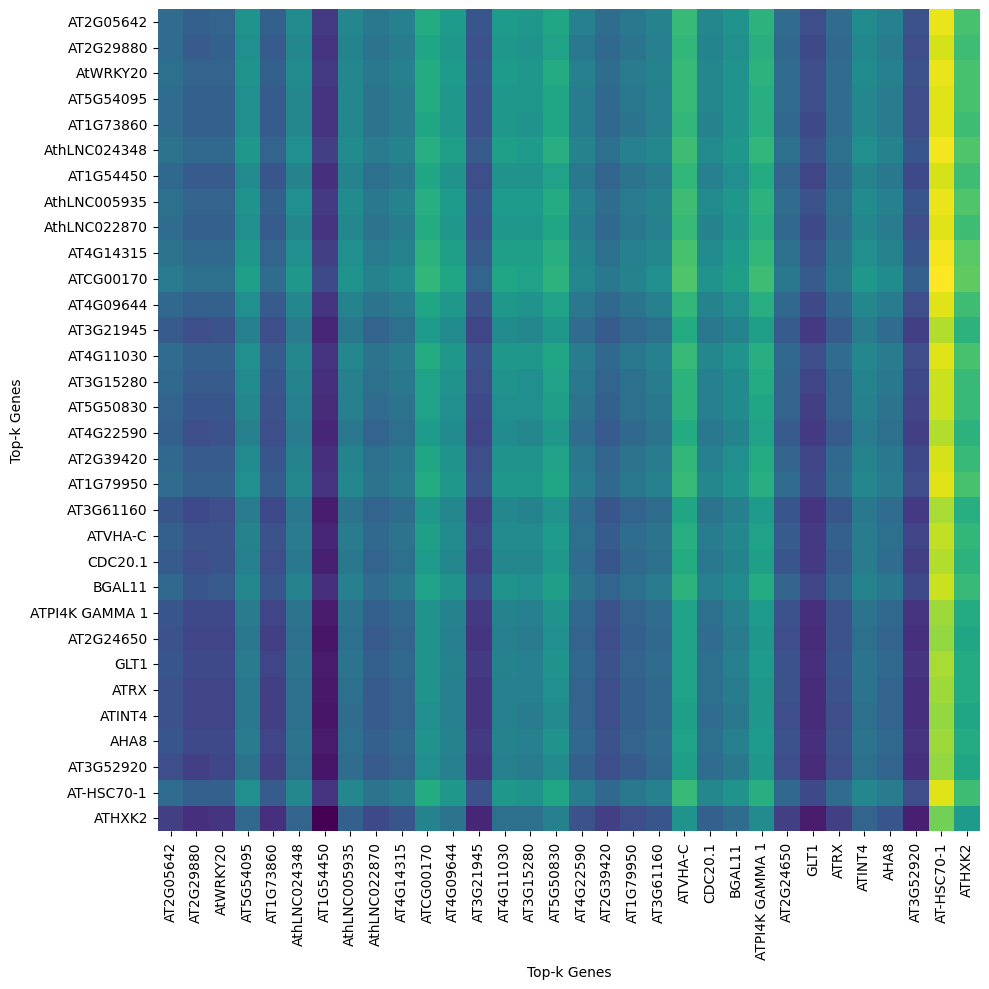

Attention scores heatmap for cell SRX20853656@@_GTTTACTCACGCGTGT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853656@@_GTTTACTCACGCGTGT-1.pdf
['AT3G42850', 'AT2G29880', 'AT1G54450', 'AT5G02500', 'AT5G07530', 'AT5G53460', 'AT1G04080', 'AT5G49900', 'AthLNC012426', 'AT1G08600', 'AT4G11030', 'AthLNC005935', 'AT2G45403', 'AT3G01350', 'AT3G41762', 'AT3G05960', 'AT1G75870', 'AthLNC006105', 'AT1G07540', 'AT2G19110', 'AT1G07590', 'AT1G65730', 'AT4G37280', 'AT1G54560', 'AT4G22070', 'AT1G72330', 'AT5G54095', 'AT4G16480', 'AT3G09930', 'AT1G78980', 'AthLNC016367', 'AT4G26260']


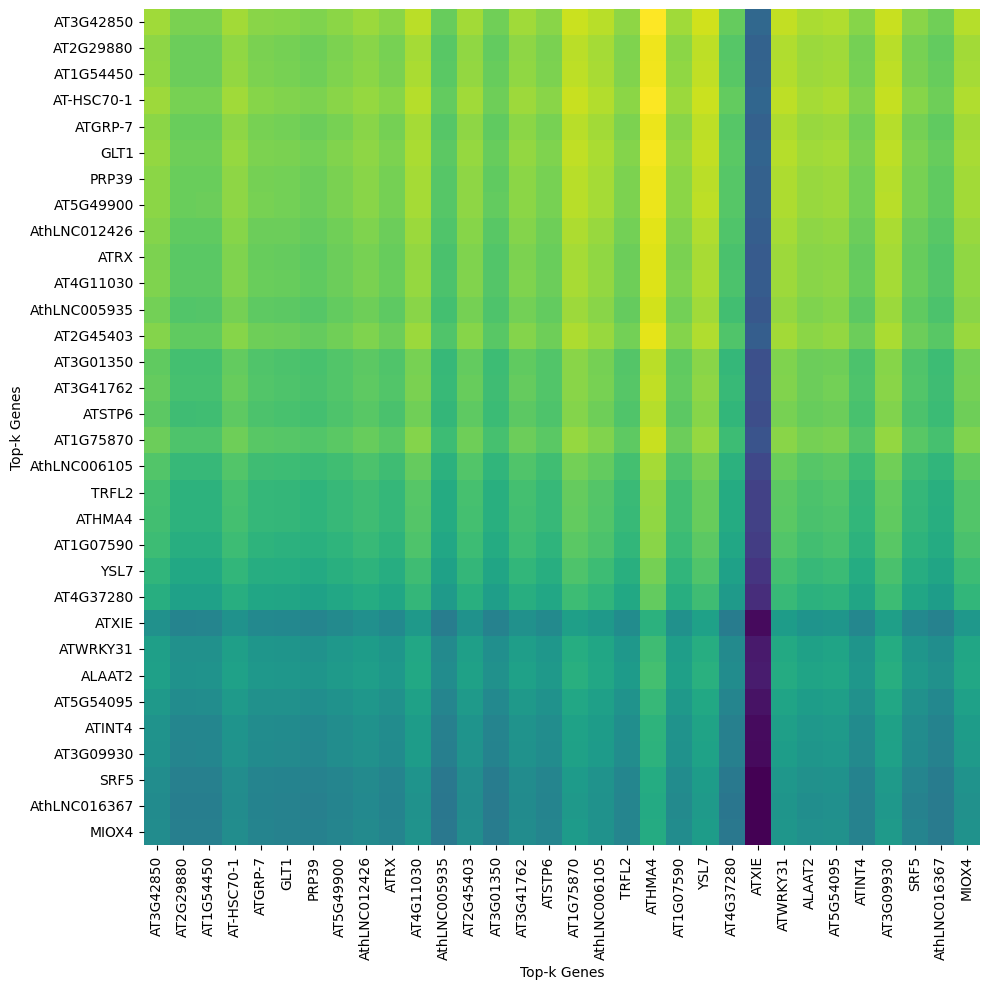

Attention scores heatmap for cell SRX20853656@@_ACGTAACCATCACCAA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_late_bi_heatmap_output_SRX20853656@@_ACGTAACCATCACCAA-1.pdf
['AT4G36600', 'AT5G62850', 'AT2G45405', 'AT5G07550', 'AT5G13940', 'AT1G09910', 'AT1G75870', 'AT5G54095', 'AT5G45570', 'AthLNC012426', 'AthLNC005935', 'AT3G01350', 'AT4G16480', 'AT1G08730', 'AT4G11543', 'AT5G20290', 'AT1G54450', 'AT1G71770', 'AT3G21990', 'AT4G22070', 'AT3G09930', 'AT5G61690', 'AT3G17630', 'AT4G09644', 'AT3G07620', 'AT5G16630', 'AT1G72330', 'AT1G05580', 'AT3G08790', 'AT3G21933', 'AT1G24520', 'AT1G54560']


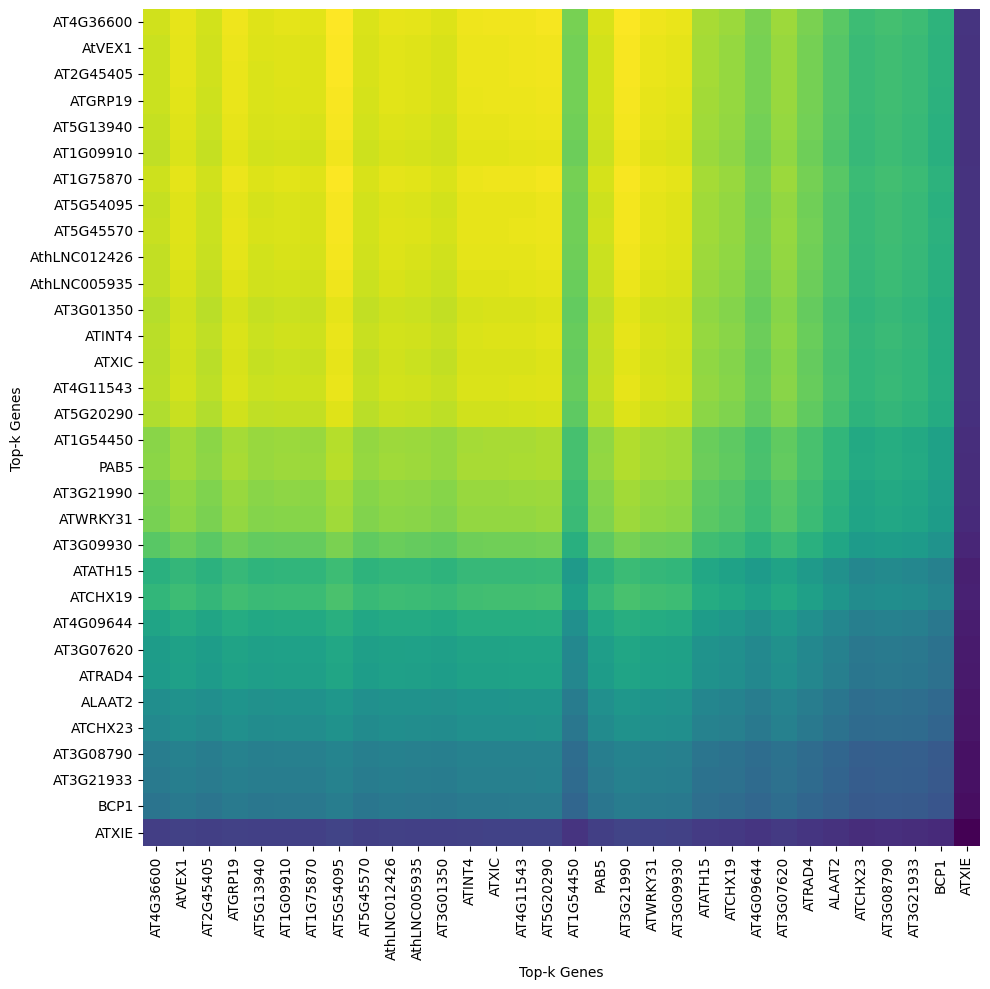

Attention scores heatmap for cell SRX20853656@@_GCATTAGAGACTTAAG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_late_bi_heatmap_output_SRX20853656@@_GCATTAGAGACTTAAG-1.pdf
['AT2G36660', 'AT4G14780', 'AT2G06040', 'AT2G26610', 'AT1G77410', 'AT4G04980', 'AT2G19860', 'AT4G31420', 'AT5G04110', 'AT1G69940', 'AT1G12640', 'AT2G30630', 'AT1G25098', 'AT3G16380', 'AT2G36390', 'AT5G27870', 'AT1G12840', 'AT4G39260', 'AT1G52300', 'AT1G60200', 'AT5G18620', 'AT4G13230', 'AT5G49900', 'AT5G60800', 'AT4G39230', 'AT3G19090', 'AT5G53820', 'AT5G59480', 'AT3G28770', 'AT2G16586', 'AT4G28000', 'AT1G22760']


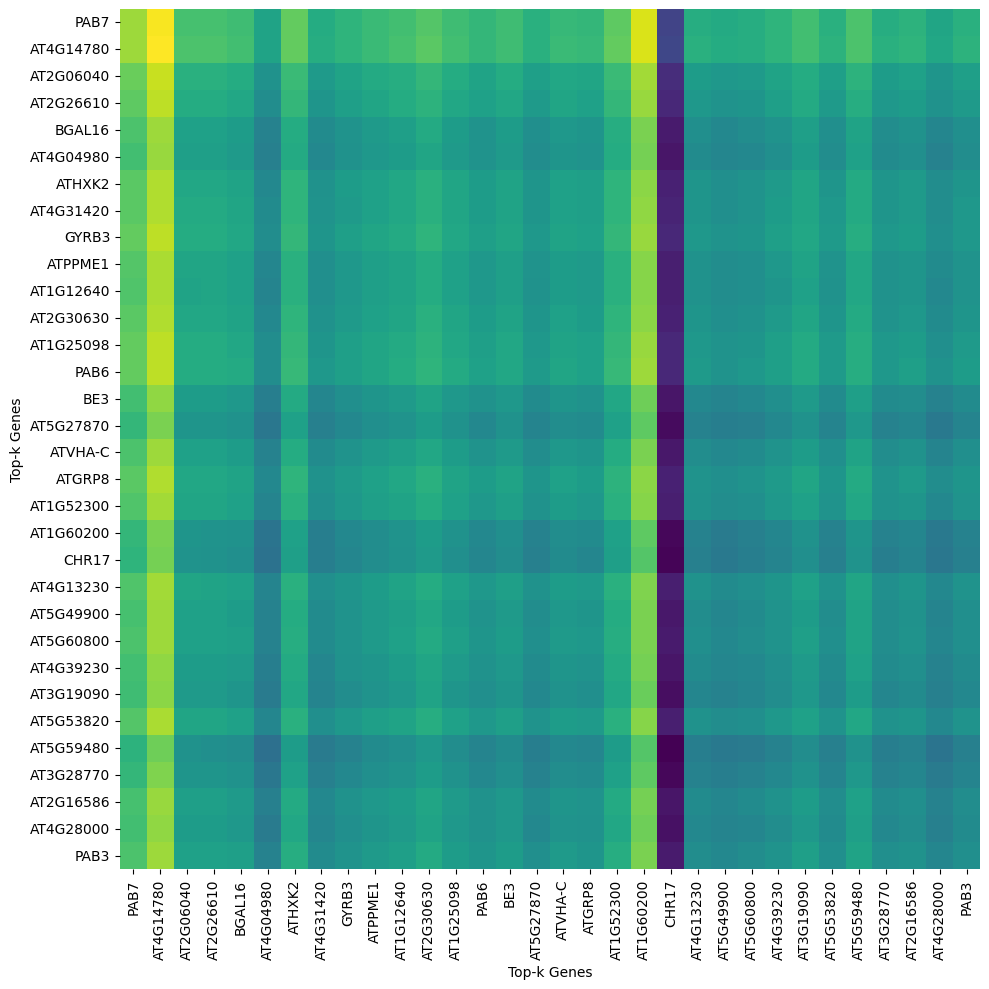

Attention scores heatmap for cell SRX20853656@@_TGTCCCACATGAGGGT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_TGTCCCACATGAGGGT-1.pdf
['AT4G26630', 'AT1G04020', 'AT4G34060', 'AT4G36860', 'ATCG00040', 'AT2G34300', 'AT3G14040', 'AT3G21945', 'AT3G42850', 'AthLNC022870', 'AT3G20865', 'AT2G45405', 'AT3G58390', 'AT5G53820', 'AT2G26610', 'AT3G47440', 'AT4G26190', 'AT1G79950', 'AT3G28980', 'ATCG01130', 'AT1G68610', 'AT3G24640', 'AT1G31990', 'ATCG00470', 'AT4G11380', 'AT1G75870', 'AT5G06278', 'ATCG00490', 'AT5G61700', 'AT4G11030', 'AT5G48600', 'AT2G30570']


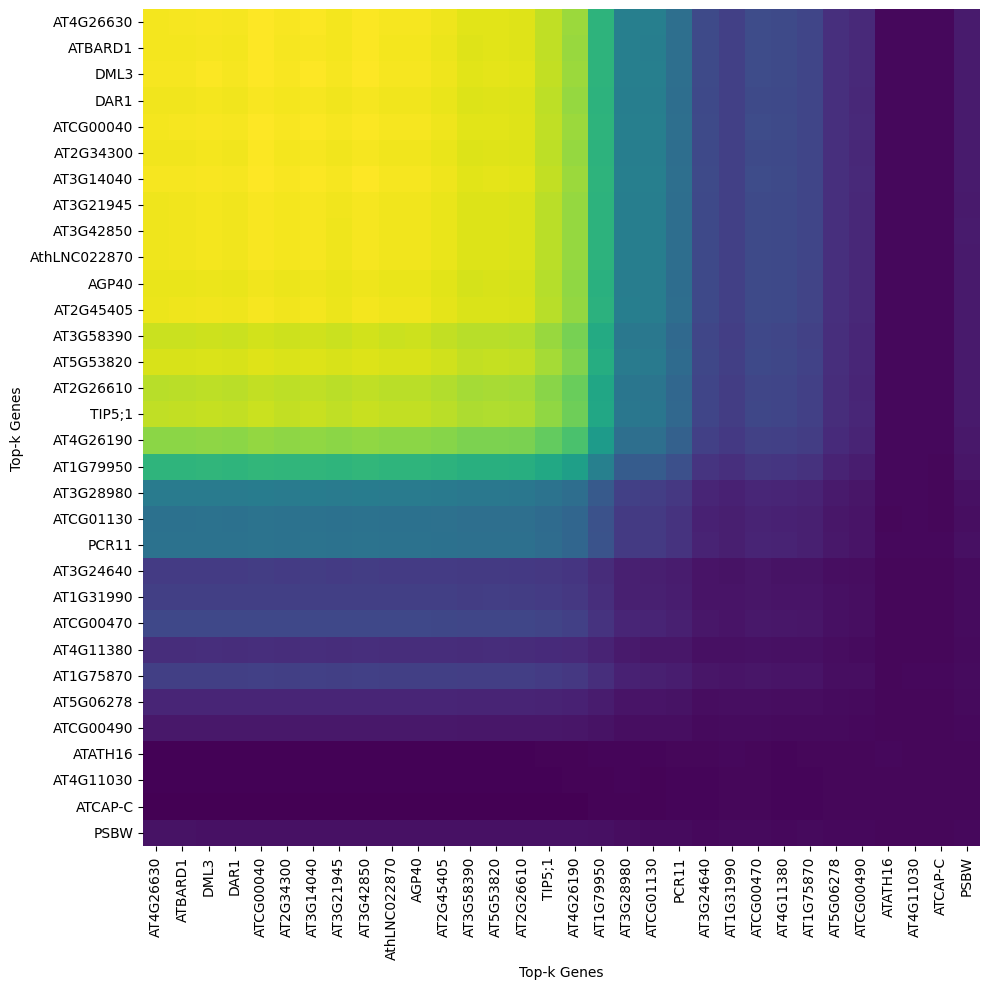

Attention scores heatmap for cell SRX20853656@@_CGATGCGCAGGACGAT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_CGATGCGCAGGACGAT-1.pdf
['AT3G42850', 'AT4G26640', 'AT1G61340', 'AT5G53460', 'AT5G07410', 'AT2G07698', 'AT2G29880', 'AT3G14040', 'AT2G34300', 'ATCG00020', 'AT4G28000', 'AT4G34060', 'AT4G05710', 'AT1G04080', 'AT3G07675', 'AT3G20865', 'AT5G66020', 'AT3G28830', 'AT3G18770', 'AT2G32240', 'AT2G39705', 'AT4G22590', 'AT1G34095', 'AT3G28980', 'ATCG00170', 'AT1G69750', 'AT1G52300', 'AT5G59810', 'AT4G39260', 'ATCG00470', 'AthLNC013298', 'AT2G45405']


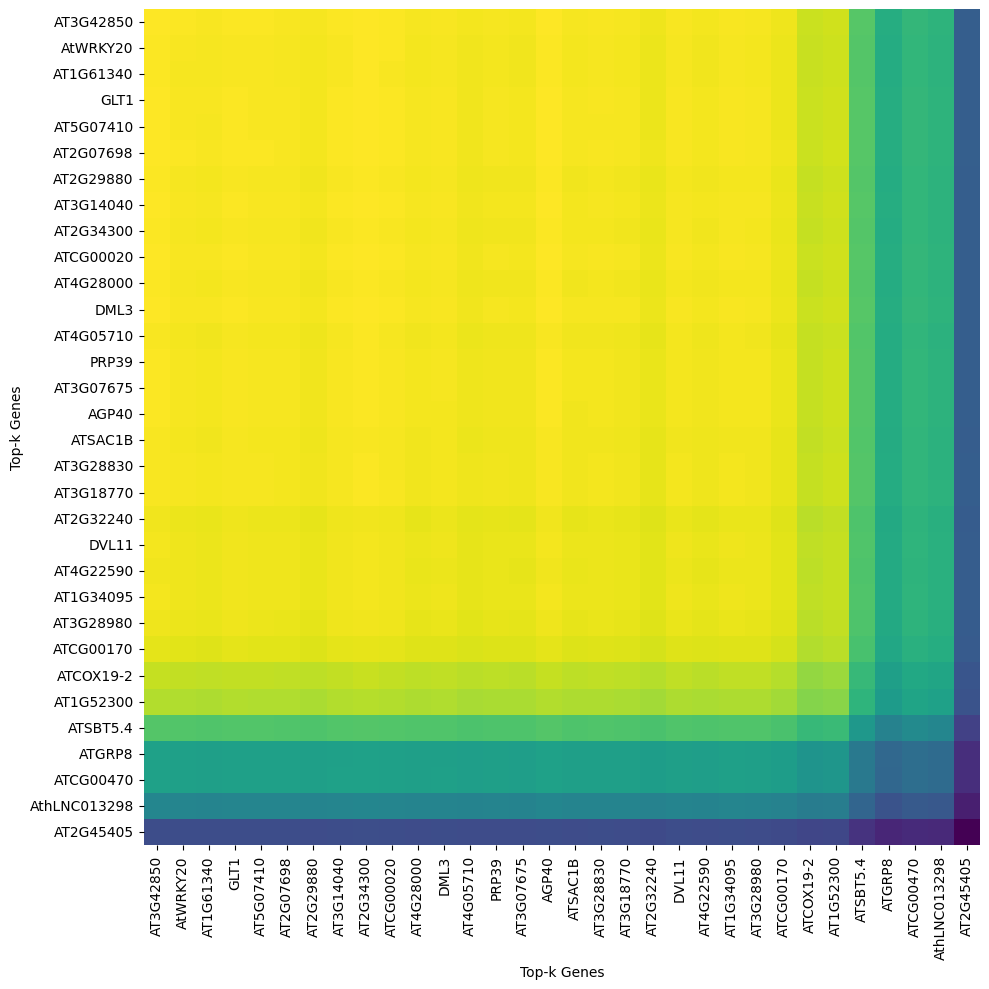

Attention scores heatmap for cell SRX20853656@@_CGTGTCTGTCCACTTC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_CGTGTCTGTCCACTTC-1.pdf
['AT3G42850', 'AT5G39870', 'ATCG00040', 'AT3G02480', 'AT1G48470', 'AT2G07698', 'AT3G30720', 'AT5G38760', 'ATCG00170', 'AT3G14040', 'AT4G25950', 'ATCG01130', 'AT4G39670', 'AT4G11760', 'AT4G39230', 'AT3G28820', 'AT1G04080', 'ATCG00470', 'AT5G66020', 'ATCG00800', 'AT5G53820', 'ATCG00490', 'AT5G23160', 'AT4G39260', 'AT5G20710', 'AT5G04110', 'AT5G05130', 'AT1G25098', 'AT3G21945', 'AT1G26840', 'AT4G22590', 'AT5G17920']


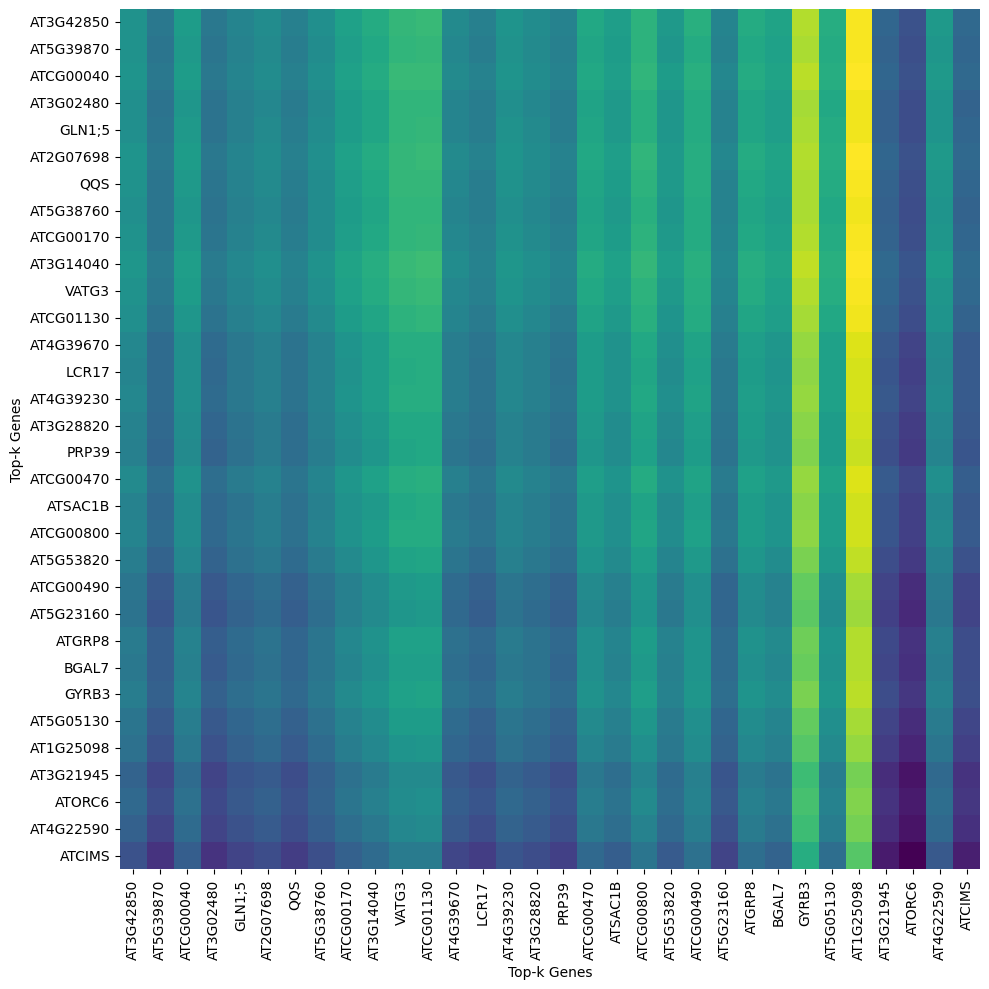

Attention scores heatmap for cell SRX20853658@@_TTGAACGAGTTTCTTC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853658@@_TTGAACGAGTTTCTTC-1.pdf
['AT1G48470', 'AT4G39260', 'AT4G38590', 'AT2G21660', 'AT5G53460', 'ATCG00490', 'AT3G20865', 'AT2G06983', 'AT4G08670', 'AT2G16586', 'AT3G02480', 'AT3G23530', 'AT5G54095', 'AT4G26640', 'AT1G61340', 'AT3G28830', 'AT5G59810', 'AT5G12960', 'AT4G31420', 'AthLNC005935', 'AT4G34060', 'AT2G34300', 'AT3G01270', 'AT1G05580', 'AT4G05710', 'AT3G28980', 'AT1G54560', 'AT3G18770', 'AT3G07675', 'AT4G33270', 'AT5G53510', 'AthLNC012937']


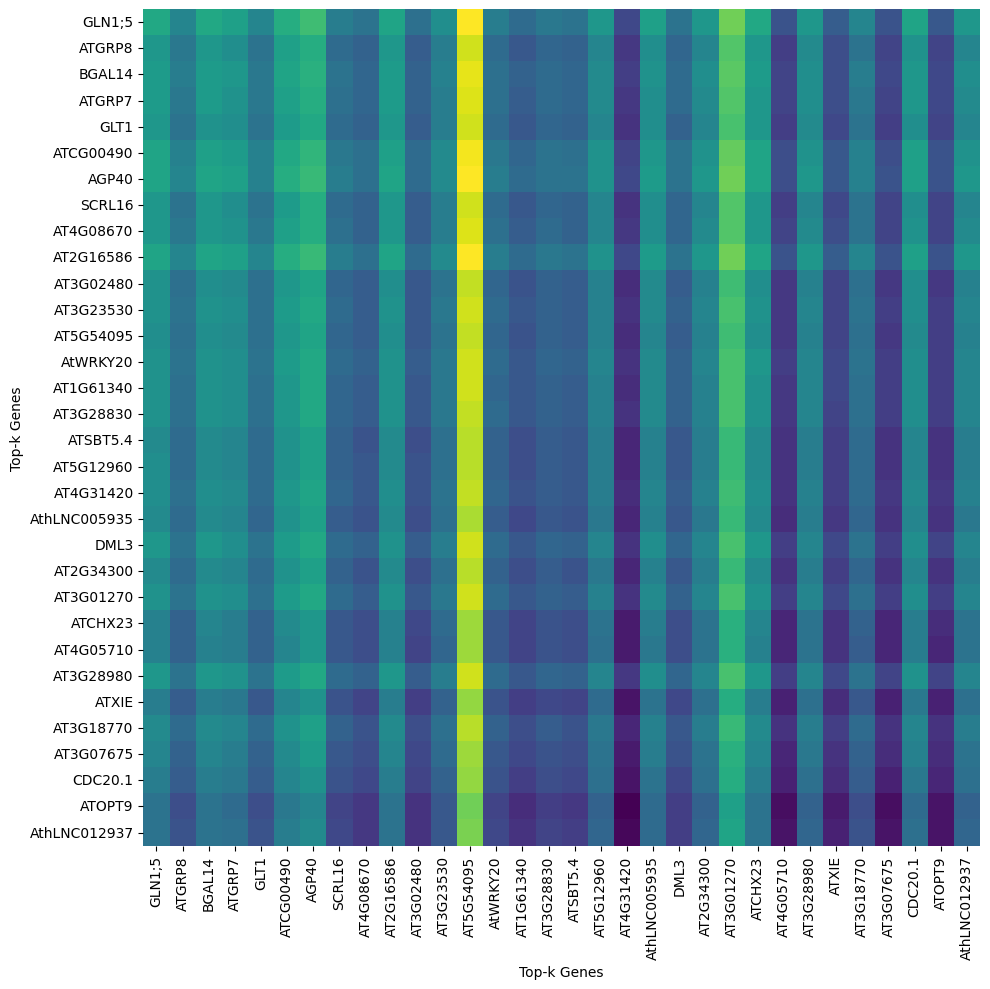

Attention scores heatmap for cell SRX20853656@@_CATCGGGGTAGAGACC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_CATCGGGGTAGAGACC-1.pdf
['AT1G01040', 'AT4G08580', 'AT5G53440', 'AT3G23810', 'AT4G18920', 'AT3G25495', 'AT2G39300', 'AT1G80930', 'AT4G28000', 'AT1G05580', 'AT4G26630', 'AT4G26640', 'AT5G55930', 'AT3G23530', 'AT5G54095', 'AT3G54800', 'AT1G54450', 'AT5G53510', 'AT4G39670', 'AT4G35010', 'AT4G11030', 'AT5G12960', 'AT1G48740', 'AT3G15280', 'AT5G50830', 'AT2G45403', 'AT3G42640', 'AT5G53460', 'AT5G18620', 'AT1G25470', 'AT1G72330', 'AT2G37190']


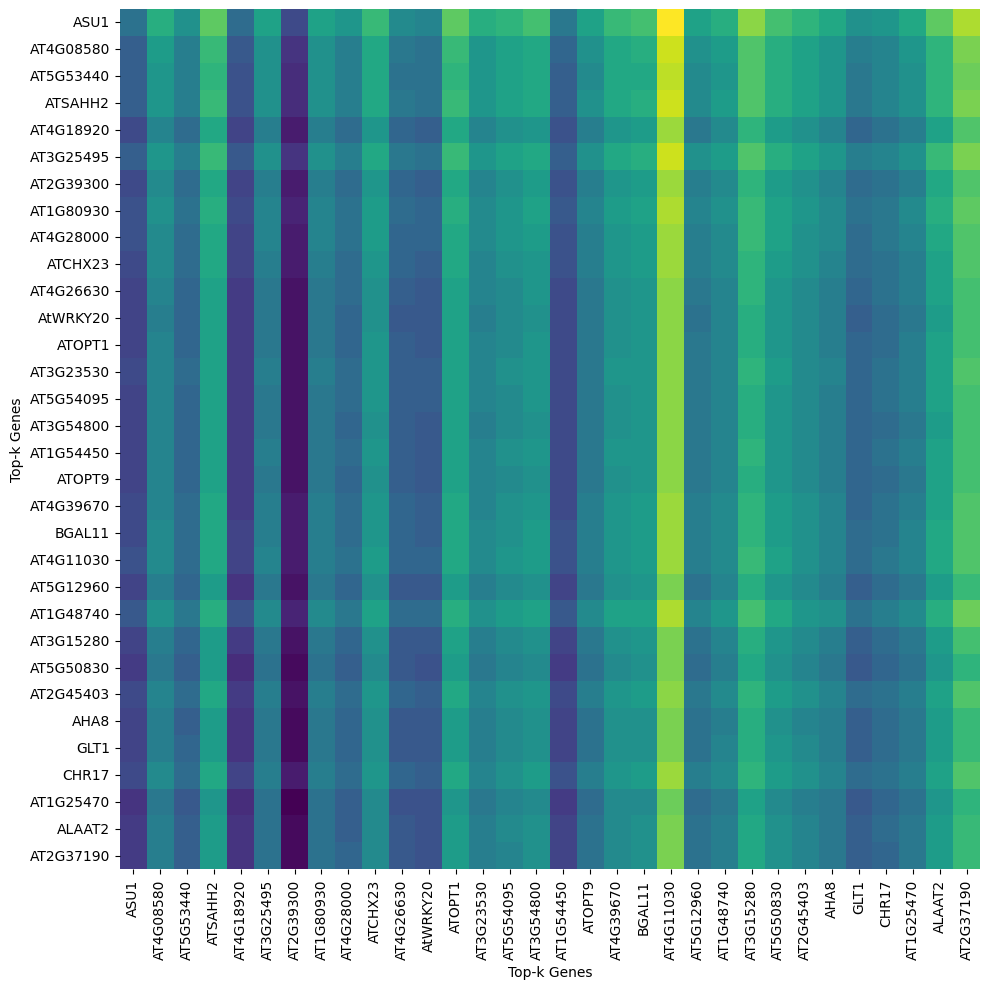

Attention scores heatmap for cell SRX20853658@@_CAGCACGTCTCGAACA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853658@@_CAGCACGTCTCGAACA-1.pdf
['AT5G49150', 'AT5G59690', 'AT2G36660', 'AT4G18920', 'AT2G22795', 'AT4G08590', 'AT5G62850', 'AT1G61566', 'AT4G11540', 'AT3G20865', 'AT1G79245', 'AT4G14780', 'AT1G77940', 'AT5G05510', 'AT2G22600', 'AT1G19310', 'AT1G79950', 'AT4G31420', 'AT1G76110', 'AT4G09644', 'AT3G04620', 'AT5G04990', 'AT5G59480', 'AT1G75950', 'AT5G49850', 'AT4G20260', 'AT3G27930', 'AT3G07030', 'AT1G64610', 'AT1G65040', 'AT5G66230', 'AT5G04110']


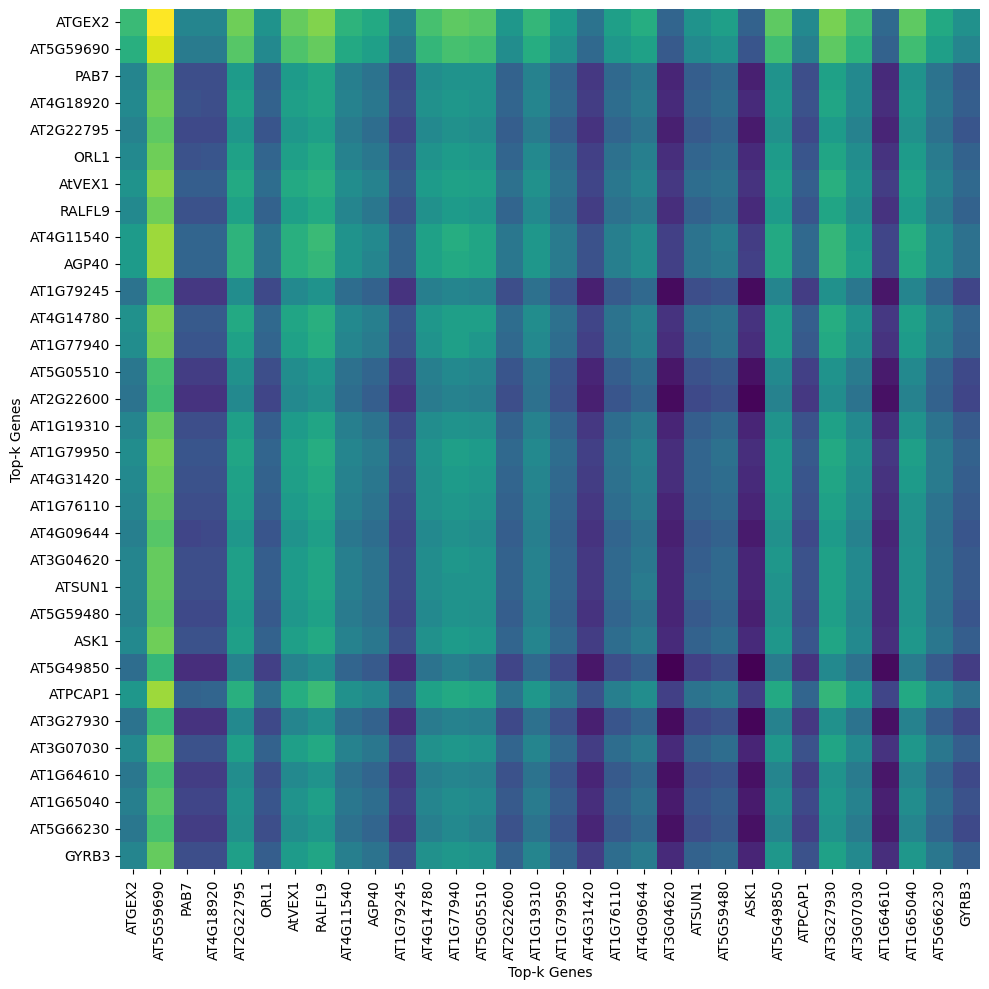

Attention scores heatmap for cell SRX20853658@@_AGGGTCCAGGTCGAGT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_AGGGTCCAGGTCGAGT-1.pdf
['AT4G14780', 'AT3G20865', 'AT3G09390', 'AT2G35680', 'AT3G58160', 'AT1G64090', 'AT2G36660', 'AT1G54240', 'AT1G69940', 'AT1G15200', 'AT3G25495', 'AT4G06748', 'AT5G20710', 'AT5G41780', 'AT5G38760', 'AT4G28000', 'AT1G11650', 'AT5G04110', 'AT4G08630', 'AT3G04620', 'AT1G76110', 'AT3G53350', 'AT2G37470', 'AT1G65370', 'AT2G06040', 'AT1G52300', 'AT2G19860', 'AT3G28790', 'AT1G67430', 'AT3G19090', 'AT1G19310', 'AT1G75950']


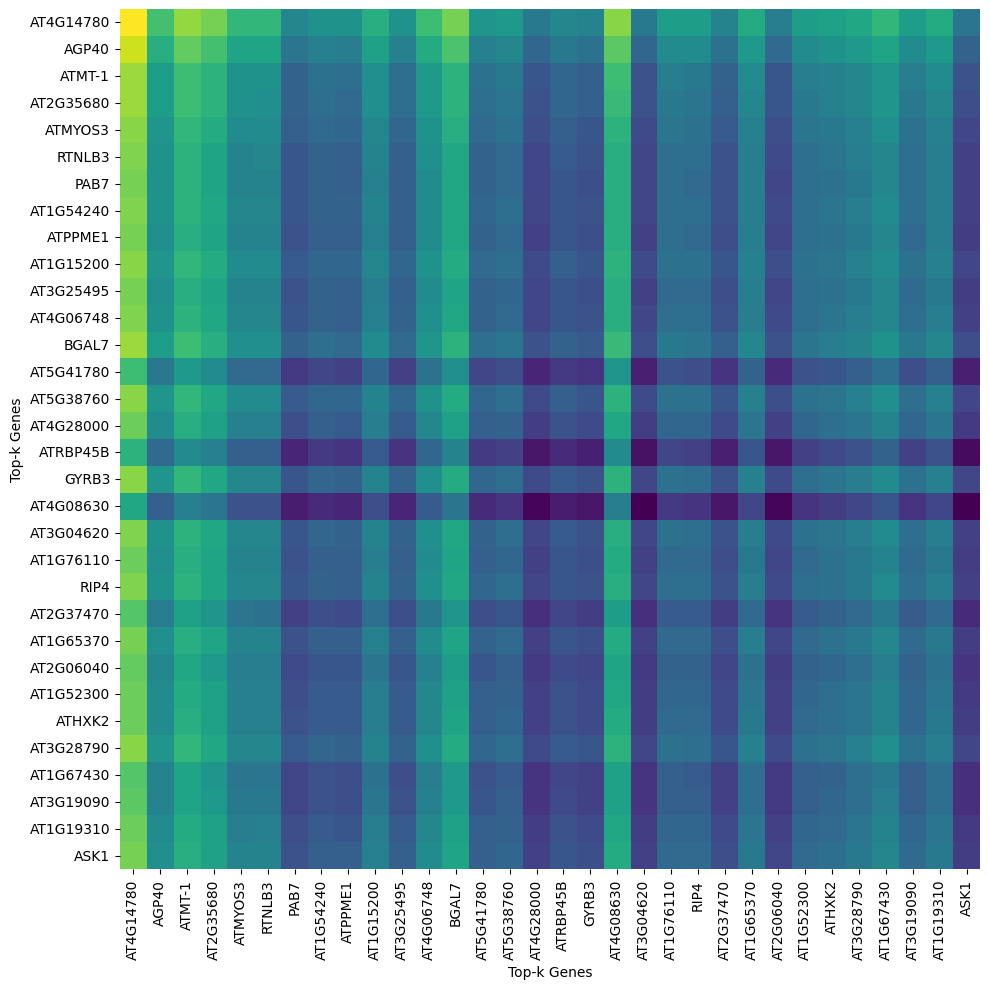

Attention scores heatmap for cell SRX20853658@@_CGTTCTGAGGACTATA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_CGTTCTGAGGACTATA-1.pdf
['AT3G23810', 'AT5G32569', 'AT4G26630', 'AT4G08580', 'AT3G25495', 'AT4G11030', 'AT5G48545', 'AT5G54095', 'AT1G80930', 'AT4G31840', 'AT2G05642', 'AT2G07698', 'AT1G54450', 'AT5G49900', 'AT4G35010', 'AT2G37190', 'AthLNC024348', 'AT5G18620', 'AT1G29010', 'AT1G52680', 'AT2G19860', 'AT3G54800', 'AT1G76010', 'AT4G26260', 'AT5G21105', 'AT4G22590', 'AT1G25470', 'AT5G58160', 'AT1G08600', 'AT2G24650', 'AT5G53460', 'AthLNC012426']


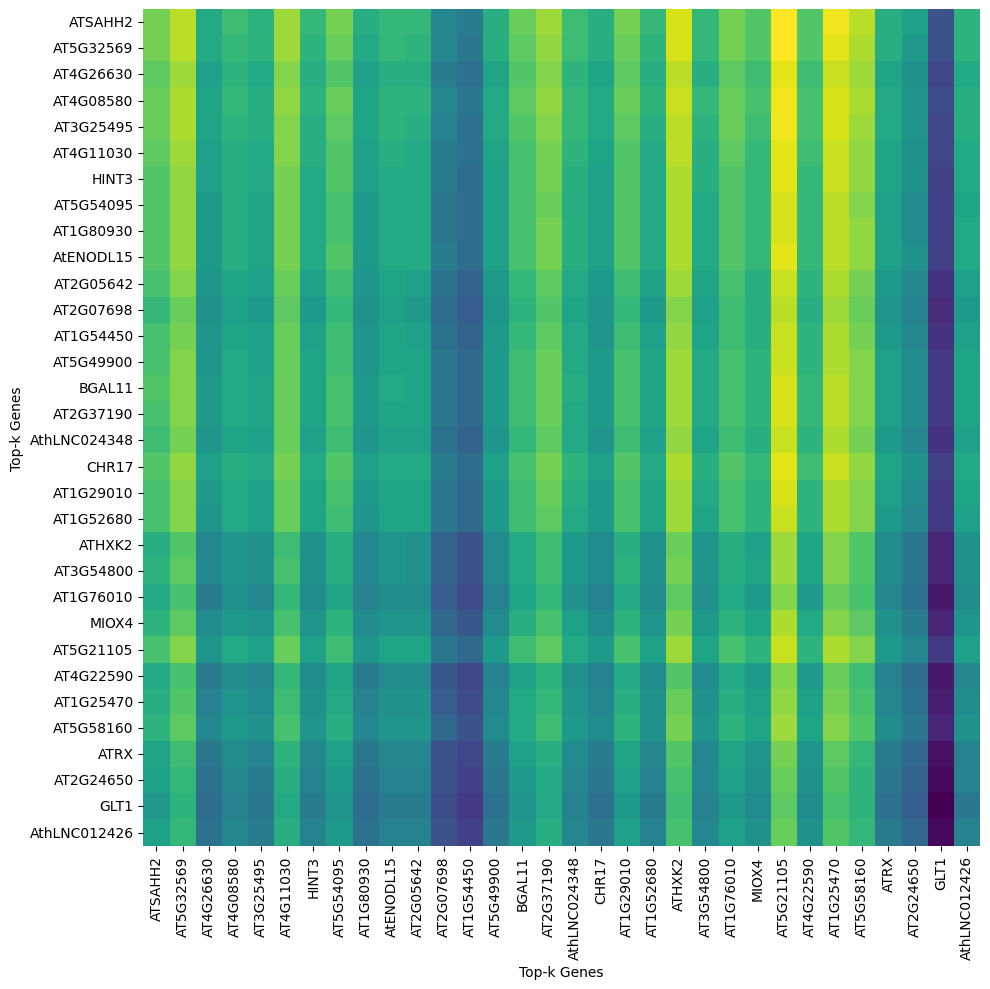

Attention scores heatmap for cell SRX20853658@@_GATTCTTCAGCATCTA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853658@@_GATTCTTCAGCATCTA-1.pdf
['AT5G61120', 'AT1G48470', 'AT1G25098', 'AT5G03620', 'AT1G30670', 'AT2G47730', 'AT4G38590', 'AT4G26630', 'AT5G59690', 'AT5G04110', 'AT2G21660', 'AT4G36600', 'AthLNC022670', 'AT3G23810', 'AT3G54000', 'AT3G23530', 'AT4G04450', 'AT5G55180', 'ATCG00020', 'AT1G54450', 'AT4G08670', 'AT3G02480', 'AT4G26640', 'AT1G61340', 'AT5G53460', 'AT2G07698', 'AT4G34060', 'AT4G13960', 'AT2G29880', 'AT3G28830', 'AT5G07410', 'AT1G79245']


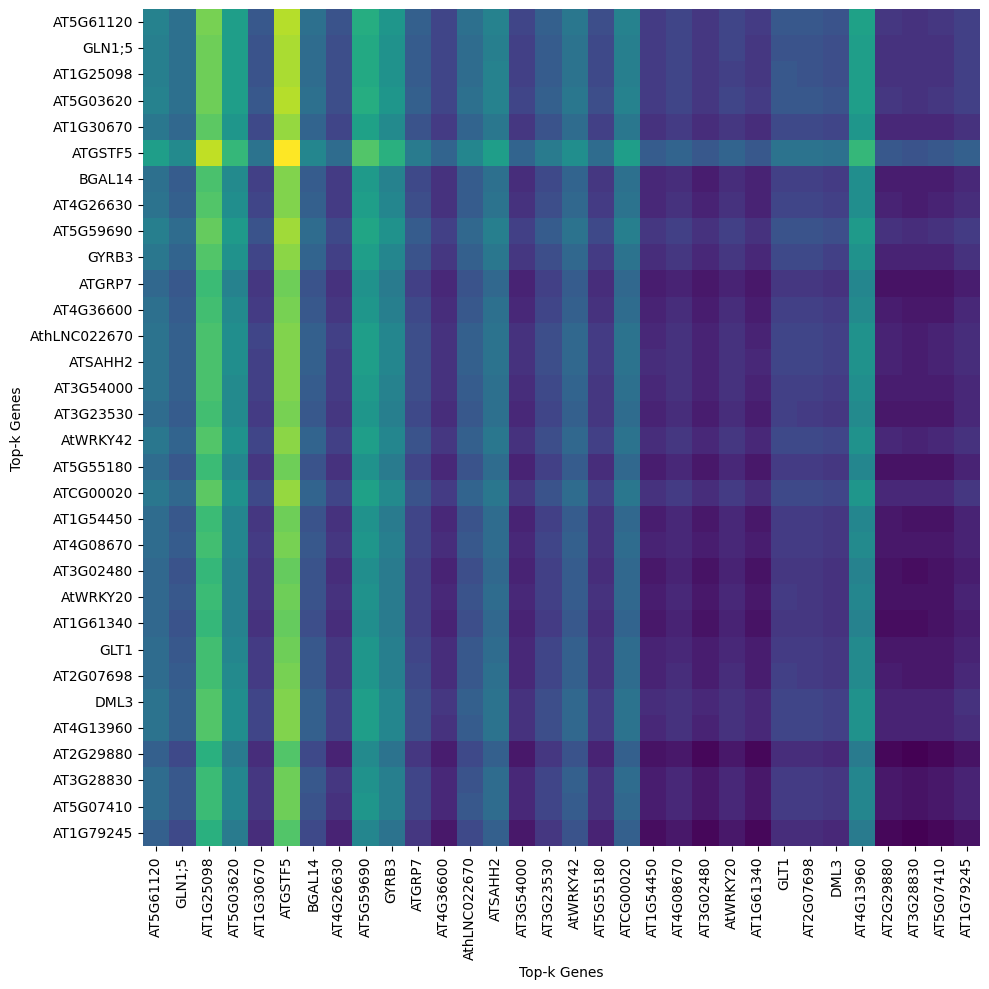

Attention scores heatmap for cell SRX20853656@@_GTAGGTTTCCATACTT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853656@@_GTAGGTTTCCATACTT-1.pdf
['AT3G02480', 'AT4G36600', 'AT5G62850', 'AthLNC005935', 'AT1G15430', 'AT3G21945', 'AT3G23300', 'AT2G05642', 'AT1G79950', 'AT1G54450', 'AT1G77210', 'AT4G11030', 'AT4G22590', 'AT5G18620', 'AT5G53460', 'AT5G13940', 'AT5G10950', 'AT3G01350', 'AT3G28820', 'AT1G65730', 'AT3G53350', 'AT1G54560', 'AT5G54095', 'AT1G05580', 'AT2G04675', 'AT2G04880', 'AT3G21970', 'AT3G05960', 'AthLNC019416', 'AT1G07540', 'AT5G58190', 'AT3G21320']


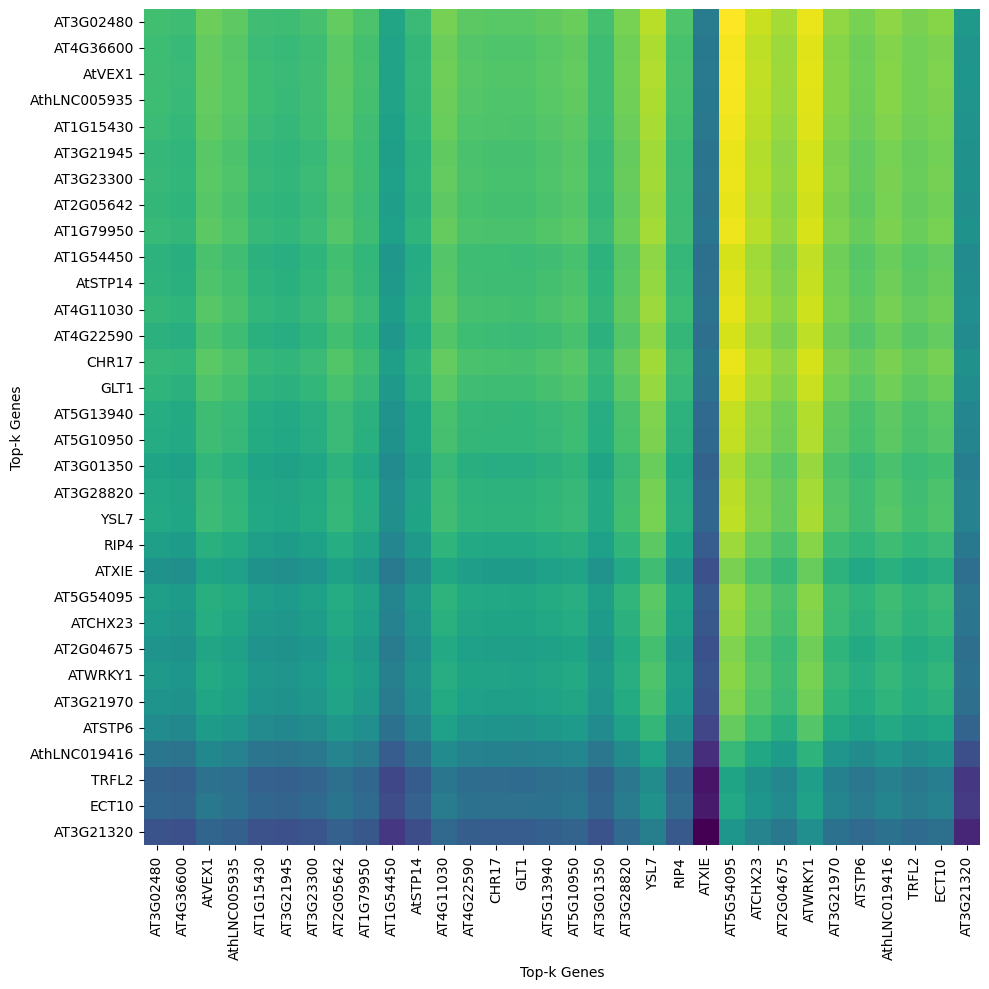

Attention scores heatmap for cell SRX20853656@@_AGTGACTAGTATGAAC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_late_bi_heatmap_output_SRX20853656@@_AGTGACTAGTATGAAC-1.pdf
['AT2G21660', 'ATCG00040', 'AT2G16586', 'AT4G20260', 'AT5G62850', 'AT5G53460', 'AT3G58290', 'AT4G28000', 'AT3G20865', 'AthLNC022670', 'ATCG00020', 'AT2G39300', 'AT3G28830', 'AT3G01270', 'AT5G07410', 'AT2G39705', 'AT1G79950', 'AT4G26640', 'AT4G34060', 'AT5G04110', 'AT1G19890', 'AT4G11380', 'AT4G11760', 'AT1G77210', 'AT1G49300', 'AT5G17500', 'AT5G53820', 'AT2G19860', 'AT1G68610', 'AthLNC005412', 'AT1G05580', 'AT5G59810']


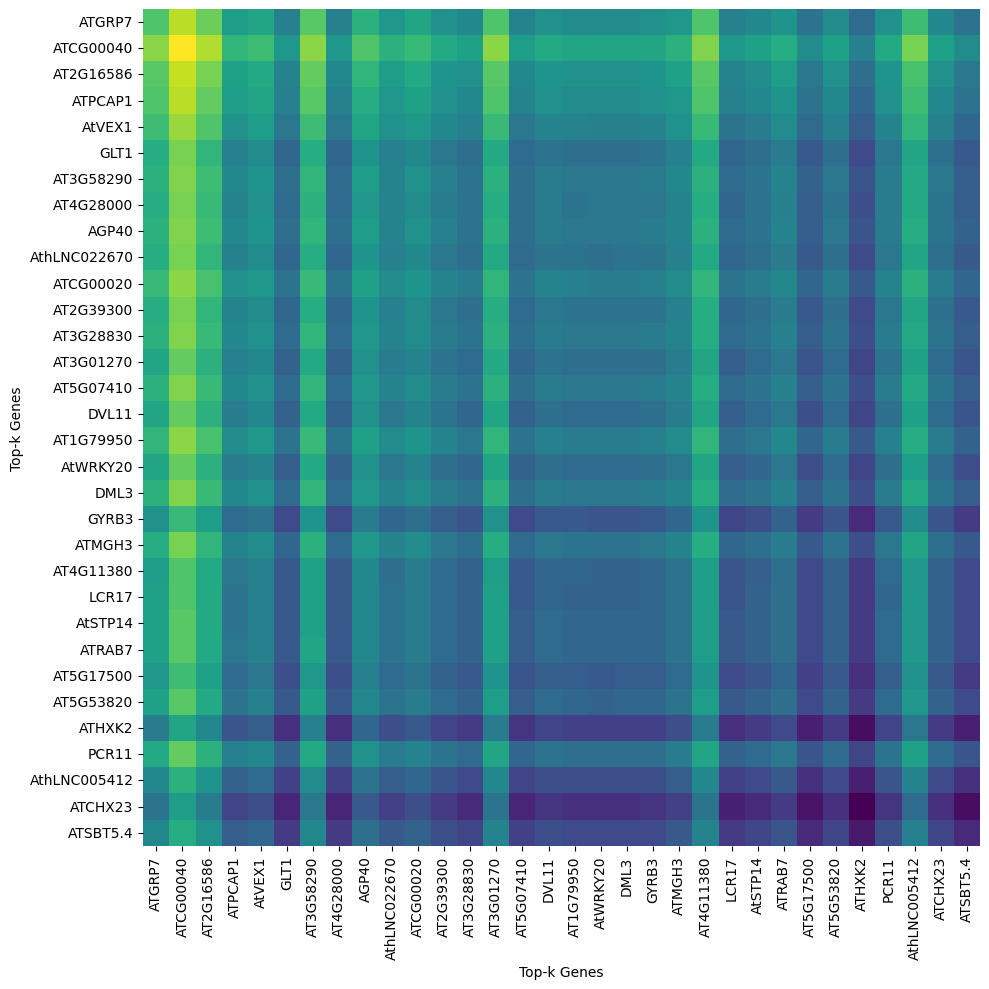

Attention scores heatmap for cell SRX20853658@@_CATGAGTTCCCTCTAG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853658@@_CATGAGTTCCCTCTAG-1.pdf
['AT2G26610', 'AT1G11650', 'AT2G36660', 'AT3G20865', 'AT5G46795', 'AT1G80660', 'AT1G54240', 'AT4G31570', 'AT5G04110', 'AT4G35670', 'AT4G13230', 'AthLNC005935', 'AT3G23810', 'AT4G30860', 'AT3G28790', 'AT5G04990', 'AT1G64610', 'AT1G07210', 'AT2G16586', 'AT1G52270', 'AT4G39260', 'AT1G48470', 'AT3G28830', 'AT2G01008', 'AT5G59810', 'AT1G20220', 'AT5G55180', 'AT3G04620', 'AT5G54095', 'AT4G38940', 'AT5G06278', 'AT4G22590']


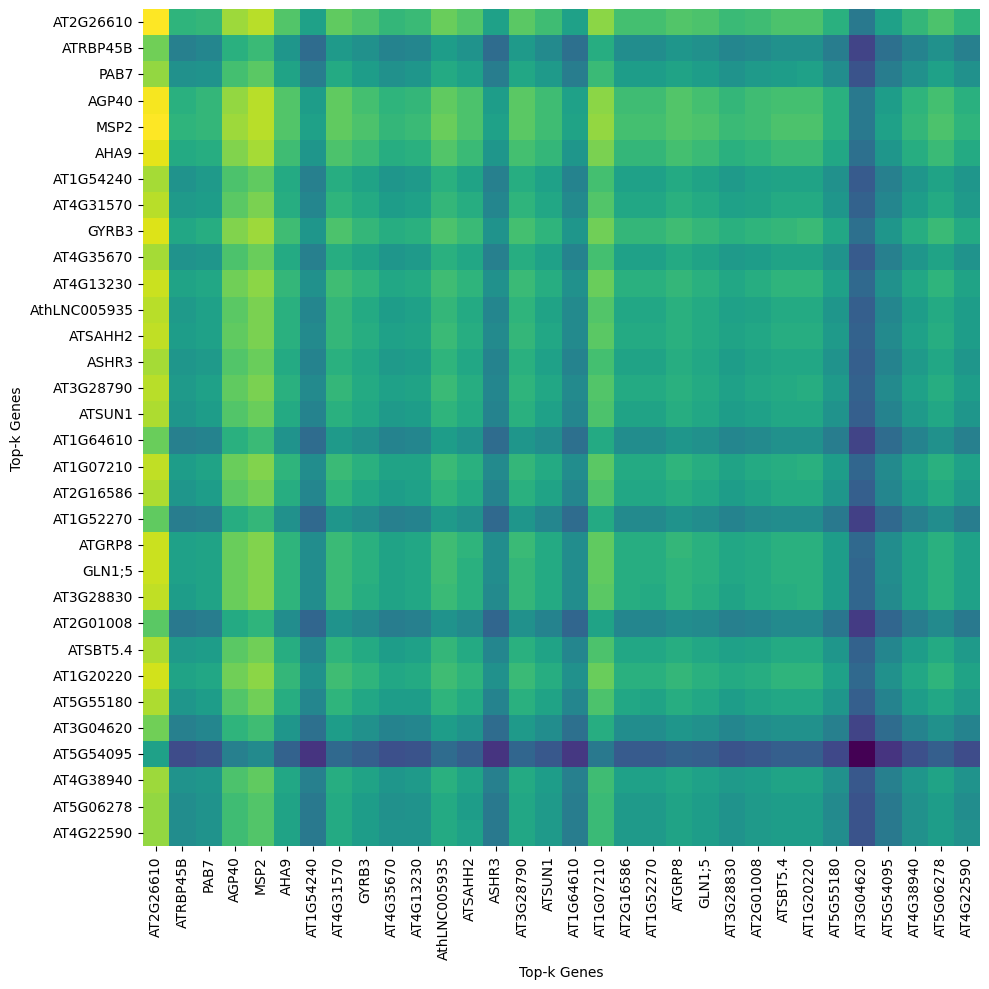

Attention scores heatmap for cell SRX20853656@@_ATGCCTCTCTAACACG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_ATGCCTCTCTAACACG-1.pdf
['ATCG01130', 'AT4G13940', 'AT5G55930', 'AT5G07410', 'AT3G03490', 'AT1G05580', 'AT3G15280', 'AT5G54095', 'AT4G04980', 'AT3G23810', 'AT4G35010', 'AT4G08580', 'AT1G80930', 'AT1G72330', 'AT3G58290', 'AT5G48545', 'AT5G12960', 'AT1G03240', 'AT2G29550', 'AT3G23530', 'AT2G34300', 'AT3G62710', 'AthLNC005412', 'AT5G41780', 'AT1G76010', 'AT3G61160', 'AT3G02480', 'AT5G50830', 'AT4G39670', 'AT4G26640', 'AT5G18620', 'AT5G02500']


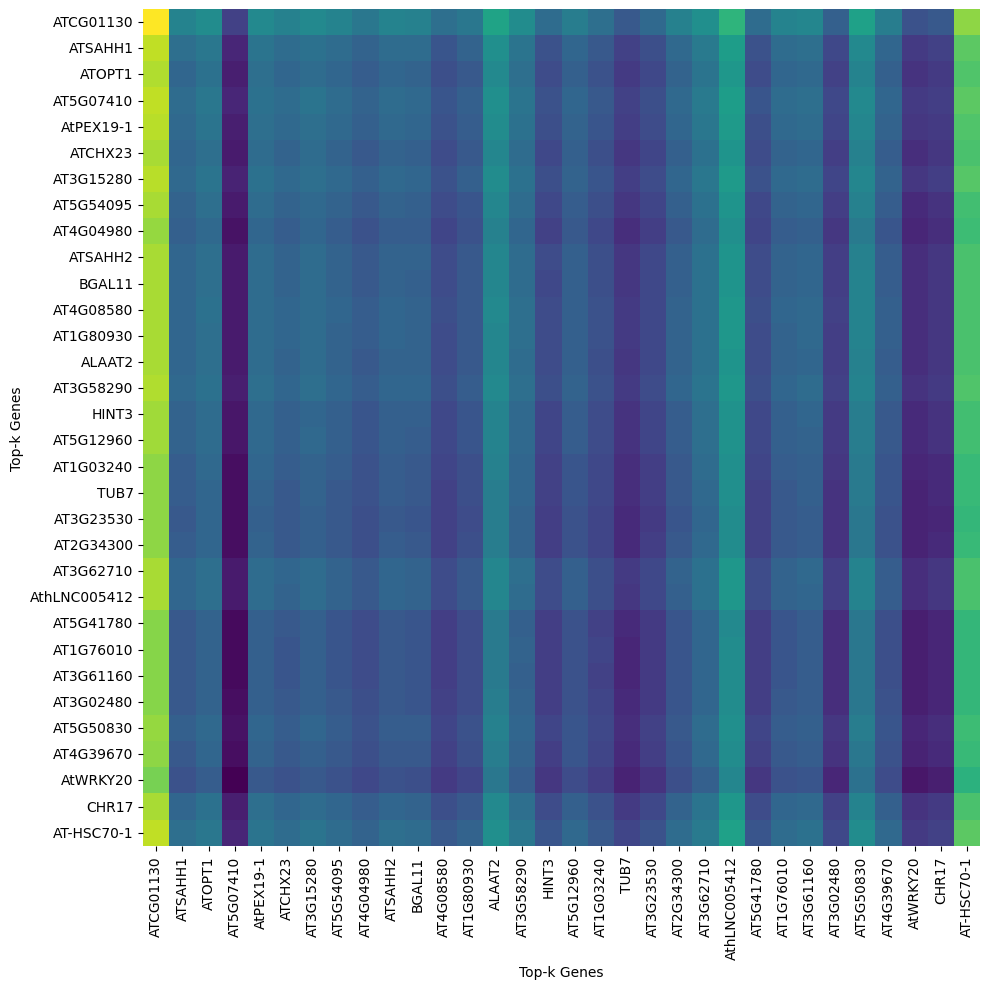

Attention scores heatmap for cell SRX20853658@@_AAACGCTTCGTGGCTG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853658@@_AAACGCTTCGTGGCTG-1.pdf
['AT1G48090', 'AT2G36660', 'AT3G09390', 'AT1G15200', 'AT3G20865', 'AT1G77410', 'AT1G77940', 'AT1G64090', 'AT5G04110', 'AT2G06040', 'AT3G58160', 'AT1G69940', 'AT1G54240', 'AT5G07550', 'AT4G31420', 'AT2G22795', 'AT3G03490', 'AT3G28790', 'AT4G11030', 'AT1G11650', 'AT3G04620', 'AT3G16380', 'AT1G52680', 'AT1G01320', 'AT4G08590', 'AT1G76110', 'AT3G28830', 'AT3G27650', 'AT1G12840', 'AT1G52300', 'AT5G59480', 'AT5G53820']


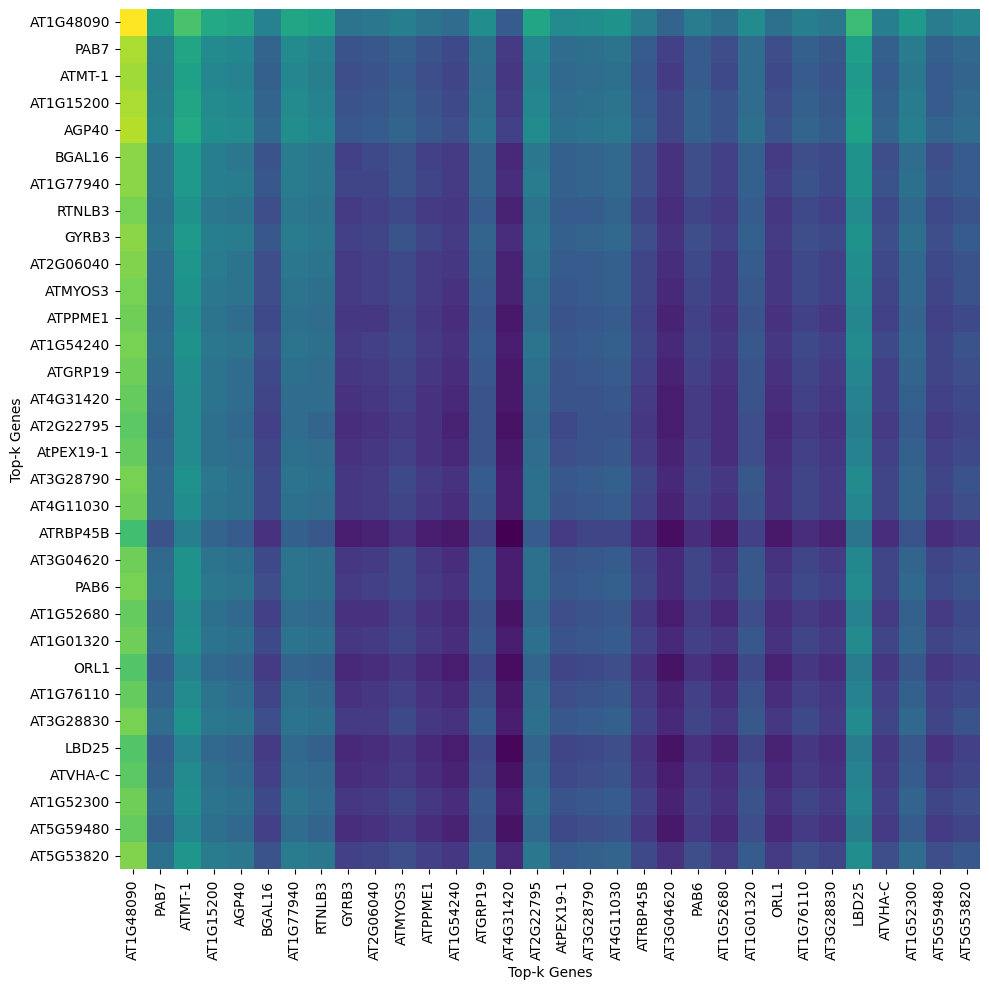

Attention scores heatmap for cell SRX20853658@@_ATAGGCTTCGGCATAT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_ATAGGCTTCGGCATAT-1.pdf
['AT2G36660', 'AT1G34340', 'AT2G26610', 'AT5G20290', 'AT4G18920', 'AT5G46795', 'AT1G25098', 'AT5G04110', 'AT3G28790', 'AT5G49160', 'AT1G54240', 'AT4G11030', 'AT1G52300', 'AT5G59480', 'AT3G20865', 'AT1G52270', 'AT2G16586', 'AT2G07698', 'AthLNC005935', 'AT4G02060', 'AT1G20920', 'AT4G14310', 'ATCG01130', 'AT3G28830', 'AT1G15800', 'AT4G33270', 'AT1G24520', 'AT3G04620', 'AT3G14040', 'AT2G31270', 'AT4G22590', 'AT2G27880']


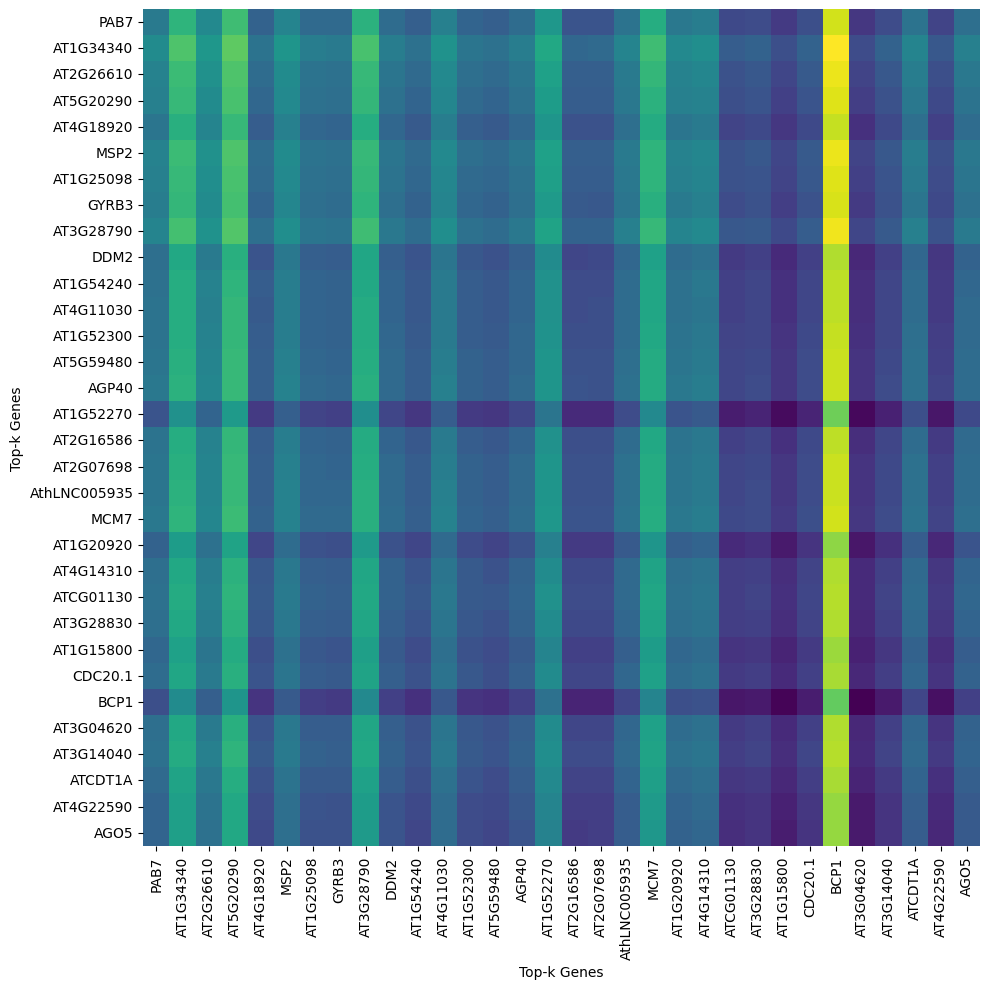

Attention scores heatmap for cell SRX20853656@@_CTTGAGACAAGCGGAT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_CTTGAGACAAGCGGAT-1.pdf
['AT4G18920', 'AT3G42850', 'AT1G25098', 'AT1G48470', 'AT4G36860', 'AT3G23530', 'AT1G54450', 'AT5G01760', 'AT5G66020', 'AT4G08670', 'AT5G13840', 'AT5G07410', 'AT4G36520', 'AT3G28830', 'AT2G25060', 'ATCG00020', 'AT4G33260', 'AT2G32240', 'AT5G04110', 'AT4G28570', 'AT3G07675', 'AT5G53820', 'AthLNC005935', 'AT3G20865', 'AT4G39260', 'AT1G05580', 'AT3G52920', 'AT1G54560', 'AT5G66670', 'AT3G14040', 'AT1G52300', 'AT2G07698']


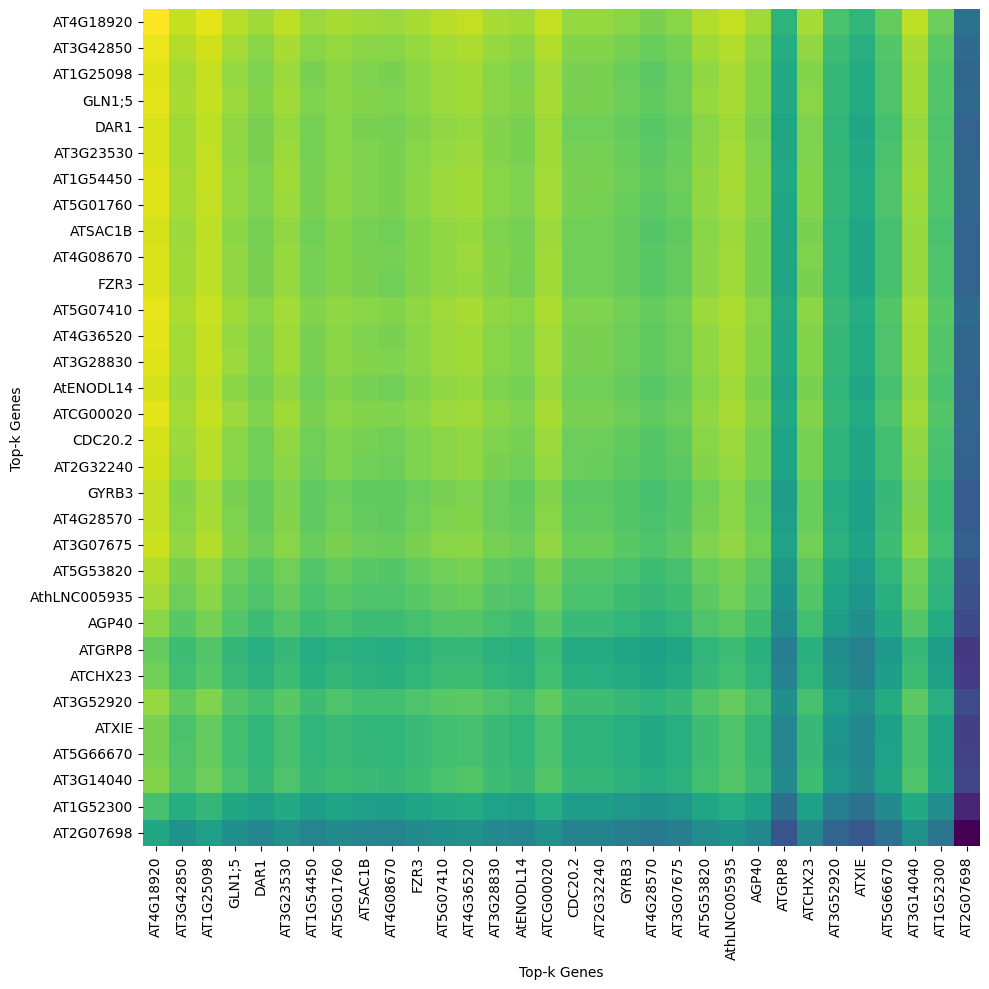

Attention scores heatmap for cell SRX20853656@@_GCAGTTAGTGTCTAAC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_GCAGTTAGTGTCTAAC-1.pdf
['AT3G14040', 'AT4G08670', 'AT3G02480', 'AT5G39870', 'AT4G26630', 'AT1G54450', 'AT1G15430', 'AT4G22590', 'AT5G53820', 'AT3G03490', 'AT4G38940', 'AT4G30860', 'AT3G20865', 'AT1G66235', 'AT1G12900', 'AT4G33270', 'AT5G18620', 'AthLNC022870', 'AT5G16100', 'AT5G66020', 'AT2G26610', 'AT1G69750', 'AT1G75950', 'AT2G16750', 'AT2G16586', 'AT1G70620', 'AT5G46250', 'AT5G01690', 'AT5G10950', 'AT5G15030', 'AT3G16840', 'AT3G28980']


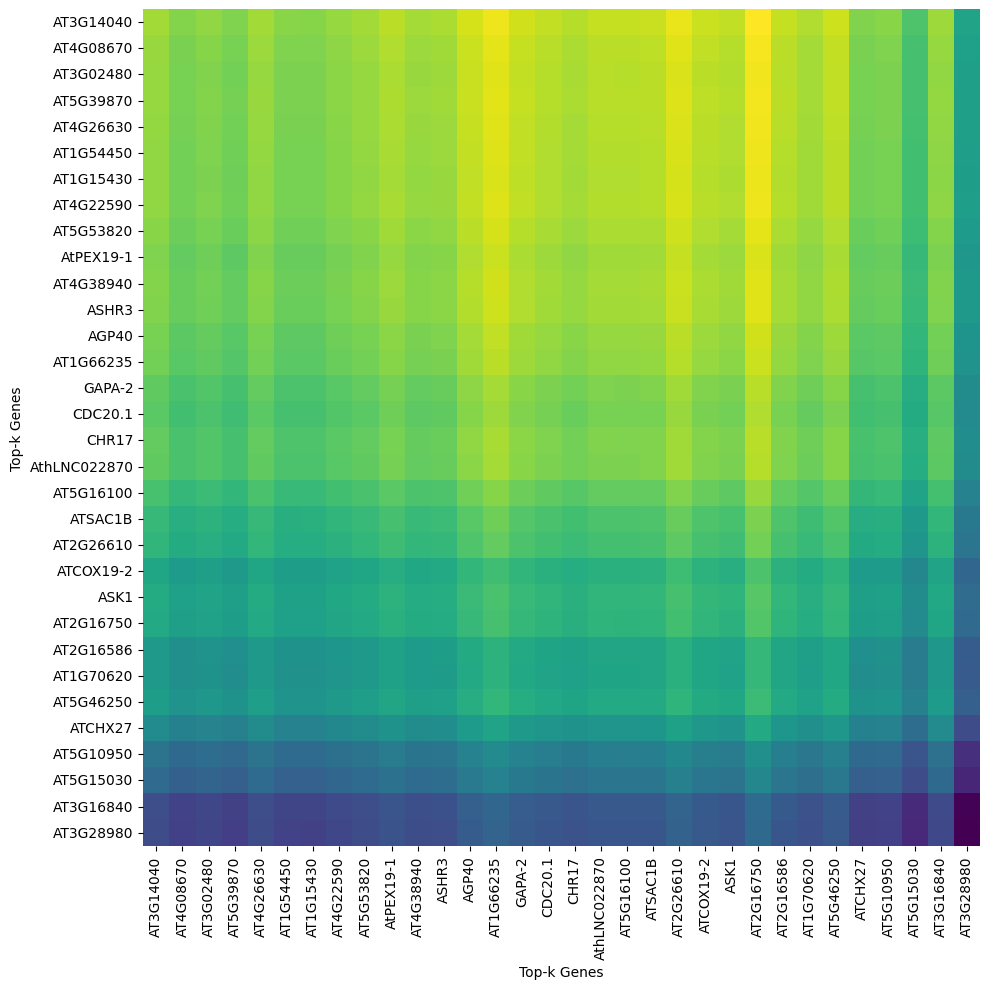

Attention scores heatmap for cell SRX20853656@@_CTCCGATAGGGAGGAC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853656@@_CTCCGATAGGGAGGAC-1.pdf
['ATCG01130', 'AT1G01040', 'AT3G23810', 'AT1G29010', 'AT4G16045', 'AT5G53440', 'AT1G80930', 'AT1G61340', 'AthLNC022670', 'AT4G08580', 'AthLNC024348', 'AT2G21660', 'AT1G54450', 'AT5G54095', 'AT1G05580', 'AT4G35010', 'AT5G59810', 'AT4G11030', 'AT4G39670', 'ATCG00020', 'AT4G33260', 'AT5G12960', 'AT1G34095', 'AT2G05642', 'AT4G04980', 'AT3G02480', 'AT3G23530', 'AT2G29880', 'AT4G18920', 'AT5G53460', 'AT4G11760', 'AT4G14315']


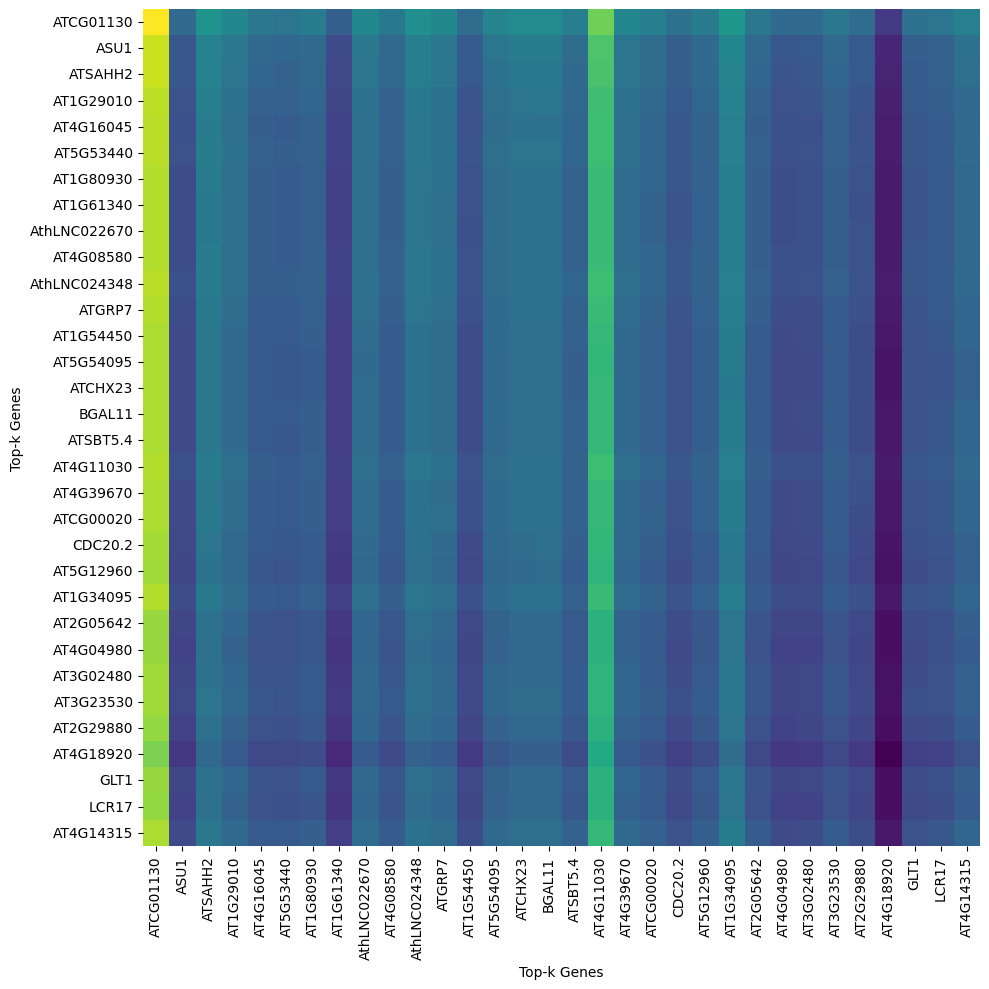

Attention scores heatmap for cell SRX20853658@@_TATTGGGGTGCCAAGA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853658@@_TATTGGGGTGCCAAGA-1.pdf
['AT4G06748', 'AT5G07410', 'AT1G03240', 'AT5G04110', 'AT1G22760', 'AT5G39870', 'AT5G38760', 'AT3G03490', 'AT3G30720', 'AT3G14040', 'AT5G66020', 'AT3G20865', 'AT4G39670', 'AT1G69750', 'AT2G01830', 'AT1G75910', 'AT3G28980', 'AT2G16586', 'AT5G49900', 'AT5G02270', 'AT5G53460', 'AT2G06983', 'AT3G28830', 'AT3G62200', 'AT4G11760', 'AT1G60410', 'AT4G31420', 'AT5G59810', 'AT5G53820', 'AT3G07850', 'AT4G09644', 'AT4G23800']


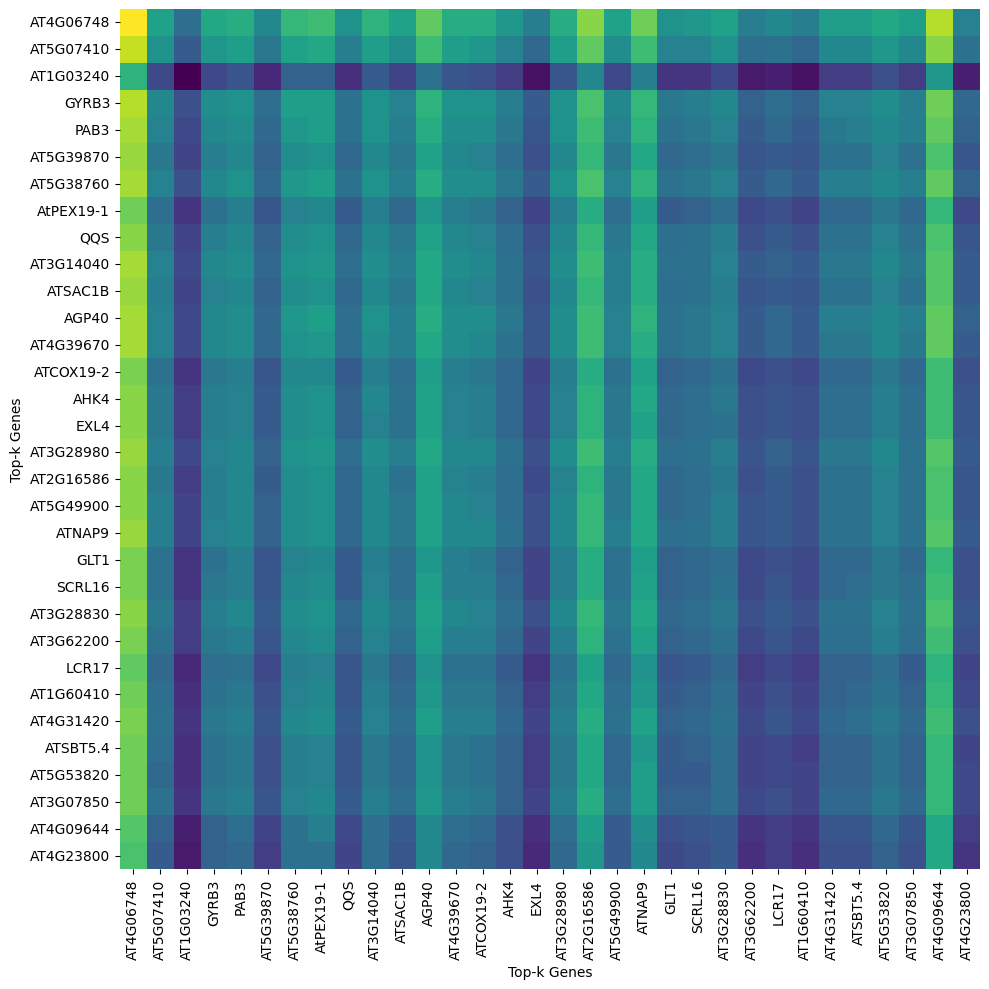

Attention scores heatmap for cell SRX20853658@@_TATCTGTTCTAGTCAG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853658@@_TATCTGTTCTAGTCAG-1.pdf
['AT5G40600', 'AT1G77850', 'AT2G04880', 'AT5G25560', 'AT3G42850', 'AT1G31970', 'AT5G04110', 'AT4G11380', 'AT2G41905', 'AT5G02500', 'AT1G48470', 'AT2G16586', 'AT5G38760', 'AT1G48180', 'AT3G14040', 'AT5G27870', 'AT3G20865', 'AT3G28980', 'AT3G28790', 'AT3G01270', 'AT5G54095', 'AT2G37190', 'AT1G72330', 'AT3G28830', 'AT2G07698', 'AT2G16750', 'AT2G16940', 'AT4G35010', 'AT1G01320', 'AT3G25495', 'AT5G01760', 'AT1G22760']


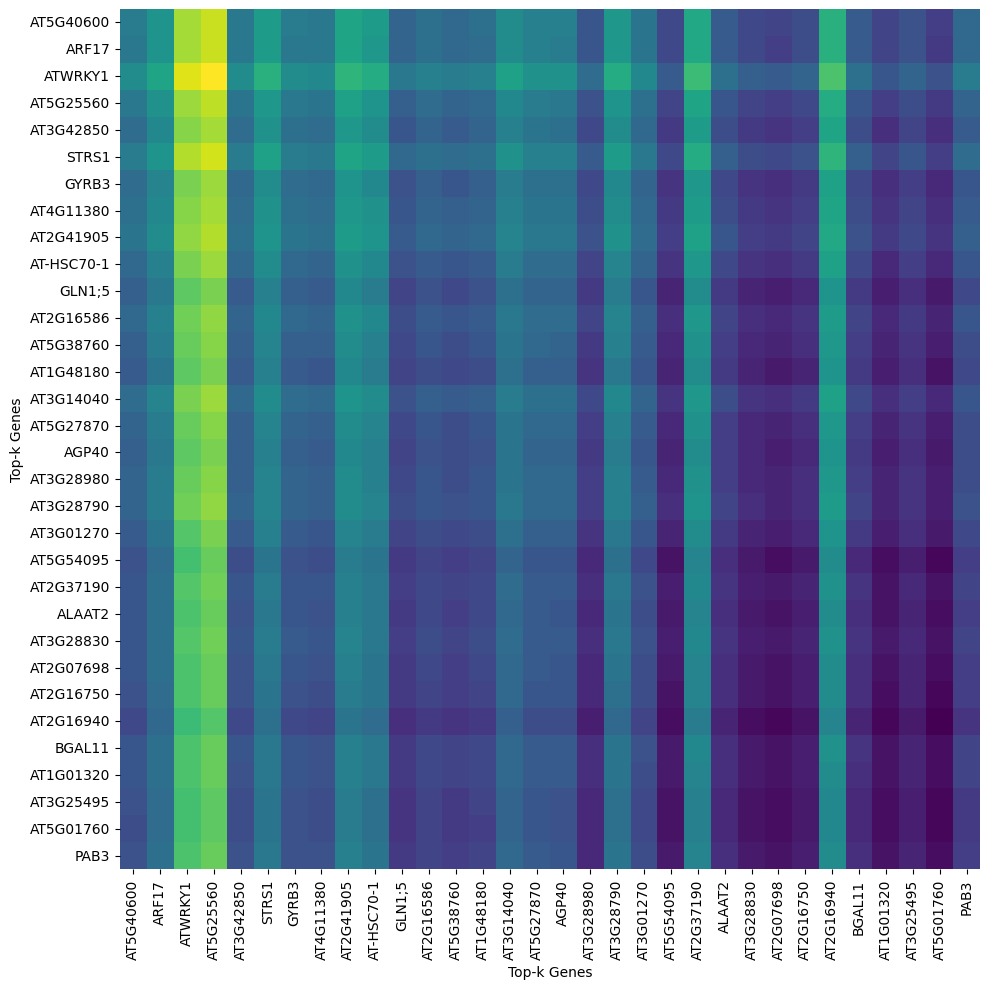

Attention scores heatmap for cell SRX20853658@@_GCCCAGATCCGTAATG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853658@@_GCCCAGATCCGTAATG-1.pdf
['AT5G61120', 'AT1G01040', 'AT4G26630', 'AT3G23810', 'AT4G08580', 'AT5G55180', 'AT1G79950', 'AT4G11280', 'AT1G73860', 'AT3G47440', 'AT1G05580', 'AT3G23300', 'AT4G26260', 'AT5G07410', 'AT1G76010', 'AT5G59480', 'AT1G19890', 'AT3G25495', 'AthLNC024348', 'AT4G13960', 'AT1G72330', 'AT1G47980', 'AT1G58120', 'AT1G13440', 'AT1G76720', 'AT5G54095', 'AT3G20865', 'AT1G75870', 'AT4G04980', 'AT3G07820', 'AT4G35010', 'AT3G13400']


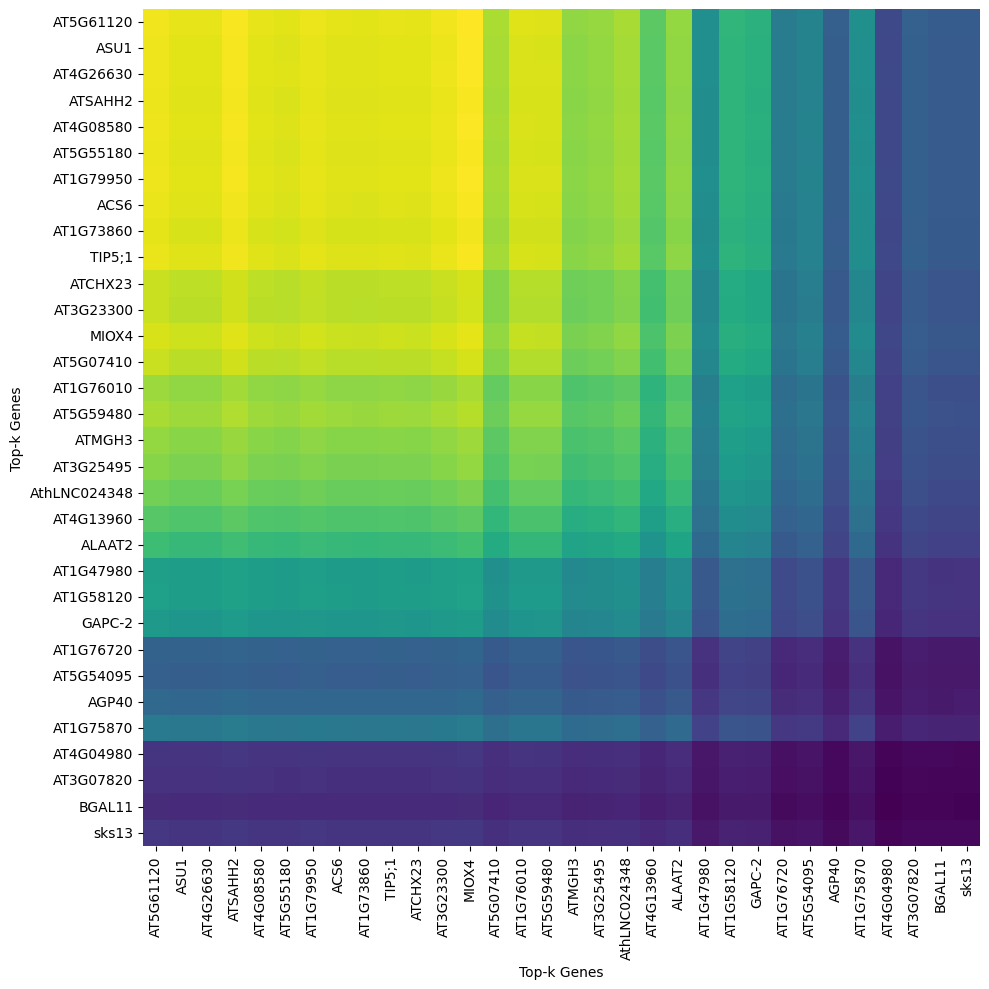

Attention scores heatmap for cell SRX20853658@@_GAGACTTGTGAATAAC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853658@@_GAGACTTGTGAATAAC-1.pdf
['AT5G04110', 'AT5G39870', 'AT3G30720', 'AT3G42850', 'AT3G14040', 'AT1G54450', 'AT5G62850', 'AT3G20865', 'AT5G07410', 'AT2G06983', 'AT5G53820', 'AT5G39650', 'AT5G53460', 'AT5G66020', 'AT4G22590', 'AT4G30860', 'AT3G28980', 'AT5G55490', 'AT2G27050', 'AT2G41250', 'AT3G50310', 'AT4G13230', 'AT5G48570', 'AT1G08600', 'AT4G33270', 'AT1G20220', 'AT3G07850', 'AT5G10390', 'AthLNC022870', 'AT4G14315', 'AT1G69940', 'AT1G18410']


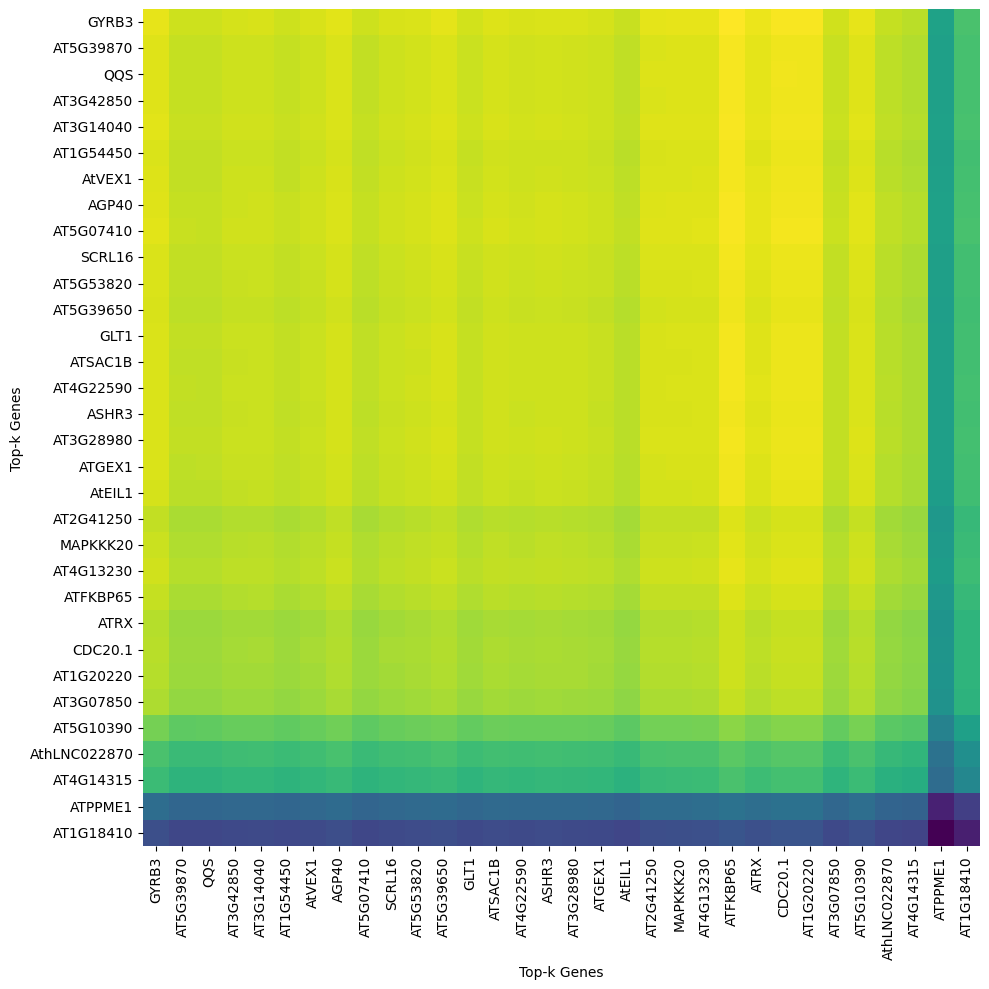

Attention scores heatmap for cell SRX20853656@@_CAGGCCACATGCCATA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853656@@_CAGGCCACATGCCATA-1.pdf
['AT5G53440', 'AT5G38760', 'AT2G07698', 'AT5G39870', 'AT1G50310', 'AT1G48470', 'AT3G20865', 'AT4G39670', 'AT4G08580', 'AT5G13930', 'AT3G14040', 'AT1G69940', 'AT5G15070', 'AT4G04450', 'AT2G16586', 'AT5G07410', 'AT2G07560', 'AT2G46170', 'AT3G07030', 'AT1G15430', 'AT1G76110', 'AT1G48740', 'AT4G13940', 'AT5G42020', 'AT4G30860', 'AT4G22590', 'AT1G70620', 'AT5G55490', 'AT3G22760', 'AT5G44300', 'AT5G58760', 'AT3G50310']


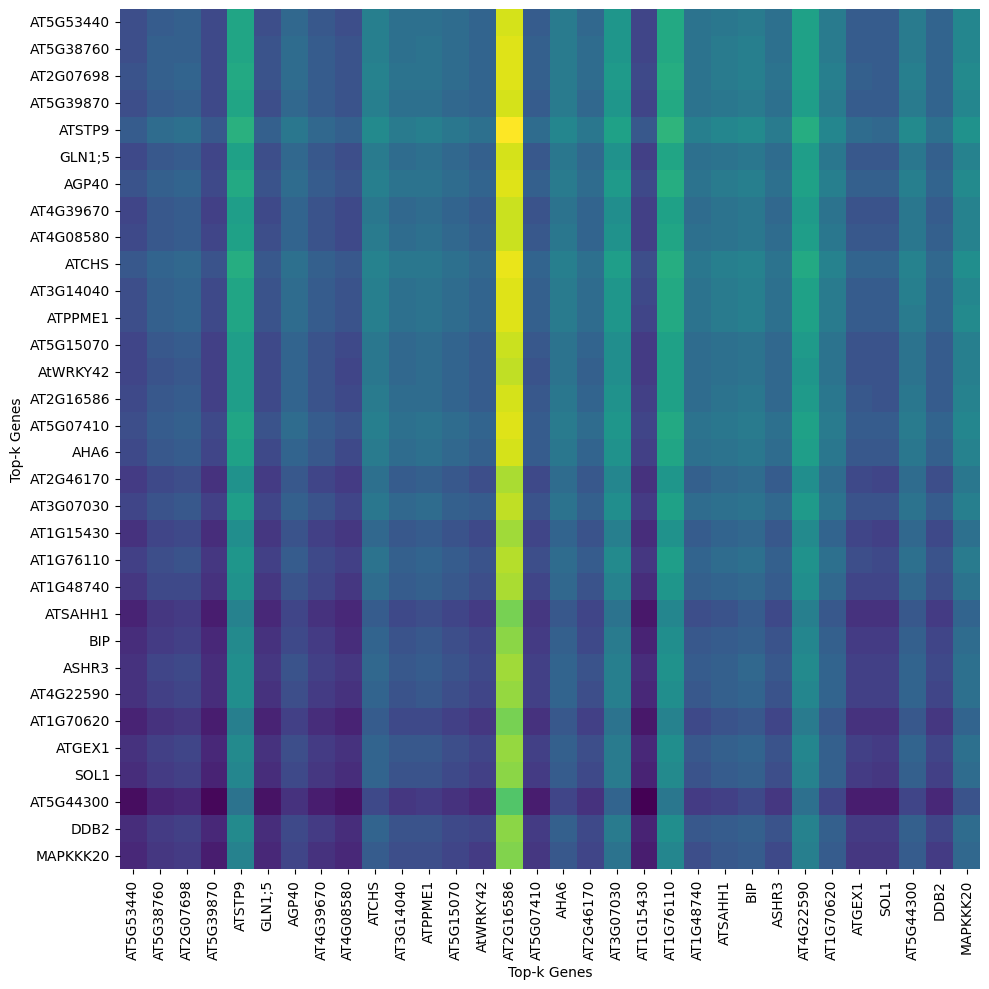

Attention scores heatmap for cell SRX20853658@@_GGAATCTAGTATTCCG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853658@@_GGAATCTAGTATTCCG-1.pdf
['AT1G77850', 'ATCG01130', 'AT3G42850', 'AT2G04880', 'AT2G07698', 'AT1G48470', 'AT1G52300', 'AT5G04110', 'AT4G28570', 'AT4G13230', 'AT3G23810', 'AT2G37190', 'AT5G02500', 'AT4G38590', 'ATCG00470', 'AT5G53460', 'AthLNC022670', 'AT3G28830', 'AT4G16045', 'AT1G22760', 'AT3G22760', 'AT3G14040', 'AT5G07410', 'AT4G08670', 'AT1G65730', 'AT4G36520', 'AT4G26640', 'AT2G34300', 'AT3G23530', 'AT3G28980', 'AT3G02480', 'AT4G35670']


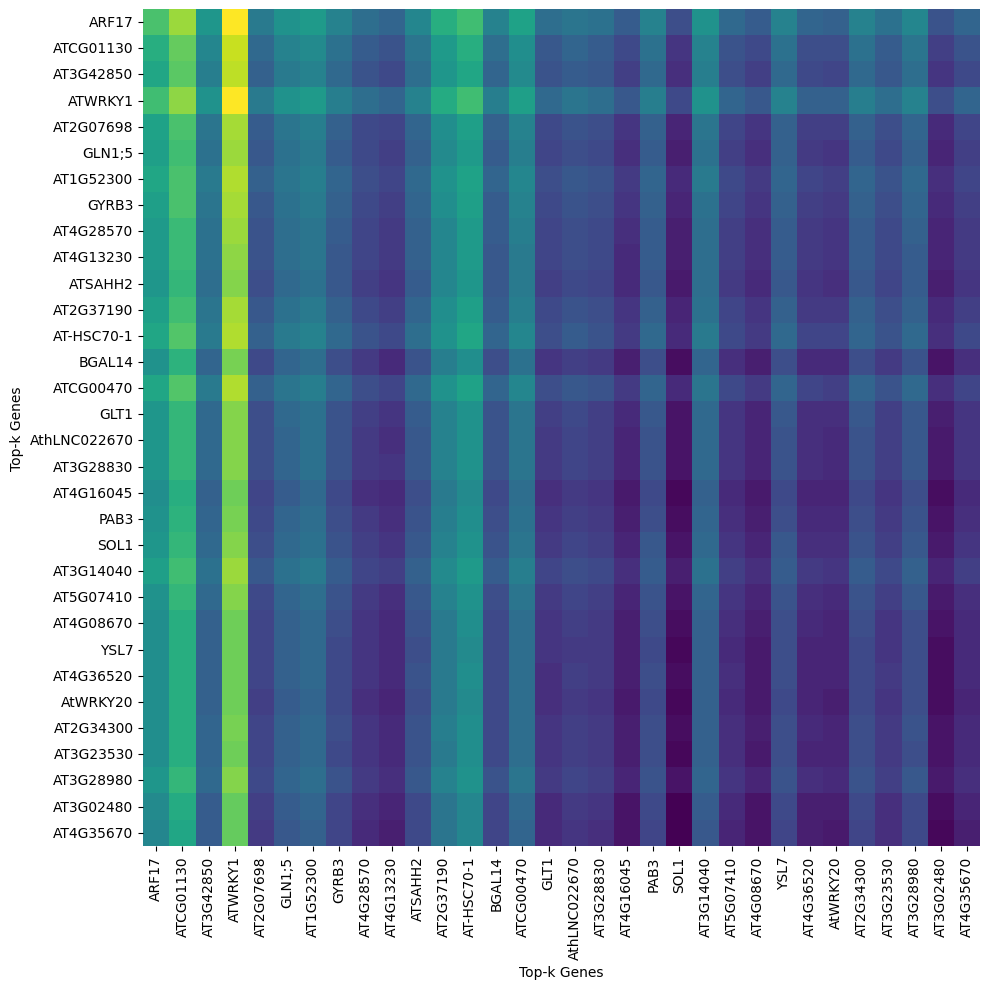

Attention scores heatmap for cell SRX20853656@@_TATGTTCGTTACCCAA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_TATGTTCGTTACCCAA-1.pdf
['AT5G54095', 'AT4G16045', 'AT3G23810', 'AT1G80930', 'AT1G54450', 'AT4G26630', 'AT1G05580', 'AT3G25495', 'AT3G02480', 'AT3G23530', 'AT4G34060', 'ATCG00020', 'AT2G37190', 'AT4G39670', 'AT4G30860', 'AT2G21660', 'AT4G05710', 'AT4G31420', 'AT1G52680', 'AT3G21945', 'AT2G05642', 'AT5G21105', 'AT1G19890', 'AT4G22590', 'AT4G35010', 'AT4G33000', 'AT4G11760', 'AT4G16480', 'AT5G12280', 'AT1G11650', 'AT2G45405', 'AT5G07530']


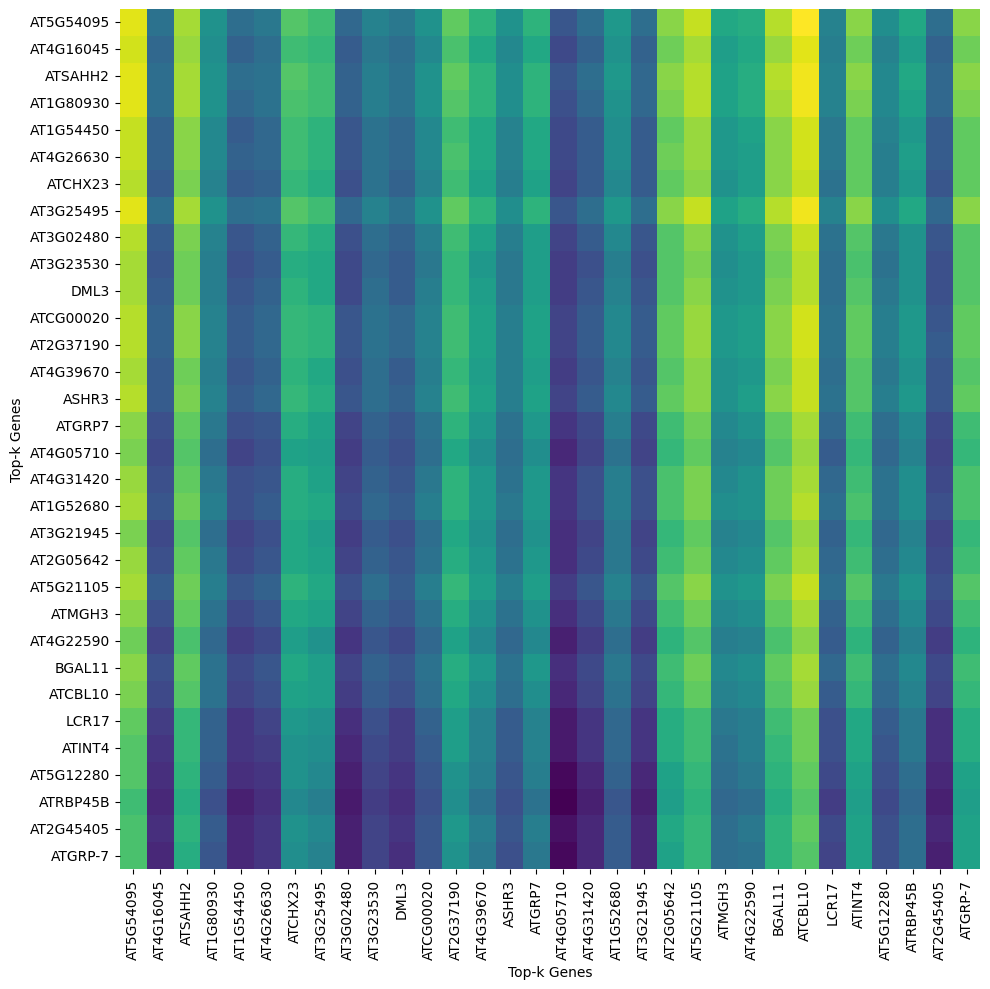

Attention scores heatmap for cell SRX20853658@@_CACTGGGCACAGAGCA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_late_bi_heatmap_output_SRX20853658@@_CACTGGGCACAGAGCA-1.pdf
['AT2G39300', 'AT5G55930', 'AT5G15970', 'AT1G77850', 'AT5G54095', 'AT4G08580', 'AT1G05580', 'AT1G80930', 'AT4G26630', 'ATCG00040', 'ATCG00170', 'AT5G55180', 'AT5G53460', 'AT4G36600', 'AT4G35010', 'AT1G23250', 'AT1G54450', 'AT2G39705', 'AT3G23530', 'AT3G02480', 'AT2G21660', 'ATCG00020', 'AthLNC024348', 'AT4G39670', 'ATCG00490', 'AT2G07698', 'AT1G76010', 'AthLNC016885', 'AT1G25470', 'AT3G61160', 'AT1G52680', 'AT1G61340']


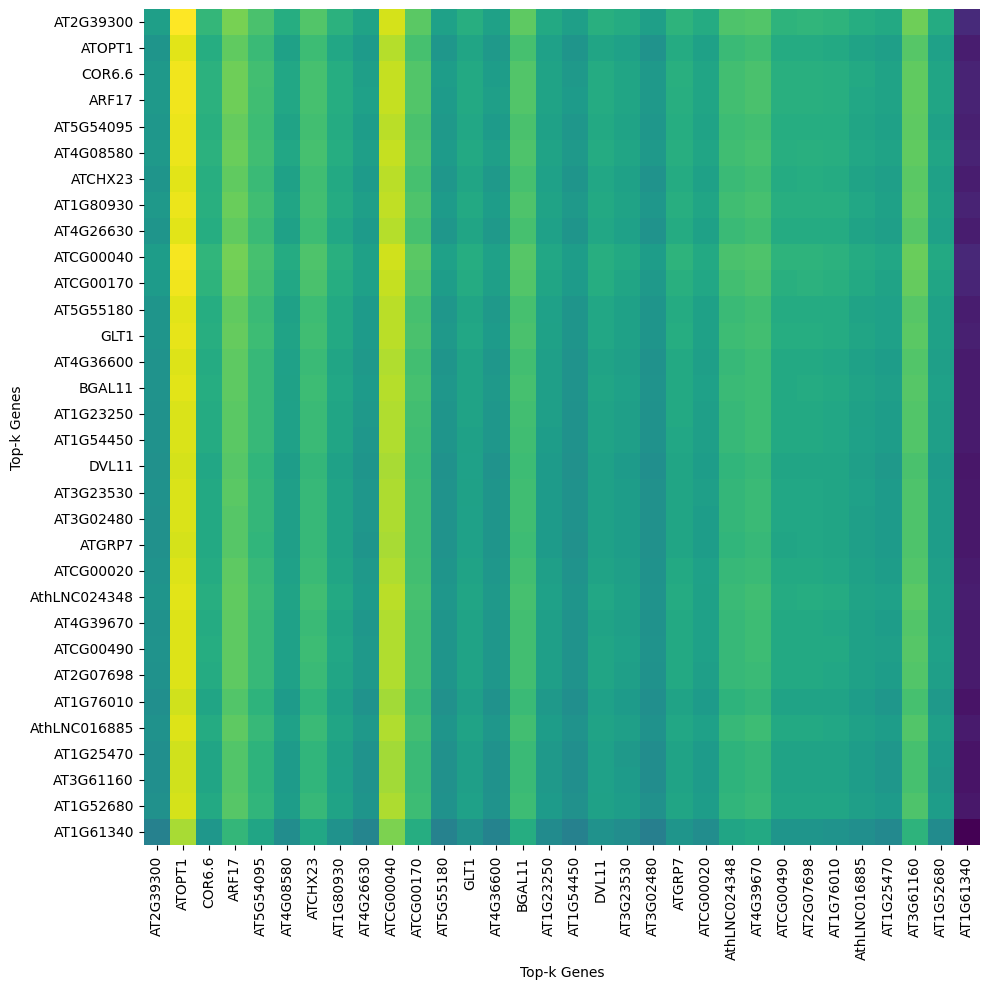

Attention scores heatmap for cell SRX20853658@@_CCAATGACACGGTGCT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853658@@_CCAATGACACGGTGCT-1.pdf
['AT4G26630', 'ATCG00040', 'AT3G23810', 'AT5G04110', 'AT5G53820', 'AT3G20865', 'AT1G22760', 'AT2G39300', 'AT2G16750', 'AT5G55180', 'AT4G36600', 'AT5G66020', 'AT5G16100', 'AT5G07410', 'AT2G21660', 'AT4G26640', 'AT3G28830', 'AT5G03620', 'AT5G39870', 'AT1G28620', 'AT4G34060', 'AT4G08670', 'AT2G29880', 'AT3G28980', 'AT5G59870', 'AT1G77210', 'AT1G34095', 'AT1G08600', 'AT3G14040', 'AT1G49290', 'AT1G54560', 'AT5G53460']


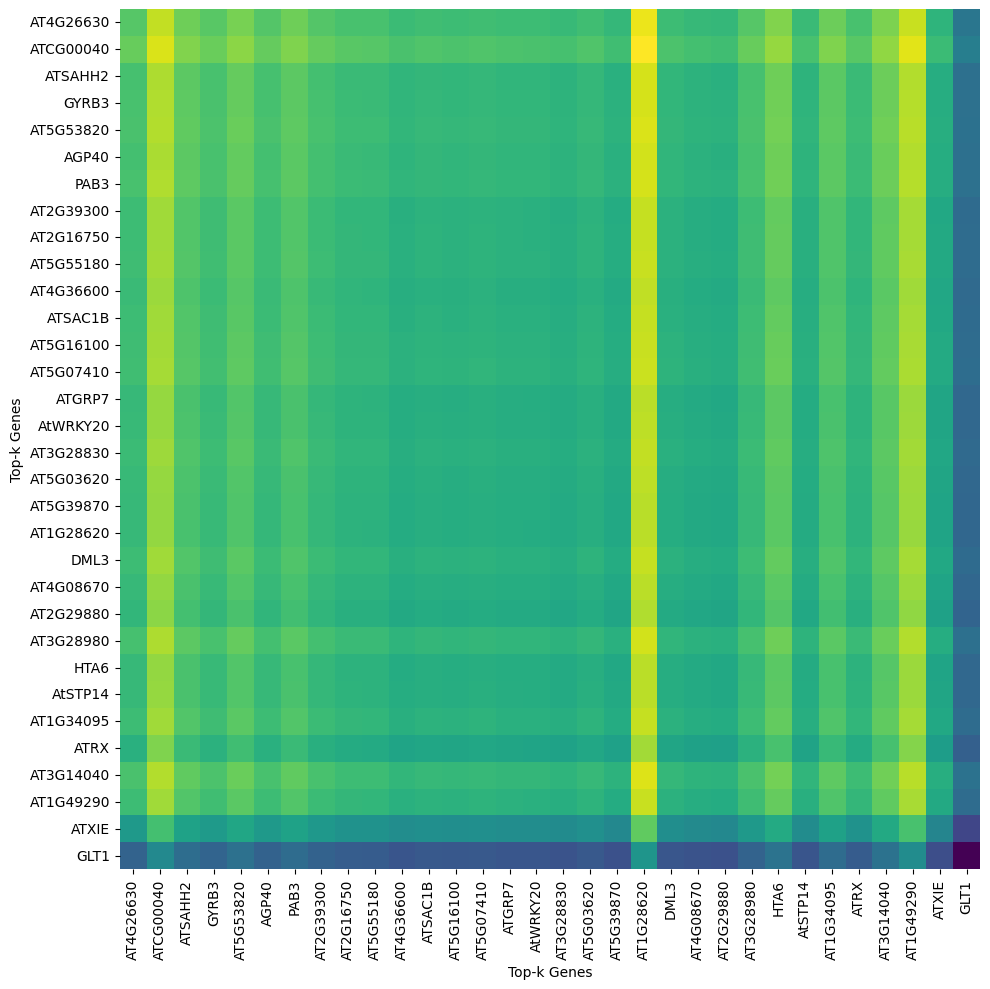

Attention scores heatmap for cell SRX20853656@@_CAAAGAAGTTACGATC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853656@@_CAAAGAAGTTACGATC-1.pdf
['AT3G02480', 'AT4G08670', 'AT3G14040', 'AT3G11410', 'AT4G13960', 'AT5G15960', 'AT3G28830', 'AT3G28820', 'AT1G12840', 'AT1G08600', 'AT1G75910', 'AT1G50310', 'AT5G07410', 'AT1G48740', 'AT5G60800', 'AT5G16100', 'AT3G20770', 'AT5G02500', 'AT1G15940', 'AT2G27880', 'AT2G16940', 'AT3G28980', 'AT3G50310', 'AthLNC022870', 'AT5G01690', 'AT3G07850', 'AT2G28680', 'AT5G18620', 'AT3G48140', 'AT1G20220', 'AT5G46250', 'AT1G75950']


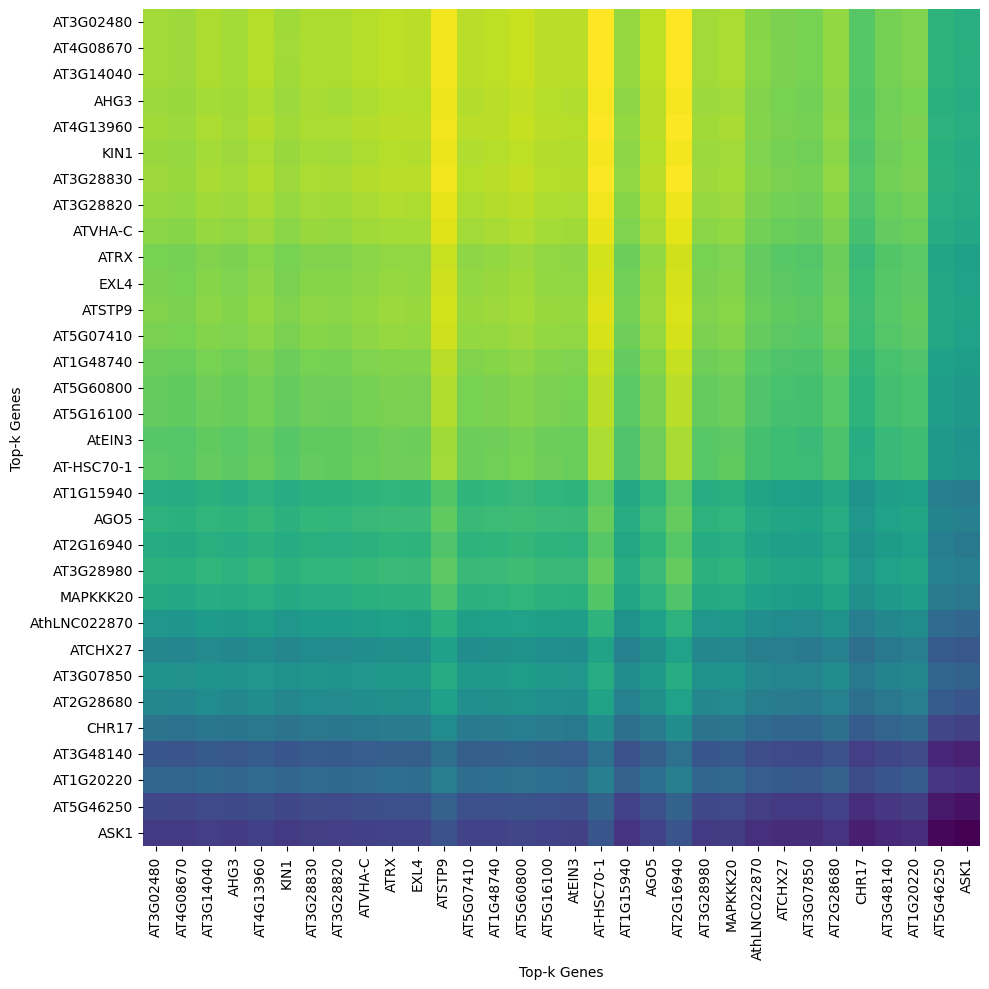

Attention scores heatmap for cell SRX20853656@@_ACAGCCGCAAGTAGTA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853656@@_ACAGCCGCAAGTAGTA-1.pdf
['AT1G25098', 'AT1G77850', 'AT2G18020', 'AT1G15930', 'AT4G06748', 'AT4G13940', 'AT3G09390', 'AT1G64090', 'AT3G20865', 'AT5G59690', 'AT2G19110', 'AT2G34480', 'AT3G58160', 'AT1G19310', 'AT5G15200', 'AT1G77940', 'AT3G16080', 'AT4G17390', 'AT1G15200', 'AT5G55930', 'AT1G64110', 'AT1G12840', 'AT4G16720', 'AT5G04110', 'AT2G01008', 'AT3G07030', 'AT3G28790', 'AT1G09690', 'AT4G39260', 'AT5G27850', 'AT5G60800', 'AT4G27090']


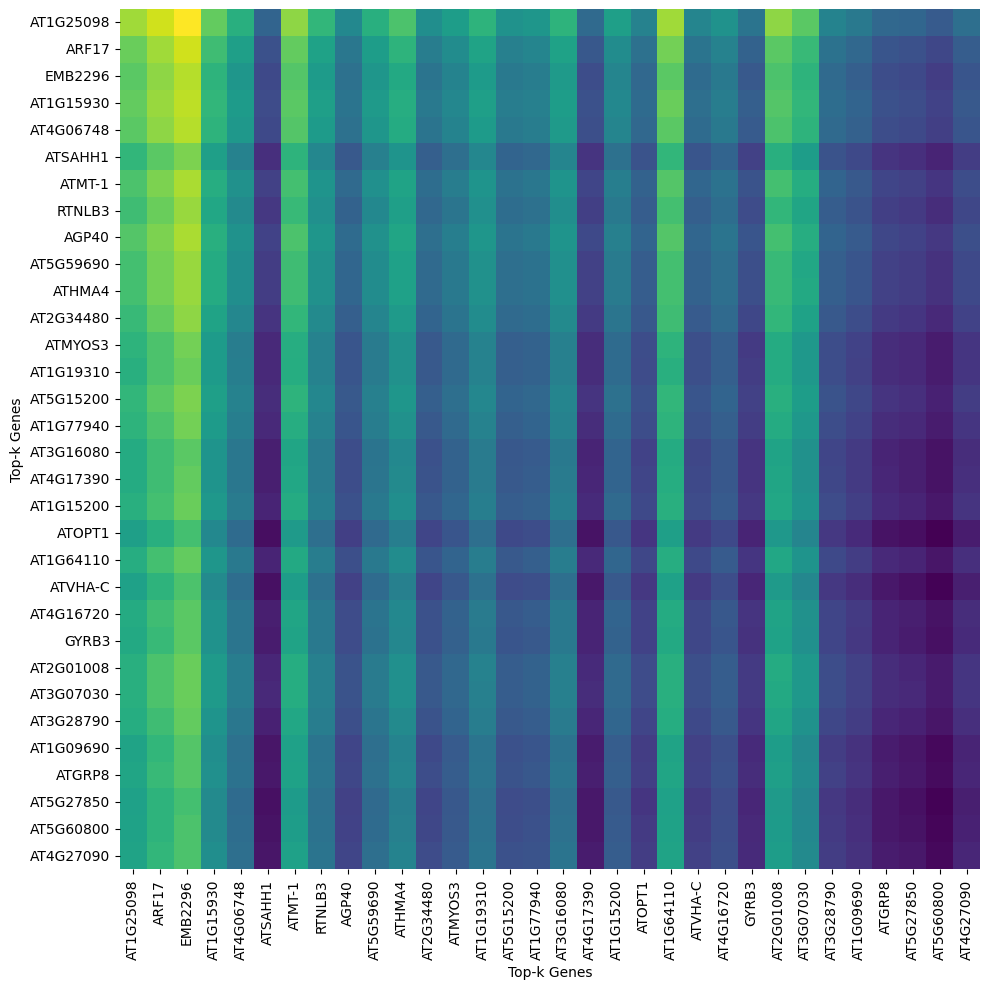

Attention scores heatmap for cell SRX20853658@@_ATGAAAGAGGAGAGTA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_ATGAAAGAGGAGAGTA-1.pdf
['AT4G14780', 'AT2G34480', 'AT5G25560', 'AT1G77940', 'AT3G58160', 'AT2G19110', 'AT2G31902', 'AT4G11380', 'AT1G31970', 'AT2G36660', 'AT1G25098', 'AT5G58190', 'AT5G49150', 'AT5G40600', 'AT3G15280', 'AT3G20865', 'AT1G64090', 'AT2G16940', 'AT4G27090', 'AT3G60245', 'AT3G28790', 'AT5G46795', 'AT1G80660', 'AT2G16750', 'AT1G15200', 'AT1G76110', 'AT2G30630', 'AT2G01250', 'AT5G61170', 'AT3G11964', 'AT2G26610', 'AT3G53350']


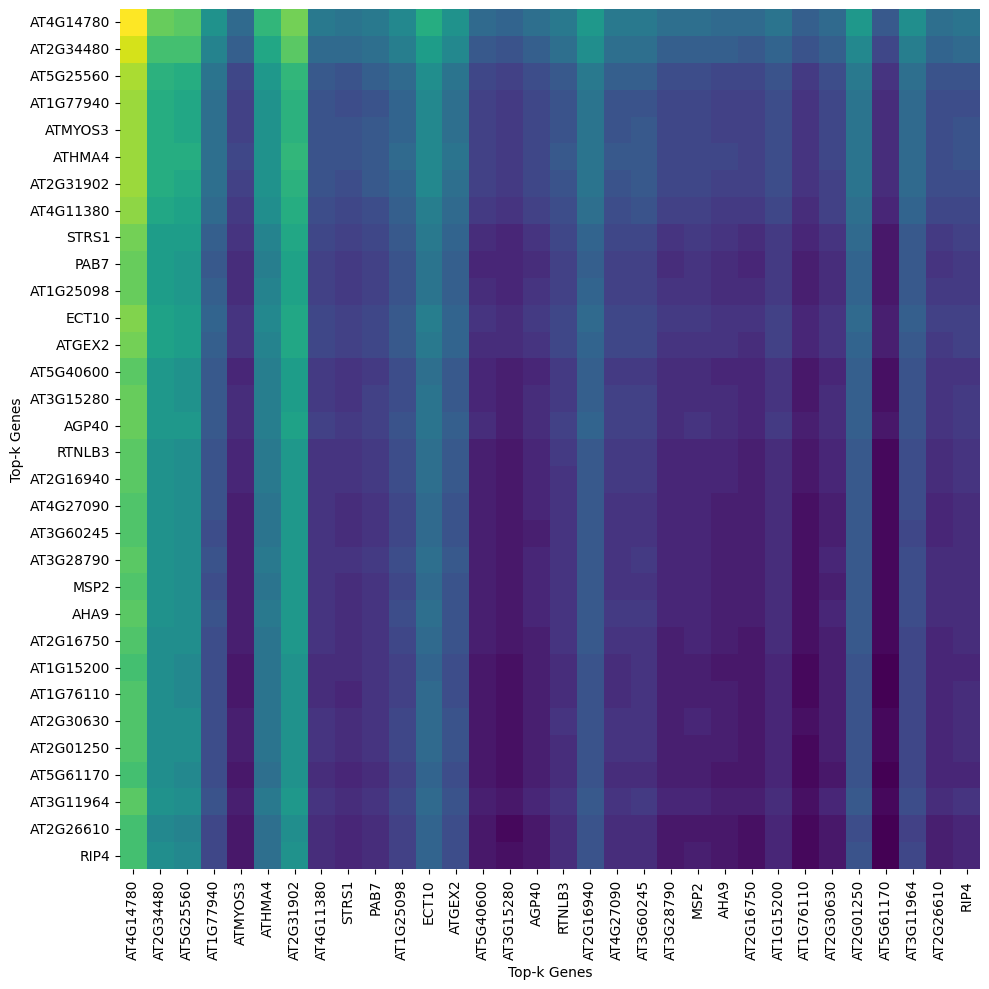

Attention scores heatmap for cell SRX20853658@@_GTCAAGTGTGCATGTT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853658@@_GTCAAGTGTGCATGTT-1.pdf
['AT4G26630', 'AT5G48545', 'AT3G23530', 'AT3G02480', 'AT4G26640', 'AT1G73860', 'AT2G45403', 'AT4G35010', 'AT1G54450', 'AT4G09644', 'AT4G14315', 'AT2G29880', 'AT2G37190', 'AT4G22590', 'AT1G79950', 'AT3G21945', 'AT5G53460', 'AT3G52920', 'AT1G65730', 'AthLNC024348', 'AT5G59480', 'AT2G21660', 'AT4G18920', 'AT4G11030', 'AT4G26260', 'AT5G50830', 'AT1G52300', 'AT3G28770', 'AT2G05642', 'AT5G21105', 'AthLNC022670', 'AT4G34110']


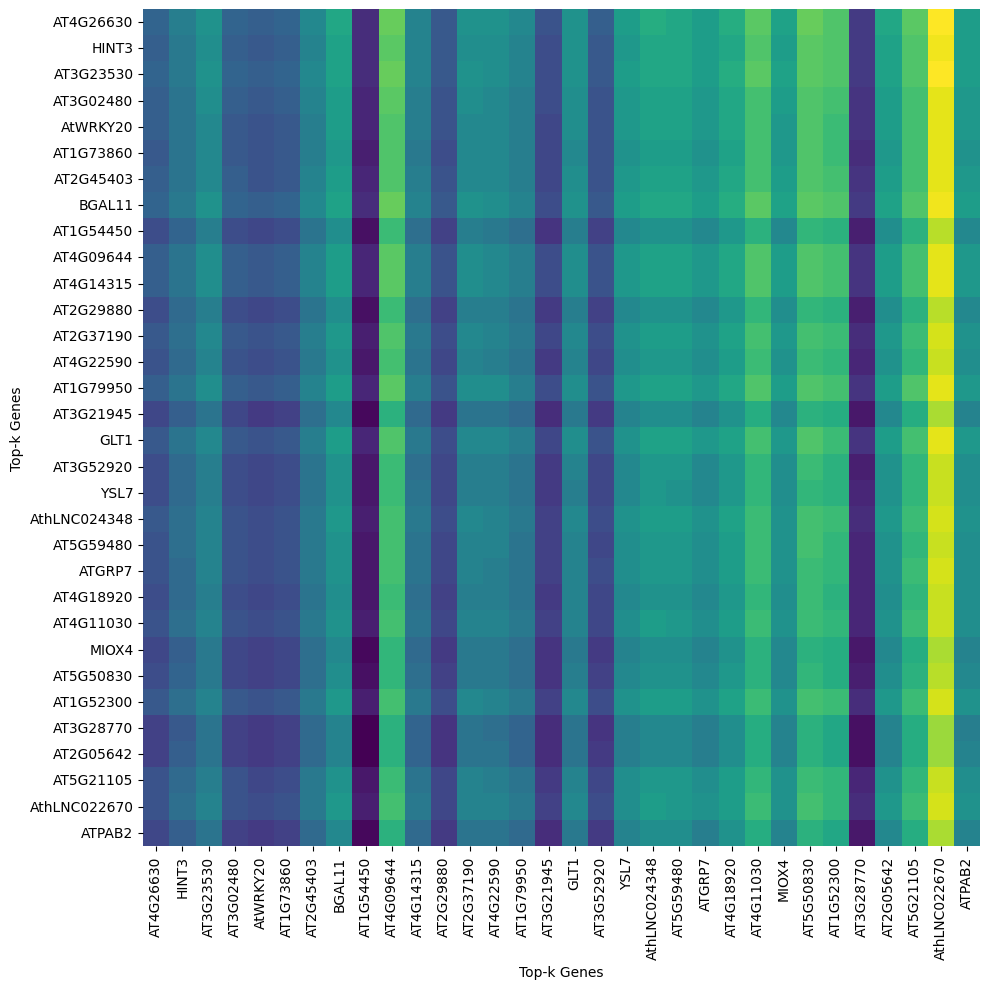

Attention scores heatmap for cell SRX20853656@@_CGTAATGTCCATACTT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853656@@_CGTAATGTCCATACTT-1.pdf
['AT3G28830', 'AT1G22760', 'AT3G30720', 'AT1G25098', 'AT5G03620', 'AT5G04110', 'AT3G14040', 'AT3G02480', 'AT3G42850', 'AT4G08670', 'AT1G61340', 'AT2G07698', 'AT4G25950', 'AT4G16045', 'AT3G28980', 'AT3G03490', 'AT3G53350', 'AT1G04080', 'AT5G20710', 'AT3G11410', 'AT3G23810', 'AT2G16586', 'AT1G15430', 'AT5G02500', 'AT4G11380', 'AT1G48740', 'AT4G30860', 'AT2G21660', 'AT4G22590', 'AT5G49900', 'AT5G23160', 'AT1G75950']


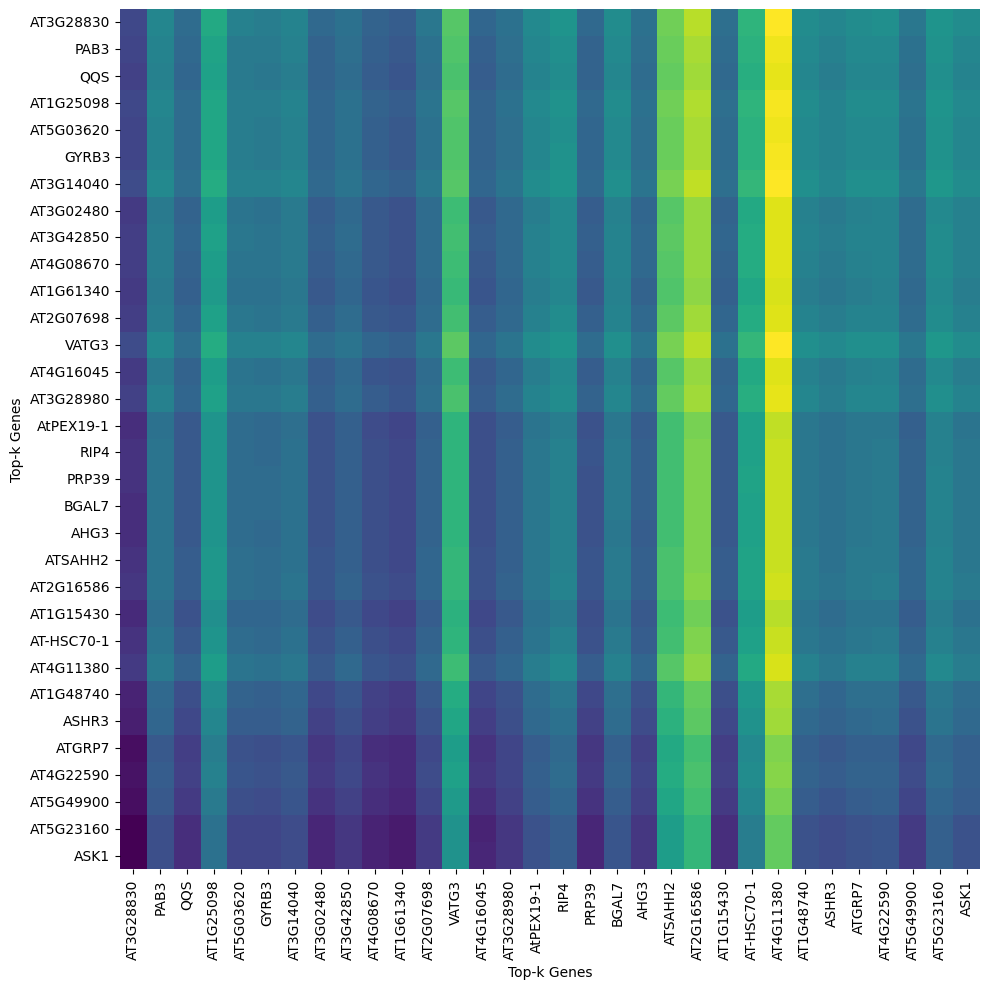

Attention scores heatmap for cell SRX20853656@@_TGTTGAGAGTGGAAGA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853656@@_TGTTGAGAGTGGAAGA-1.pdf
['AT5G39870', 'AT5G03620', 'ATCG00020', 'AT4G36600', 'AT3G14040', 'AT5G04110', 'AT3G20865', 'AT5G55490', 'AT1G48740', 'AT3G24640', 'AT2G16750', 'AT5G07410', 'AT1G66235', 'AT1G70620', 'AT5G15070', 'AT5G01760', 'AT4G16160', 'AT2G46170', 'AT4G33270', 'AT4G22590', 'AT2G07560', 'AT5G18620', 'AT3G07850', 'AT1G69940', 'AT3G45810', 'AT1G75950', 'AT5G59480', 'AT5G46250', 'AT5G44800', 'AthLNC019416', 'AT1G48090', 'AT1G49290']


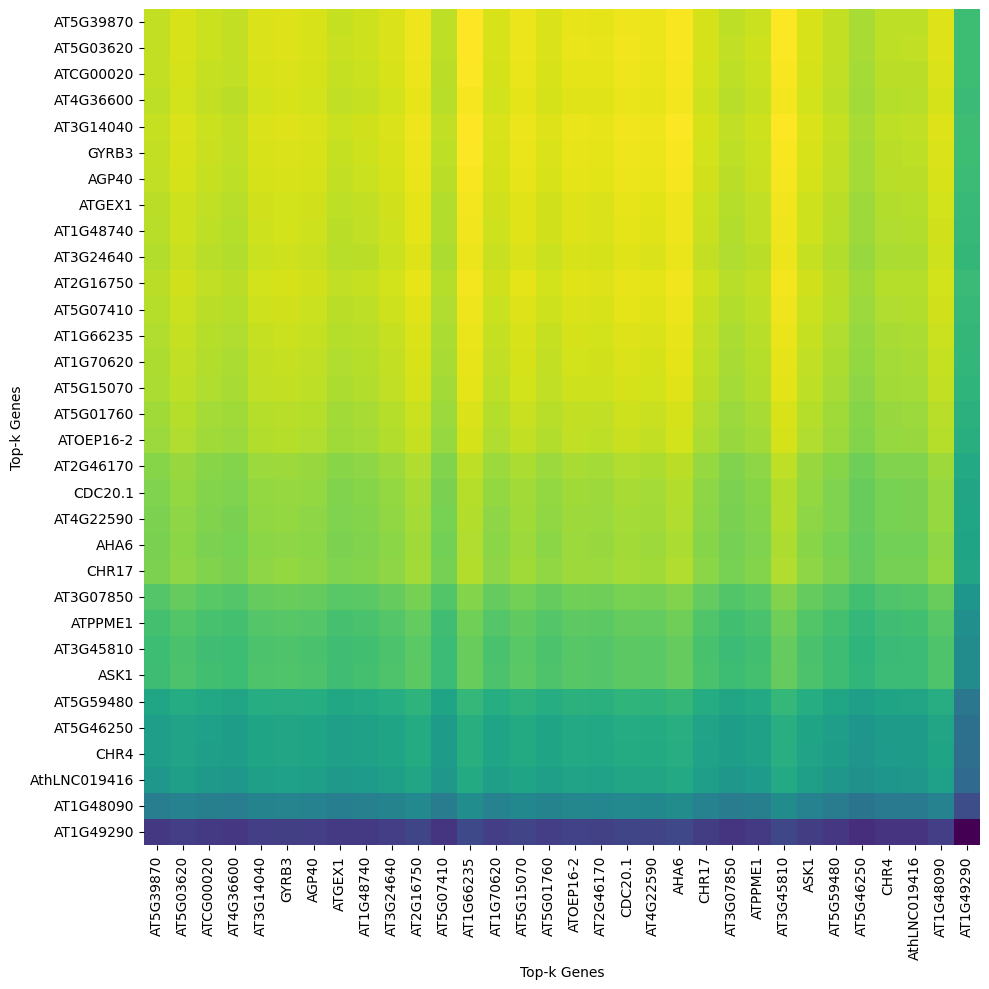

Attention scores heatmap for cell SRX20853658@@_AATTCCTGTCTGTGGC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853658@@_AATTCCTGTCTGTGGC-1.pdf
['AT4G11380', 'AT2G36660', 'AT3G20865', 'AT5G18620', 'AT5G38410', 'AT4G20260', 'AthLNC005935', 'AT2G06040', 'AT3G16380', 'AT1G12640', 'AT5G04110', 'AT4G08590', 'AT3G58160', 'AT3G22760', 'AT4G31420', 'AT1G11650', 'AT5G53820', 'AT5G49900', 'AT1G12840', 'ATCG00040', 'ATCG01130', 'ATCG00470', 'AT5G23160', 'AT1G75950', 'AthLNC020490', 'AT1G52300', 'AT3G28790', 'AT2G36390', 'AT2G29790', 'AT1G64110', 'AT4G39230', 'AT4G30860']


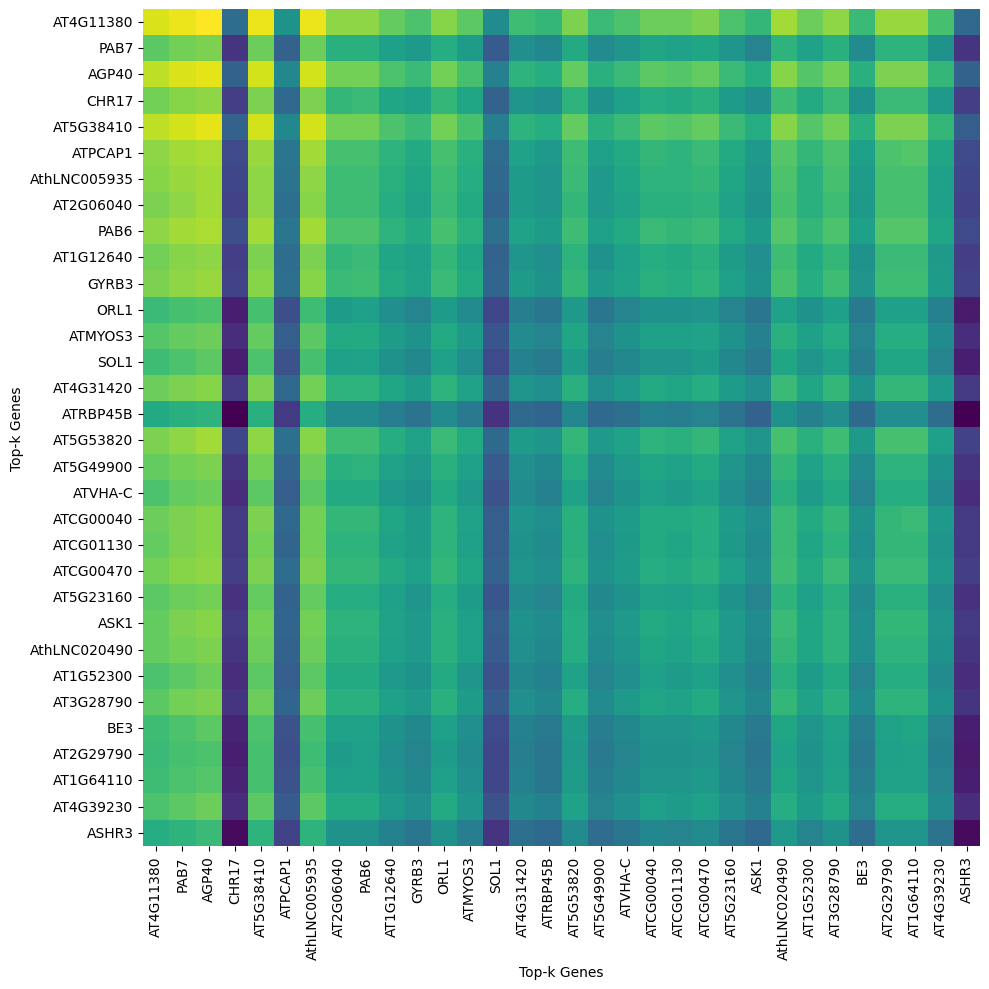

Attention scores heatmap for cell SRX20853656@@_AGGGAGTAGTGCAGCA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_AGGGAGTAGTGCAGCA-1.pdf
['AT1G61340', 'AT1G48470', 'AT3G02480', 'AT4G26630', 'AT3G42850', 'AT4G08670', 'AT4G26640', 'AT4G36600', 'AT1G54450', 'AT2G07698', 'AT5G39870', 'AT2G19860', 'AT4G04450', 'AT3G53350', 'AT1G15430', 'AT1G04080', 'AT5G01690', 'AT3G21945', 'AT3G23300', 'AT5G53460', 'AT1G79950', 'AT5G02500', 'AT4G22590', 'AT4G11030', 'AT4G33270', 'AthLNC005935', 'AthLNC016367', 'AT2G36660', 'AT3G50310', 'AT4G39260', 'AT3G41762', 'AT5G13940']


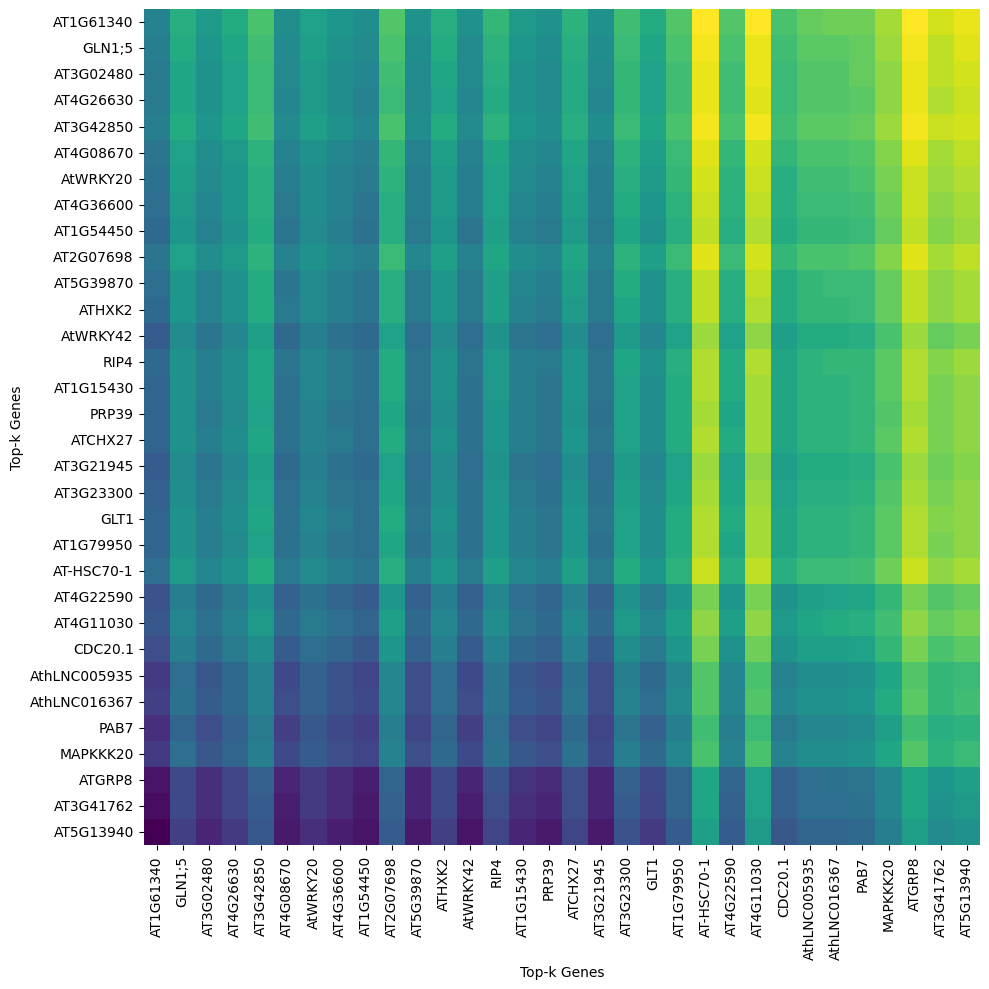

Attention scores heatmap for cell SRX20853656@@_CATCCCATCGCTGTCT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_late_bi_heatmap_output_SRX20853656@@_CATCCCATCGCTGTCT-1.pdf
['AT1G01040', 'AT5G54095', 'AT1G77850', 'AT3G23810', 'AT1G29010', 'AT1G80930', 'AT1G54450', 'AT3G02480', 'AT4G36600', 'AthLNC024348', 'AT1G05580', 'AT5G16730', 'AT4G11760', 'AT2G05642', 'AT1G52680', 'AT1G04080', 'AT4G22590', 'AT5G12280', 'AT1G72330', 'AT5G21105', 'AT2G46830', 'AT5G02500', 'AT5G53460', 'AT1G25470', 'AT4G14310', 'AT4G33270', 'AT4G33000', 'AT1G08730', 'AthLNC012426', 'AT1G75870', 'AT1G31970', 'AT4G26260']


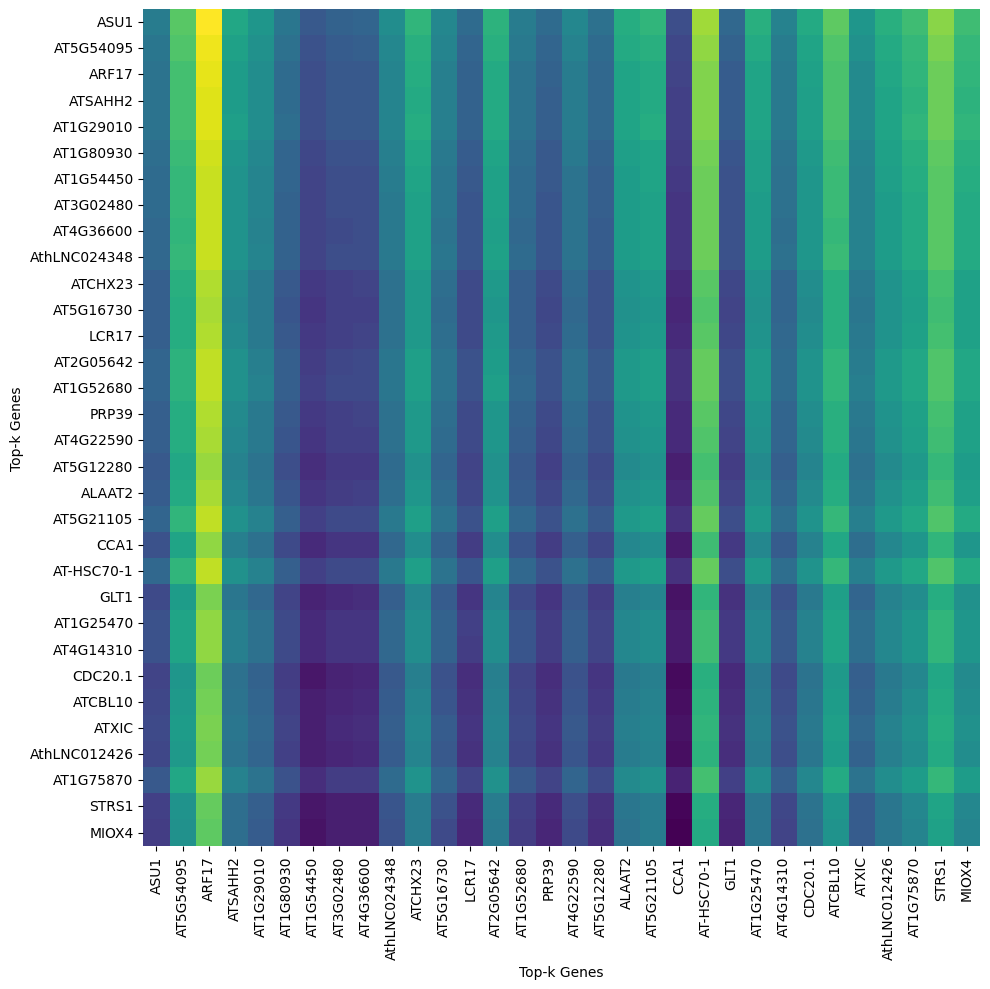

Attention scores heatmap for cell SRX20853658@@_GCACGTGTCCCGTTCA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_late_bi_heatmap_output_SRX20853658@@_GCACGTGTCCCGTTCA-1.pdf
['AT5G39870', 'AT2G16750', 'ATCG00040', 'AT3G30720', 'AT2G06983', 'AT2G21660', 'ATCG00800', 'AT5G02500', 'AT1G15430', 'AT3G14040', 'AT3G02480', 'AT3G20865', 'AT4G11380', 'AT5G01760', 'AT1G20920', 'AthLNC016466', 'AT5G07410', 'AT5G16100', 'AT2G45405', 'AT3G07850', 'AT1G54560', 'AT4G14780', 'AT4G11030', 'AT5G46250', 'AT5G61700', 'AT3G28770', 'AT3G28830', 'AT4G28000', 'AT5G61690', 'AT5G41310', 'AT3G22750', 'AT4G08630']


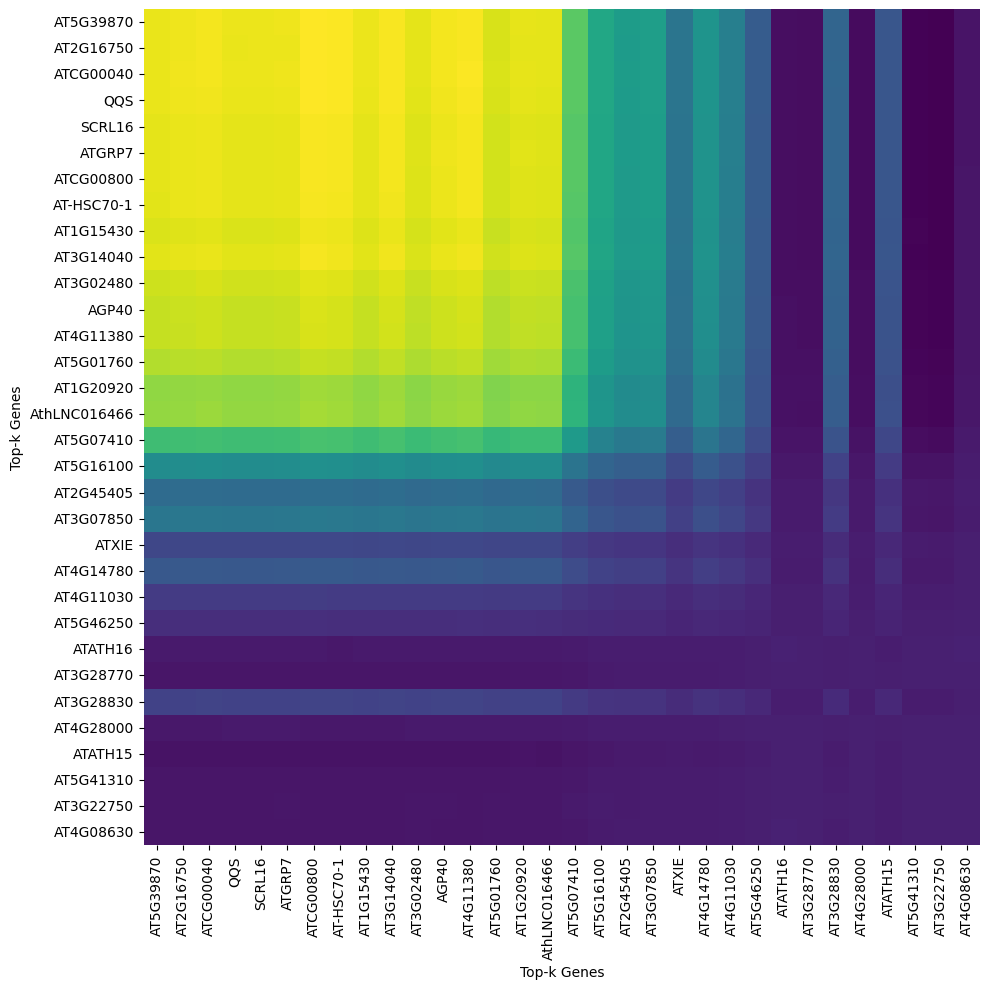

Attention scores heatmap for cell SRX20853656@@_TTAATCCTCTGTTGGA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853656@@_TTAATCCTCTGTTGGA-1.pdf
['AT4G36860', 'AT4G16045', 'ATCG00340', 'AT4G26630', 'ATCG00300', 'AT3G02480', 'AT4G26640', 'AT1G54450', 'AT4G05710', 'AT5G39870', 'AT3G54000', 'ATCG00170', 'AT5G53460', 'AT2G21660', 'AT5G02500', 'AT2G37190', 'AT3G52920', 'AT1G79950', 'AT1G28620', 'AT1G04080', 'AT2G19860', 'AT4G33270', 'AT5G21105', 'AT5G59810', 'AT4G22590', 'AT5G54095', 'AT1G64610', 'AthLNC024348', 'AT3G20770', 'AT2G33420', 'AT4G11030', 'AT4G34110']


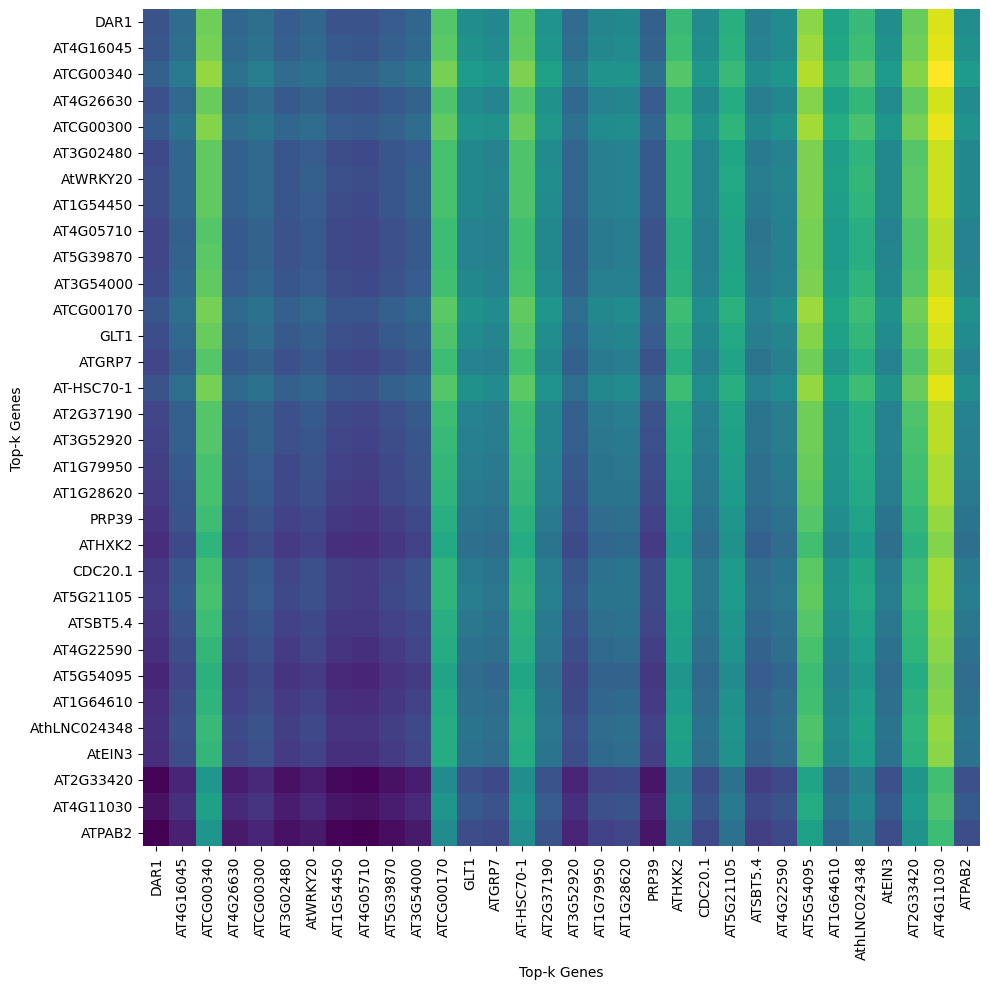

Attention scores heatmap for cell SRX20853656@@_GTGGGAAGTGCATCTA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853656@@_GTGGGAAGTGCATCTA-1.pdf
['AT2G16750', 'AT5G04110', 'AT5G46795', 'AT5G61120', 'AT1G48470', 'AT3G54000', 'AT3G02480', 'AT4G36600', 'AT5G55180', 'AT1G25098', 'AT1G79800', 'AT4G13960', 'AT5G39870', 'AT4G08670', 'AT5G13630', 'AT1G54450', 'ATCG00340', 'AthLNC022670', 'AT5G62850', 'AT2G07698', 'AT4G11380', 'AT1G66270', 'AT1G15430', 'ATCG00020', 'AT5G15960', 'AT1G12080', 'AT4G31420', 'AT3G07675', 'AT1G79950', 'AT1G04080', 'AT3G47410', 'AT5G66020']


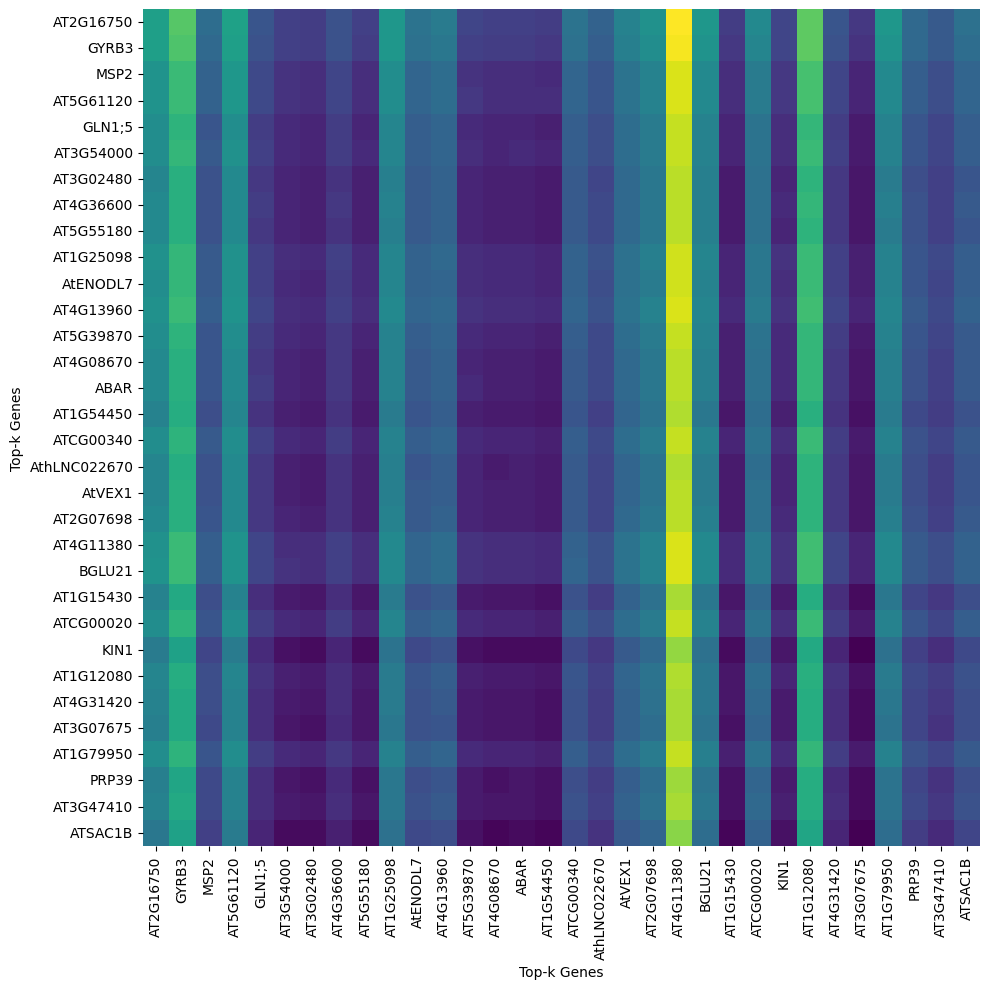

Attention scores heatmap for cell SRX20853656@@_GGGATGACATGCCGCA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853656@@_GGGATGACATGCCGCA-1.pdf
['AT3G14040', 'AT5G48545', 'AT5G61120', 'AT5G62850', 'AT3G28830', 'AthLNC010982', 'AT3G03490', 'AT4G13960', 'AT3G20865', 'AT4G22590', 'AT4G31420', 'AT1G69750', 'AT2G07560', 'AT3G28980', 'AT2G27050', 'AT1G66235', 'AT3G47410', 'AT1G12840', 'AT5G49900', 'AT5G05130', 'AT1G15430', 'AT1G48740', 'AT2G16586', 'AT3G22760', 'AT3G17410', 'AT4G30860', 'AT3G21320', 'AT1G20220', 'AthLNC022870', 'AT4G33270', 'AT3G07850', 'AT1G52300']


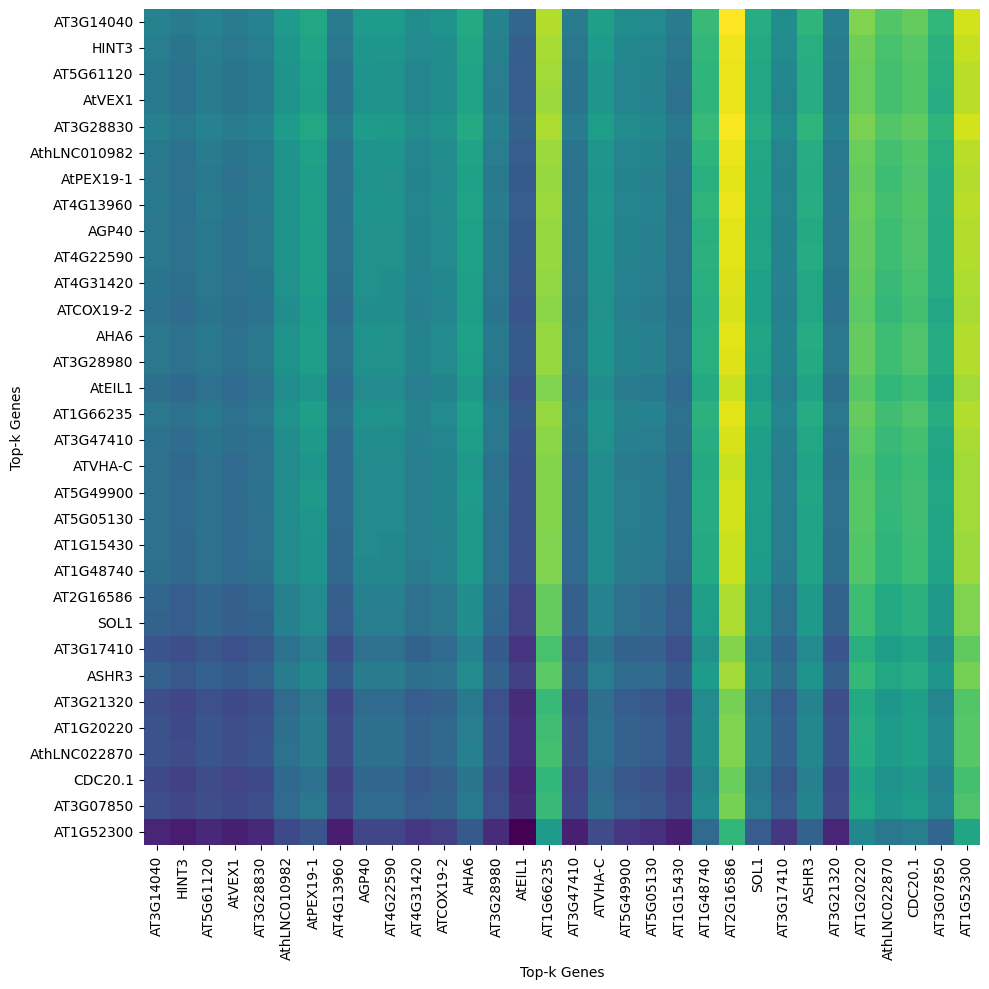

Attention scores heatmap for cell SRX20853656@@_GTTGAACCATGACGTT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853656@@_GTTGAACCATGACGTT-1.pdf
['AT4G16045', 'AT3G23530', 'AT4G26640', 'AT4G35010', 'ATCG00020', 'AT5G13840', 'AT2G07698', 'AT1G54450', 'AT2G29880', 'AT4G34060', 'AT3G22760', 'AT2G39705', 'AT2G37190', 'AT3G52920', 'AT4G33270', 'AT5G60250', 'AT1G72330', 'AT5G50830', 'AT3G61160', 'AT5G54095', 'AT1G12840', 'AT4G26260', 'AT5G53510', 'AT2G40850', 'AT1G08600', 'AT5G55930', 'AT4G34110', 'AT3G54800', 'AT1G30420', 'AT1G54560', 'AT3G15280', 'ATCG00170']


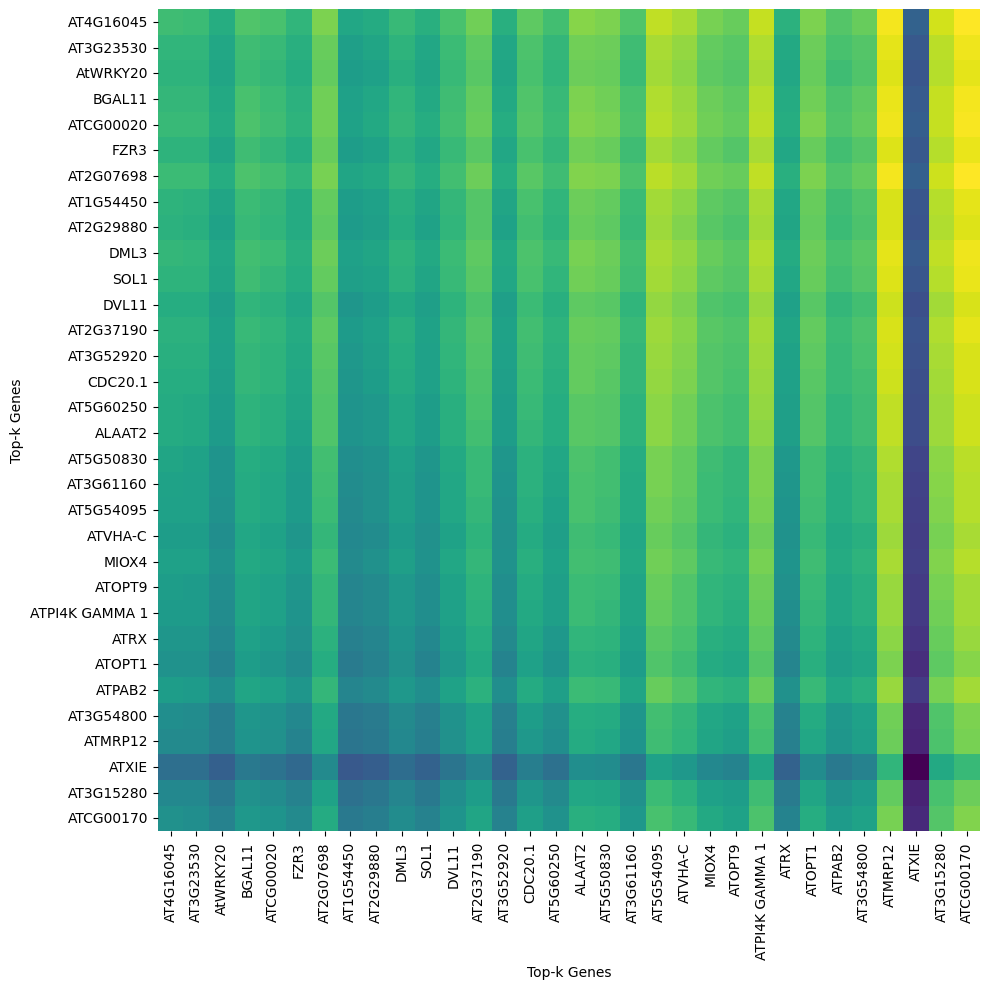

Attention scores heatmap for cell SRX20853656@@_TGTAACGAGAGGGCGA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853656@@_TGTAACGAGAGGGCGA-1.pdf
['AT5G58190', 'AT4G14780', 'AT2G36660', 'AT1G66235', 'AT3G20865', 'AT3G60245', 'AT1G12640', 'AT2G36390', 'AT1G77410', 'AT5G59480', 'AT4G28000', 'AT4G20260', 'AT1G77940', 'AT1G54240', 'AT2G06040', 'AT5G20710', 'AT1G76110', 'AT1G12840', 'AT5G46795', 'AT3G58160', 'AT5G38410', 'AT3G28790', 'AthLNC020490', 'AT5G49160', 'AT1G52300', 'AT1G03210', 'AT2G16750', 'AT4G31420', 'AT1G80660', 'AT3G28770', 'AT2G01008', 'AT5G60800']


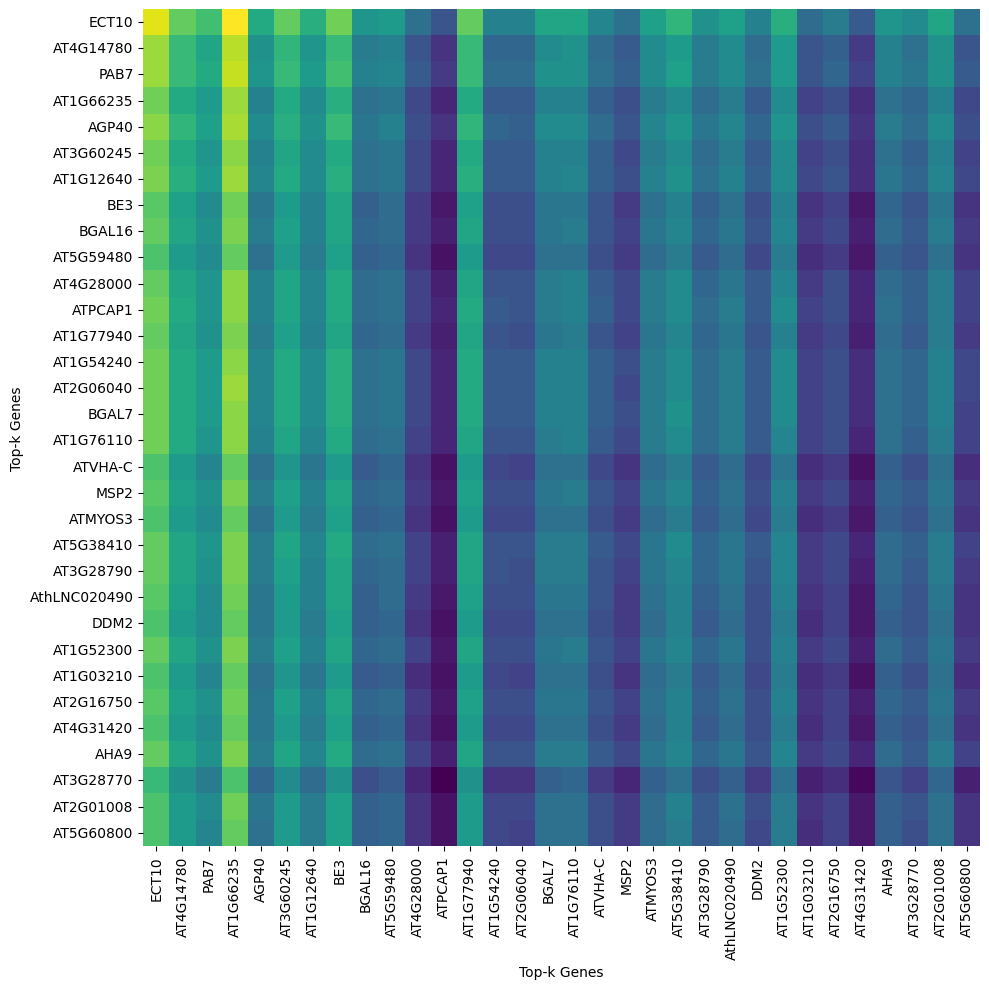

Attention scores heatmap for cell SRX20853656@@_GTTCCGTGTTCCTAGA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_GTTCCGTGTTCCTAGA-1.pdf
['AT3G28830', 'AT1G03240', 'AT5G55490', 'AT1G77210', 'AT2G16750', 'AT3G24640', 'AT3G20865', 'AT1G03210', 'AT1G15940', 'AthLNC005935', 'AT4G39260', 'AT1G52300', 'AT5G10950', 'AT1G69750', 'AT2G19110', 'AT2G45403', 'AT3G29770', 'AT5G24670', 'AT5G61700', 'AT2G16586', 'AT5G48600', 'AT1G71770', 'AT3G15280', 'AT1G79245', 'AT4G14315', 'AT1G03920', 'AT5G15140', 'AT2G39420', 'AT3G25840', 'AT5G16630', 'AT4G34110', 'AT1G19890']


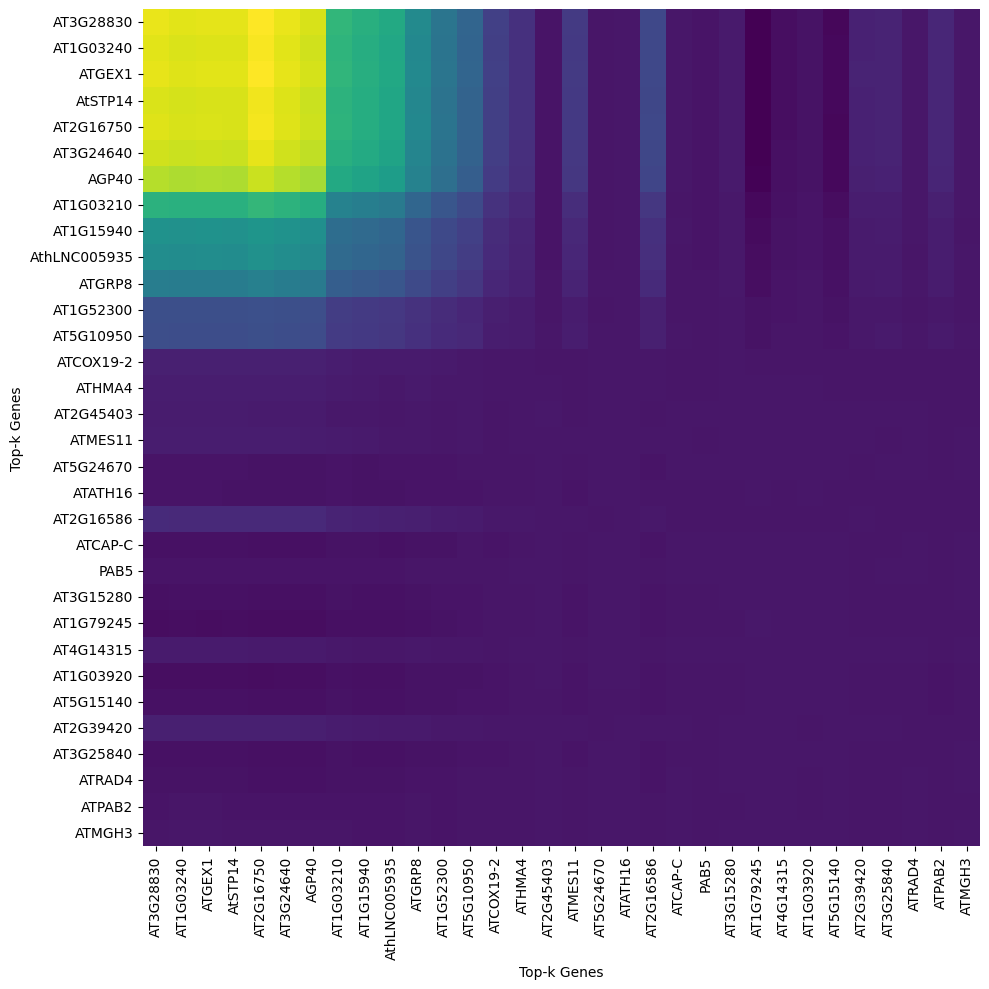

Attention scores heatmap for cell SRX20853656@@_CTCAGGGAGAGCAGAA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853656@@_CTCAGGGAGAGCAGAA-1.pdf
['AT1G77850', 'AT4G14780', 'AT2G19110', 'AT1G25098', 'AT3G42850', 'ATCG00800', 'AT4G39260', 'AT5G46795', 'AT5G38410', 'AT5G03620', 'AT5G02500', 'AT4G36860', 'AT3G30730', 'AT3G53350', 'AT2G16750', 'ATCG00470', 'AT1G34340', 'AT3G60245', 'AT4G20260', 'AT1G15200', 'AT1G48470', 'ATCG00040', 'AT3G20865', 'AT4G33270', 'AT3G47340', 'ATCG00680', 'AT2G21660', 'AT2G16586', 'AT4G31420', 'ATCG00340', 'AT5G20710', 'AT5G04110']


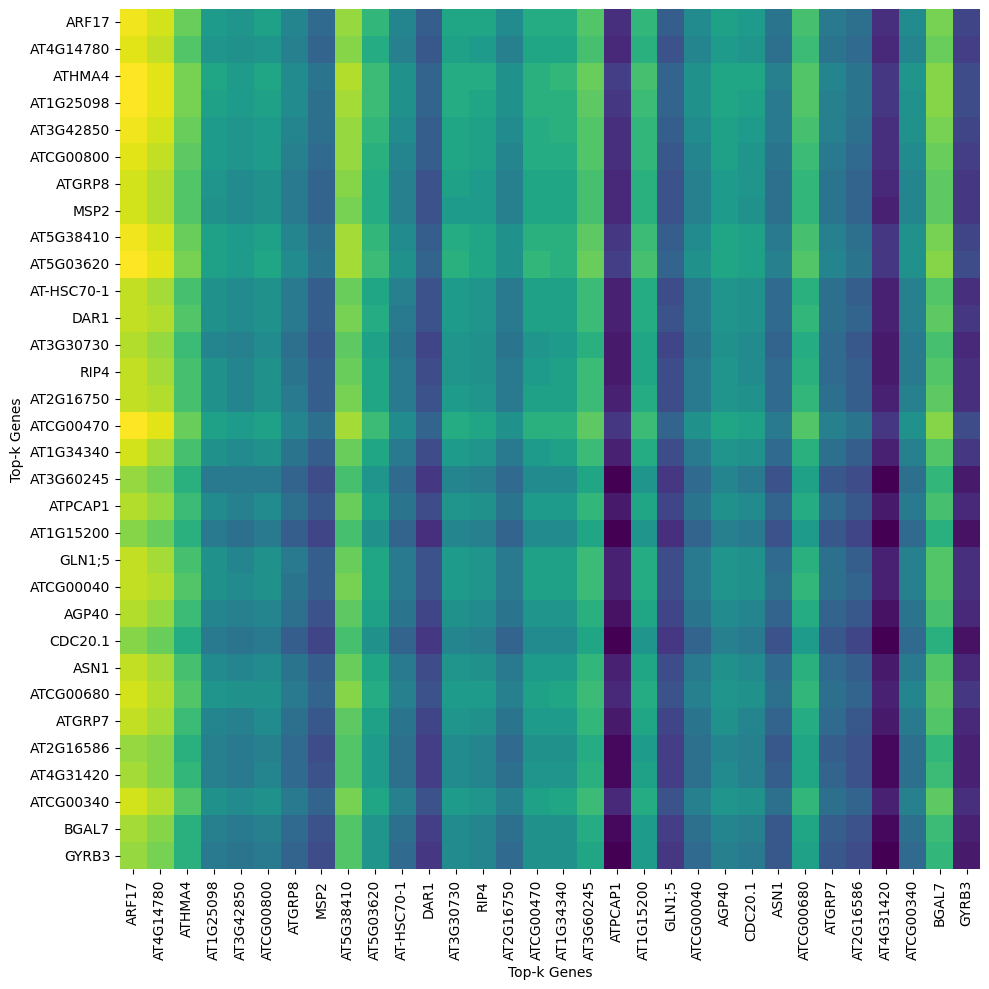

Attention scores heatmap for cell SRX20853656@@_GTCTACCAGCTGGCCT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_GTCTACCAGCTGGCCT-1.pdf
['AT2G34480', 'AT4G14780', 'AT5G25320', 'AT4G20260', 'AT4G28000', 'AT3G60245', 'AT2G29790', 'AT1G77940', 'AT1G15200', 'AT3G58160', 'AT5G58190', 'AT1G80660', 'AT1G34340', 'AT5G20710', 'AT1G65040', 'AT1G54240', 'AT5G03620', 'AT1G52300', 'AT1G69940', 'AT1G76110', 'AT4G39260', 'AT2G16750', 'AT1G77410', 'AT4G25950', 'AT2G37190', 'AT5G04110', 'AT2G07560', 'AT1G50310', 'AT1G20340', 'AT2G26610', 'AT4G38590', 'AT2G01008']


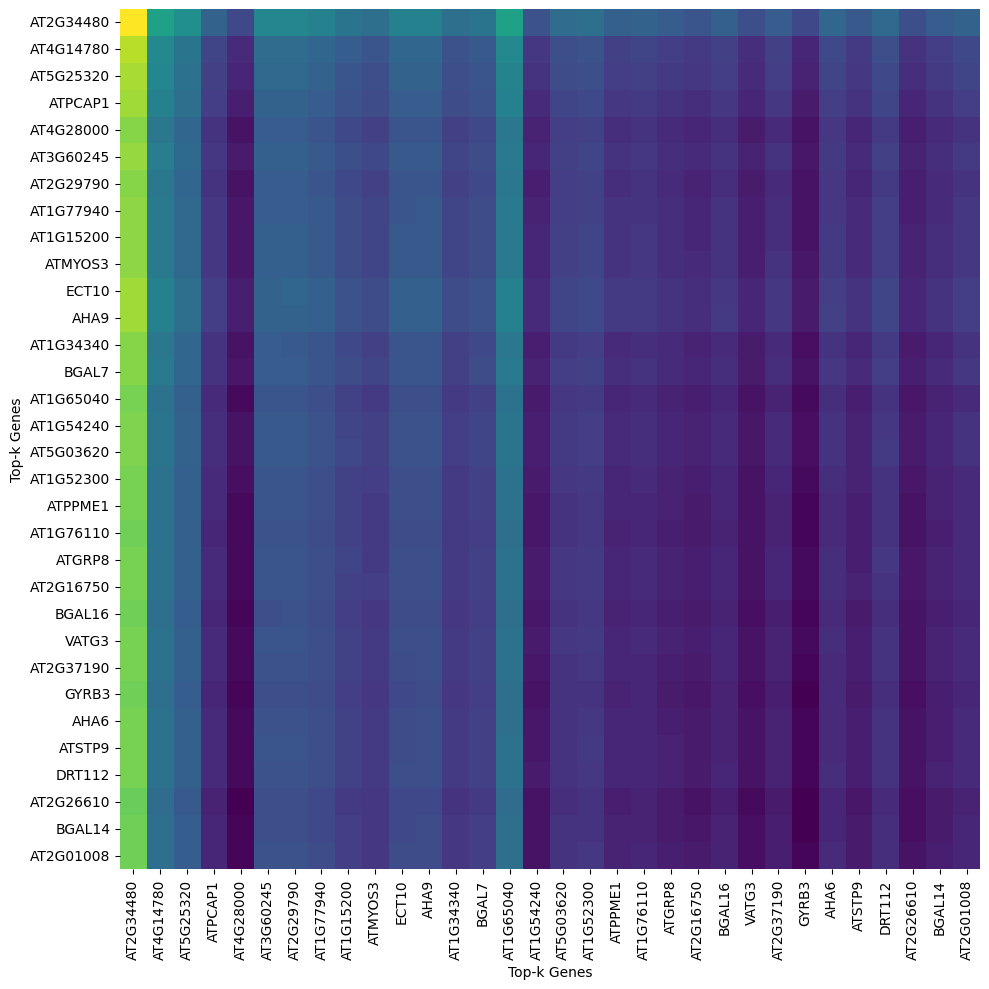

Attention scores heatmap for cell SRX20853656@@_TGCACGGAGTTCACTG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_TGCACGGAGTTCACTG-1.pdf
['AT1G01040', 'ATCG00040', 'AT1G48470', 'AT3G30720', 'AT5G03620', 'ATCG00020', 'AT2G07698', 'AT5G38760', 'AT5G17500', 'AT3G14040', 'AT5G04110', 'AT4G25950', 'AT5G07410', 'AT2G16750', 'AT3G28820', 'AT3G11410', 'AT4G39260', 'AT4G39670', 'AT3G20865', 'AT4G33270', 'AT3G28980', 'AT4G11380', 'AT5G15070', 'AT3G22760', 'AT3G50310', 'AT3G28830', 'AT1G75950', 'AT2G39300', 'AT5G46250', 'AT5G16100', 'AT4G22590', 'AT4G11030']


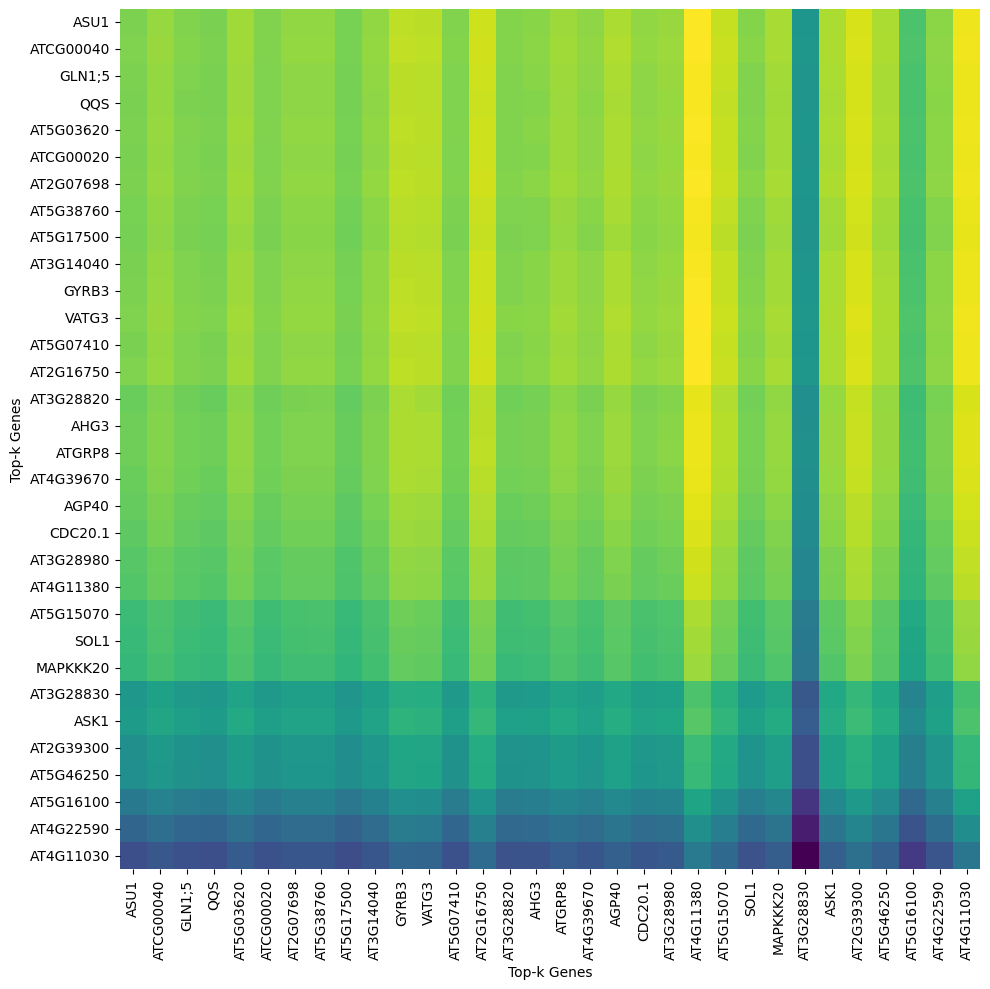

Attention scores heatmap for cell SRX20853658@@_AGCCAATTCCTACGAA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853658@@_AGCCAATTCCTACGAA-1.pdf
['AT2G07698', 'AT4G26630', 'ATCG00040', 'AT2G26610', 'AT1G25098', 'AT1G79800', 'AT5G61120', 'AT2G16750', 'AT5G01760', 'AT3G02480', 'AT5G39870', 'AT4G13960', 'AT5G53460', 'AT4G08670', 'AT3G14040', 'AT2G39705', 'AT5G66020', 'AT4G13230', 'AT3G47410', 'AT1G03210', 'ATCG00800', 'AT5G17500', 'AT2G21660', 'AT4G39260', 'AT1G69750', 'AT5G39650', 'AT3G11410', 'AT4G22590', 'AT5G02500', 'AT5G04990', 'AT3G28820', 'AT5G53820']


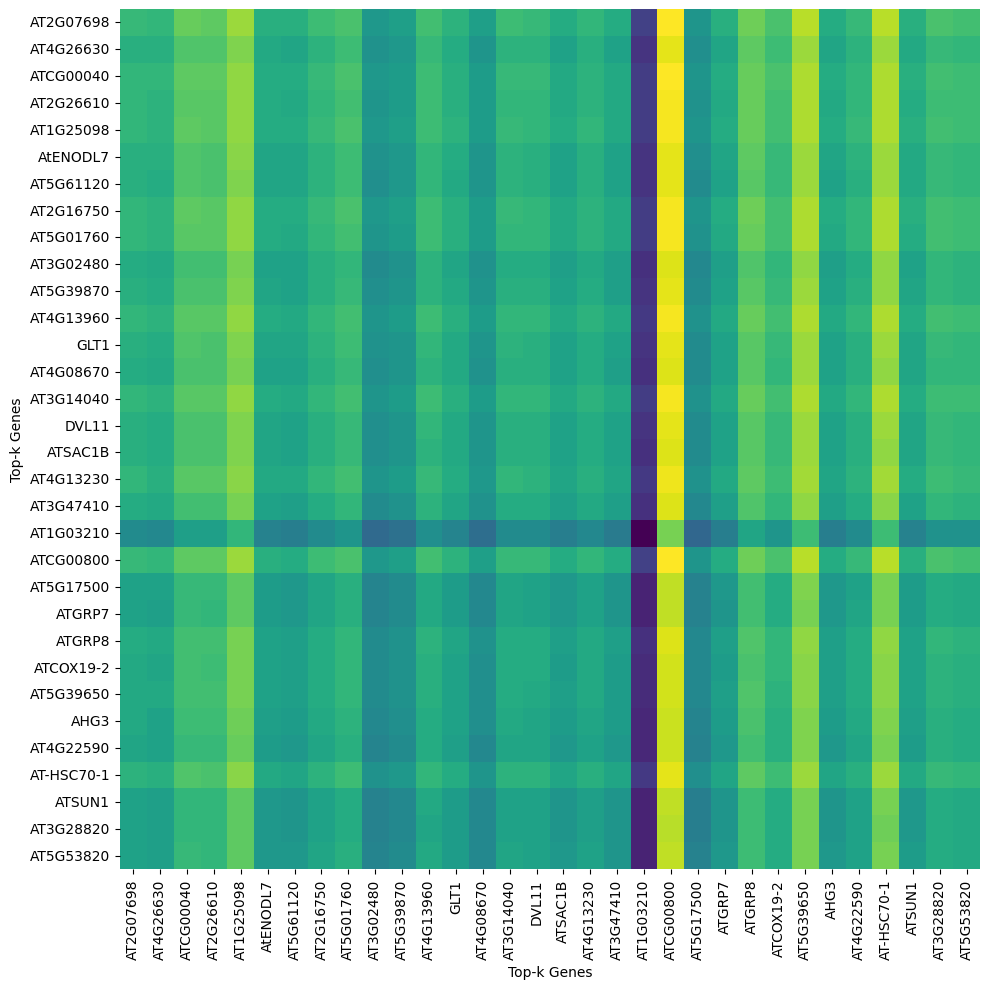

Attention scores heatmap for cell SRX20853656@@_TTACCATGTAACAGGC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853656@@_TTACCATGTAACAGGC-1.pdf
['AT3G20865', 'AT4G20260', 'AT3G16380', 'AT5G40600', 'AT4G39260', 'AT1G54240', 'AT1G01320', 'AT5G53440', 'AT2G36660', 'AT2G06040', 'AT4G28000', 'AT5G38410', 'AT5G04110', 'ATCG01130', 'AT5G60800', 'AT5G23160', 'AT4G31420', 'AT5G02270', 'AT2G16940', 'AT1G79950', 'AT1G07210', 'AT5G04990', 'AT1G64090', 'AT1G31970', 'AT1G54450', 'AT4G39230', 'AT1G77410', 'AT4G38940', 'AT1G76110', 'AT5G49900', 'AT3G28790', 'AT5G59480']


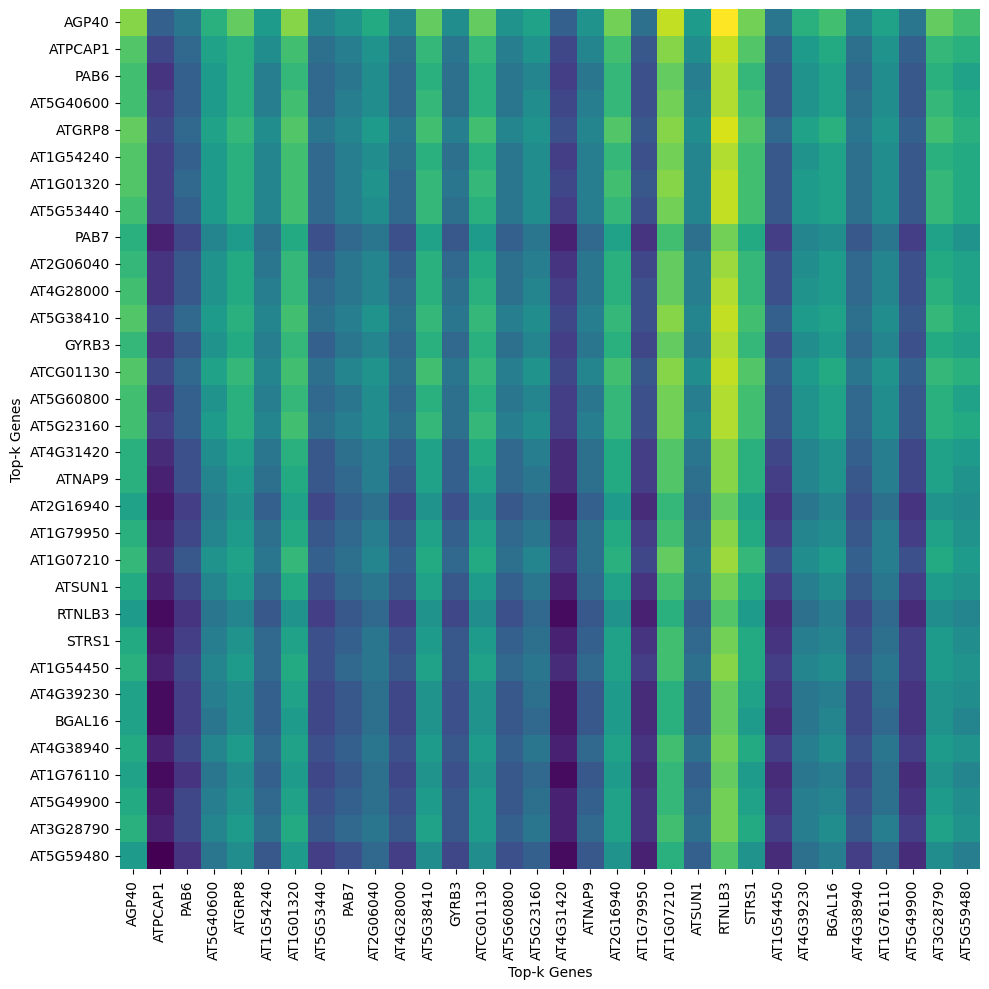

Attention scores heatmap for cell SRX20853658@@_CAACAACCACTGTCCT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_CAACAACCACTGTCCT-1.pdf
['AT2G26610', 'AT4G08670', 'AT3G02480', 'AT5G38760', 'AT3G14040', 'AT5G53820', 'AT1G04080', 'AT5G39650', 'AT3G23300', 'AT1G48740', 'AT3G20865', 'AT5G15070', 'AT2G21660', 'AT4G13940', 'AthLNC014030', 'AT5G40260', 'AT4G33270', 'AT3G22760', 'AT1G80930', 'AT2G46170', 'AT3G50310', 'AT1G66235', 'AT1G52680', 'AT5G46250', 'AT1G15800', 'AT3G23810', 'AT3G20770', 'AT1G25470', 'AT5G04110', 'AT2G47730', 'AT5G07410', 'AT2G31902']


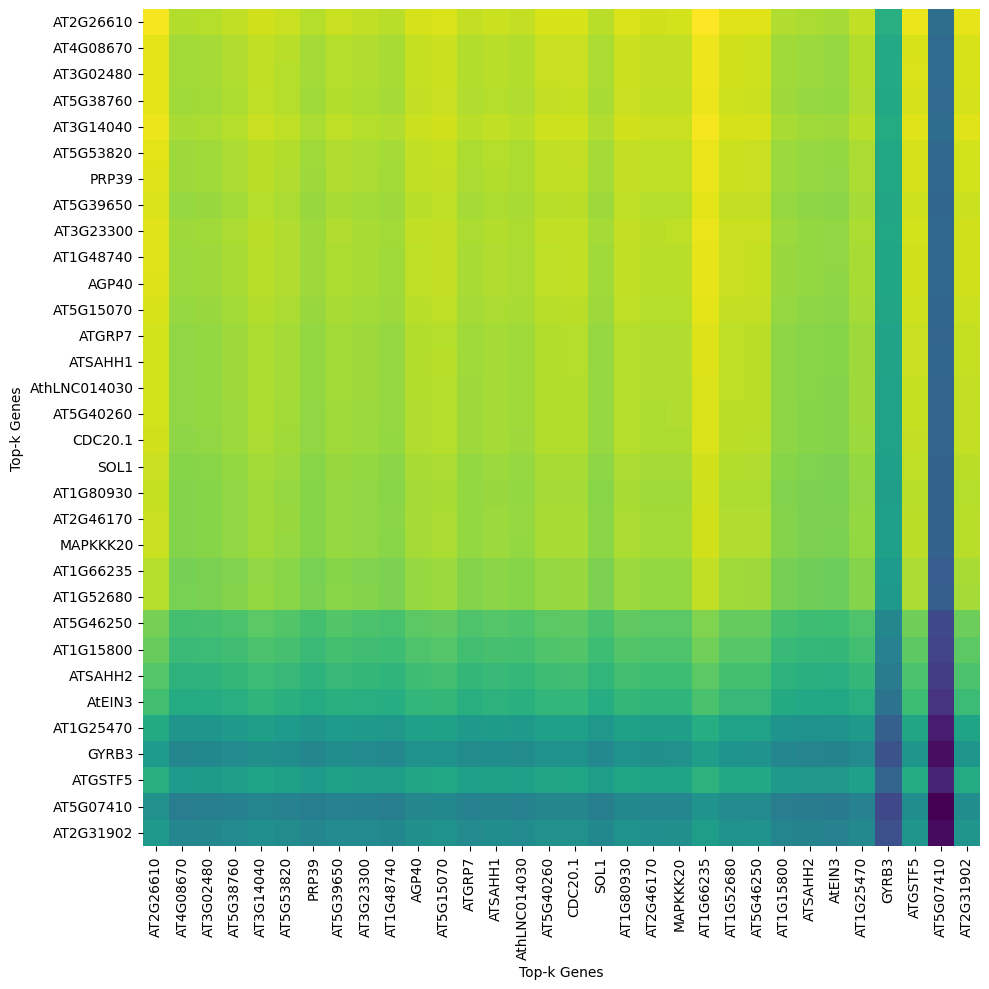

Attention scores heatmap for cell SRX20853658@@_GCCAGCATCTAGCCAA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853658@@_GCCAGCATCTAGCCAA-1.pdf
['AT3G27060', 'AT4G17390', 'AT3G16380', 'AT5G07410', 'AT2G36660', 'AT4G31420', 'AT3G14040', 'AT1G07210', 'AT2G16586', 'AT1G22760', 'AT1G12640', 'AT1G52300', 'AT2G31270', 'AT3G07030', 'AT1G01320', 'AT5G61170', 'AT1G79950', 'AT1G69750', 'AT5G49900', 'AT5G59480', 'AT1G64610', 'AT5G18620', 'AT1G75950', 'AT3G04620', 'AT2G27120', 'AT3G28830', 'AT4G38940', 'AT3G03490', 'AT4G04980', 'AT3G25585', 'AT3G27930', 'AT3G22760']


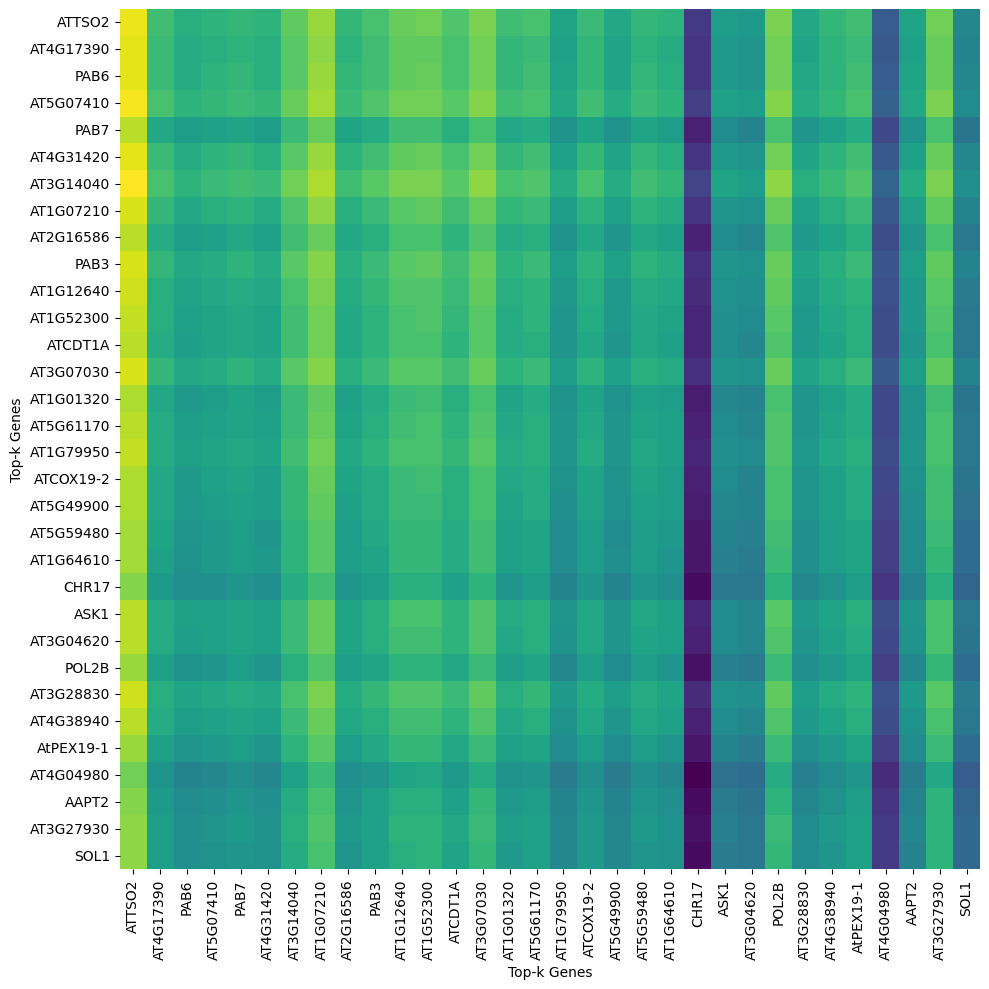

Attention scores heatmap for cell SRX20853658@@_CACCGTTAGCTATCCA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_CACCGTTAGCTATCCA-1.pdf
['AT2G04880', 'AT2G34480', 'AT1G31970', 'AT2G22795', 'AT1G80660', 'AT5G04110', 'AT1G07820', 'AT5G50830', 'AT5G54095', 'AT5G15200', 'AT3G17760', 'AT5G59690', 'AT1G65730', 'AT1G11650', 'AT2G19110', 'AT1G77940', 'AT4G35010', 'AthLNC005935', 'AT5G60800', 'AT2G19860', 'AT2G16750', 'AT5G03620', 'AT5G15190', 'AT2G16940', 'AT1G15200', 'AT4G27090', 'AT1G65040', 'AT3G12470', 'AT1G09690', 'AT5G24670', 'AT2G01008', 'AT1G05580']


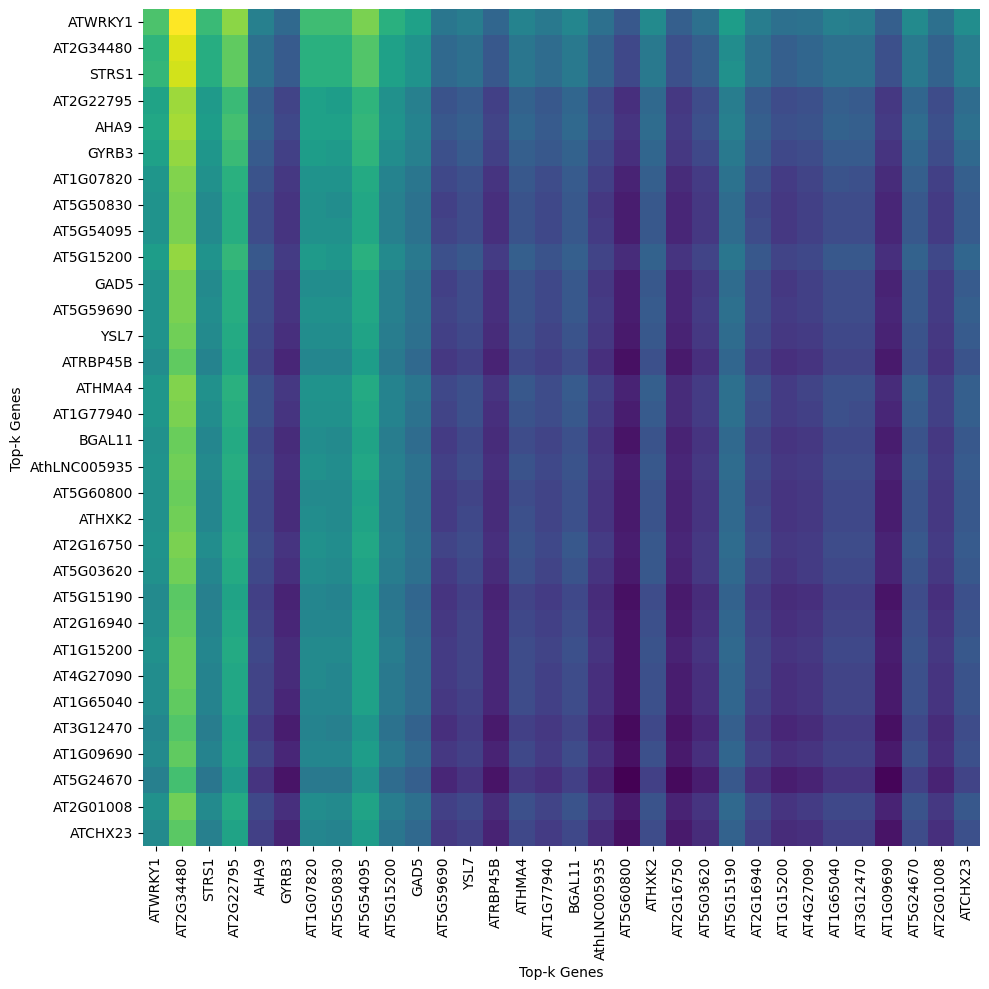

Attention scores heatmap for cell SRX20853656@@_CAATCGAGTGTGTCGC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_CAATCGAGTGTGTCGC-1.pdf
['AT4G13230', 'AthLNC022670', 'AT2G26610', 'AT3G02480', 'AT2G07698', 'AT5G01760', 'AT1G14750', 'AT4G26640', 'AT2G39705', 'AT2G21660', 'ATCG00020', 'AT2G45403', 'AT5G07410', 'AT2G16750', 'AT1G73860', 'AT4G34060', 'AT1G04080', 'AT3G07675', 'AT3G28830', 'AT4G04980', 'AT2G45405', 'AT3G53650', 'AT2G24650', 'AT3G21320', 'AT3G20865', 'AT3G24640', 'AT3G14040', 'AT1G52300', 'AthLNC022870', 'AT4G22590', 'AT3G28980', 'AT3G01270']


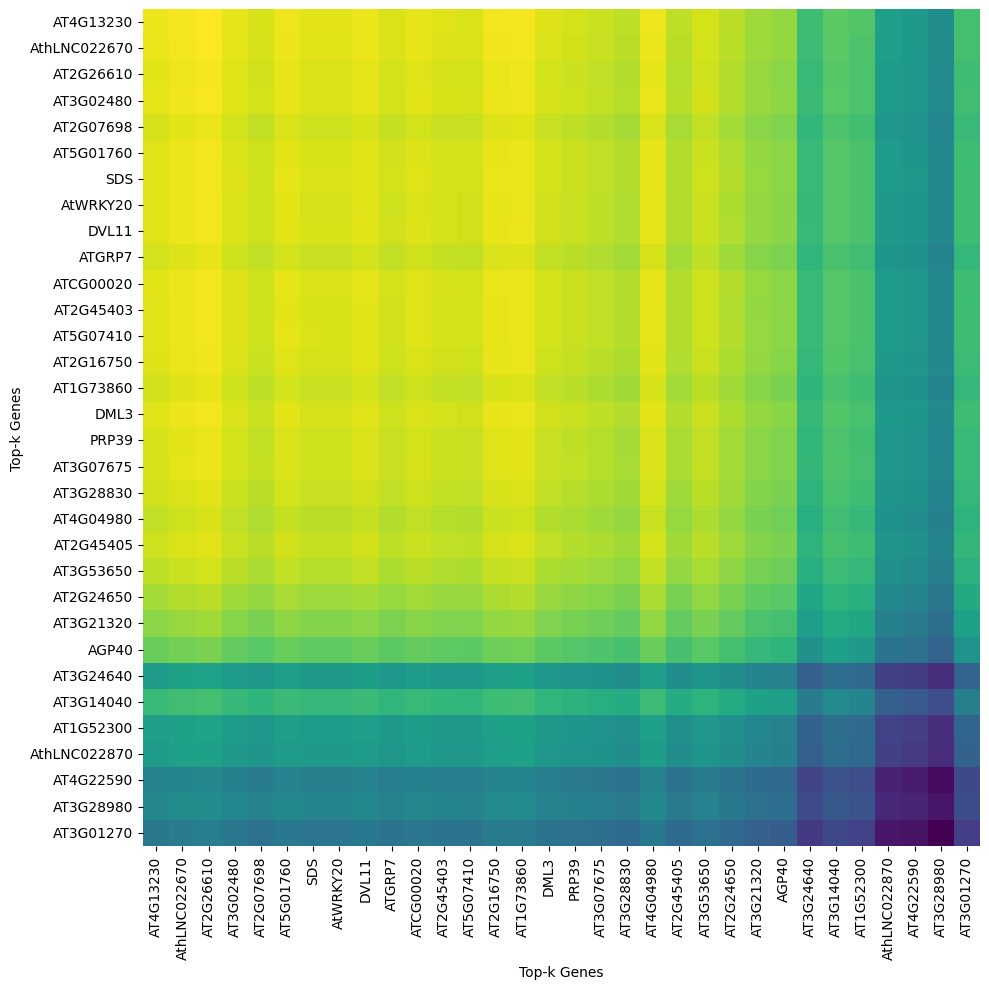

Attention scores heatmap for cell SRX20853656@@_ATCGGCGAGATCGCCC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_ATCGGCGAGATCGCCC-1.pdf
['AT4G38590', 'AT4G35010', 'AT3G08800', 'AT5G54095', 'AT4G33260', 'AT1G05580', 'AthLNC022670', 'AT4G26640', 'AT3G47410', 'AT5G10400', 'AT1G28620', 'AT5G53460', 'AT2G33420', 'AT5G50830', 'AT2G29880', 'AT1G64610', 'AthLNC005935', 'AT3G52920', 'AT3G61160', 'AT3G42640', 'AT2G21660', 'AT3G21945', 'AthLNC024348', 'AT3G47440', 'AT3G15280', 'AT5G02500', 'AT1G04080', 'AT1G58120', 'AT4G20160', 'AT4G33270', 'AT4G26260', 'AT1G08600']


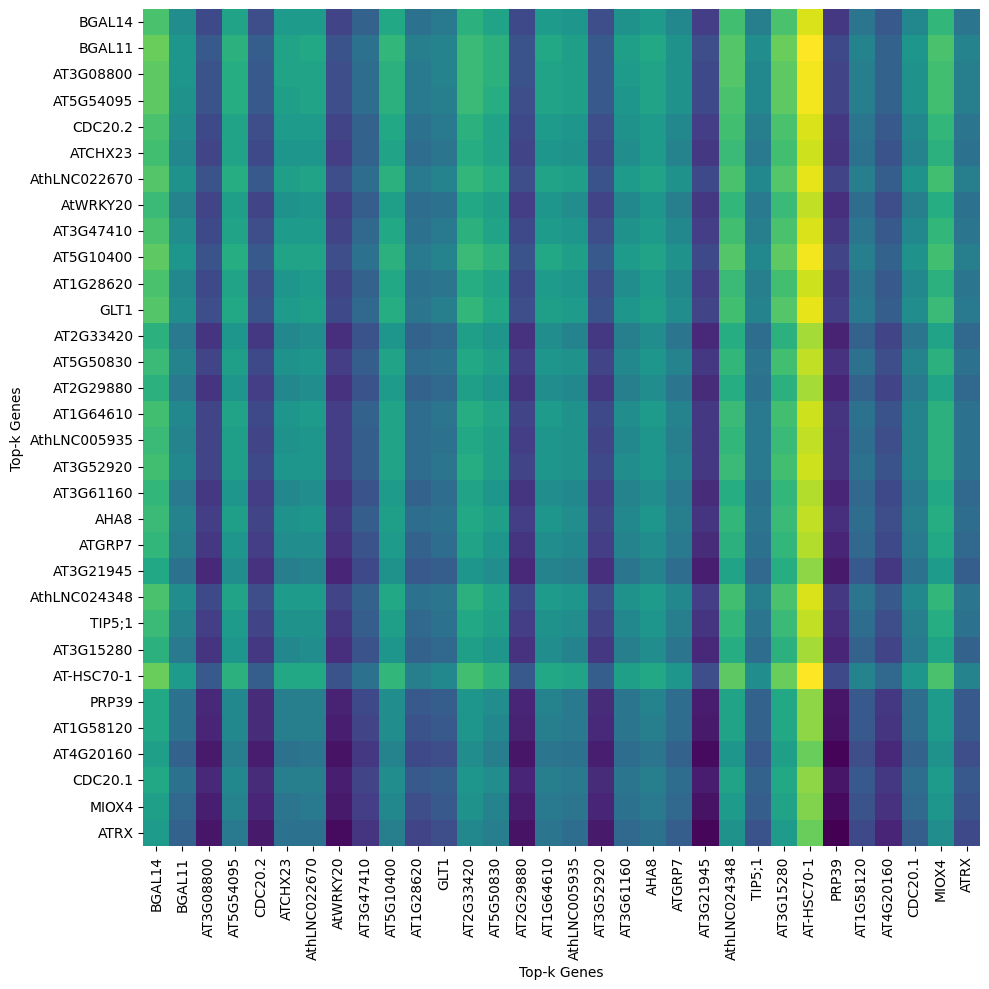

Attention scores heatmap for cell SRX20853656@@_CTCGAGGAGGTTGAGC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853656@@_CTCGAGGAGGTTGAGC-1.pdf
['AT4G11380', 'AT5G49150', 'AT1G31970', 'AT3G20865', 'AT4G14780', 'AT5G59690', 'AT2G36660', 'AT1G64090', 'AT2G06040', 'AT1G54240', 'AT5G03620', 'AT1G77410', 'AT4G31420', 'AT5G04110', 'AT1G69940', 'AT1G52680', 'AT5G53820', 'AT1G77940', 'AT5G60800', 'AT3G25495', 'AT5G38760', 'AT2G31270', 'AT1G13440', 'AT3G09390', 'ATCG01130', 'AT2G16586', 'AT3G60245', 'AT1G07210', 'AT1G76110', 'AT5G38410', 'AT1G76780', 'AT1G12840']


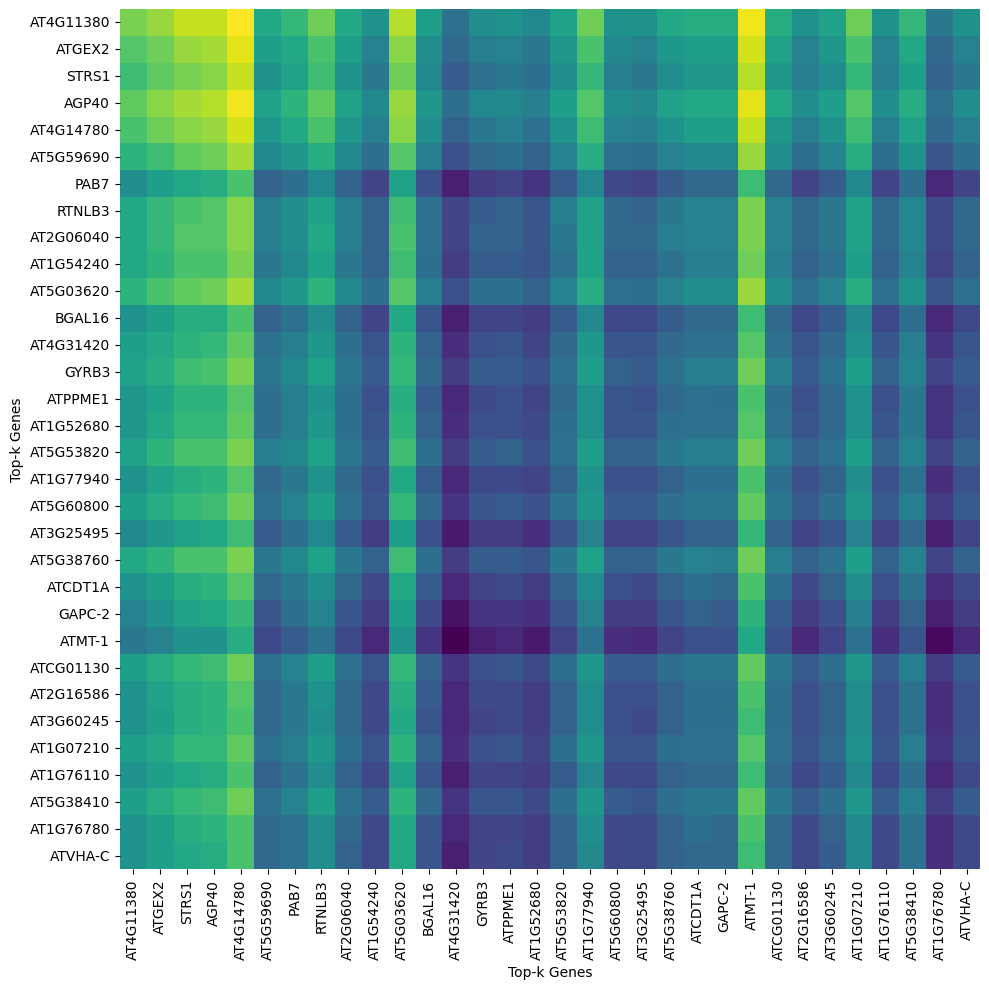

Attention scores heatmap for cell SRX20853658@@_TGTTACTCACAAATAG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_TGTTACTCACAAATAG-1.pdf
['AT1G48470', 'AT5G02500', 'AT2G16586', 'AT4G18920', 'AT5G19600', 'AT2G21660', 'AT5G53460', 'AT4G38590', 'AT4G20260', 'AT4G26630', 'AT4G36860', 'AT4G36520', 'AT3G23530', 'AT4G31570', 'AT4G26640', 'AT2G34300', 'AT4G34060', 'AT3G08800', 'AT3G28830', 'AT1G69770', 'AT3G22760', 'AT5G16100', 'AT3G01270', 'AT2G29880', 'AthLNC005935', 'AT4G05710', 'AT5G55490', 'AT5G49900', 'AT1G04080', 'AT5G59810', 'AT1G68610', 'AT1G20220']


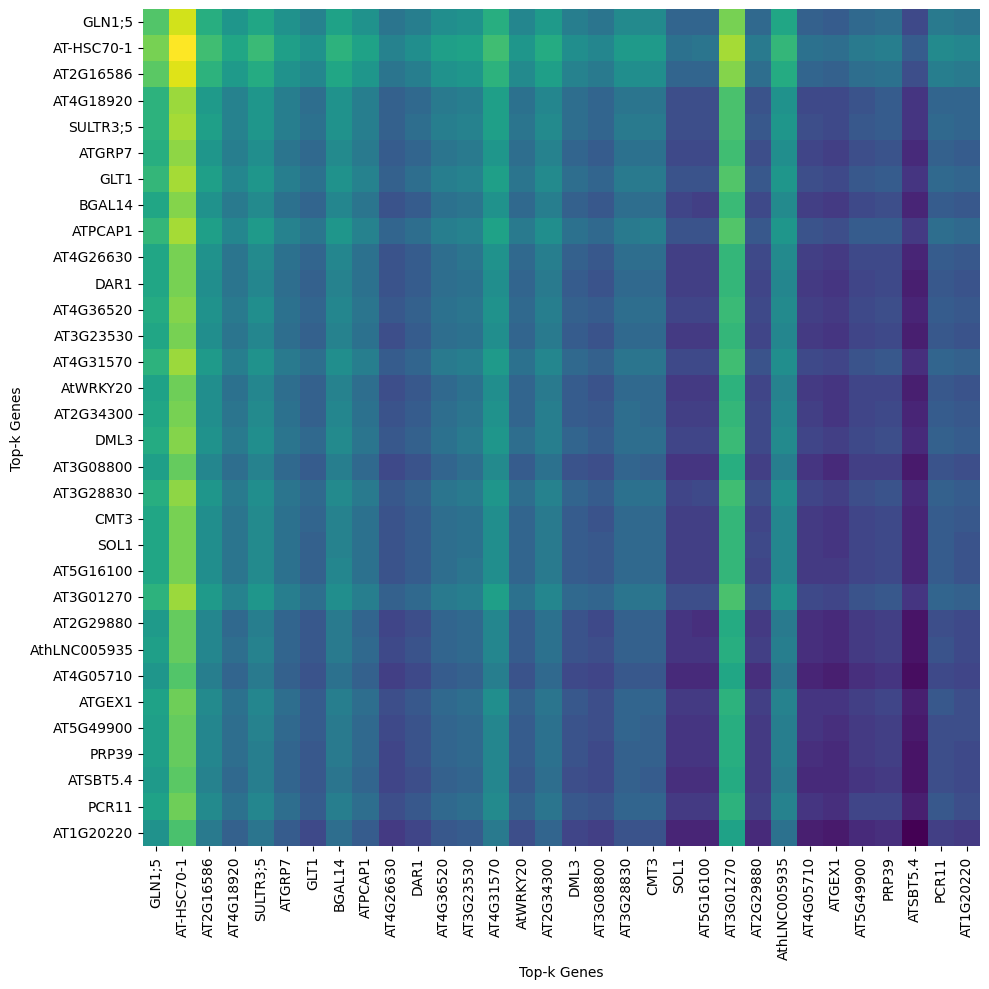

Attention scores heatmap for cell SRX20853656@@_TTGGATGCAGGCTATT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_TTGGATGCAGGCTATT-1.pdf
['AT1G31970', 'AT2G36660', 'AT4G16720', 'AT2G37190', 'AT3G20865', 'AT5G59690', 'AT5G02490', 'AT1G77940', 'AT4G39260', 'AT2G06040', 'AT3G16380', 'AT3G07030', 'AT4G20160', 'AT1G64110', 'AT4G27090', 'AT1G01320', 'AT1G67120', 'AT5G60800', 'AT1G52300', 'AT1G11650', 'AT1G43170', 'AT5G07410', 'AT1G64090', 'AT5G53820', 'AT1G19890', 'AT1G11510', 'AT1G76110', 'AT5G60250', 'AT1G80660', 'AT5G18620', 'AT2G07698', 'AT4G31420']


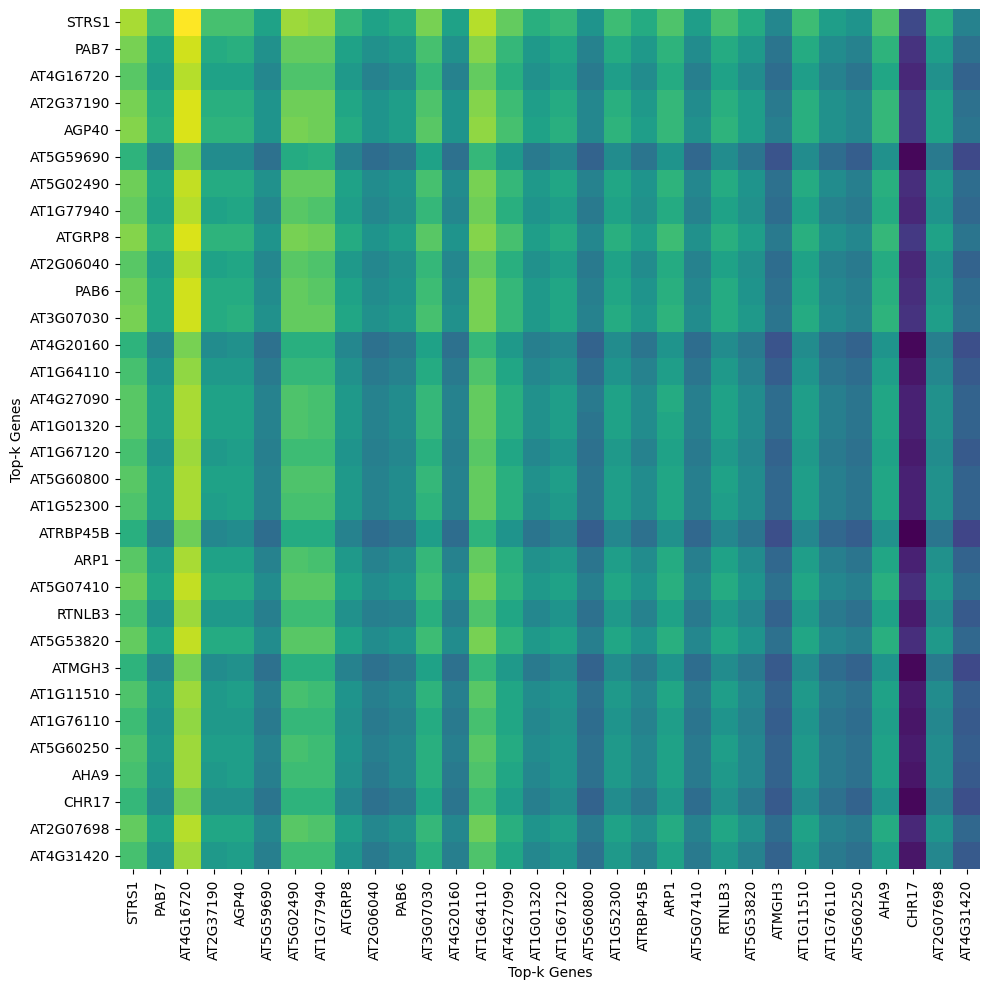

Attention scores heatmap for cell SRX20853658@@_CGGCAGTAGGAGCTGT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_CGGCAGTAGGAGCTGT-1.pdf
['AT1G61340', 'AT1G48470', 'AT1G01040', 'AT4G39230', 'AT3G23810', 'AT5G02270', 'AT3G02480', 'AT5G62850', 'AT5G17920', 'AT2G19860', 'AT4G26630', 'AT4G36600', 'AT1G29010', 'AT1G80930', 'AT2G34300', 'AT1G54450', 'AT2G07698', 'AT3G28820', 'AT5G54095', 'AT3G53350', 'AT2G29880', 'AT5G53460', 'AT4G22590', 'AT4G11760', 'AT2G31902', 'AT5G42020', 'AT3G23300', 'AT3G08800', 'AT2G46830', 'AT1G79950', 'AT2G24650', 'AT1G04080']


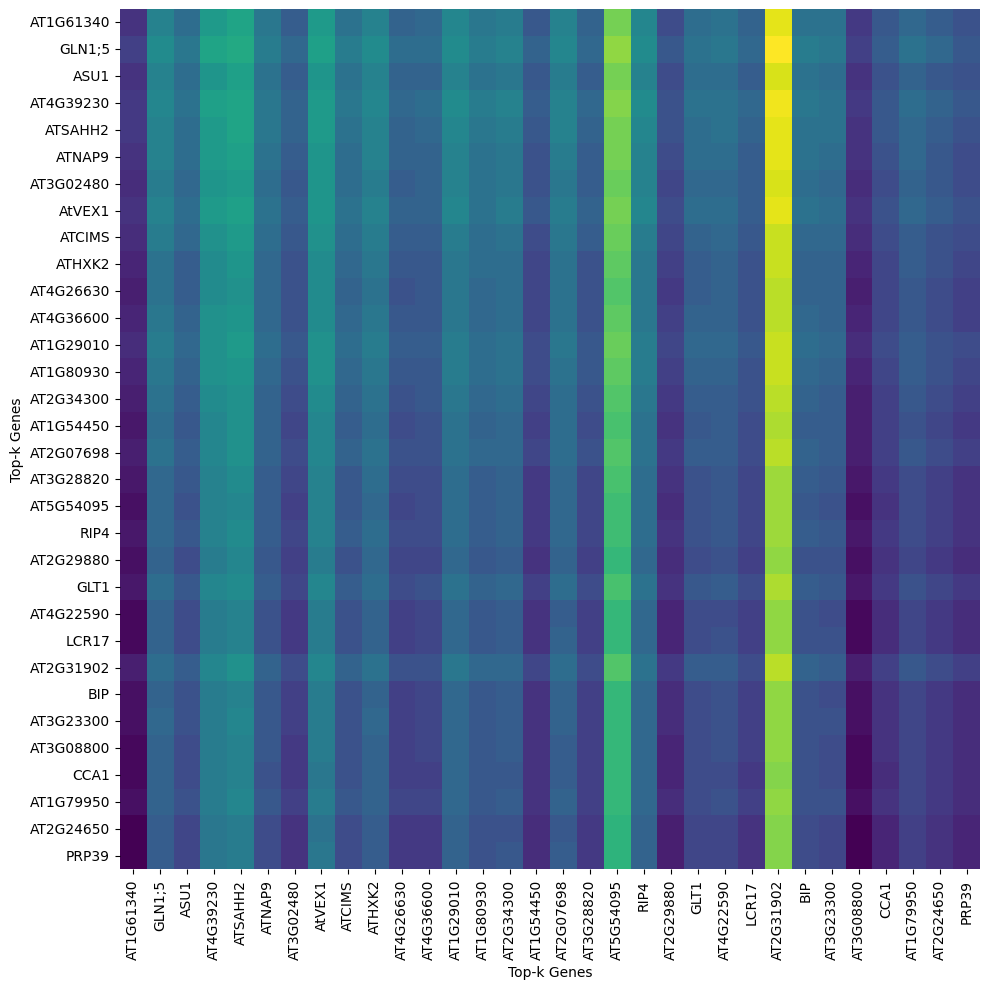

Attention scores heatmap for cell SRX20853658@@_CCTCAGTTCTGCGGGT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_late_bi_heatmap_output_SRX20853658@@_CCTCAGTTCTGCGGGT-1.pdf
['AT1G01040', 'AT1G77850', 'AT3G23810', 'AT4G08580', 'AT1G80930', 'AT2G39300', 'AT4G26630', 'AT3G25495', 'AthLNC022670', 'AT1G05580', 'AT5G12960', 'AT5G54095', 'AT4G11280', 'AT2G05642', 'AT1G76010', 'AT1G25470', 'AT4G11760', 'AT4G35010', 'AT1G20220', 'AT1G79800', 'AT2G37190', 'AT2G29880', 'AT1G52680', 'AT5G50830', 'AT1G60240', 'AT1G68610', 'AT1G79950', 'AT1G58120', 'AT3G61160', 'AT3G52920', 'AT2G07698', 'AT4G22590']


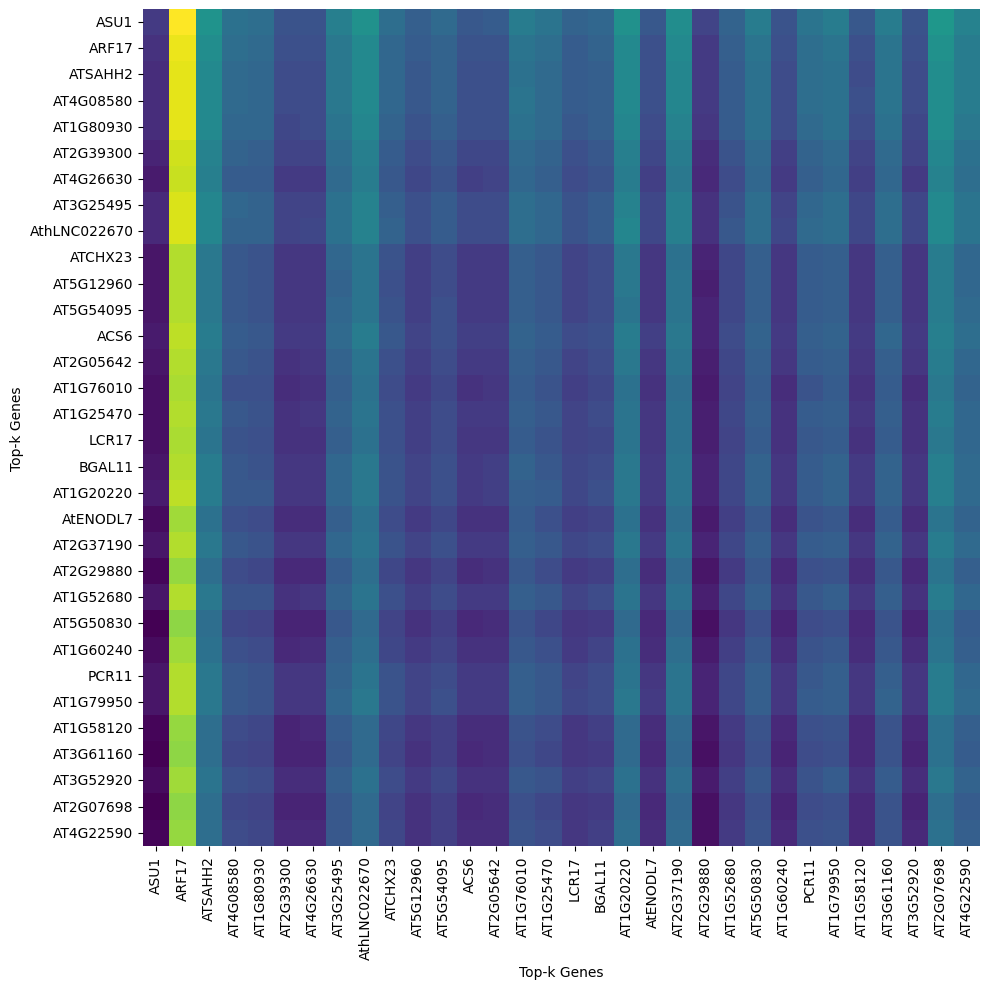

Attention scores heatmap for cell SRX20853658@@_AATCGACGTCGTGTTA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853658@@_AATCGACGTCGTGTTA-1.pdf
['AT3G30720', 'ATCG00040', 'AT3G42850', 'AT5G39870', 'AT1G16380', 'AT1G48470', 'AT4G13960', 'AT1G25098', 'AT1G61340', 'AT4G36600', 'AT5G34780', 'AT5G62850', 'AT4G34060', 'AT1G79800', 'AT5G17500', 'AT4G05710', 'AT2G19860', 'AT3G07675', 'AT1G04080', 'AT3G28820', 'AT1G66270', 'AT2G39705', 'AT2G21660', 'ATCG00470', 'AT5G53460', 'AT1G29930', 'AT5G02500', 'AT3G52920', 'AT5G01690', 'AT4G39260', 'AthLNC024348', 'AT2G07698']


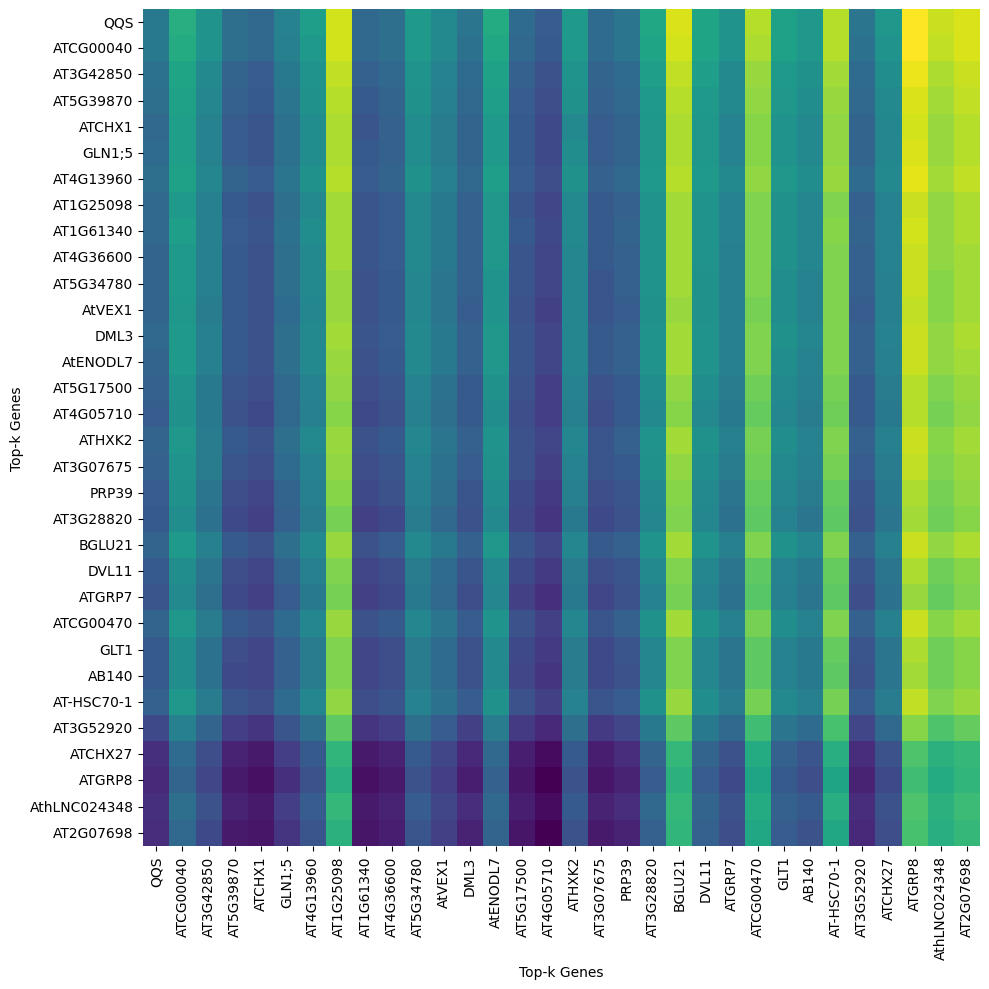

Attention scores heatmap for cell SRX20853656@@_GAATAGAAGTGGTTAA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_tri_heatmap_output_SRX20853656@@_GAATAGAAGTGGTTAA-1.pdf
['AT3G30720', 'AT5G53460', 'AT4G39260', 'AT4G04450', 'AT1G79950', 'AT5G07410', 'AT4G08670', 'AT5G17500', 'AT5G16100', 'AT3G14040', 'AT1G77210', 'AT5G59480', 'AT2G01830', 'AT5G18620', 'AT5G59690', 'AT4G26960', 'AT4G22590', 'AT3G20770', 'AT3G28830', 'AT1G22760', 'AT2G16586', 'AT4G37280', 'AT2G35880', 'AT2G07698', 'AT4G21895', 'AT4G26190', 'AT2G28680', 'AT3G20865', 'AT2G47730', 'AT5G60800', 'AT1G75870', 'AT2G26610']


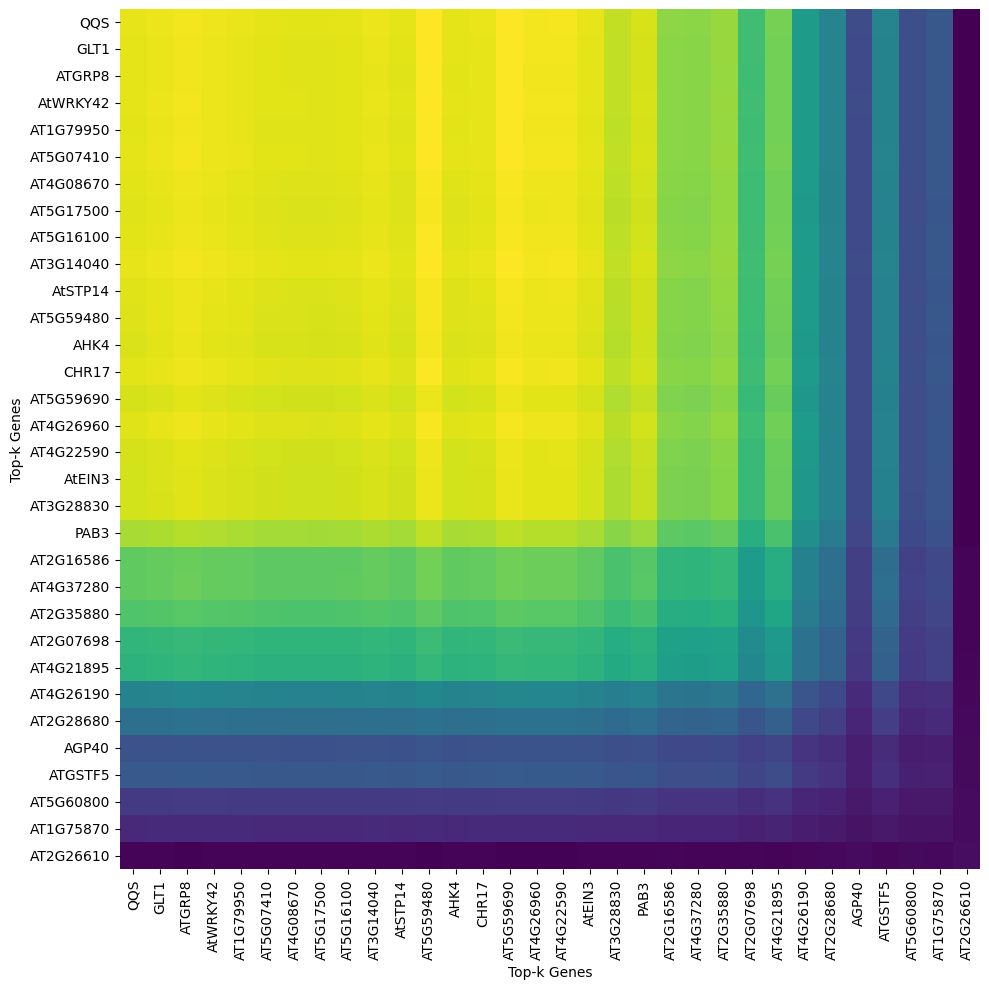

Attention scores heatmap for cell SRX20853656@@_GTAGTACTCGGATTAC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853656@@_GTAGTACTCGGATTAC-1.pdf
['AT2G36660', 'AT2G34480', 'AT1G50310', 'AthLNC005935', 'AT3G20865', 'AT5G25980', 'AT1G11650', 'AT2G16750', 'AT5G55930', 'AT2G06040', 'AT3G16380', 'AT1G69940', 'AT4G25950', 'ATCG00740', 'AT1G52300', 'AT5G20290', 'AT1G12840', 'AT3G42850', 'AT4G08590', 'AT3G01270', 'AT1G48750', 'AT3G28770', 'AT5G24780', 'AT1G75950', 'AT1G76110', 'AT5G02500', 'AT1G48920', 'AT5G53820', 'AT4G13230', 'AT3G28790', 'AT1G11510', 'AT5G59480']


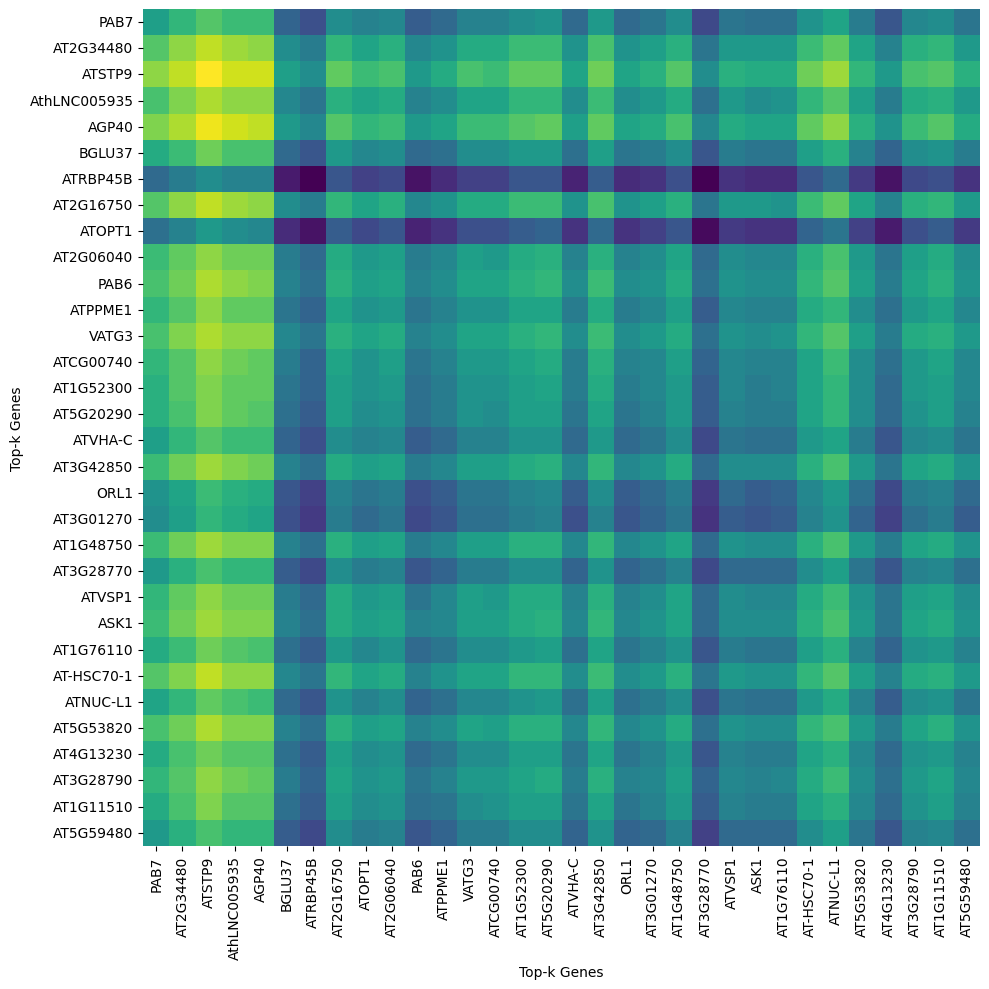

Attention scores heatmap for cell SRX20853656@@_GAGAGGTAGGACGGAG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_GAGAGGTAGGACGGAG-1.pdf
['AT2G21660', 'AT4G39260', 'AT5G61120', 'AT1G52300', 'AT2G07698', 'AT2G47730', 'AthLNC016466', 'AT5G38760', 'AT3G01270', 'AT4G13230', 'AT5G64480', 'AT2G16586', 'AT5G17920', 'AT5G05130', 'AT1G20920', 'AthLNC024348', 'AT1G60410', 'AT3G14040', 'AT5G07410', 'AT3G28830', 'AT3G13400', 'AT2G32700', 'AT5G12280', 'AT2G01830', 'AT5G04110', 'AT3G07675', 'AT1G77210', 'AT3G07820', 'AT5G10950', 'AT3G25495', 'AT4G35010', 'AT3G12510']


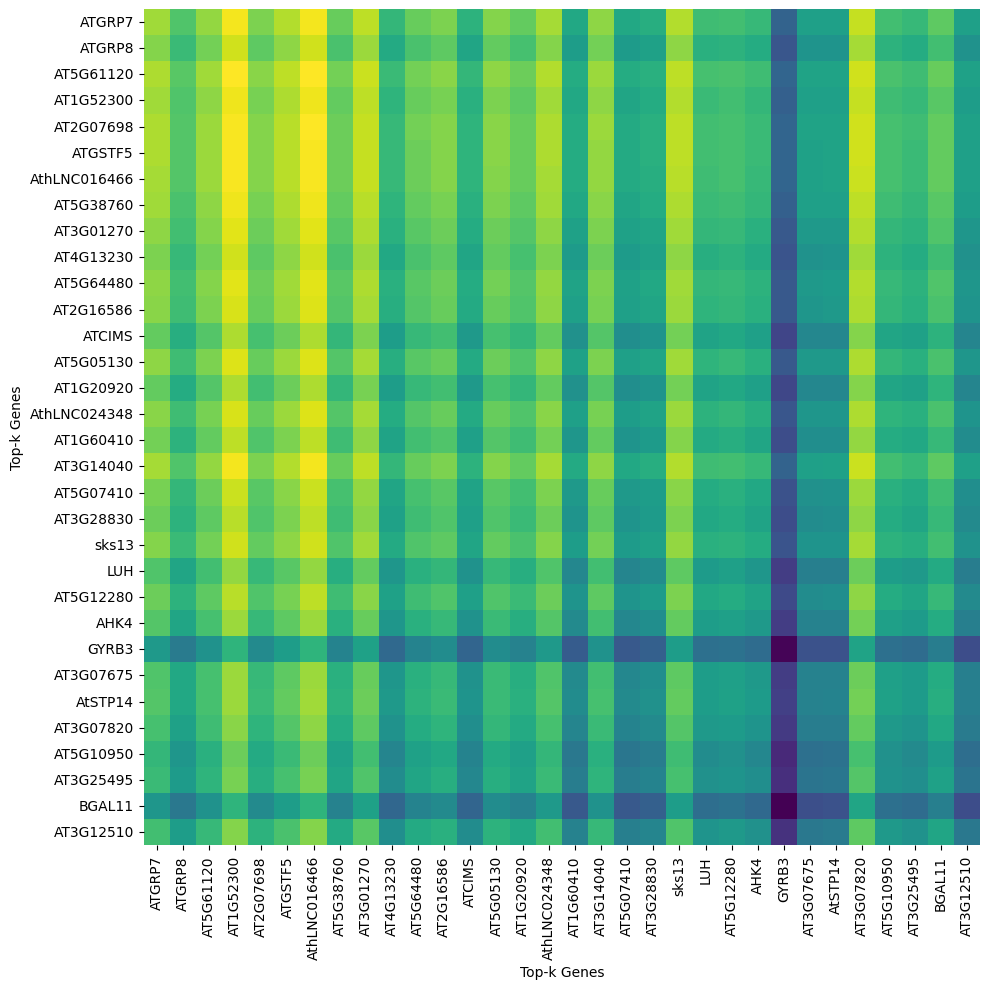

Attention scores heatmap for cell SRX20853658@@_CCCGGAACACTGTGTA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853658@@_CCCGGAACACTGTGTA-1.pdf
['AT4G14780', 'AT4G13940', 'AT4G11380', 'AT5G40600', 'AT1G25098', 'AT5G46795', 'AT2G31902', 'AT1G15930', 'AT3G20865', 'AT5G04110', 'AT2G36660', 'AT5G25880', 'AT3G58160', 'AT3G53350', 'AT3G09200', 'AT1G65040', 'AT4G16720', 'AT5G53048', 'AT4G16460', 'AT2G16940', 'AT1G15200', 'AT2G16750', 'AT4G39260', 'AT5G03620', 'AT1G34340', 'AT1G50310', 'AT2G26610', 'AT1G54240', 'AT2G22795', 'AT3G26510', 'AT2G35680', 'AT5G19600']


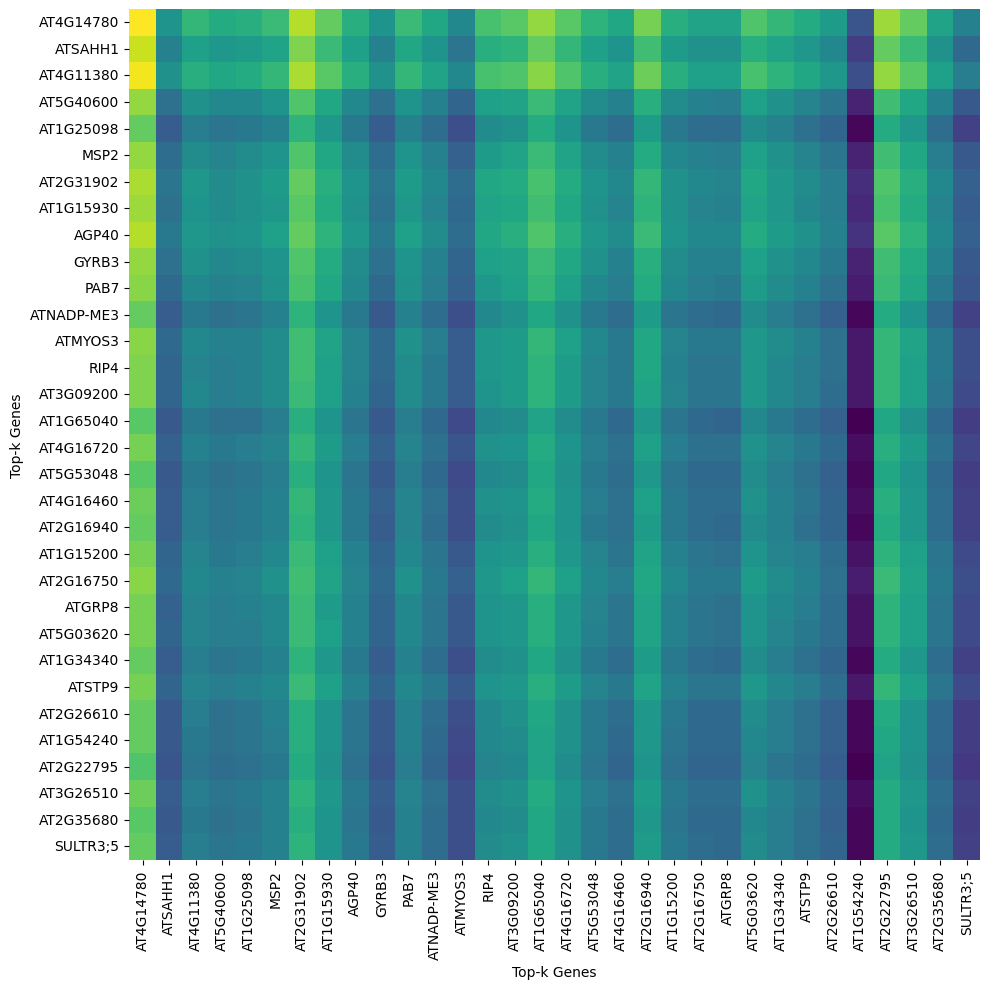

Attention scores heatmap for cell SRX20853658@@_TACCGGGTCGATTTCT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_TACCGGGTCGATTTCT-1.pdf
['AT2G07698', 'ATCG01130', 'AT5G53460', 'AthLNC022670', 'AT2G16586', 'AT3G54830', 'AT4G30860', 'AT1G04080', 'AT5G46250', 'AT5G05130', 'AT5G07410', 'AT1G49290', 'AT2G45405', 'AT4G25950', 'AT5G20710', 'AT5G48570', 'AT5G10950', 'AT5G53820', 'AT5G38410', 'AT4G16160', 'AT2G19110', 'AT3G14040', 'AT1G68610', 'AT3G26510', 'AT5G04110', 'AT2G28680', 'AT4G11543', 'AT3G28830', 'AT1G66235', 'AT1G79245', 'AT2G40850', 'AT1G66850']


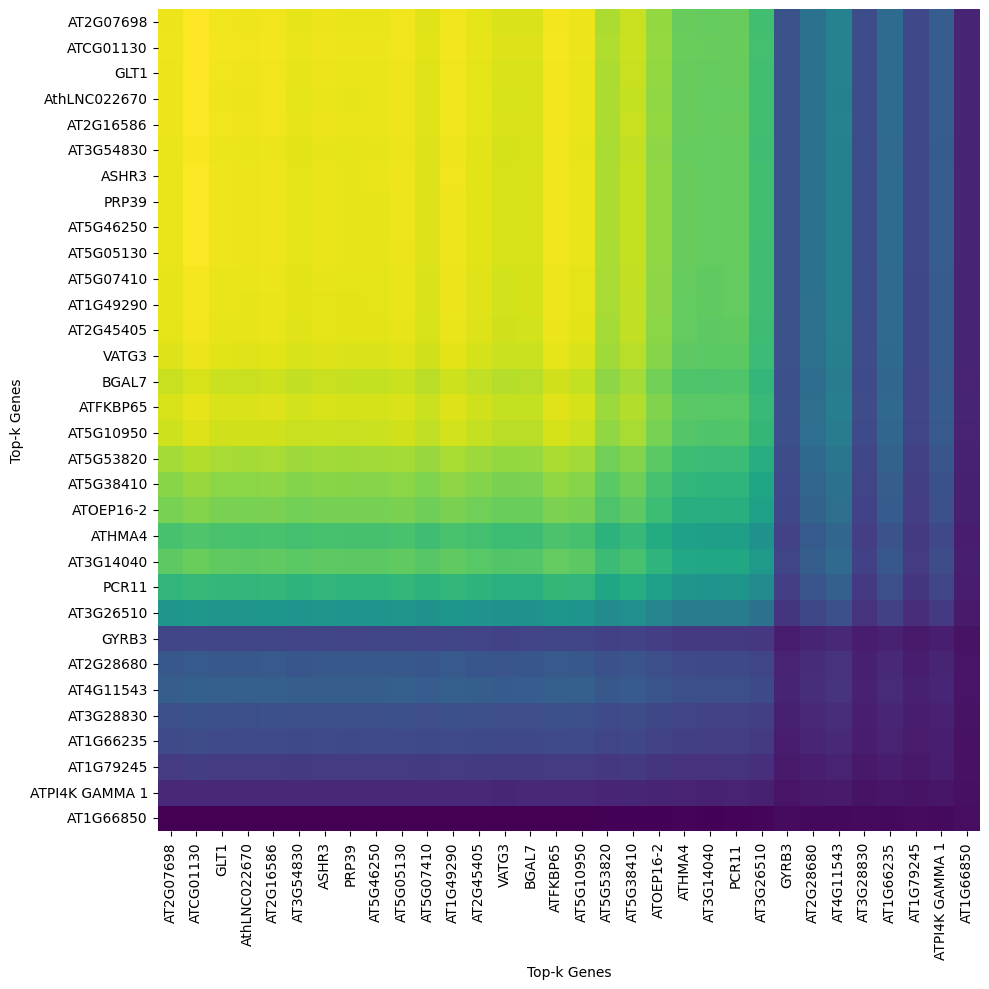

Attention scores heatmap for cell SRX20853656@@_CCGGGTACAGACTGCC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_CCGGGTACAGACTGCC-1.pdf
['AT1G01040', 'AT4G38590', 'AT1G77850', 'AT5G38760', 'AT3G01270', 'AT4G11030', 'AT3G58290', 'AT4G18920', 'AT2G39300', 'AT3G23810', 'AT5G54095', 'AT3G25495', 'AT4G35010', 'AT1G72330', 'AT1G29010', 'AT1G05580', 'AthLNC022670', 'AthLNC024348', 'AT4G26630', 'AT4G04980', 'AT1G80930', 'AT4G08580', 'AT4G28000', 'AT5G53510', 'AT3G23530', 'AT3G61160', 'AT1G20220', 'AT1G19890', 'AT3G07820', 'AT1G54450', 'AT4G26260', 'AT4G08670']


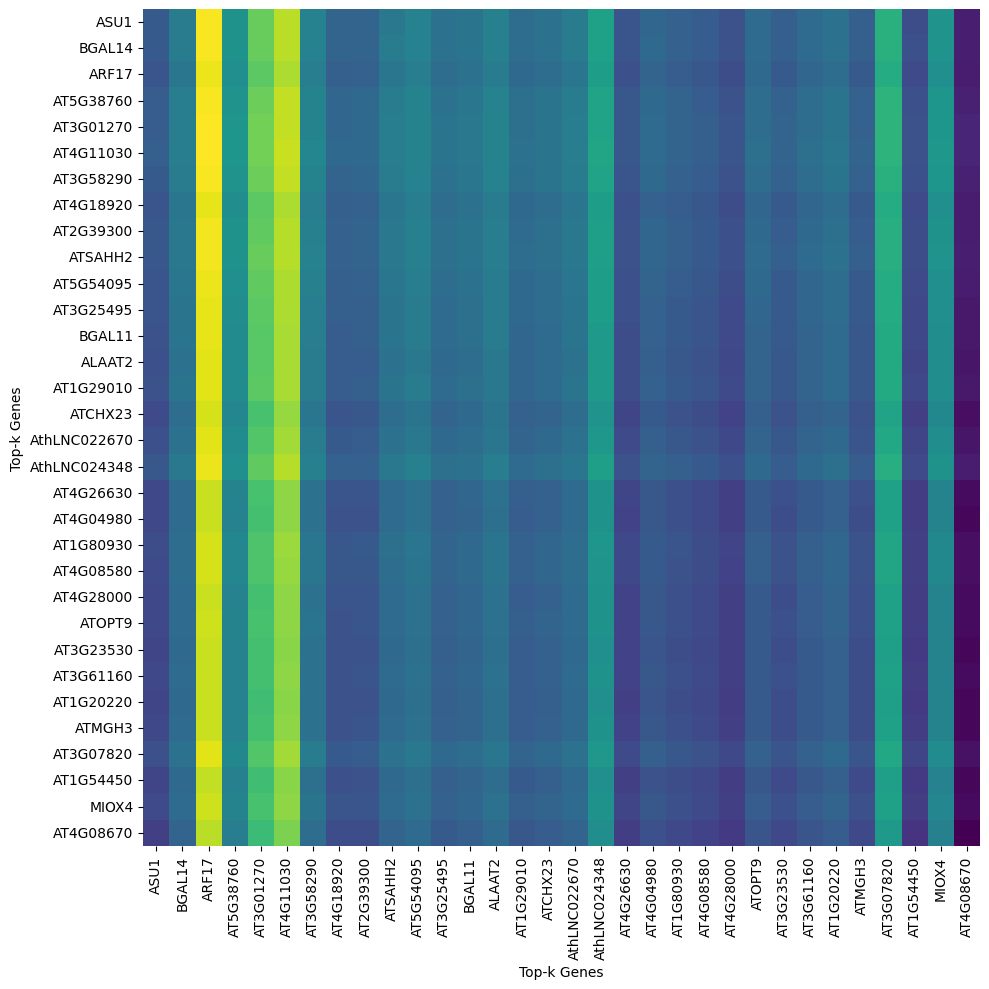

Attention scores heatmap for cell SRX20853658@@_CTGCCTATCGAACCTA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853658@@_CTGCCTATCGAACCTA-1.pdf
['AT2G37190', 'AT2G31902', 'AT5G25560', 'AT1G15200', 'AT1G25098', 'AT5G59480', 'AT3G20865', 'AT1G31970', 'AT3G46120', 'AT3G28980', 'AT4G39260', 'AT3G28790', 'AT2G16940', 'AT5G54095', 'AT1G24520', 'AT5G50830', 'AT3G01270', 'ATCG00040', 'AT3G23810', 'AT5G04110', 'AT2G01008', 'AT2G16586', 'AthLNC010982', 'AT3G01700', 'AT4G38590', 'AT3G28830', 'AT3G06025', 'AT4G28000', 'AT5G53460', 'AT1G48470', 'AT1G07210', 'AT5G15070']


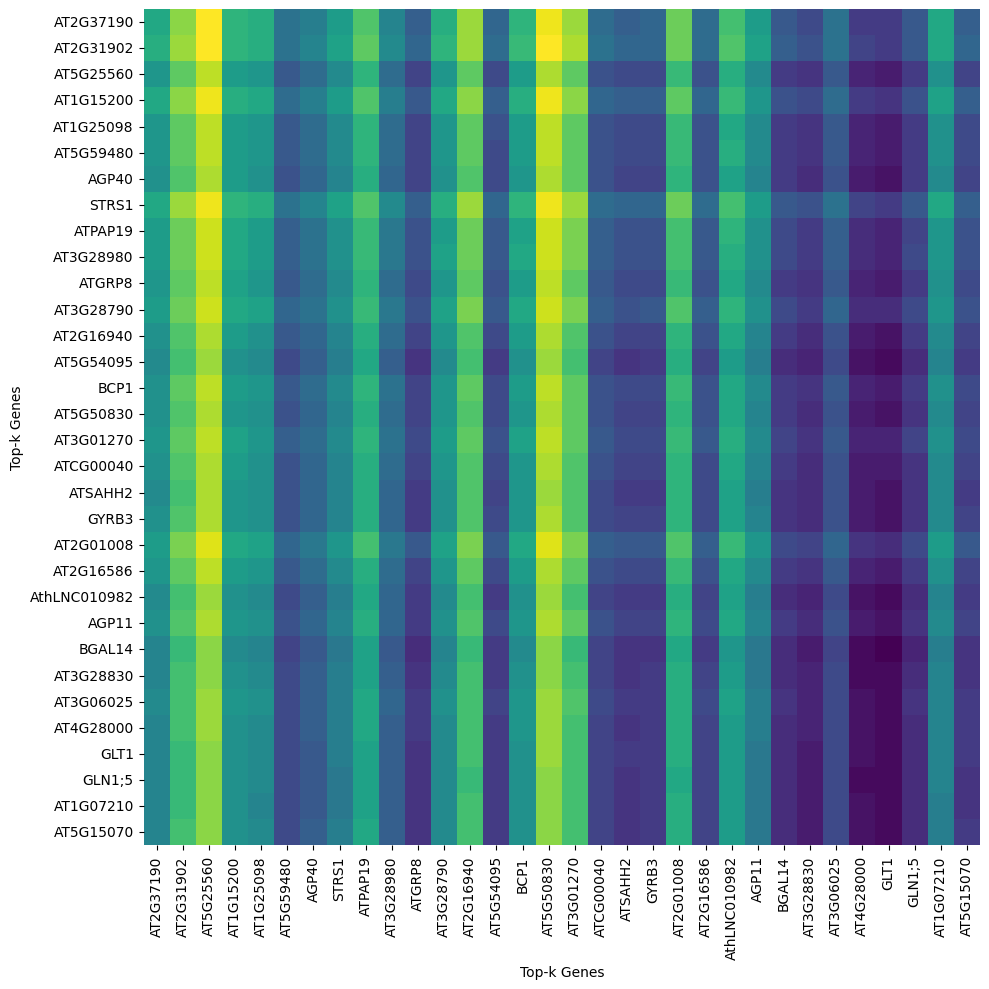

Attention scores heatmap for cell SRX20853658@@_GTCTCACTCGCCAACG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853658@@_GTCTCACTCGCCAACG-1.pdf
['AT1G25098', 'AT4G11380', 'AT2G36660', 'AT1G15930', 'AT2G19110', 'AT3G09390', 'AT1G31970', 'AT2G34480', 'AT2G16750', 'AT2G47730', 'AT4G14780', 'AT4G16720', 'AT3G20865', 'AT1G15200', 'AT2G04880', 'AT5G46795', 'AT5G03620', 'AT5G04110', 'AT3G53350', 'AT3G60245', 'AT2G21590', 'AT1G65040', 'AT2G06040', 'AT1G34340', 'AT4G16460', 'AT1G54240', 'AT1G70600', 'AT2G16940', 'AT4G06748', 'AT4G31420', 'AT4G39260', 'AT2G19860']


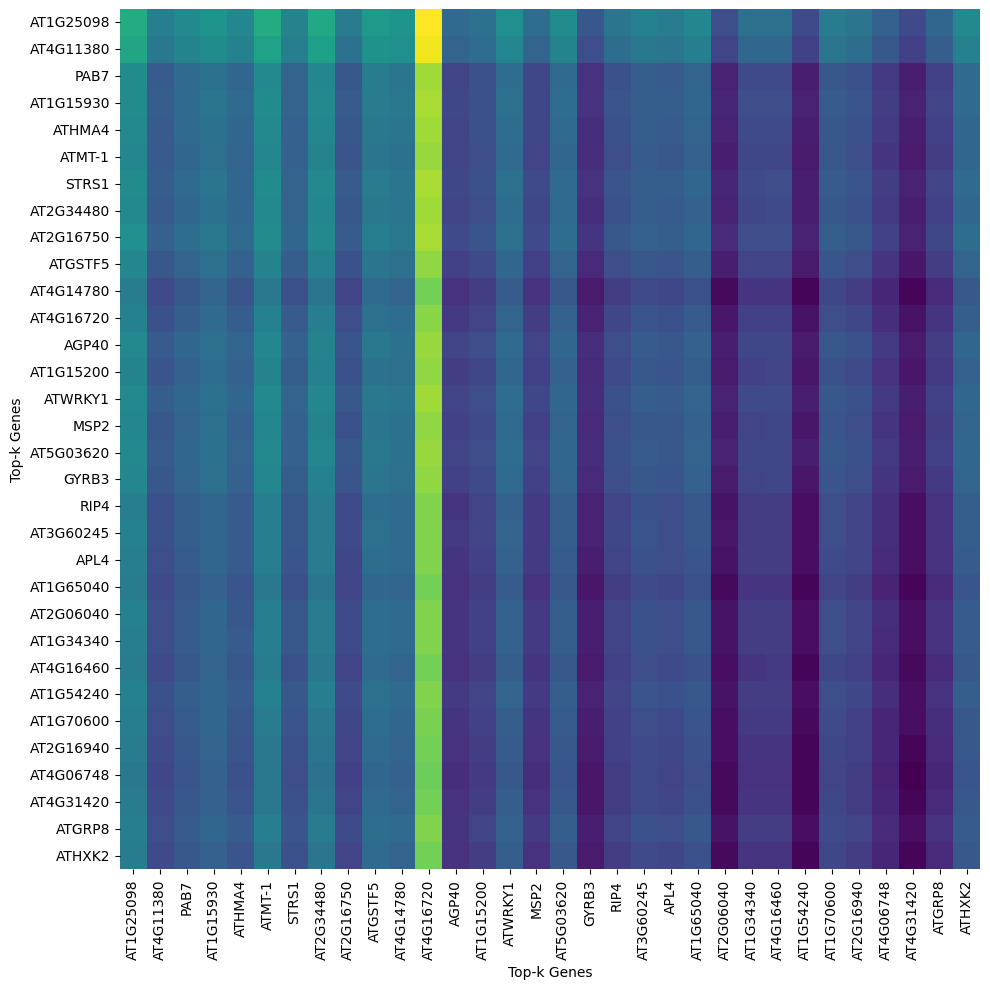

Attention scores heatmap for cell SRX20853658@@_AAGACTCAGCTCGCAC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_AAGACTCAGCTCGCAC-1.pdf
['AT2G19110', 'AT4G14780', 'AT5G46795', 'AT1G77850', 'AT3G16380', 'AT4G20260', 'AT2G36660', 'AT3G26510', 'AT1G25098', 'AT3G60245', 'AT3G20865', 'AT4G39230', 'AT5G59810', 'AT1G67120', 'ATCG00740', 'AT4G31420', 'ATCG01130', 'AT2G07698', 'AT5G04110', 'AT4G39260', 'AT5G49900', 'AT2G06040', 'AT5G60800', 'AT1G31970', 'AT1G77940', 'AT1G54240', 'AT1G12640', 'AT1G76780', 'AT2G16586', 'ATCG00470', 'ATCG00680', 'AT5G23160']


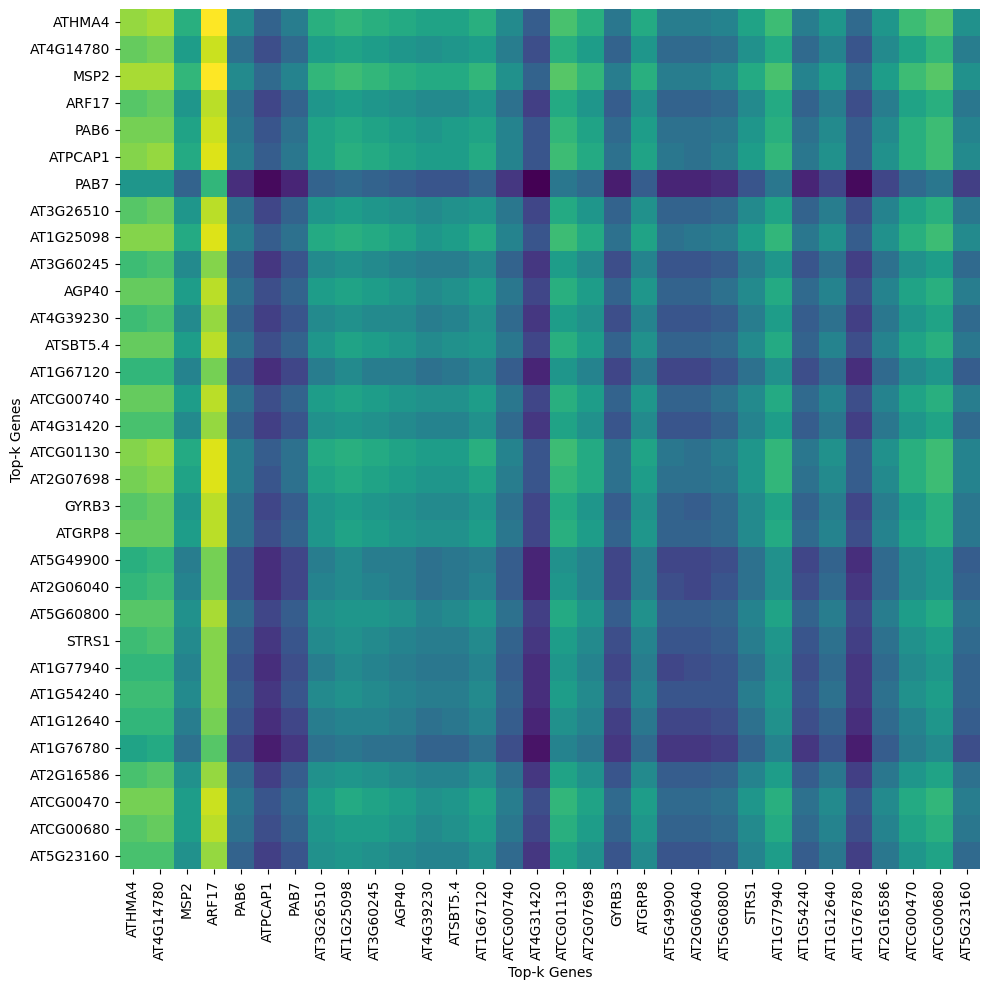

Attention scores heatmap for cell SRX20853656@@_TTCACGCTCGGTCGGT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_TTCACGCTCGGTCGGT-1.pdf
['AT3G02480', 'AT5G39870', 'AT2G07698', 'AT1G22760', 'AT5G04110', 'AT5G13840', 'AT5G38760', 'AT5G53440', 'ATCG00020', 'AT5G62850', 'AT3G14040', 'AT5G20710', 'AT5G02500', 'AT1G15430', 'AT4G39260', 'AT4G31420', 'AT4G11760', 'AT4G39670', 'AT4G22590', 'AT3G20865', 'ATCG00740', 'AT3G52920', 'AT1G66235', 'AT4G38590', 'AT2G28680', 'AT2G26610', 'AT5G07410', 'AT1G77850', 'AT4G33270', 'AT1G52680', 'AT2G07560', 'AT3G45810']


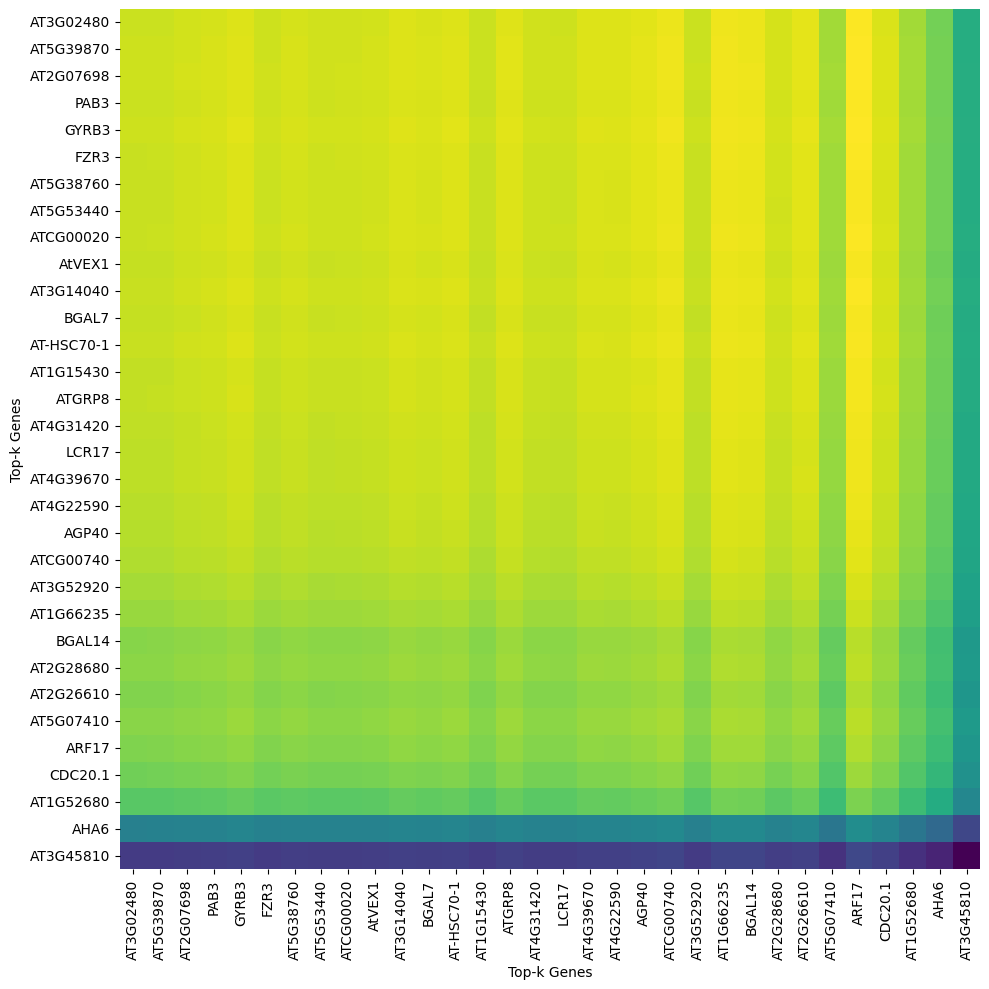

Attention scores heatmap for cell SRX20853658@@_GGAATGGAGGATACGC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853658@@_GGAATGGAGGATACGC-1.pdf
['AT4G38590', 'AT1G48470', 'AT3G02480', 'AT5G13840', 'AT4G26640', 'AT4G08580', 'AT5G48545', 'AthLNC022670', 'AT1G34095', 'AT3G30720', 'AT4G05710', 'AT5G38760', 'AT4G11380', 'AT3G28830', 'AT1G26840', 'AT1G01320', 'AT4G39260', 'AT4G35010', 'AthLNC012937', 'AT5G53820', 'AT4G13940', 'AT3G25495', 'AT1G13440', 'AT2G21660', 'AT5G53460', 'AT1G15940', 'AT2G16586', 'AT1G31740', 'AT3G11940', 'AT1G65730', 'AT3G05590', 'AT3G20865']


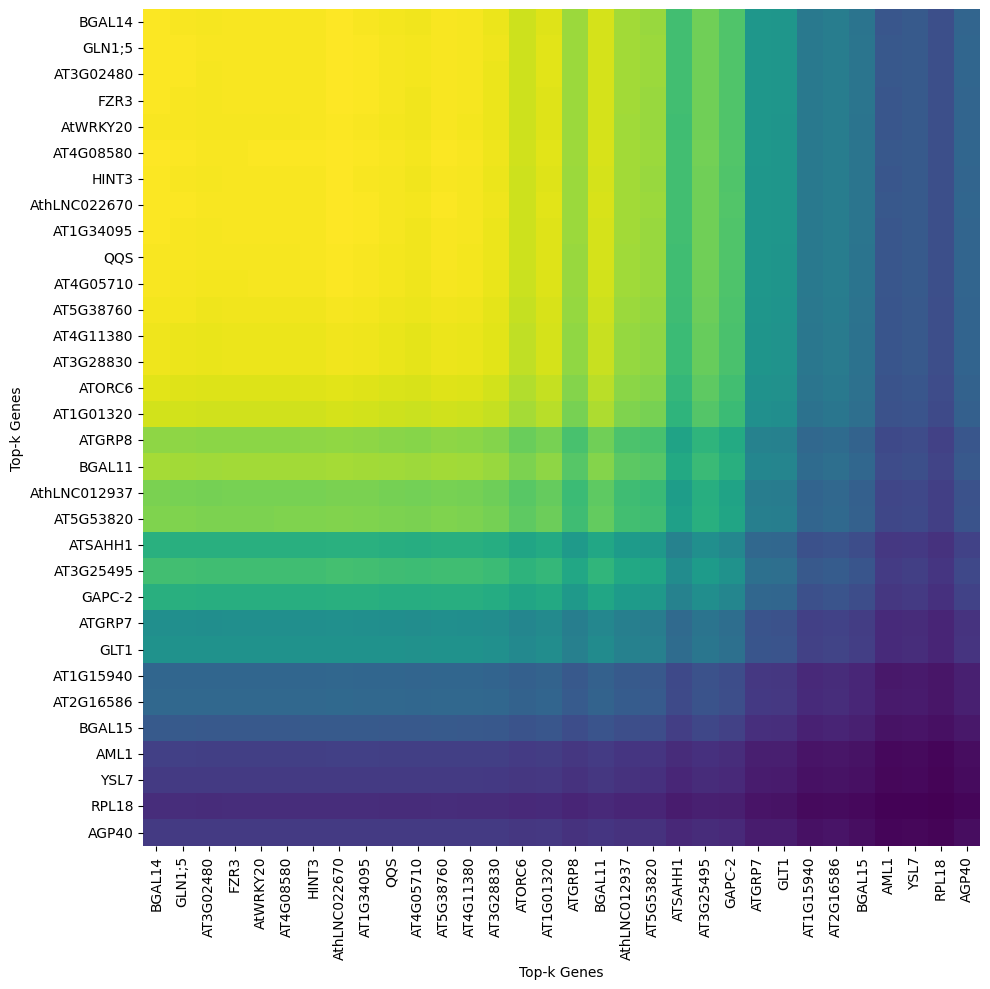

Attention scores heatmap for cell SRX20853658@@_CAATCGACAGAGGCAT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853658@@_CAATCGACAGAGGCAT-1.pdf
['AT1G77850', 'AT4G14780', 'AT1G25098', 'AT1G05580', 'AT3G45980', 'AT2G07698', 'AT5G49150', 'AT5G38760', 'AT1G01320', 'ATCG00340', 'AT5G15070', 'AT1G22760', 'AT5G62850', 'AT1G80930', 'AT4G20260', 'AT1G01040', 'AT5G53820', 'AT4G31570', 'AT5G07410', 'AT1G73860', 'AT1G65370', 'AT2G16586', 'AT1G69750', 'AthLNC024348', 'AT3G28980', 'AT5G13840', 'AT3G28770', 'AT3G14040', 'AT3G11964', 'ATCG00470', 'ATCG00020', 'AT4G08670']


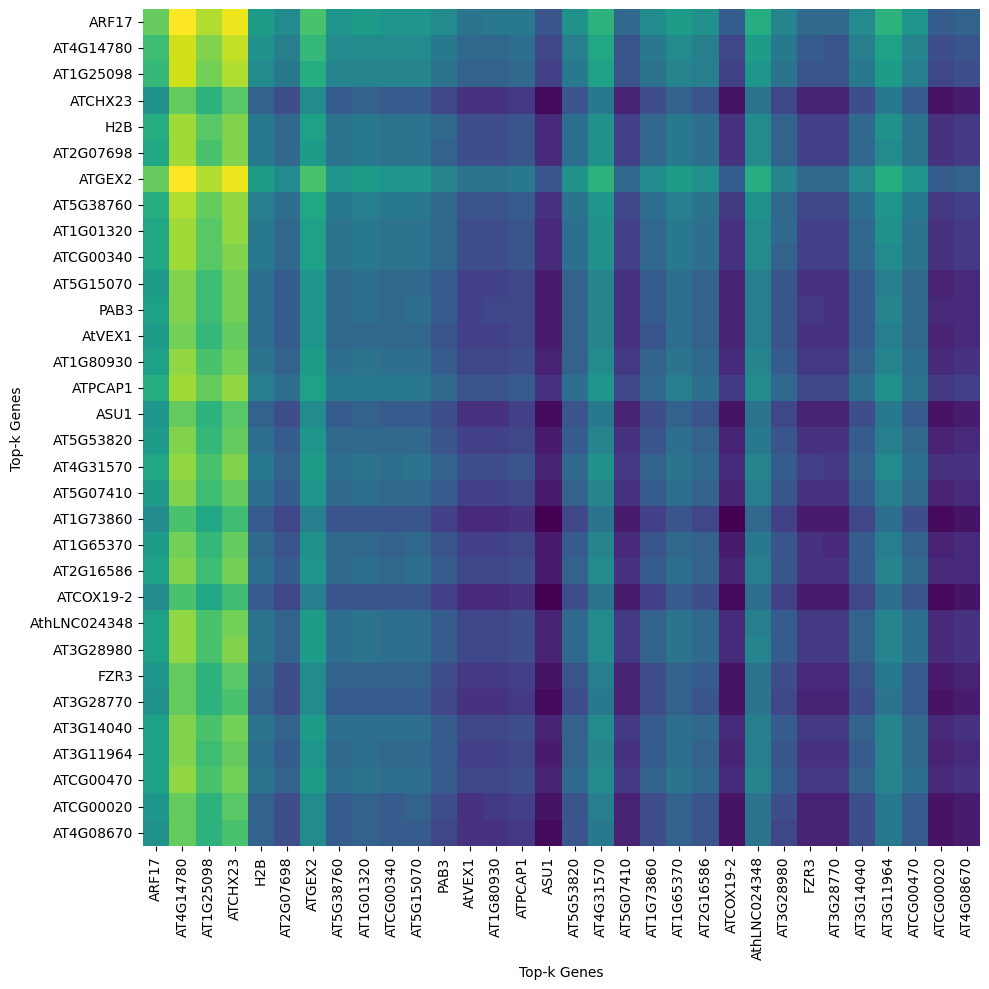

Attention scores heatmap for cell SRX20853658@@_ATTCATCTCAGCTTCC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853658@@_ATTCATCTCAGCTTCC-1.pdf
['AT1G77850', 'ATCG00040', 'AT2G47730', 'AT2G07698', 'AT2G30630', 'AT3G42850', 'AT5G01760', 'AthLNC022670', 'AT5G53460', 'AT4G08670', 'AT2G06983', 'AT1G55840', 'AT2G26610', 'AT3G28830', 'AT4G26630', 'AT4G26640', 'AT5G46250', 'AT2G23672', 'AT5G13840', 'AT2G29880', 'AT3G28820', 'AT2G37190', 'ATCG00020', 'AT1G52300', 'AT5G17500', 'AT4G14790', 'AT1G05580', 'AT4G34060', 'AT2G32240', 'AT3G14040', 'AT4G05710', 'AT1G08600']


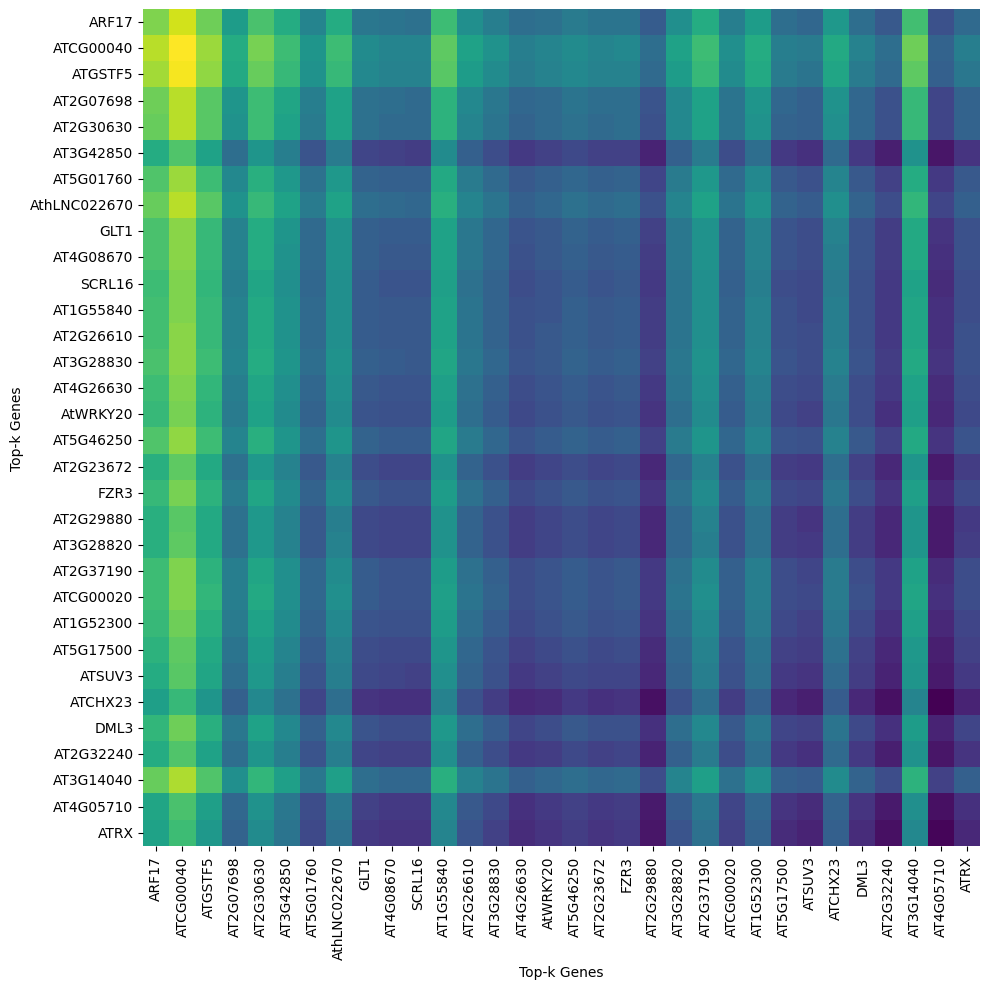

Attention scores heatmap for cell SRX20853656@@_GGTGTCGTCCCGTTCA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_GGTGTCGTCCCGTTCA-1.pdf
['AT3G30720', 'ATCG00040', 'AT3G02480', 'AT5G53820', 'ATCG00340', 'AT2G21660', 'AT3G14040', 'AT1G15430', 'AT4G39260', 'AT5G07410', 'AT3G28830', 'AT1G26840', 'AT5G55490', 'AT5G53460', 'AT4G23800', 'AT4G30860', 'ATCG00170', 'AT3G20865', 'AT5G05130', 'AT4G26630', 'AT5G01690', 'AT4G38590', 'AT2G31270', 'AT4G11380', 'AT2G07698', 'AT3G50310', 'AT5G59690', 'AT1G77210', 'AT2G34820', 'AT3G28980', 'AT3G29770', 'AT2G16940']


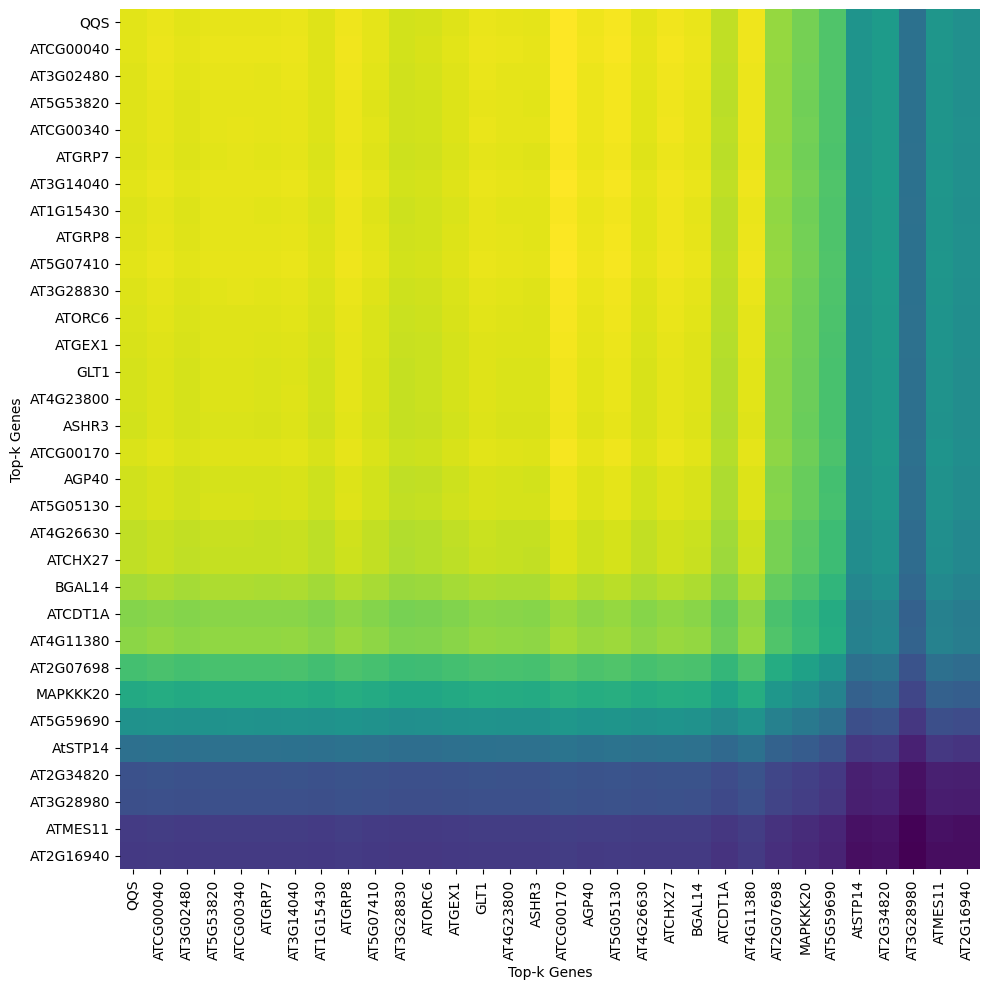

Attention scores heatmap for cell SRX20853656@@_TTAGTCTAGTGGATAT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853656@@_TTAGTCTAGTGGATAT-1.pdf
['AT4G25950', 'AT5G04110', 'AT4G11380', 'AT3G30720', 'AT2G07698', 'AT5G66020', 'AT3G20865', 'AT1G50310', 'AT5G39870', 'AT1G16380', 'AT4G04450', 'AT1G66235', 'AT5G53820', 'AT5G62850', 'AT4G22590', 'AT1G79950', 'AT2G07560', 'AT4G31420', 'AT1G60410', 'AT2G11522', 'AT4G38940', 'AT3G22760', 'AT1G15430', 'AT2G27050', 'AT2G41250', 'AT4G30860', 'AT5G55490', 'AT2G06040', 'AT1G26840', 'AT3G28980', 'AT5G59480', 'AT4G33270']


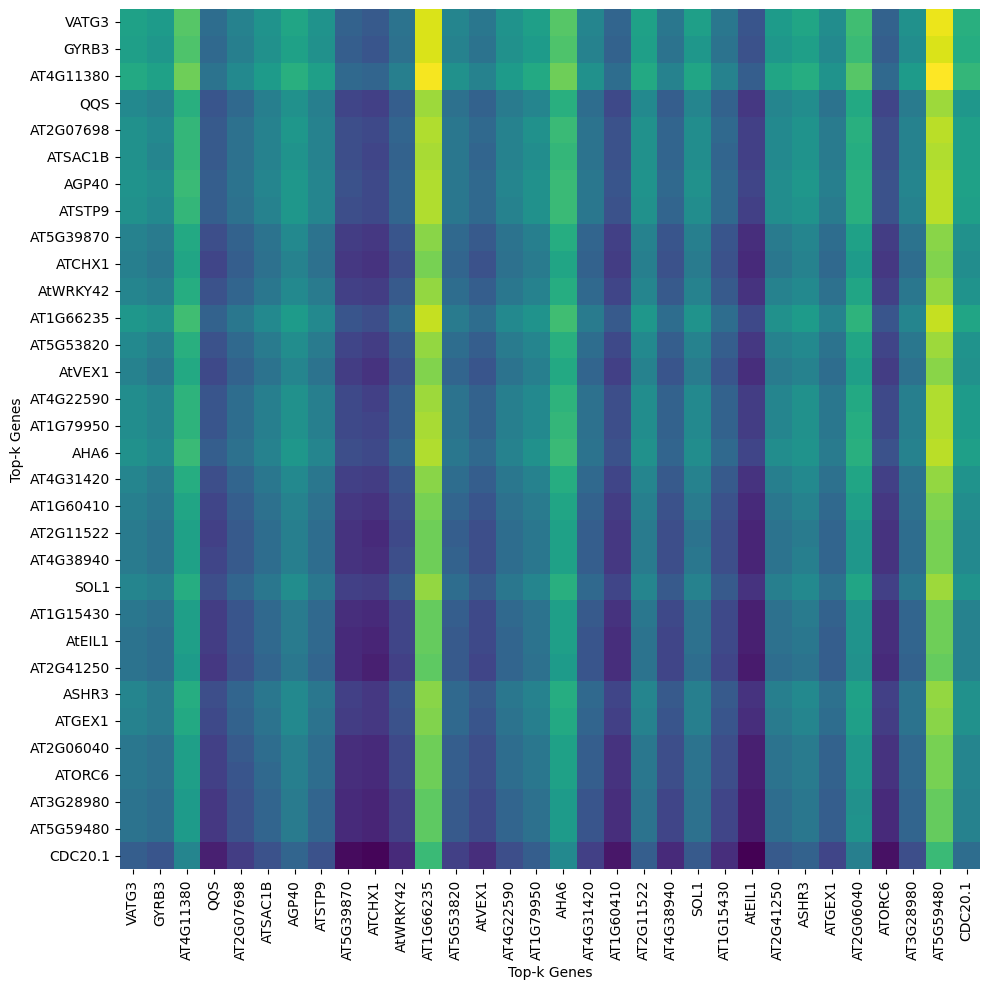

Attention scores heatmap for cell SRX20853656@@_TACTTGTCACTAGGCC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853656@@_TACTTGTCACTAGGCC-1.pdf
['AT2G16750', 'AT5G04110', 'AT3G20865', 'AT5G15140', 'AT3G19020', 'AT5G55930', 'AT2G30630', 'AT5G25880', 'AT2G16940', 'AT1G50310', 'AT3G62710', 'AT2G22795', 'AT4G31570', 'AT1G15200', 'AT1G14420', 'AT3G28790', 'AT4G09640', 'AT5G54095', 'AthLNC004035', 'AT5G12960', 'AT1G24520', 'AT4G11830', 'AT5G03620', 'AT3G53350', 'AT1G67430', 'AT3G54800', 'AT1G22760', 'AT1G69940', 'AT3G25840', 'AT4G18920', 'AT3G07820', 'AT1G60200']


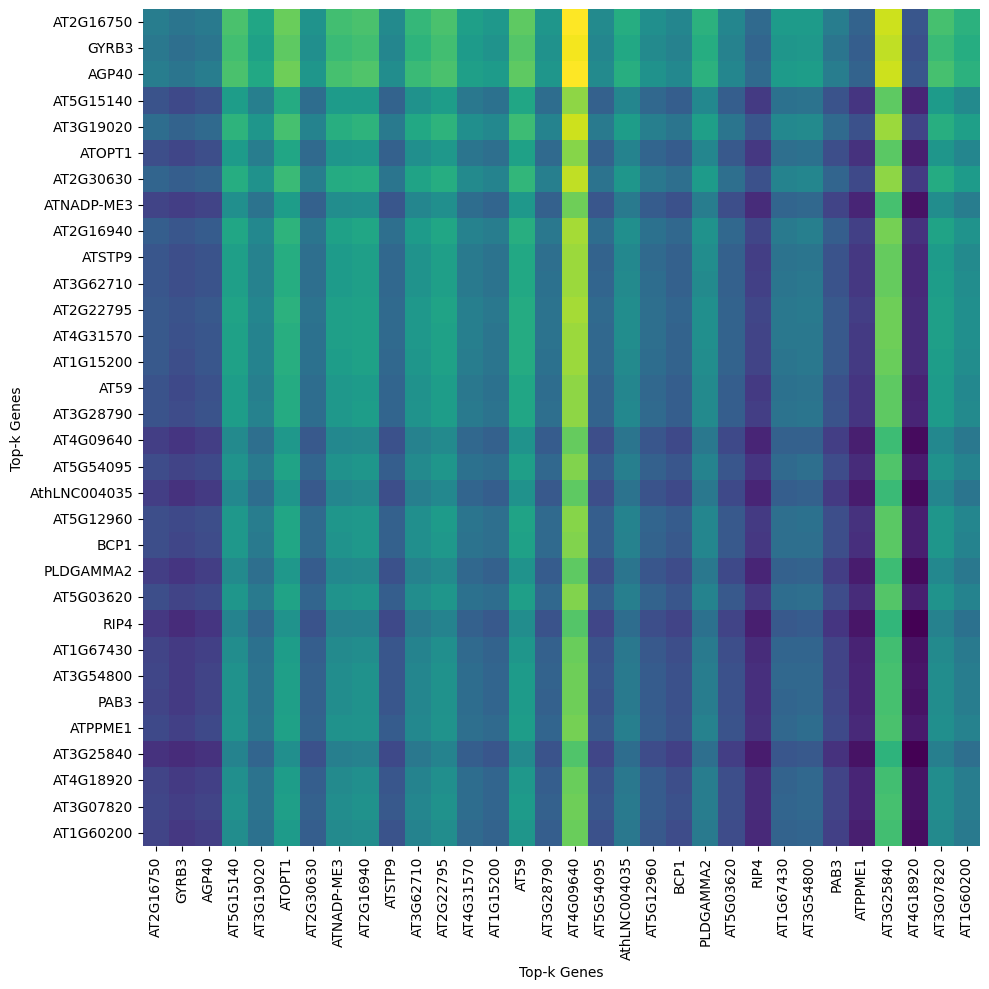

Attention scores heatmap for cell SRX20853656@@_ACTTTGTAGTGAGCCA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_ACTTTGTAGTGAGCCA-1.pdf
['AT1G25098', 'AthLNC010982', 'AT3G23810', 'AT3G28830', 'AT4G39260', 'AT5G60800', 'AT3G42850', 'AT5G04110', 'AT3G03490', 'AT5G48545', 'AT2G16586', 'AT2G21660', 'ATCG00470', 'AT5G07410', 'AthLNC022670', 'AT3G23530', 'AT2G39705', 'AT5G53820', 'AT5G12960', 'AT4G08670', 'AT3G15280', 'AT1G47980', 'AT5G13840', 'AT2G06983', 'AT1G61340', 'AT4G04980', 'AT4G34060', 'AT1G79245', 'ATCG00020', 'AT3G28980', 'AT1G04080', 'AT1G69750']


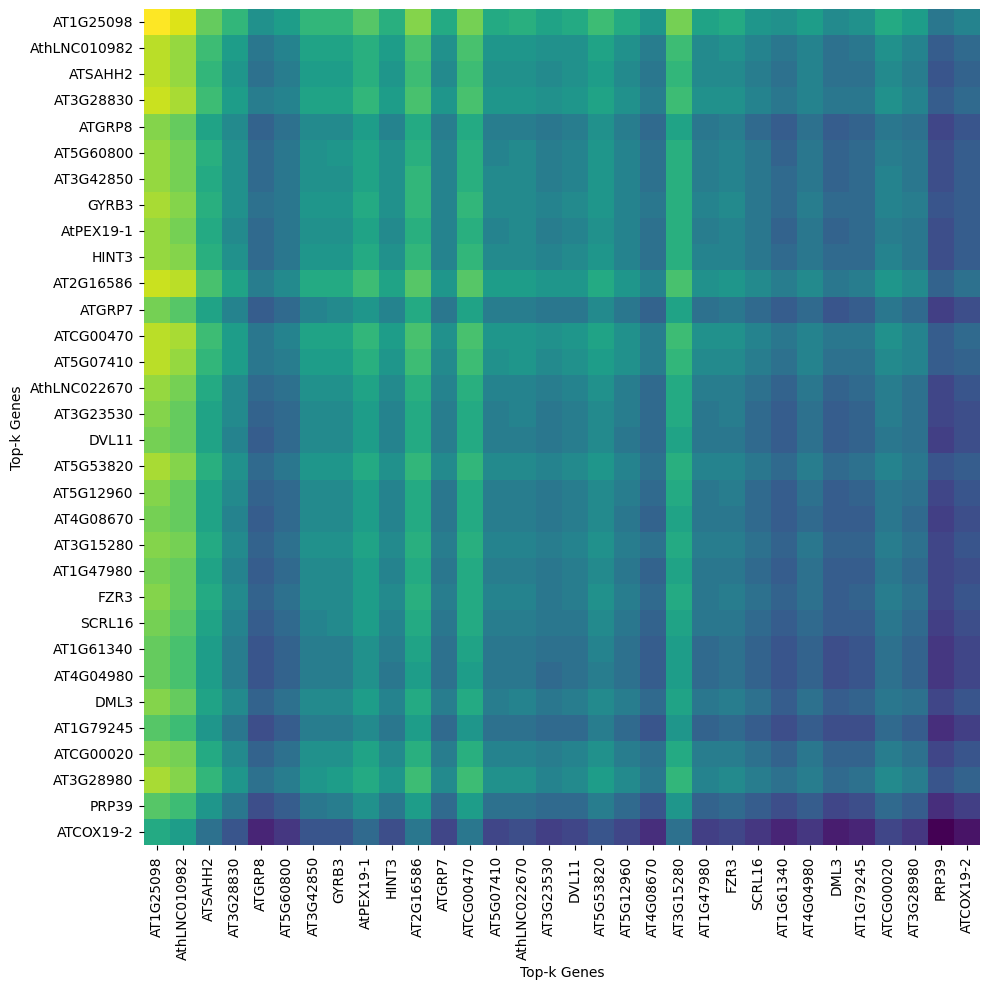

Attention scores heatmap for cell SRX20853656@@_TGTAAGCTCCGAGATT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_TGTAAGCTCCGAGATT-1.pdf
['AT2G47730', 'AT2G36660', 'AT3G20865', 'AT4G14620', 'AT1G31970', 'AT2G27170', 'AT3G15280', 'AT2G19110', 'AT1G77410', 'AT5G59690', 'AT4G14780', 'AT2G31425', 'AthLNC010982', 'AT1G15200', 'AthLNC005935', 'AT2G34480', 'AT1G77940', 'AT1G65730', 'AT4G04980', 'AT4G26190', 'AT3G04620', 'AT3G28770', 'AT2G06040', 'AT3G06025', 'AT1G52300', 'AT5G59480', 'AT1G12840', 'AT4G31570', 'AT3G60245', 'AT1G34340', 'AT1G76110', 'AT2G16750']


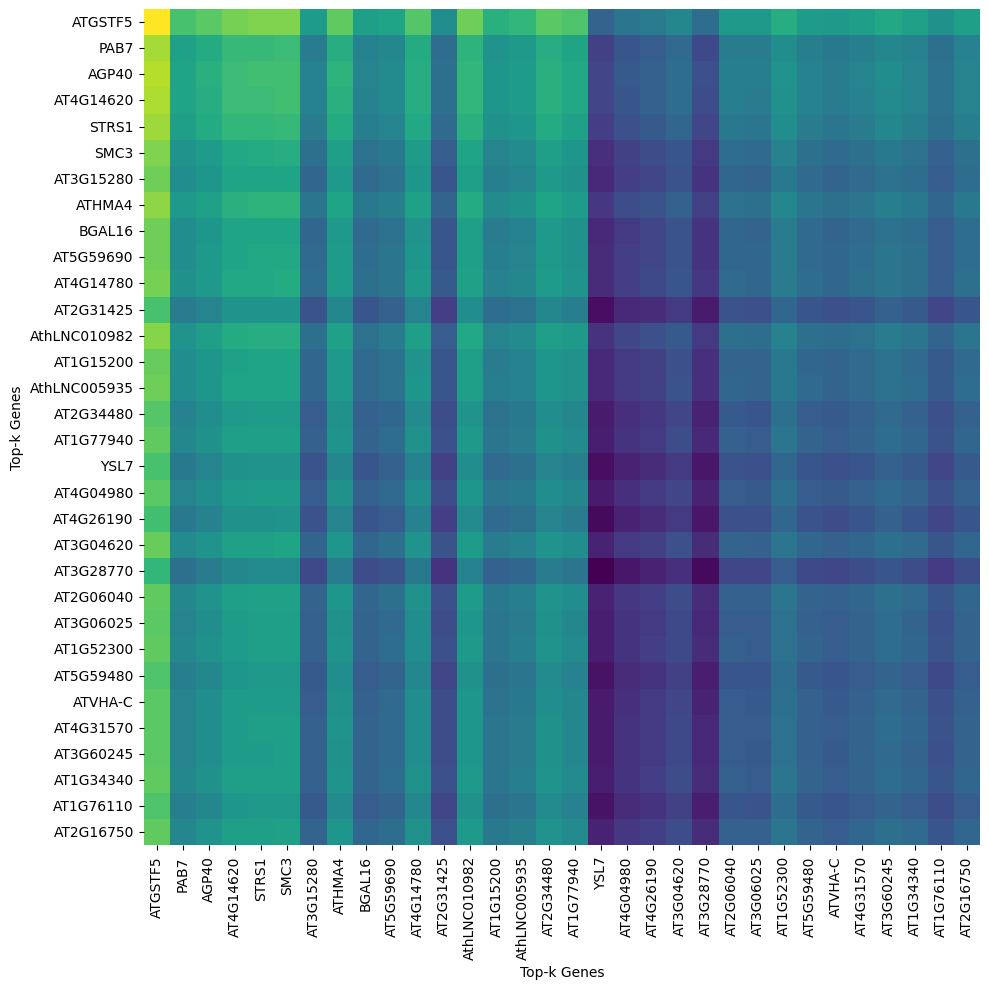

Attention scores heatmap for cell SRX20853656@@_GAAGAATAGGAACGTC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_GAAGAATAGGAACGTC-1.pdf
['AT3G23530', 'AT1G05580', 'AT4G26640', 'AT5G54095', 'AT2G29880', 'AT4G14315', 'AthLNC005935', 'AthLNC012937', 'AT3G42640', 'AT4G33270', 'AT1G28620', 'ATCG01130', 'AT4G34110', 'AT1G04080', 'AT4G11030', 'AT3G24080', 'AT1G14420', 'AT1G75870', 'AT1G71770', 'AT1G52300', 'AT1G78080', 'AT5G02500', 'AT3G17410', 'AT2G26450', 'AT2G21660', 'AT1G42470', 'AT3G01700', 'AthLNC012426', 'AT5G16630', 'AT4G09644', 'AT3G02260', 'AT3G52310']


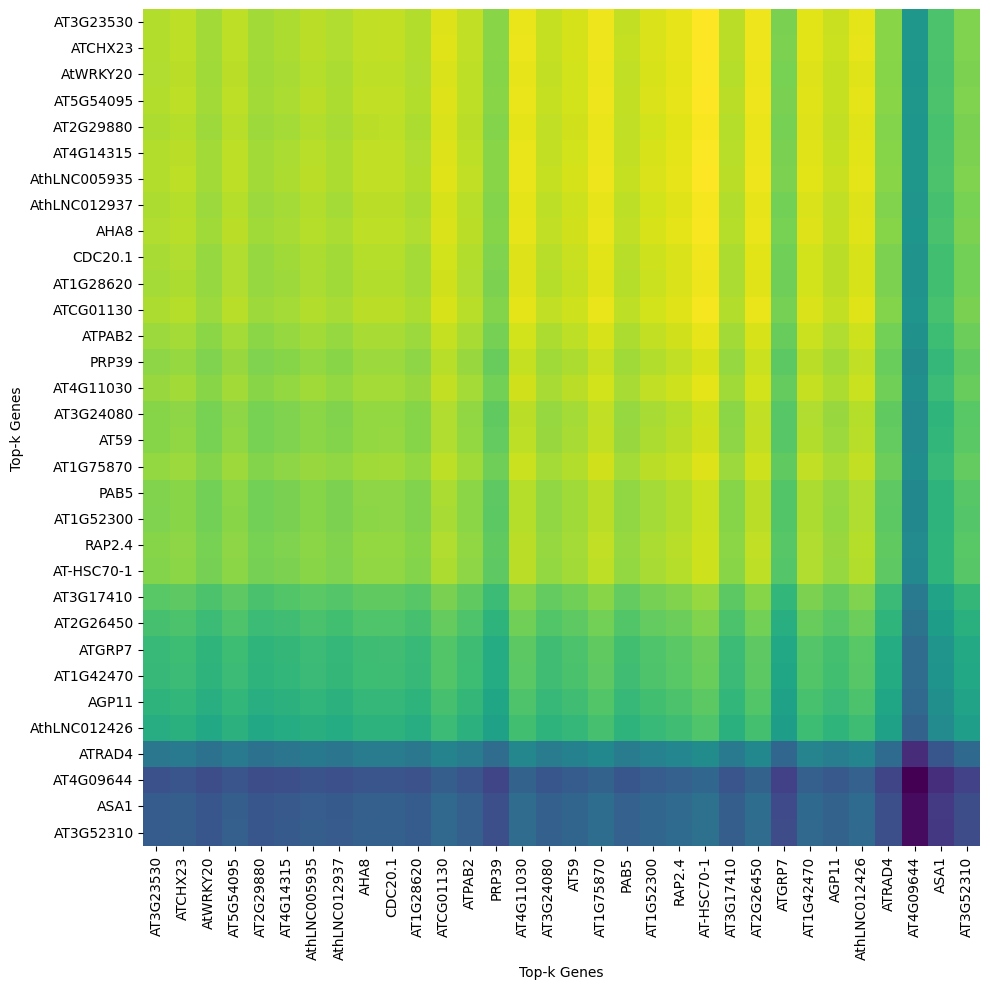

Attention scores heatmap for cell SRX20853656@@_TGGAGAGTCTGTGCTC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853656@@_TGGAGAGTCTGTGCTC-1.pdf
['AT4G26630', 'AT4G26640', 'AT5G62850', 'AthLNC005935', 'AT5G48545', 'AT4G36600', 'AT1G54450', 'AT3G23300', 'AthLNC022870', 'AT2G05642', 'AT3G21945', 'AthLNC024348', 'AT3G28820', 'AT3G52920', 'AT2G21660', 'AT5G54095', 'AT5G53460', 'AT5G55490', 'AT1G68610', 'AT5G13940', 'AT4G11030', 'AthLNC012426', 'AT1G09910', 'AT3G11410', 'AT2G45405', 'AT3G16840', 'AT2G33420', 'AT1G53180', 'AT1G75870', 'AT1G76110', 'AT3G01350', 'AthLNC019416']


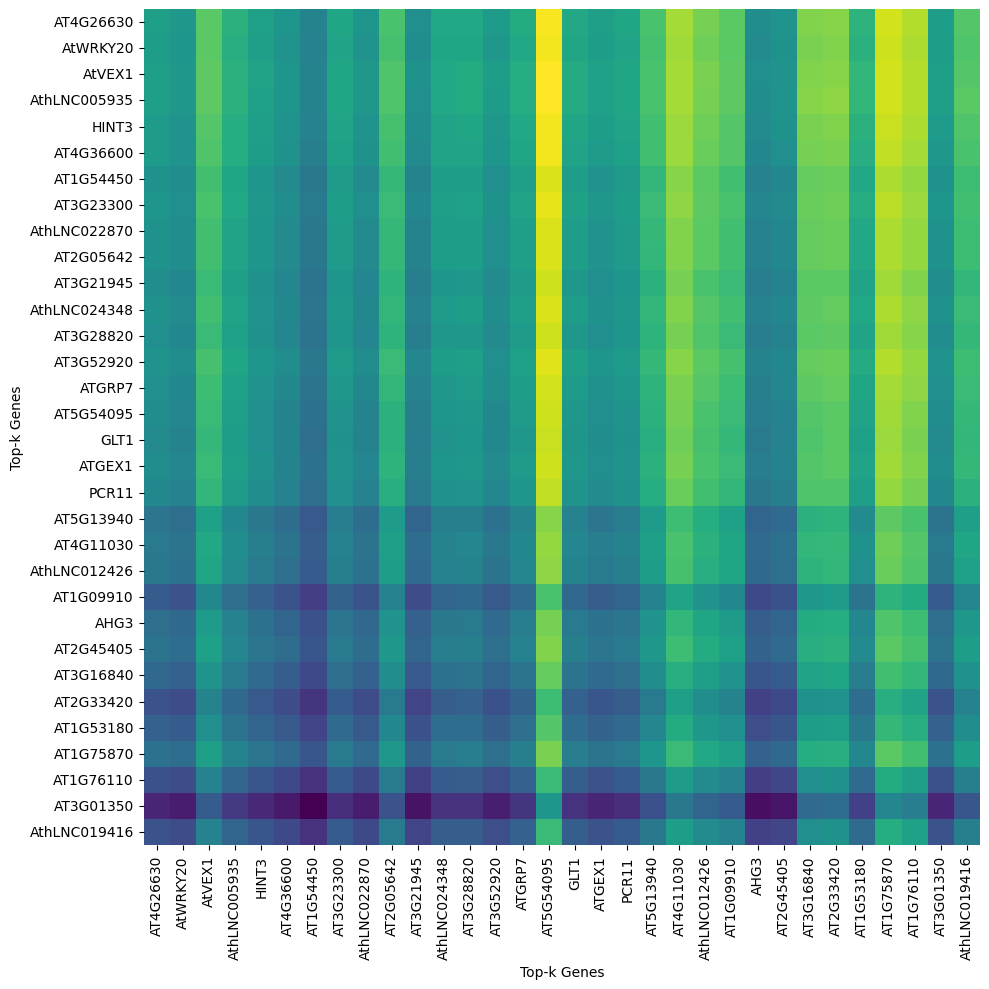

Attention scores heatmap for cell SRX20853656@@_AAGACAAGTGTGACCC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_late_bi_heatmap_output_SRX20853656@@_AAGACAAGTGTGACCC-1.pdf
['AT3G42850', 'AT4G08670', 'AT5G04110', 'ATCG00340', 'AthLNC024348', 'AT5G16100', 'AT5G07410', 'AT5G17920', 'AT2G46170', 'AT3G14040', 'AT4G33000', 'AT4G22590', 'AT3G45810', 'AT5G40260', 'AT2G32700', 'AT5G46250', 'AT1G70620', 'AT1G51490', 'AT3G60245', 'AT3G11940', 'AT4G11380', 'AT1G18410', 'AT5G15030', 'AT2G37470', 'AT5G66150', 'AT5G44800', 'AT4G14780', 'AT1G15415', 'AT1G08730', 'AT1G69940', 'AT1G19310', 'AT5G61700']


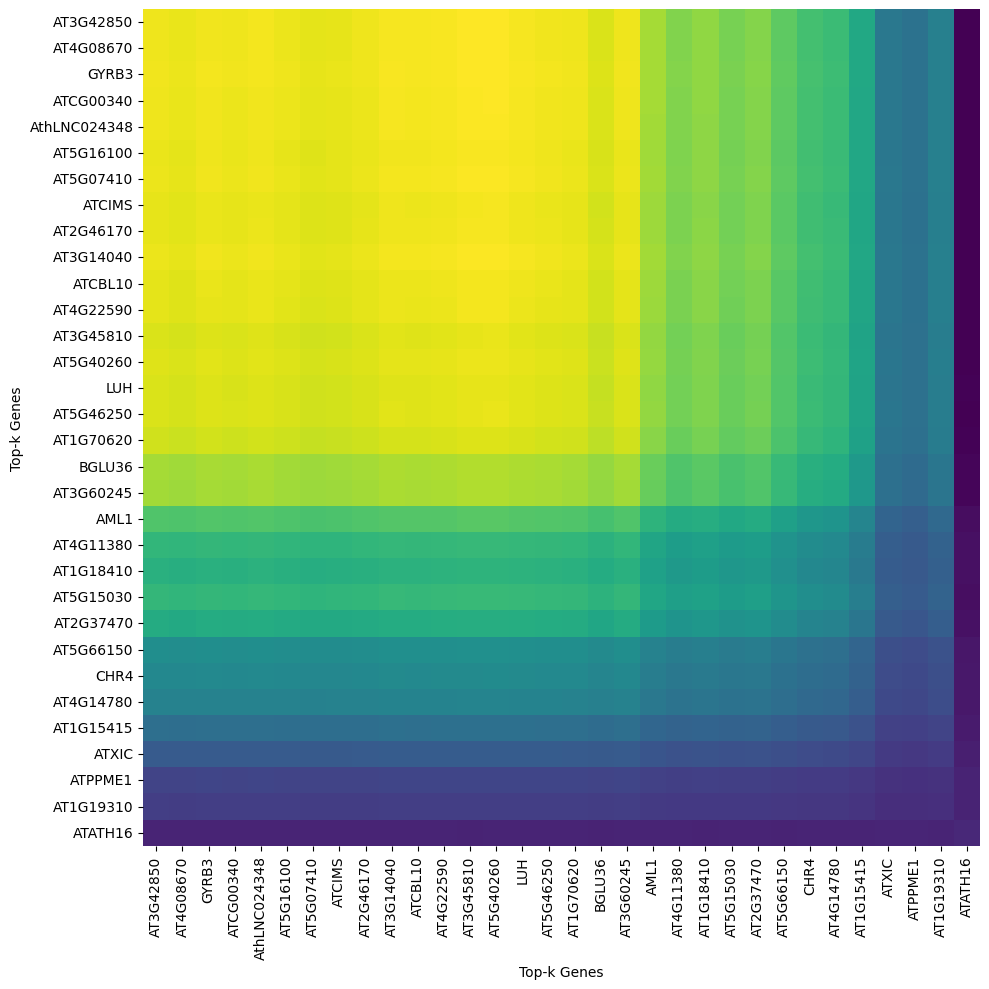

Attention scores heatmap for cell SRX20853658@@_AGAAATGTCACGATCA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853658@@_AGAAATGTCACGATCA-1.pdf
['AT5G04110', 'AT3G14040', 'AT5G38760', 'AT1G66235', 'AT3G20865', 'AT1G65730', 'AT5G39870', 'AT5G07410', 'AT5G62850', 'AT4G39670', 'AT3G24640', 'AT1G16380', 'AT1G79950', 'ATCG00020', 'AT4G11760', 'AT2G06983', 'AT3G47410', 'AT4G22590', 'AT1G60410', 'AT3G11410', 'AT2G46170', 'AT1G15430', 'AT1G35540', 'AT2G06040', 'AT1G12640', 'AT5G60250', 'AT2G01600', 'AT1G75950', 'AT5G59480', 'AT3G46230', 'AT5G58190', 'AT2G22795']


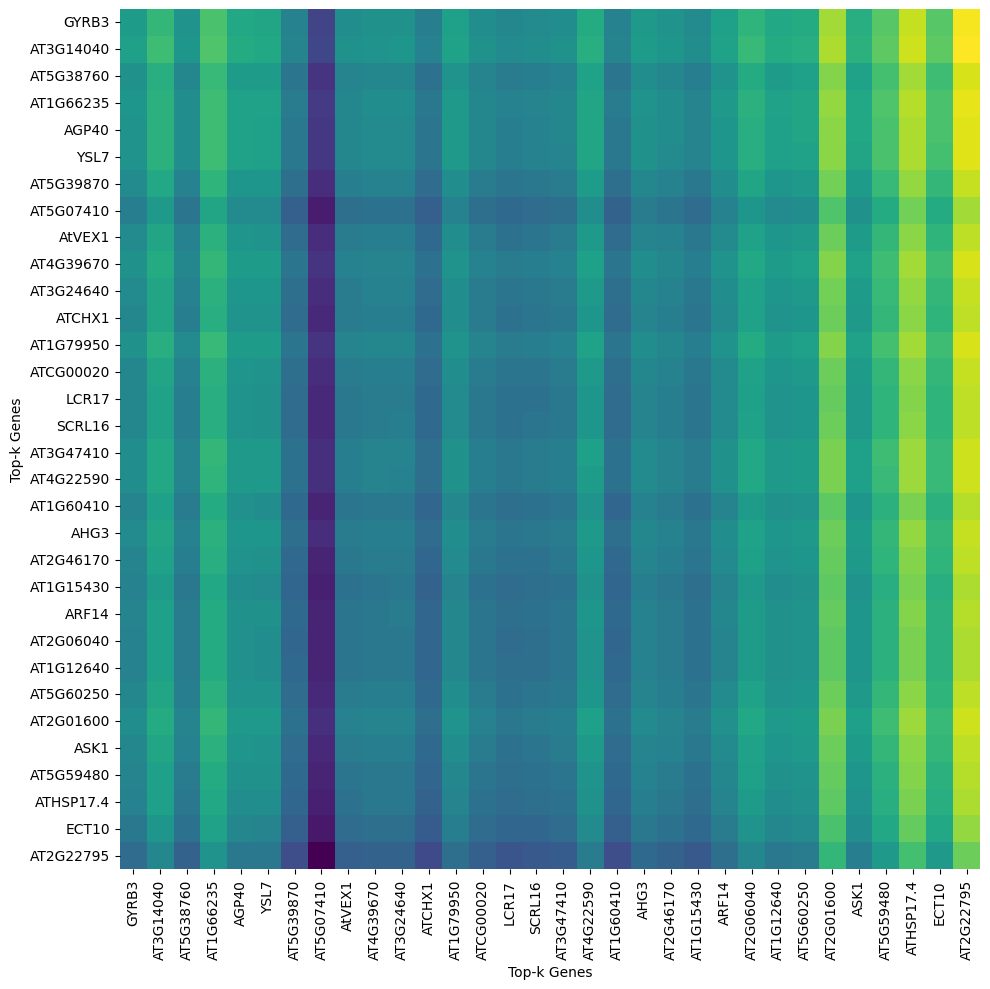

Attention scores heatmap for cell SRX20853658@@_GCCAACGTCTTGGCTC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853658@@_GCCAACGTCTTGGCTC-1.pdf
['AT4G13940', 'AT5G50830', 'AT5G55930', 'AT4G18920', 'AT5G16730', 'AT3G42850', 'AT4G31570', 'AT2G47730', 'AT3G09390', 'AT1G61566', 'AT4G35010', 'AT5G03620', 'AT2G07698', 'AT1G72330', 'AT1G05580', 'AT5G38760', 'AT2G16750', 'AT3G61160', 'AT1G21730', 'AT3G07820', 'AT2G16586', 'AT4G28000', 'AT1G22760', 'AT3G20865', 'AT1G29010', 'AT1G80930', 'AT4G25950', 'AT1G76010', 'AT5G54095', 'AT1G25470', 'AT1G79245', 'AT5G55590']


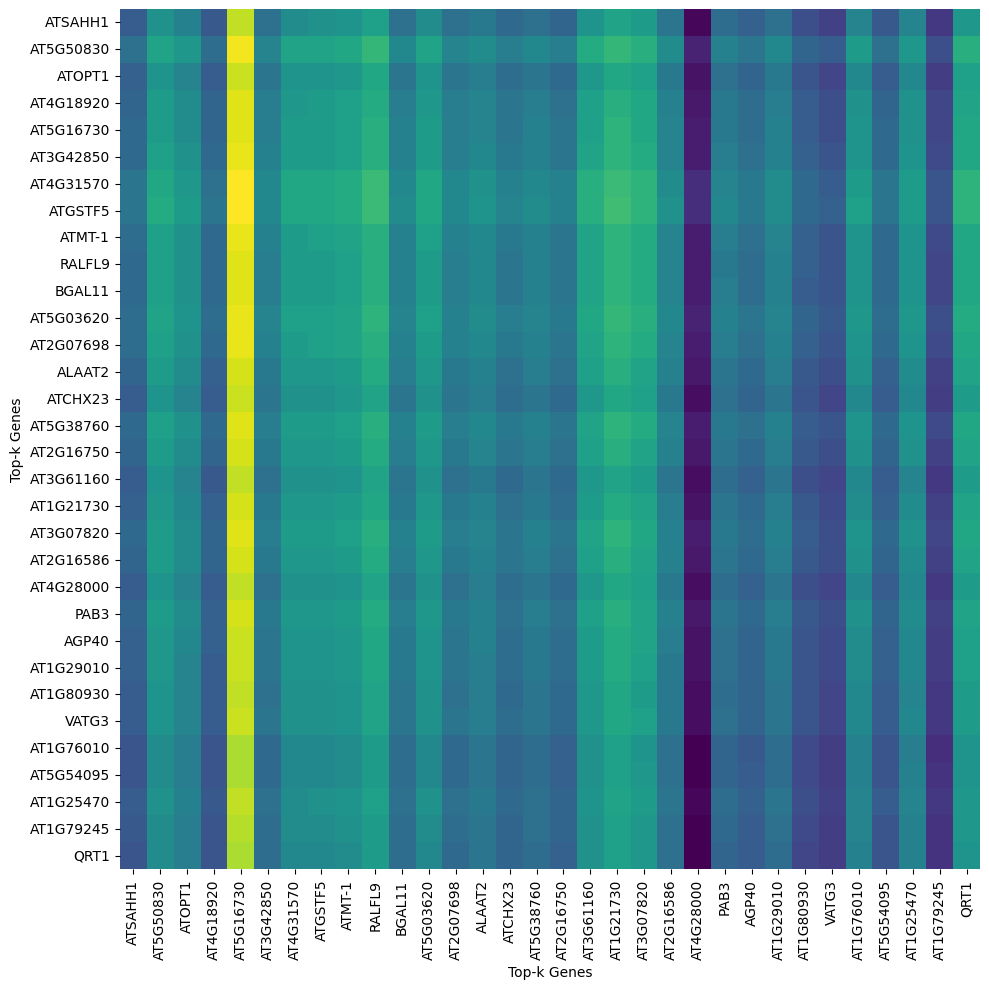

Attention scores heatmap for cell SRX20853658@@_CTGCATCAGTCTTCCC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853658@@_CTGCATCAGTCTTCCC-1.pdf
['AT5G46795', 'AT3G16380', 'AT3G09390', 'AT1G54240', 'AT1G67120', 'AT5G38760', 'AT1G64090', 'AT5G53820', 'AT2G36660', 'AT1G77940', 'AT1G07210', 'AT5G23160', 'AT2G06040', 'AT5G02270', 'AT5G64480', 'AT5G09440', 'ATCG00740', 'AT2G36460', 'AT3G14040', 'AT5G18620', 'AT5G38410', 'AT4G08590', 'AT5G49900', 'AT1G12840', 'AT5G59480', 'AT1G79950', 'AT1G76110', 'AT4G39230', 'AT1G78895', 'AT4G16460', 'AT5G06278', 'AT3G04620']


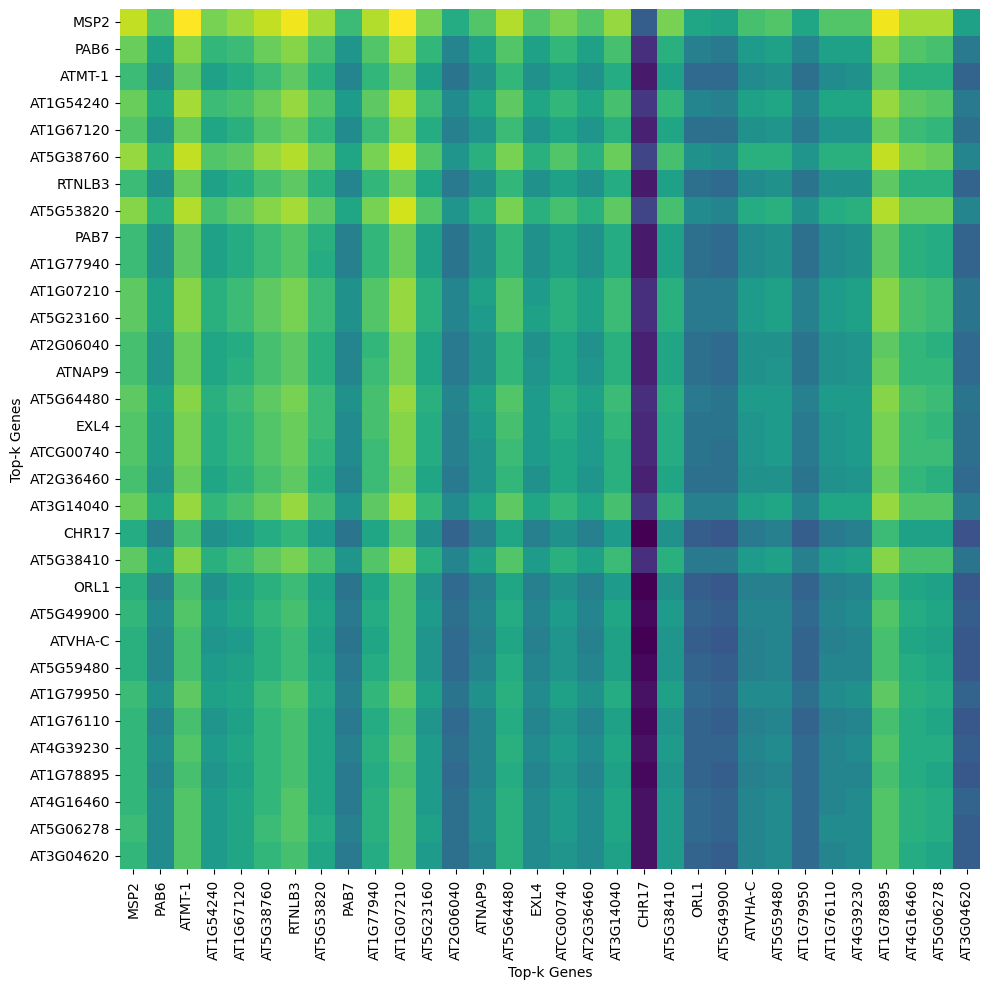

Attention scores heatmap for cell SRX20853658@@_ATAGGCTTCGATACGT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_ATAGGCTTCGATACGT-1.pdf
['AT1G48090', 'AT3G20865', 'AT5G49150', 'AT5G27870', 'AT5G18620', 'AT5G04110', 'AT3G27060', 'AT5G55930', 'AT1G77410', 'AT1G19890', 'AT2G36660', 'AT3G26510', 'AT1G64090', 'AT4G31420', 'AT3G16380', 'AT3G23560', 'AT1G64610', 'AT1G07210', 'AT1G52300', 'AT3G07030', 'AT3G15280', 'AT2G46490', 'AT5G53440', 'AT1G78895', 'AT1G01320', 'AT5G59480', 'AT4G08590', 'AT1G12840', 'AT3G04620', 'AT2G37470', 'AT5G49900', 'AT5G23160']


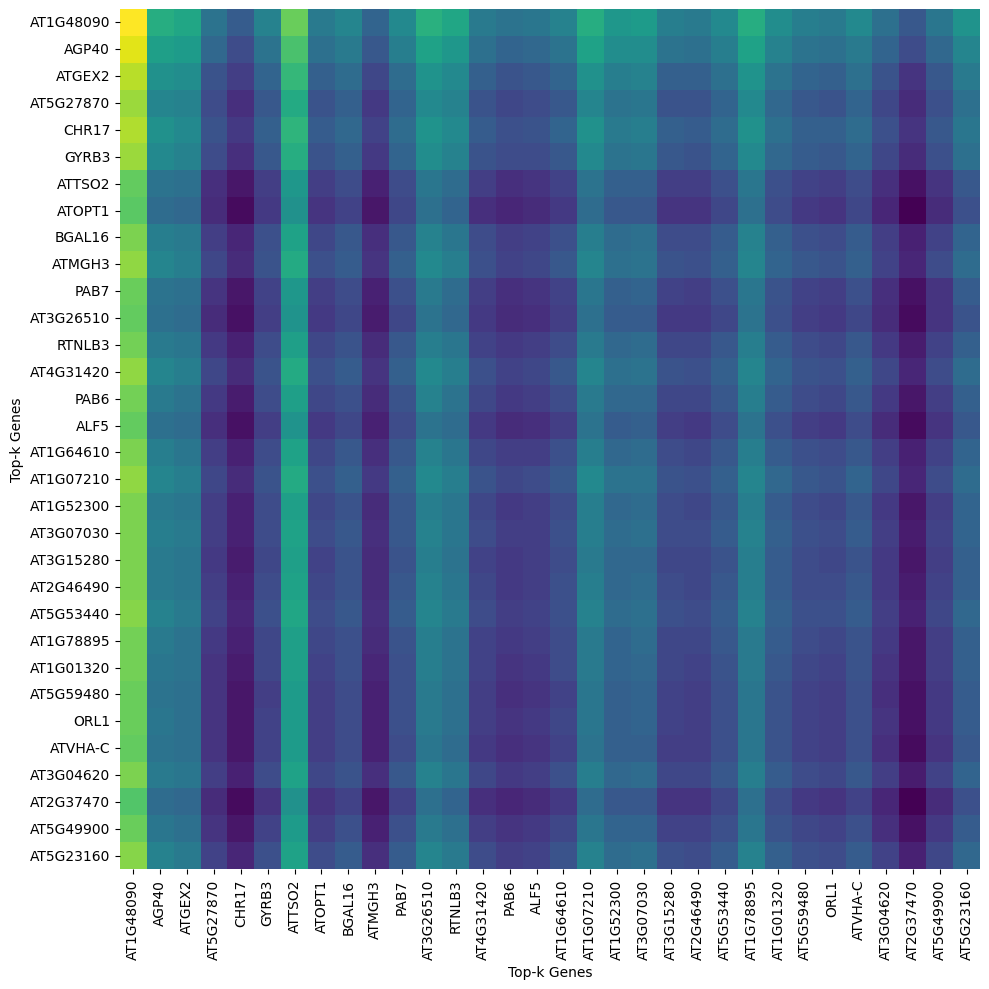

Attention scores heatmap for cell SRX20853658@@_CTTACCGTCTTTACAC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_CTTACCGTCTTTACAC-1.pdf
['AT2G36660', 'AT2G31902', 'AT5G59690', 'AT5G49150', 'AT1G64610', 'AT1G19890', 'AT1G54240', 'AT1G77940', 'AT1G77410', 'AT5G19600', 'AT2G01250', 'AT1G24520', 'AT2G16586', 'AT4G39260', 'AT3G16380', 'AT1G80660', 'AT4G20260', 'AT1G34340', 'AT5G04110', 'AT5G54095', 'AT3G60245', 'AT1G61566', 'AT5G64480', 'AT2G34480', 'AT5G49900', 'AT2G37470', 'AT5G60800', 'AT3G22760', 'AT1G52300', 'AT1G79950', 'AT4G39230', 'AT4G25950']


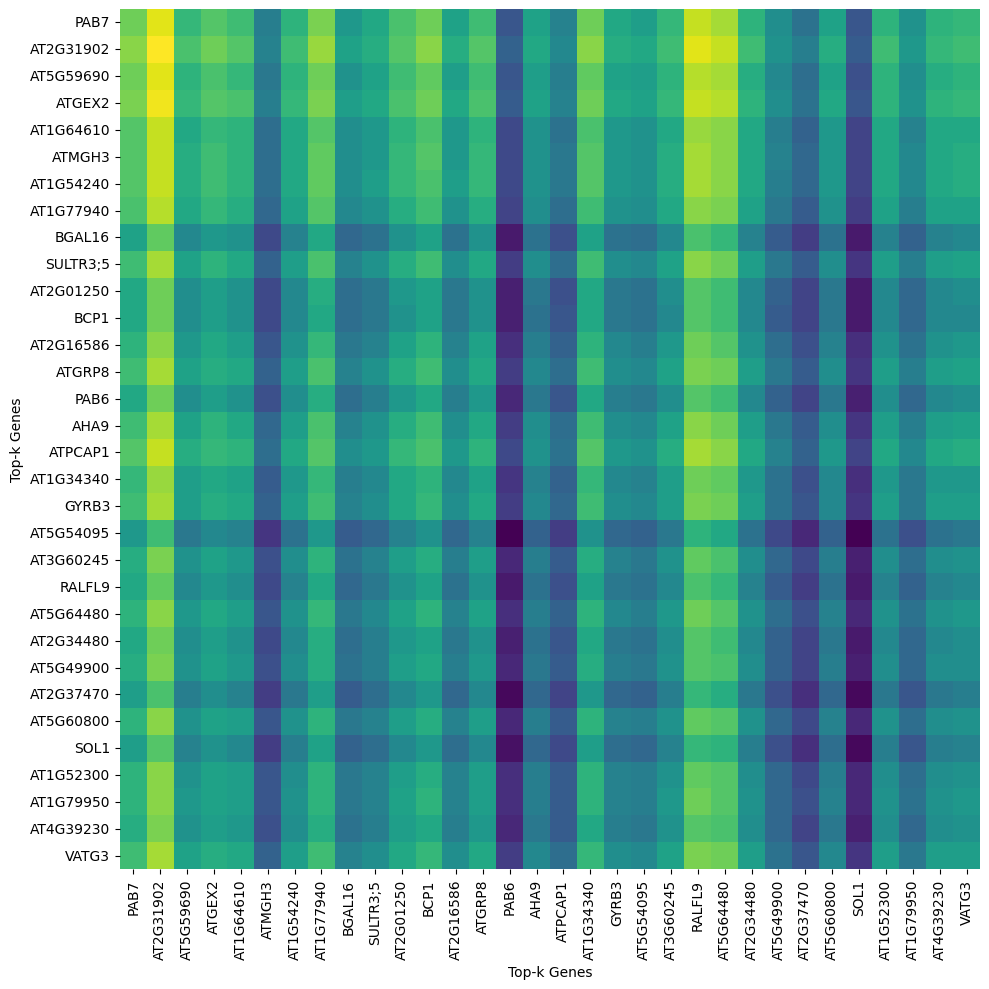

Attention scores heatmap for cell SRX20853658@@_AGCGTATCAGTCAGAG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_AGCGTATCAGTCAGAG-1.pdf
['AT1G15930', 'AT2G19110', 'AT2G47730', 'AT5G04110', 'AT4G11380', 'AT5G03620', 'AT3G20865', 'AT5G60800', 'AT2G16750', 'AT3G28790', 'AT3G58160', 'AT1G67430', 'AT3G14040', 'AT2G01250', 'AT5G44800', 'AT4G39200', 'AT3G09390', 'AT4G39260', 'AT5G53820', 'AT3G16080', 'AT2G07560', 'AT1G50310', 'AT4G27090', 'AT2G16940', 'AT5G54095', 'AT5G38760', 'AT5G20290', 'AT2G30630', 'AT5G25880', 'AT1G69940', 'AT1G24520', 'AT2G26610']


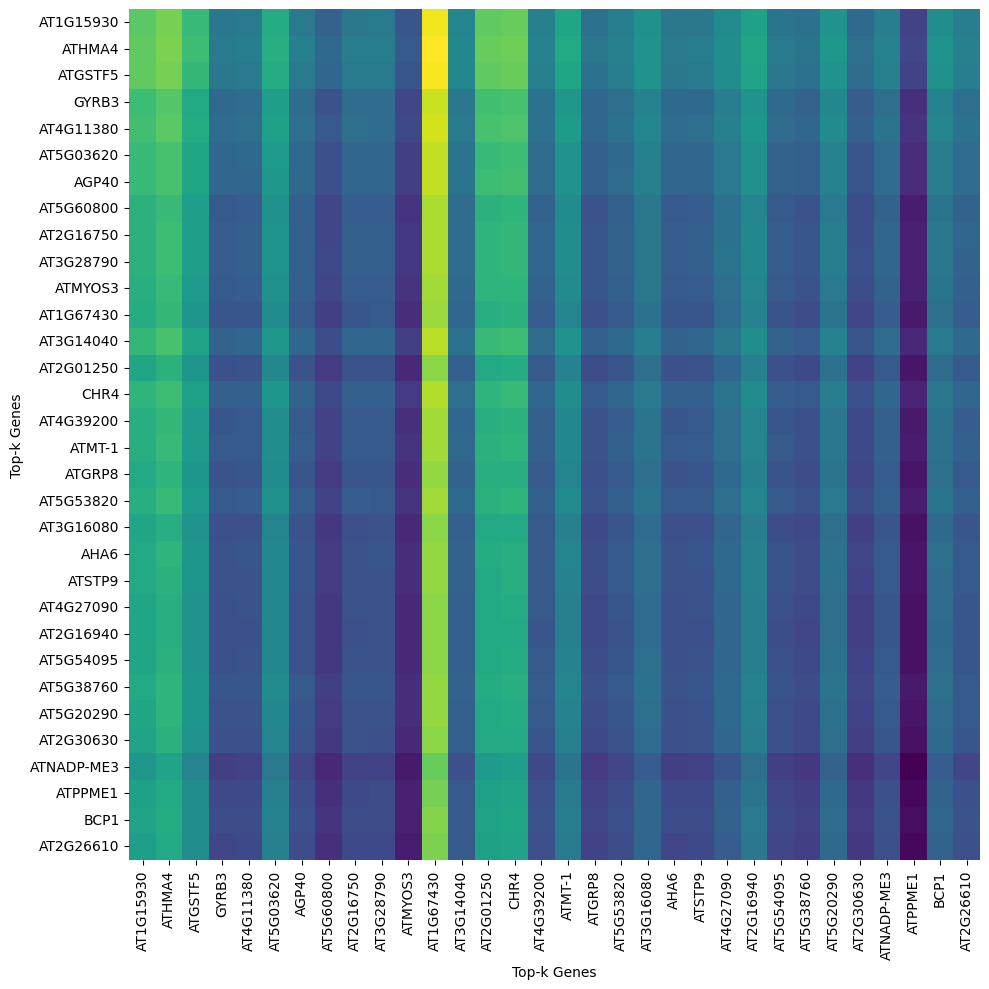

Attention scores heatmap for cell SRX20853658@@_GTGCTTCAGGTGCCAA-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853658@@_GTGCTTCAGGTGCCAA-1.pdf
['AT4G14780', 'AT1G15930', 'AT3G09390', 'AT5G38760', 'AT3G20865', 'AT5G59690', 'AT2G26610', 'AT1G64090', 'AT5G55930', 'AT1G61566', 'AT4G08590', 'AT2G34480', 'AT2G35680', 'AT5G02770', 'AT3G25495', 'AT1G69940', 'AT5G04990', 'AT1G08170', 'AT3G28790', 'AT4G20260', 'AT1G12840', 'AT3G28980', 'AT1G70320', 'AT1G75950', 'AT1G76110', 'AT3G22760', 'AT5G49900', 'AT5G60800', 'AT1G43170', 'AT5G07410', 'AT4G39200', 'AT3G04620']


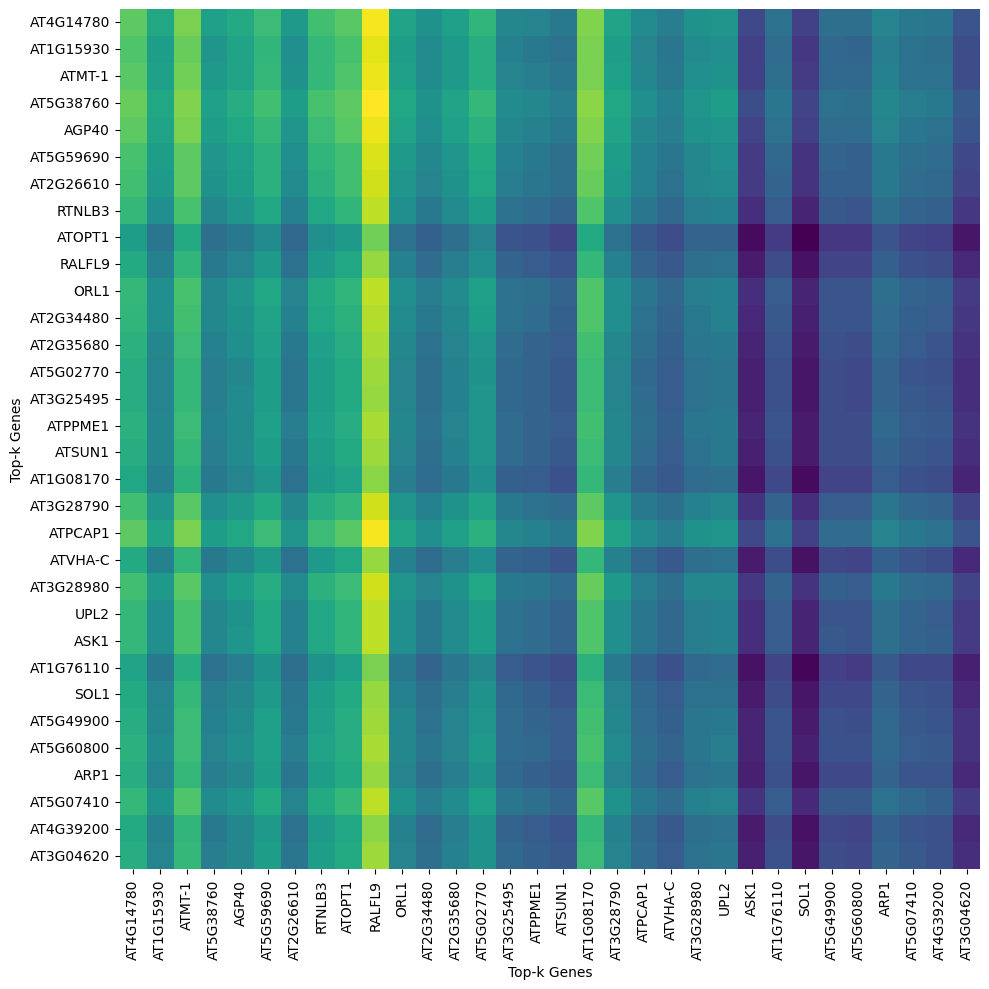

Attention scores heatmap for cell SRX20853658@@_CAGAGCCAGCTTACGT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_CAGAGCCAGCTTACGT-1.pdf
['AT4G08580', 'AT5G54095', 'AT2G21660', 'AT3G23530', 'AT3G23810', 'AT1G80930', 'AT1G73860', 'AT5G48545', 'AT5G12960', 'AT4G26640', 'AT2G29880', 'AT1G54450', 'AT4G35010', 'AT3G15280', 'AT5G50830', 'AT1G29010', 'AT5G46250', 'AT2G39705', 'AT2G05642', 'AT4G04980', 'AT5G21105', 'AT4G37280', 'AT2G22950', 'AT4G26260', 'AthLNC024348', 'AT1G68610', 'AT1G76010', 'AT1G04080', 'AT1G75870', 'AT5G66030', 'AT3G26510', 'AT1G12640']


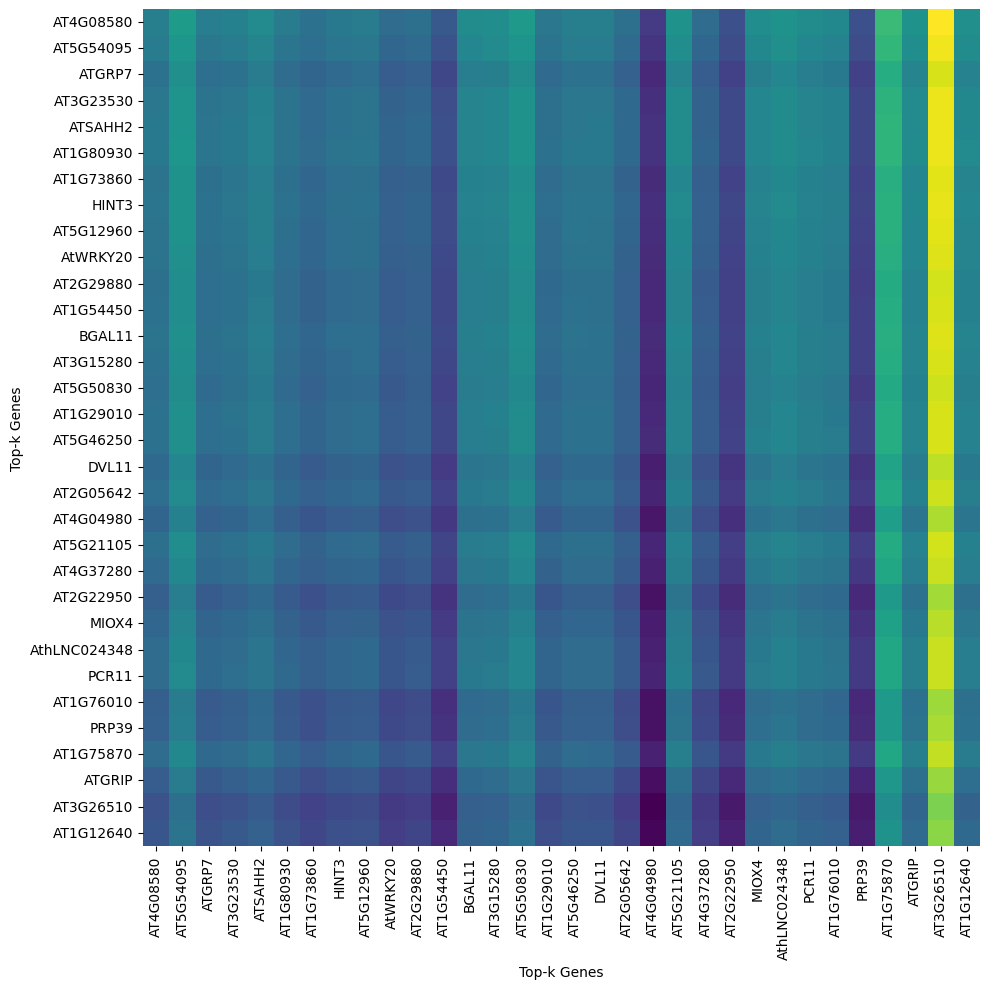

Attention scores heatmap for cell SRX20853658@@_CATCAAGGTCGTTGGC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853658@@_CATCAAGGTCGTTGGC-1.pdf
['AT2G04880', 'AT5G03620', 'AT2G07698', 'AT2G16586', 'AT3G20865', 'AT4G39260', 'AT2G21660', 'ATCG00040', 'AthLNC022670', 'AT5G39870', 'AT3G28830', 'AT5G07410', 'AT2G26610', 'AT5G53460', 'AT2G39705', 'AthLNC005935', 'AT4G26640', 'AT2G39300', 'AT2G34300', 'AT1G79950', 'AT4G22590', 'AT2G32240', 'AT1G04080', 'AT4G34060', 'AT3G14040', 'AT5G54095', 'AT1G52300', 'AT1G54560', 'AT4G37280', 'AT1G79245', 'AT4G35010', 'AT1G26840']


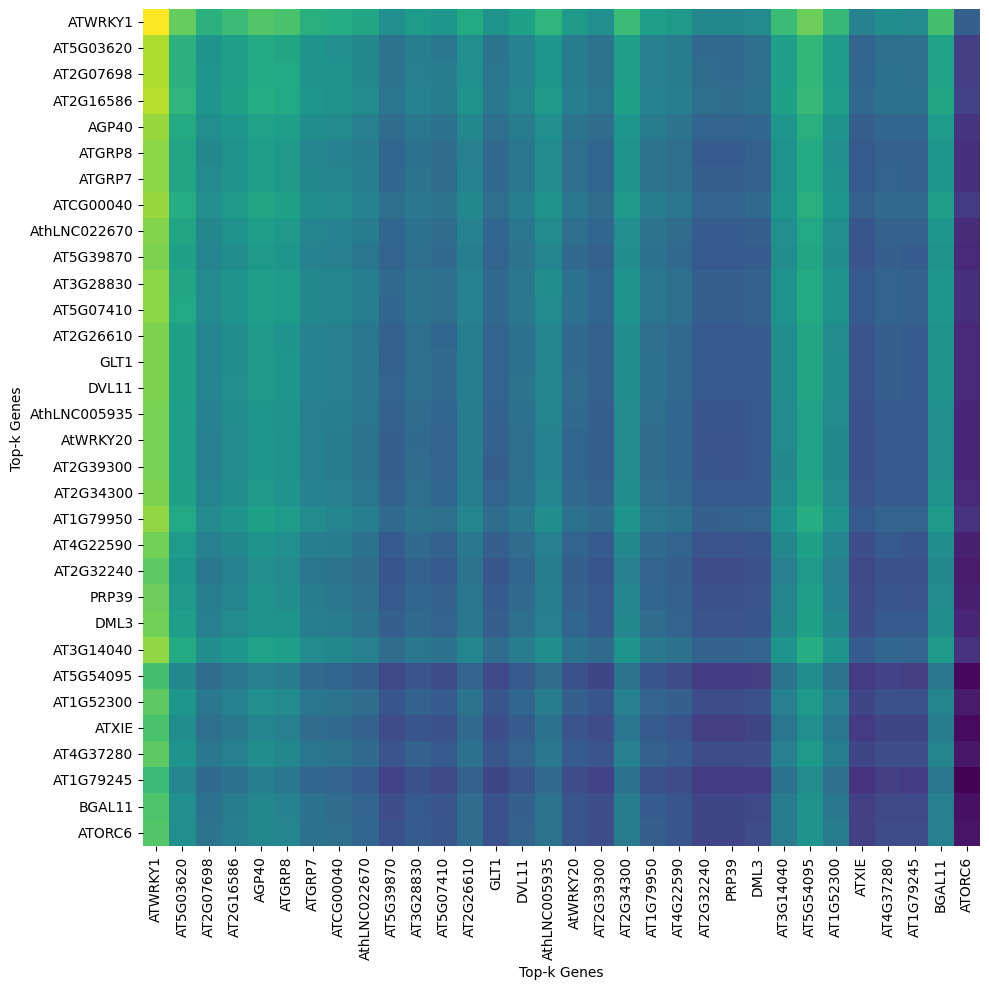

Attention scores heatmap for cell SRX20853656@@_TCGACCTTCTCATTGT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_TCGACCTTCTCATTGT-1.pdf
['AT1G25098', 'AT4G14780', 'AT4G06748', 'AT2G16750', 'AT5G46795', 'AT1G50310', 'AT3G20865', 'AT5G04110', 'AT5G54095', 'AT2G22795', 'AT5G03620', 'AT1G69940', 'AT1G54240', 'AT5G01760', 'AT5G62850', 'AT2G36390', 'AT5G59690', 'AT3G09200', 'AT1G15200', 'AT2G30630', 'AT3G60245', 'AT1G22760', 'AT3G53350', 'AT4G25950', 'AT1G34340', 'AT3G14040', 'AT5G20710', 'AT1G47980', 'AT3G51070', 'AT2G06983', 'AT4G38590', 'AT2G01008']


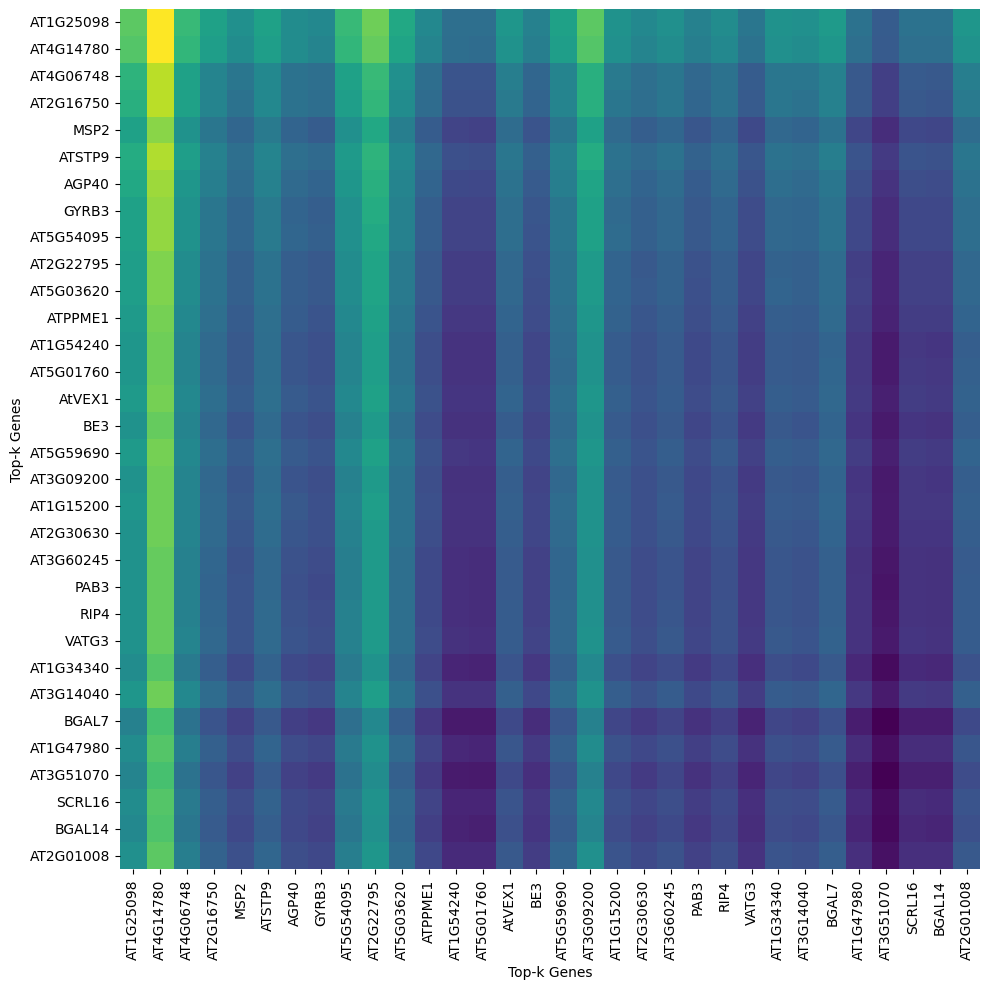

Attention scores heatmap for cell SRX20853656@@_ATGTCCCGTCAGGTAG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853656@@_ATGTCCCGTCAGGTAG-1.pdf
['AT3G02480', 'AT4G26640', 'AT2G29880', 'AT5G12960', 'ATCG00020', 'AT5G49900', 'AthLNC022670', 'AthLNC024348', 'AT1G28620', 'AT4G33270', 'AT3G61160', 'AT1G26840', 'AT5G54095', 'AT2G45405', 'AT5G50830', 'AT2G21660', 'AT5G10950', 'AT1G75870', 'AT4G26190', 'AT5G20290', 'AT1G20220', 'AT5G02500', 'AT4G01100', 'AT1G77210', 'AT1G24520', 'AT4G11030', 'AT4G22590', 'AT5G15140', 'AT1G71770', 'AT1G08760', 'AT1G04080', 'AT3G17630']


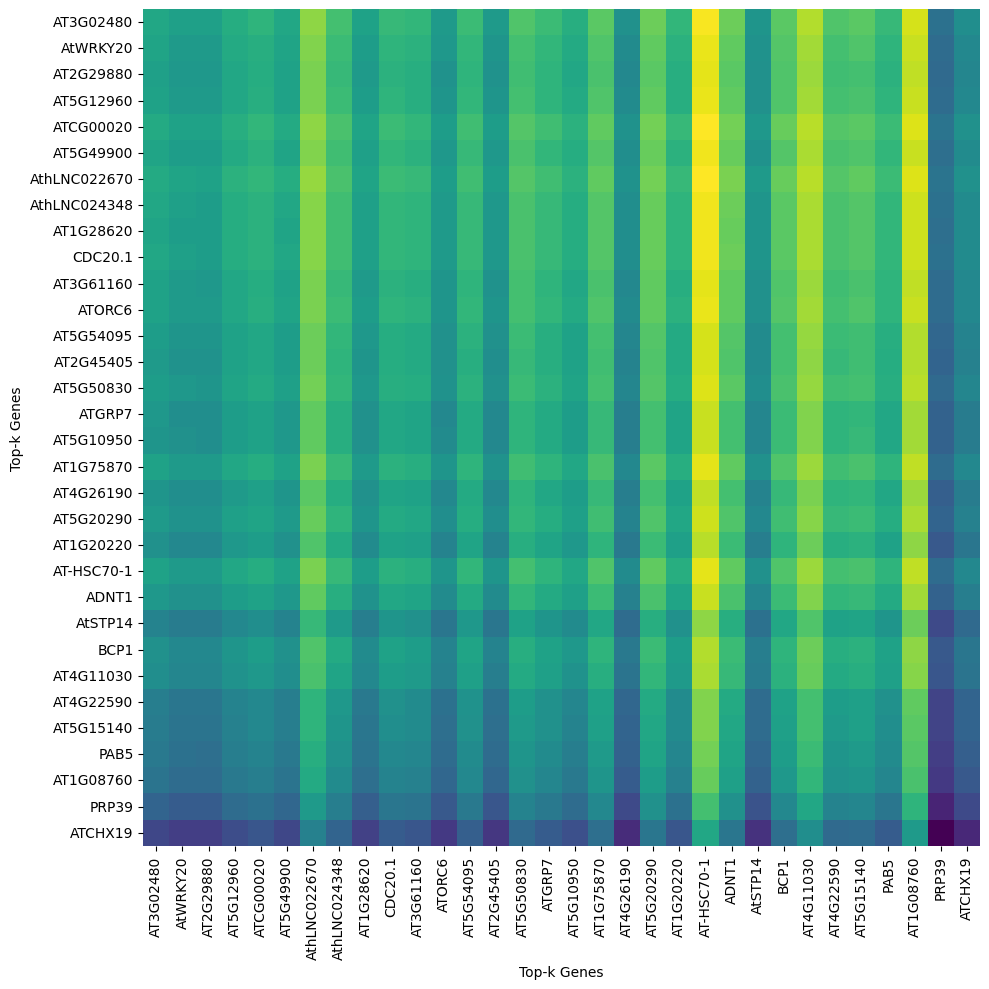

Attention scores heatmap for cell SRX20853656@@_TGGAGAGAGCCTGACC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_bi_heatmap_output_SRX20853656@@_TGGAGAGAGCCTGACC-1.pdf
['AT4G28570', 'AT5G07410', 'AT5G13840', 'AT2G25060', 'AT4G31840', 'AT2G29880', 'AT1G04080', 'ATCG00020', 'AT3G14040', 'AT1G68610', 'AthLNC005935', 'AT3G52920', 'AthLNC012937', 'AT3G28830', 'AT3G20865', 'AT1G08600', 'AT5G07530', 'AT2G45405', 'AT3G15400', 'AT4G13960', 'AT1G31740', 'AT3G28980', 'AT2G19860', 'AT5G53460', 'AT1G79245', 'AT5G53510', 'AT4G20160', 'AT1G79950', 'AT4G26190', 'AT1G09690', 'AT3G01270', 'ATCG00040']


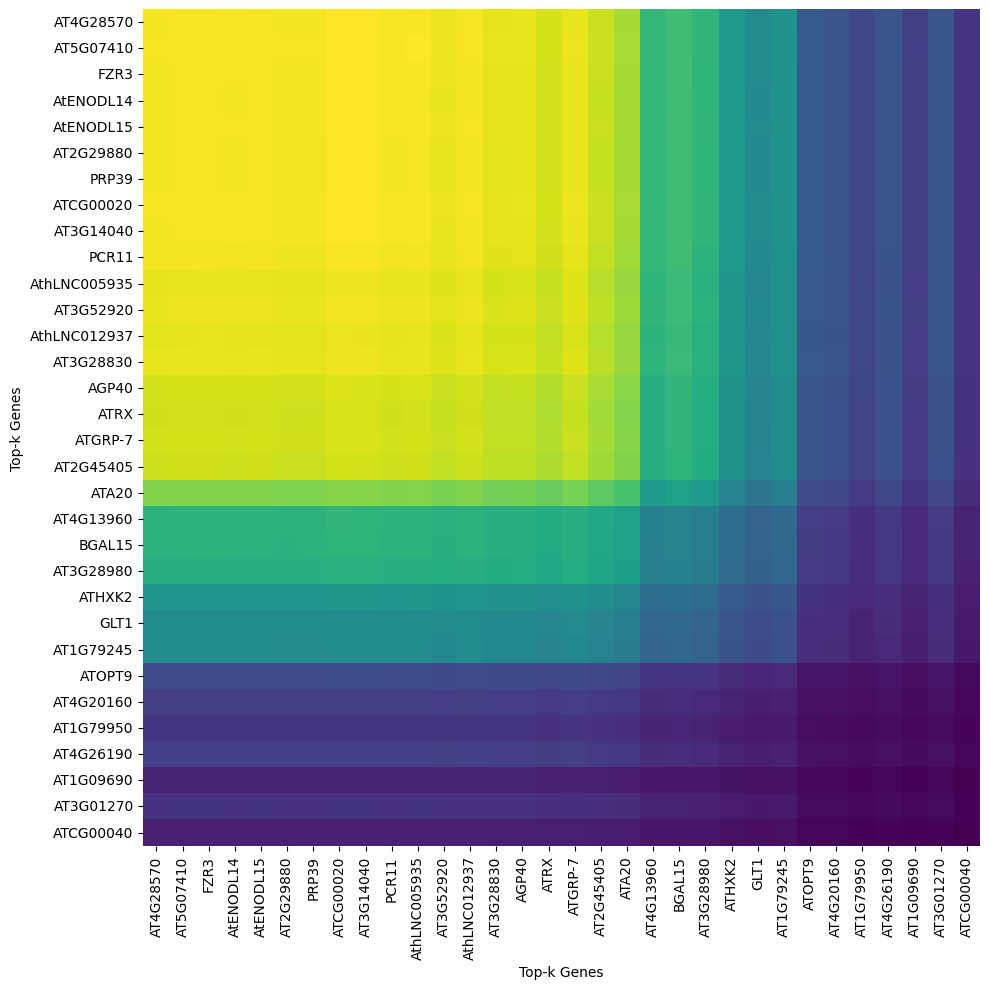

Attention scores heatmap for cell SRX20853656@@_AGTGATCAGAGTATAC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/MN_heatmap_output_SRX20853656@@_AGTGATCAGAGTATAC-1.pdf
['AT5G53460', 'AT4G25950', 'AT4G36600', 'AT5G07410', 'AT3G54000', 'AT1G28620', 'AT3G28830', 'AT1G20920', 'AT3G14040', 'AT1G15430', 'AT1G77210', 'AT3G07675', 'AT1G79950', 'AT4G06748', 'AT3G20865', 'AT3G07850', 'AT3G44050', 'AT1G15940', 'AT3G51070', 'AT2G44925', 'AT5G49160', 'AT3G58160', 'AT5G27610', 'AT5G24670', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


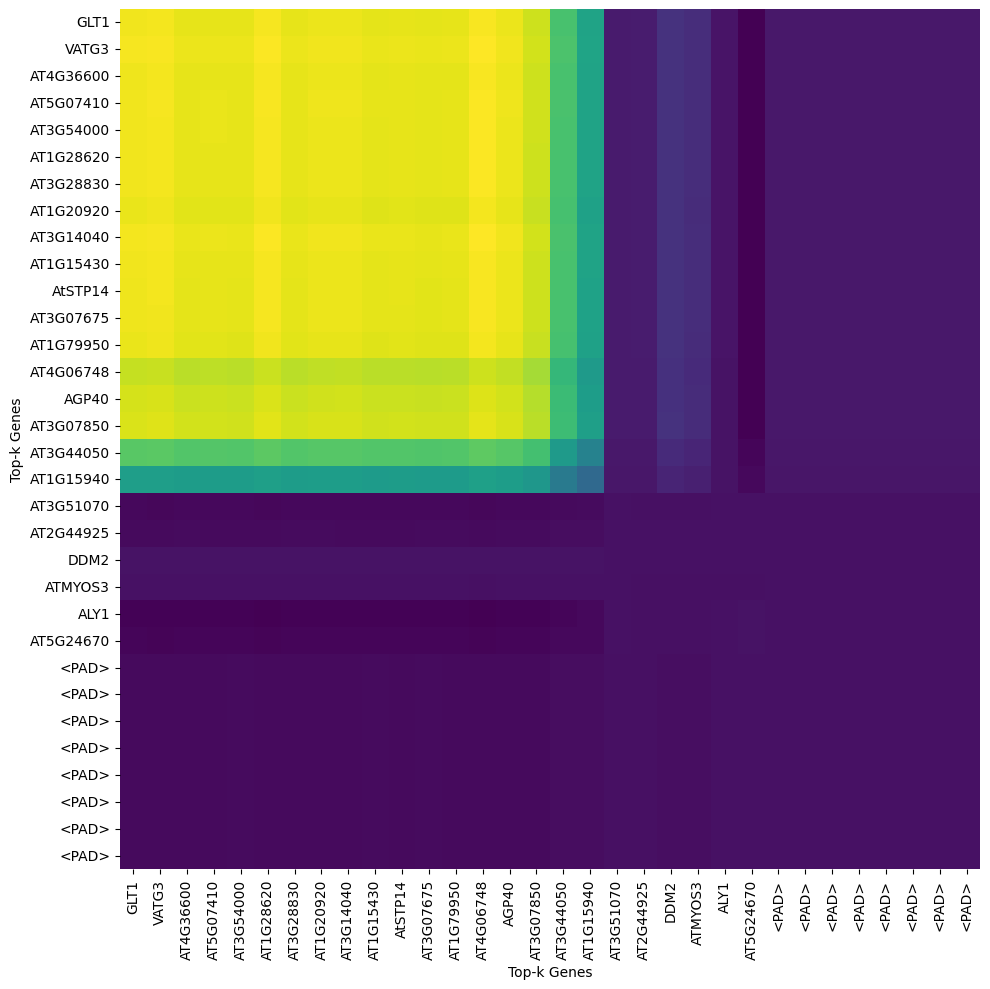

Attention scores heatmap for cell SRX20853656@@_ATCTTCAAGGCCTGCT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853656@@_ATCTTCAAGGCCTGCT-1.pdf
['AT1G06680', 'AT4G13940', 'AT1G25098', 'AT4G14780', 'AT2G19860', 'AT4G20260', 'AT3G20865', 'AT2G16750', 'AT4G39260', 'AT3G16380', 'AT2G37190', 'AT5G40600', 'AT2G36660', 'AT5G56710', 'AT3G11964', 'AT5G62850', 'AT1G77410', 'AT1G34340', 'AT2G07698', 'AT5G04110', 'ATCG01130', 'AT2G21660', 'AT5G38410', 'ATCG00740', 'ATCG00800', 'AT3G14040', 'AT1G54240', 'AT3G09390', 'AT5G07410', 'AT3G28980', 'AT1G65370', 'AT2G16940']


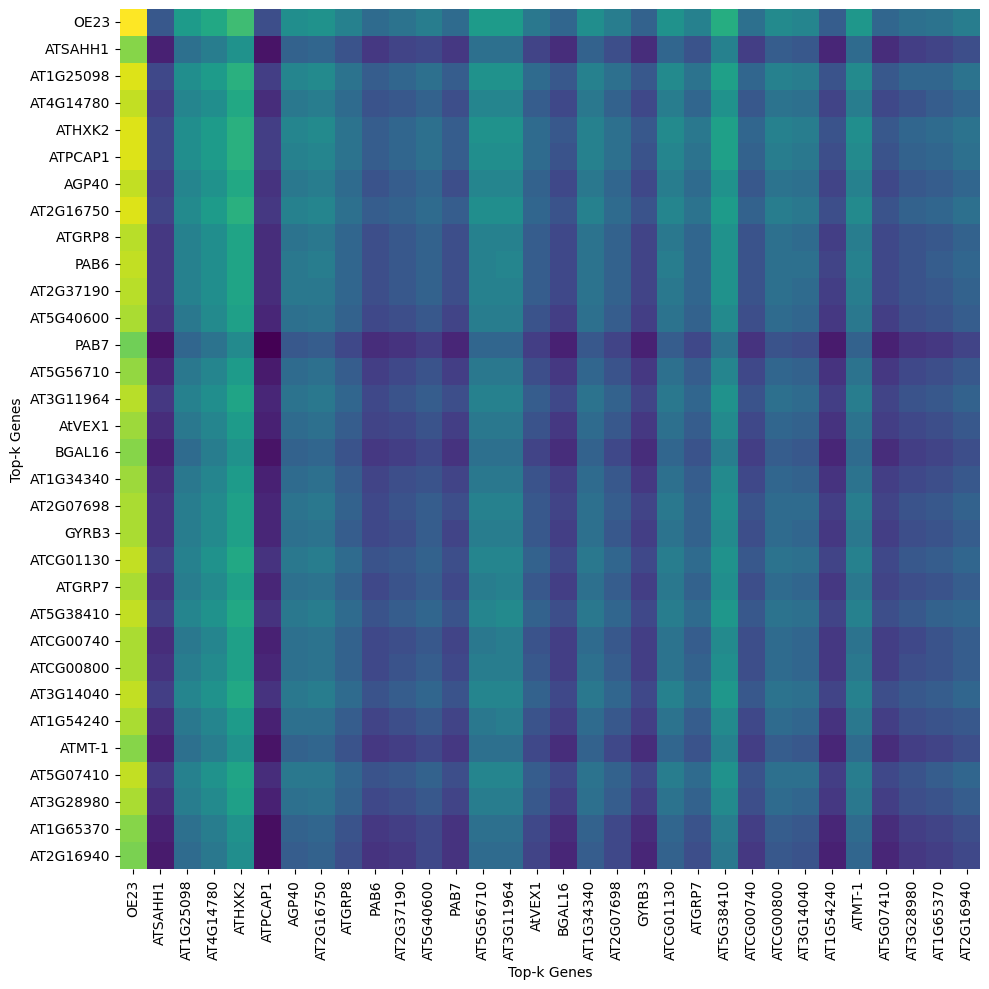

Attention scores heatmap for cell SRX20853658@@_GTCTCACCACGTCTCT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_GTCTCACCACGTCTCT-1.pdf
['AT5G25320', 'AT2G18020', 'AT5G58190', 'AT4G11830', 'AT3G58160', 'AT3G58310', 'AT4G14780', 'AT2G36660', 'AT5G44750', 'AT1G77940', 'AT1G34340', 'AT4G11380', 'AT2G16505', 'AT2G19110', 'AT1G67430', 'AT5G49150', 'AT3G15280', 'AT1G65040', 'AT1G69940', 'AT4G27090', 'AT2G16750', 'AT3G55620', 'AT2G29790', 'AT5G13700', 'AT2G26610', 'AT5G40600', 'AT3G49910', 'AT1G64090', 'AT1G54240', 'AT5G03620', 'AT3G09390', 'AT2G35680']


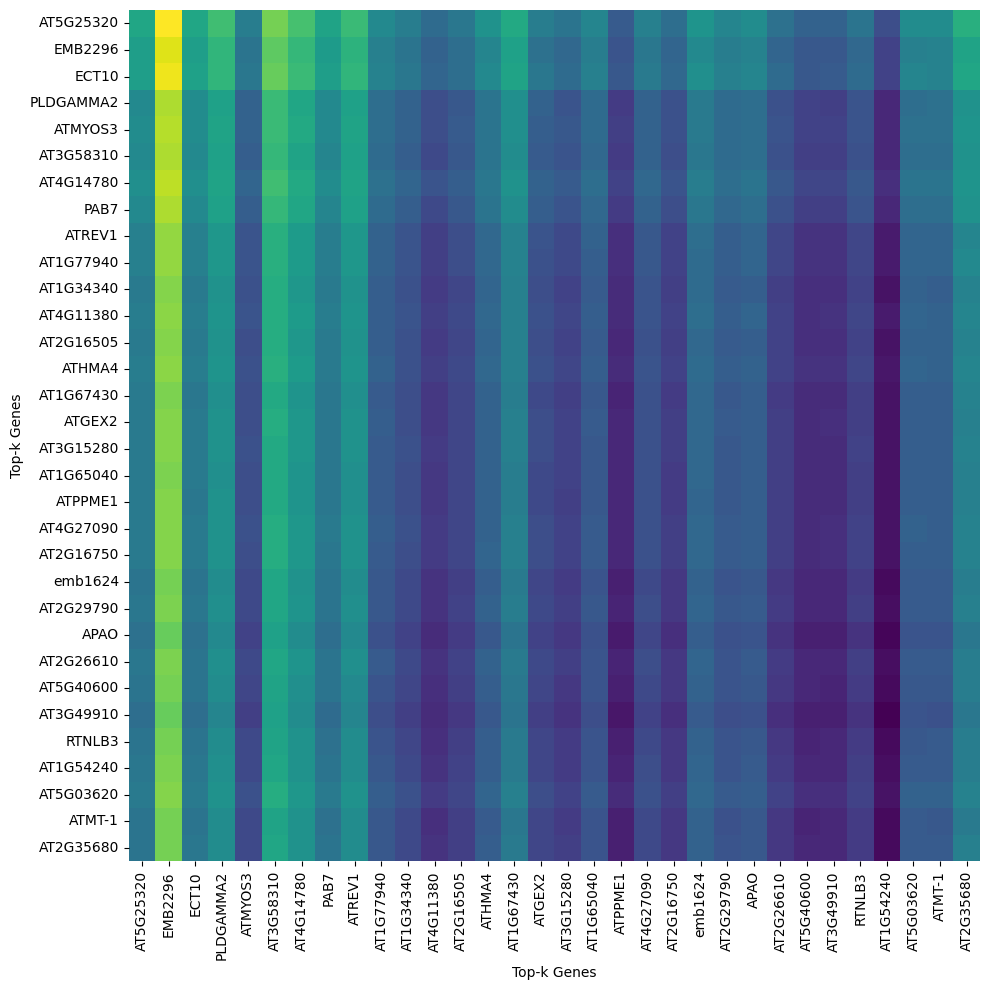

Attention scores heatmap for cell SRX20853658@@_GATAGAACAGCACAAG-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_GATAGAACAGCACAAG-1.pdf
['AT5G56030', 'AT1G11650', 'AT1G19310', 'AT5G40600', 'AT2G06040', 'AT1G79950', 'AT1G07820', 'AT2G31270', 'AT5G59870', 'AT5G11170', 'AT2G46170', 'AT3G09200', 'AT3G07030', 'AT5G53440', 'AT1G07210', 'AT3G55620', 'AT3G01015', 'AT5G23160', 'AT3G28830', 'AT3G02480', 'AT2G27120', 'AT5G16020', 'AT4G38940', 'AT1G07750', 'AT5G02270', 'AT1G47500', 'AT5G58760', 'AT2G27050', 'AT5G02770', 'AT4G36600', 'AT4G31840', 'AT2G07560']


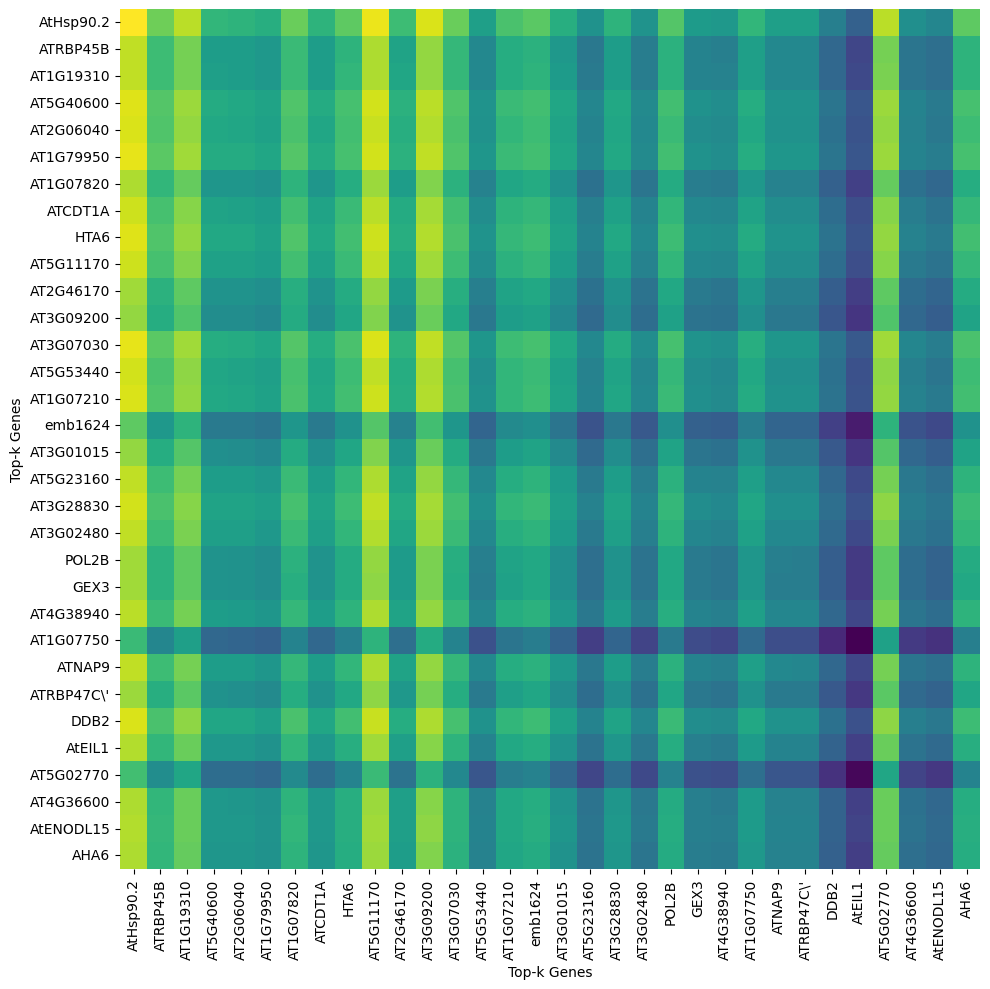

Attention scores heatmap for cell SRX20853658@@_GGGAGATGTGACTCGC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/SN_heatmap_output_SRX20853658@@_GGGAGATGTGACTCGC-1.pdf
['AT5G39870', 'AT5G53440', 'AT3G14040', 'AT3G30720', 'AT5G04110', 'AT2G16750', 'AT5G62850', 'AT4G39670', 'AT1G50310', 'AT1G04080', 'AT5G53460', 'AT4G31420', 'AT1G15430', 'AT1G60410', 'AT3G20865', 'AT5G55490', 'AT3G11410', 'AT1G70620', 'AT1G69750', 'AT2G31902', 'AT4G30860', 'AT4G22590', 'AT1G26840', 'AT5G58760', 'AT2G06040', 'AT1G17710', 'AT2G36660', 'AT2G07560', 'AT3G28980', 'AthLNC014214', 'AT4G33270', 'AT4G13230']


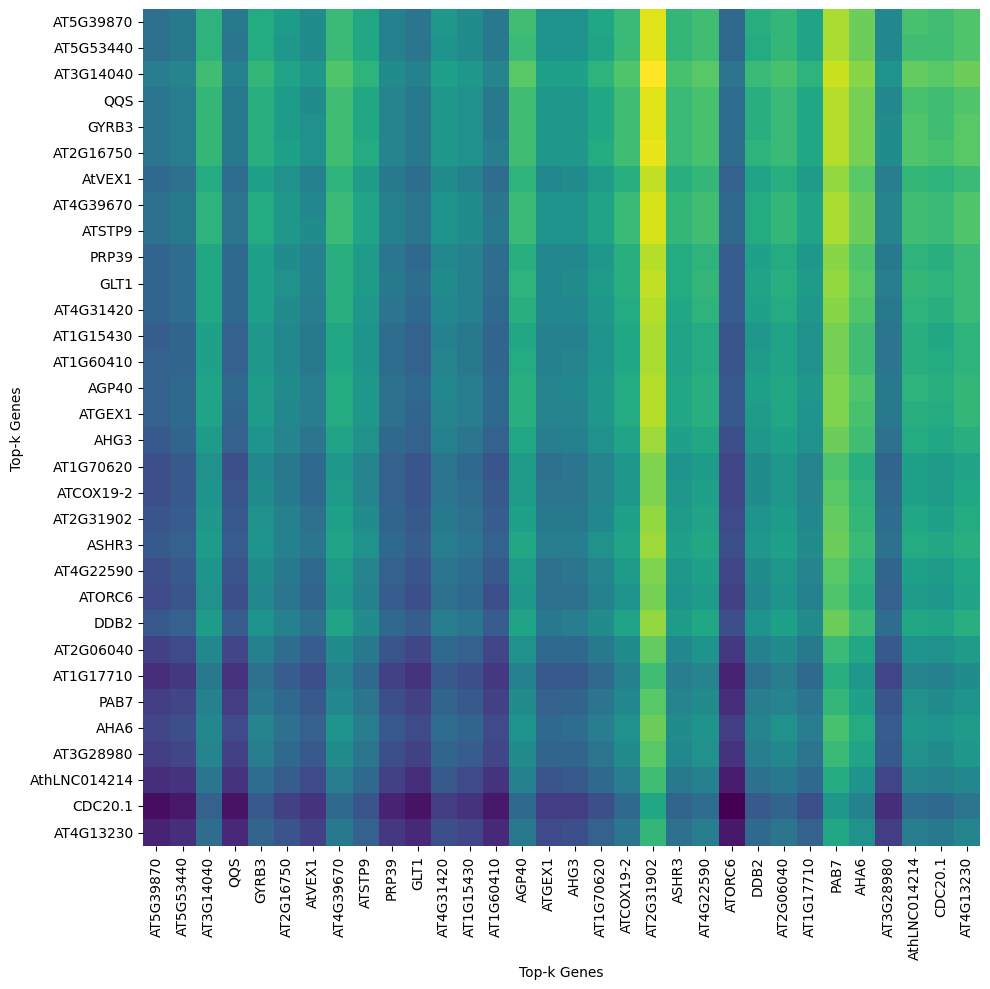

Attention scores heatmap for cell SRX20853658@@_CCTCTAGGTCTTTCAT-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/VN_mature_heatmap_output_SRX20853658@@_CCTCTAGGTCTTTCAT-1.pdf
['AT2G07698', 'AT2G16586', 'AT5G07410', 'AT1G20920', 'AT3G28830', 'AT3G30720', 'AT2G27050', 'AT4G05710', 'AT3G51070', 'AthLNC005935', 'AT5G07530', 'AT4G22590', 'ATCG01130', 'AT1G15940', 'AT5G21105', 'AT1G26840', 'AT1G58120', 'AT5G12960', 'AT5G54095', 'AT3G01700', 'AT3G58160', 'AT2G07560', 'AT3G20770', 'AT1G31070', 'AT3G28790', 'AT5G18620', 'AT2G04880', 'AT1G73860', 'AT2G33420', 'AT2G06040', 'AT1G05580', 'AT5G50830']


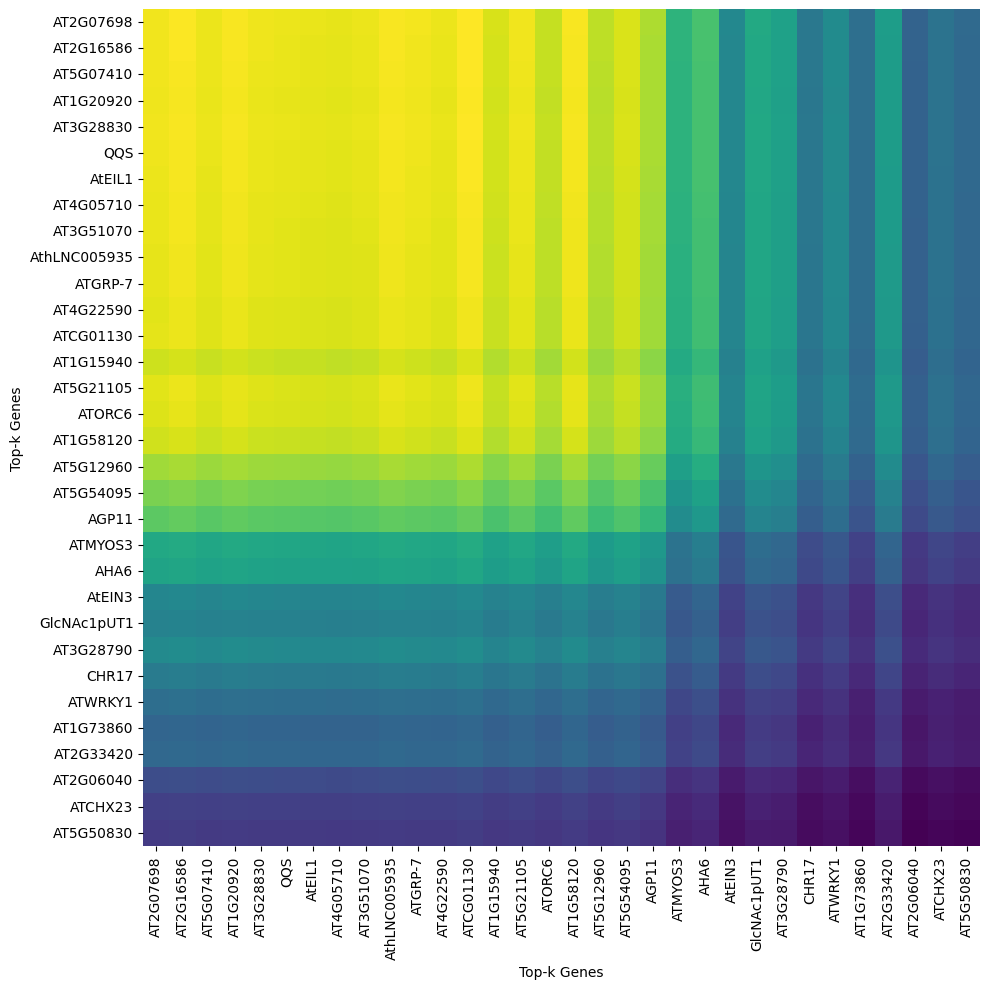

Attention scores heatmap for cell SRX20853656@@_CCCTCTCGTACCATAC-1 saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/GN_heatmap_output_SRX20853656@@_CCCTCTCGTACCATAC-1.pdf


In [35]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

# 假设 topk_genes 包含每个样本的 top-k 基因 ID，all_topk_indices 包含 top-k 索引，attn_scores 包含注意力分数
flag = 0
for i, (topk_gene_ids, topk_indices) in enumerate(zip(topk_genes, all_topk_indices)):
    
    # if cell_types[i] != 'Root cortex':
    #     continue
    # 获取对应的基因名称和注意力分数
    gene_names = [id_to_gene[gene_id] for gene_id in topk_gene_ids]
    print(gene_names)
    gene_names = [gene_mapping.get(gene_id, gene_id) for gene_id in gene_names]
    # if not all(gene in gene_names for gene in ["ATNIT1", "ATCHS"]):
    #     continue

    
    # 提取样本的注意力分数矩阵 [seq_len, seq_len]
    sample_attn_scores = attn_scores[i].cpu().numpy()

    # 提取 top-k 基因之间的注意力分数子矩阵
    topk_attn_scores = sample_attn_scores[np.ix_(topk_indices, topk_indices)]  # [top_k, top_k]

    # 归一化处理（Min-Max 归一化）以使得热图更加清晰
    topk_attn_scores_min = np.nanmin(topk_attn_scores)
    topk_attn_scores_max = np.nanmax(topk_attn_scores)
    topk_attn_scores_normalized = (topk_attn_scores - topk_attn_scores_min) / (topk_attn_scores_max - topk_attn_scores_min)

    # 使用 seaborn 热图绘制 top-k 基因之间的注意力分数
    plt.figure(figsize=(10, 10))
    sns.heatmap(topk_attn_scores_normalized, cmap='viridis', mask=np.isnan(topk_attn_scores_normalized),
                xticklabels=gene_names, yticklabels=gene_names, cbar=False, square=True)
    # plt.title(f'Top-{key} Gene Attention Scores for Cell {cell_types[i]}')
    plt.xlabel('Top-k Genes')
    plt.ylabel('Top-k Genes')
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
        # 显示并保存图像为 PDF，确保没有边框
    save_path = f"/mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_has_content/{cell_types[i]}_heatmap_output_{cell_names[i]}.pdf"
    plt.savefig(save_path, format='pdf', bbox_inches='tight', pad_inches=0)
    plt.show()
    
    print(f"Attention scores heatmap for cell {cell_names[i]} saved to {save_path}")
    flag += 1
    # 只绘制一个样本
    if flag>103:
        break


In [26]:
topk_genes

array([[17811, 13913, 31591, ...,  8898, 10806, 14868],
       [32202, 21601, 25503, ..., 24240,  7251, 26098],
       [ 9037, 11598, 23409, ..., 18893, 25216, 10473],
       ...,
       [ 4993, 29033, 17681, ..., 19901, 24595,  3509],
       [29033, 30608, 25503, ...,  5100,   245,  2532],
       [24743,  4993, 25503, ..., 31254,  8339, 16792]])

In [27]:
all_topk_indices

tensor([[ 44, 187, 146,  ...,  79, 164, 154],
        [ 15,   8,  63,  ...,  18,  51,   4],
        [ 59,  42, 114,  ..., 167, 125,  31],
        ...,
        [ 21,  64,  25,  ..., 107,  10,  93],
        [ 63,  66,  45,  ...,  96,  23,  95],
        [ 20,  32,  77,  ...,  40, 122,   8]])

In [25]:
#去除坐标
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 假设 topk_genes 包含每个样本的 top-k 基因 ID，all_topk_indices 包含 top-k 索引，attn_scores 包含注意力分数
flag = 0
for i, (topk_gene_ids, topk_indices) in enumerate(zip(topk_genes, all_topk_indices)):
    
    if cell_types[i] != 'Root cortex':
        continue
    # 获取对应的基因名称和注意力分数
    gene_names = [id_to_gene[gene_id] for gene_id in topk_gene_ids]
    print(gene_names)
    gene_names = [gene_mapping.get(gene_id, gene_id) for gene_id in gene_names]

    # 提取样本的注意力分数矩阵 [seq_len, seq_len]
    sample_attn_scores = attn_scores[i].cpu().numpy()

    # 提取 top-k 基因之间的注意力分数子矩阵
    topk_attn_scores = sample_attn_scores[np.ix_(topk_indices, topk_indices)]  # [top_k, top_k]

    # 归一化处理（Min-Max 归一化）以使得热图更加清晰
    topk_attn_scores_min = np.nanmin(topk_attn_scores)
    topk_attn_scores_max = np.nanmax(topk_attn_scores)
    topk_attn_scores_normalized = (topk_attn_scores - topk_attn_scores_min) / (topk_attn_scores_max - topk_attn_scores_min)

    # 使用 seaborn 热图绘制 top-k 基因之间的注意力分数
    plt.figure(figsize=(10, 10))
    ax = sns.heatmap(topk_attn_scores_normalized, cmap='viridis', mask=np.isnan(topk_attn_scores_normalized),
                     xticklabels=False, yticklabels=False, cbar=False, square=True)
    
    # 去除 xy 轴的名称
    ax.set_xlabel('')
    ax.set_ylabel('')

    # 去除坐标轴和边框
    plt.axis('off')
    
    # 去除图片的边距
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    # 去除所有的边距和空白
    plt.gca().set_position([0, 0, 1, 1])
    
    # 显示并保存图像为 PDF，确保没有边框
    save_path = f"/mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/fig_tight/{cell_types[i]}_heatmap_output_{cell_names[i]}.pdf"
    plt.savefig(save_path, format='pdf', bbox_inches='tight', pad_inches=0)
    plt.show()
    
    flag += 1
    # 只绘制一个样本
    if flag > 103:
        break

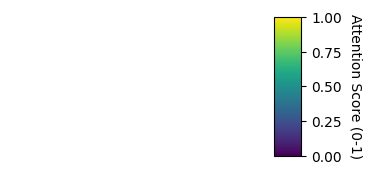

In [17]:
# 单独绘制一个 legend figure 并保存
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

plt.figure(figsize=(4, 2))
sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=0, vmax=1))
sm.set_array([])
cbar = plt.colorbar(sm, ax=plt.gca(), orientation='vertical', shrink=0.9, aspect=5)
cbar.set_label('Attention Score (0-1)', rotation=270, labelpad=15)

plt.axis('off')
legend_save_path = "/mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/attention_map_result/legend_output.pdf"
plt.savefig(legend_save_path, format='pdf', bbox_inches='tight', pad_inches=0)
plt.show()

In [18]:
import torch
import json
import numpy as np
from collections import defaultdict
import networkx as nx
import matplotlib.pyplot as plt

# Step 1: 提取每个样本的注意力矩阵
# 假设 attn_scores_list 是一个包含每个样本的注意力矩阵的列表，形状为 [N, seq_len, seq_len]
attn_scores_list = np.array([attn_score.cpu().numpy() for attn_score in attn_scores])  # 提取注意力矩阵
N, seq_len, _ = attn_scores_list.shape  # 获取样本数量 N 和序列长度 seq_len

# Step 2: 基因名称的映射
# 从 gene ID 映射到基因名称
gene_vocab_file = f'{project_path}/s03_scPlantGPT/cross_data/cross_gene_vocab.json'
with open(gene_vocab_file) as f:
    gene_vocab = json.load(f)
id_to_gene = {v: k for k, v in gene_vocab.items()}  # 从ID映射到基因名称

# 对于每个细胞，获取其基因名称列表
all_gene_names = []
for cell_gene_ids in all_input_gene_ids:  # 假设 input_gene_ids 是 [batch_size, seq_len]
    gene_names = [id_to_gene[gene_id.item()] for gene_id in cell_gene_ids]
    all_gene_names.append(gene_names)  # 存储每个细胞的基因名称列表

In [19]:
from joblib import Parallel, delayed
from scipy.sparse import lil_matrix

threshold = 0.5  # 设置注意力阈值
batch_size = 50  # 每个批次的大小，避免一次性处理所有样本爆内存

# Step 3: 使用稀疏矩阵和并行计算频次聚合
# 使用稀疏矩阵来存储基因对的频次，使用 LIL 格式以方便增量更新
frequency_matrix = lil_matrix((len(gene_vocab), len(gene_vocab)), dtype=np.float32)

def process_sample(attn_matrix, gene_ids):
    # 找到第一个 `<PAD>` 的位置，只处理非 `<PAD>` 部分
    pad_index = next((i for i, gene_id in enumerate(gene_ids) if gene_id == 0), len(gene_ids))

    # 只处理非 `<PAD>` 的部分，基因 ID 为 gene_ids[:pad_index]
    valid_gene_ids = gene_ids[:pad_index]
    attn_matrix = attn_matrix[:pad_index, :pad_index]  # 截取有效部分的注意力矩阵

    # 0-1 归一化操作
    attn_min = attn_matrix.min()
    attn_max = attn_matrix.max()
    attn_matrix_normalized = (attn_matrix - attn_min) / (attn_max - attn_min + 1e-6)  # 避免除以零

    # 使用归一化后的注意力矩阵
    local_frequency = lil_matrix((len(gene_vocab), len(gene_vocab)), dtype=np.float32)

    # 遍历注意力矩阵，根据阈值筛选显著基因对
    for i in range(len(valid_gene_ids)):
        for j in range(len(valid_gene_ids)):
            if attn_matrix_normalized[i, j] > threshold:
                local_frequency[valid_gene_ids[i], valid_gene_ids[j]] += 1

    return local_frequency

# 按批次处理样本，避免爆内存
for batch_start in range(0, N, batch_size):
    batch_end = min(batch_start + batch_size, N)
    batch_results = Parallel(n_jobs=-1, backend="multiprocessing")(
        delayed(process_sample)(attn_scores_list[sample_idx], all_input_gene_ids[sample_idx]) for sample_idx in range(batch_start, batch_end)
    )

    # 将每个样本的频次矩阵累加到全局频次矩阵中
    for local_frequency in batch_results:
        frequency_matrix += local_frequency

# Step 4: 归一化处理
frequency_matrix /= N  # 将频次矩阵归一化

print("Frequency matrix construction completed.")

#648 min


Frequency matrix construction completed.


In [20]:
import os
from scipy.sparse import save_npz, load_npz, lil_matrix, coo_matrix

def save_frequency_matrix(matrix, file_path):
    """
    保存稀疏频次矩阵到磁盘。

    参数：
    matrix (scipy.sparse.lil_matrix or scipy.sparse.coo_matrix): 需要保存的频次矩阵。
    file_path (str): 保存文件的路径。
    """
    # 将矩阵转换为 COO 格式并保存为 npz 文件
    save_npz(file_path, matrix.tocoo())
    print(f"Frequency matrix saved to {file_path}.")

def load_frequency_matrix(file_path):
    """
    从磁盘加载保存的稀疏频次矩阵。

    参数：
    file_path (str): 要加载的文件路径。

    返回：
    scipy.sparse.lil_matrix: 加载的频次矩阵（LIL 格式，方便后续操作）。
    """
    # 从 npz 文件中加载稀疏矩阵
    if os.path.exists(file_path):
        matrix = load_npz(file_path).tolil()  # 转换为 LIL 格式，以便于增量更新
        print(f"Frequency matrix loaded from {file_path}.")
        return matrix
    else:
        print(f"No saved frequency matrix found at {file_path}. Starting from scratch.")
        return None

# 保存频次矩阵的文件路径
frequency_matrix_path = "/mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/attention_map_result/frequency_matrix_0.5.npz"

save_frequency_matrix(frequency_matrix, frequency_matrix_path)
# frequency_matrix = load_frequency_matrix(frequency_matrix_path)



Frequency matrix saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/attention_map_result/frequency_matrix_0.5.npz.


In [21]:
import json

# Step 4: 筛选显著基因对并保存
freq_threshold =20/N  # 至少在 20个 的样本中被标记为显著
print(freq_threshold)
significant_gene_pairs_list = []
row_indices, col_indices = frequency_matrix.nonzero()

pad_token = "<PAD>"  # 定义要过滤掉的基因节点名称
cls_token = "<cls>"  # 定义要过滤掉的 CLS 节点名称

# 筛选显著的基因对，同时去除含有 <PAD> 和 <cls> 的基因对
for i, j in zip(row_indices, col_indices):
    if frequency_matrix[i, j] > freq_threshold:
        gene_i = id_to_gene[i]
        gene_j = id_to_gene[j]
        
        # 过滤掉包含 <PAD> 和 <cls> 的基因对
        if gene_i not in (pad_token, cls_token) and gene_j not in (pad_token, cls_token):
            # 将基因对和频次存储为字典形式，并添加到列表中
            significant_gene_pairs_list.append({
                "gene_i": gene_i,
                "gene_j": gene_j,
                "frequency": float(frequency_matrix[i, j])  # 转换为标准 float 类型
            })

# 将显著基因对保存为 JSON 文件，避免重复筛选
significant_gene_pairs_path = "/mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/attention_map_result/significant_gene_pairs.json"
with open(significant_gene_pairs_path, "w") as json_file:
    json.dump(significant_gene_pairs_list, json_file, indent=2)
print(f"Significant gene pairs saved to {significant_gene_pairs_path}")



0.01644736842105263
Significant gene pairs saved to /mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/attention_map_result/significant_gene_pairs.json


In [40]:
gene_mapping_df

,Gene_ID,Gene_Name
0,AT1G01010,ANAC001
1,AT1G01020,ARV1
2,AT1G01020,ARV1
3,AT1G01030,NGA3
4,AT1G01040,ASU1
...,...,...
12776,AT5G67560,ARLA1D
12777,AT5G67570,DG1
12778,AT5G67580,ATTBP3
12779,AT5G67580,ATTBP3


Number of nodes: 678
Number of edges: 180633
Top 5 genes related to AT5G04110:
AT3G14040: 0.3075657784938812
AT3G20865: 0.28947368264198303
AT3G28980: 0.2787829041481018
AT5G07410: 0.26398026943206787
AT2G16586: 0.2615131437778473
Top 5 genes related to AT5G17920:
AT2G07698: 0.07483552396297455
AT5G07410: 0.07236842066049576
AT5G38760: 0.0690789446234703
AT2G16586: 0.06825657933950424
AT3G14040: 0.06578947603702545


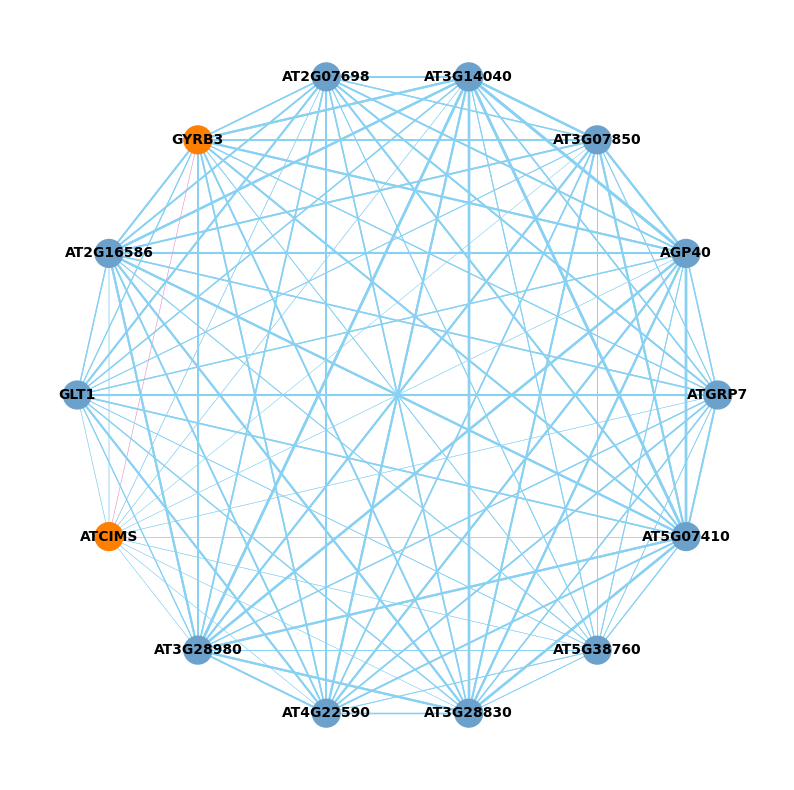

In [54]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import random
from adjustText import adjust_text
import pandas as pd
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42


def extract_multiple_genes_subgraph(G, center_genes, k, depth):
    """
    从基因调控网络中提取多个指定基因及其前 k 个相关基因的子图，深度为 depth。

    参数：
    G (networkx.DiGraph): 原始基因调控网络（完整图）。
    center_genes (list of str): 作为中心的基因 ID 列表。
    k (int): 获取前 k 个最相关的基因。
    depth (int): 提取子图的递归深度。

    返回：
    subgraph (networkx.DiGraph): 提取的子图。
    """
    nodes_to_include = set(center_genes)
    current_genes = center_genes

    for _ in range(depth):
        next_genes = []
        for gene in current_genes:
            top_related_genes = get_top_related_genes(G, gene, k)
            for related_gene, _ in top_related_genes:
                if related_gene not in nodes_to_include:
                    nodes_to_include.add(related_gene)
                    next_genes.append(related_gene)
        current_genes = next_genes

    subgraph = G.subgraph(nodes_to_include).copy()
    return subgraph

def visualize_subgraph(subgraph, output_file, center_genes=None):
    """
    可视化基因调控子图。

    参数：
    subgraph (networkx.DiGraph): 要可视化的基因调控子图。
    title (str): 图标题。
    center_genes (list of str): 中心基因列表，用于标记直接相连的节点。
    """
    plt.figure(figsize=(10, 10))
    # 设置节点之间的距离与边的权重成反比，权重越大，距离越近
    # 使用 spring 布局，并设置边的权重为 weight 的倒数，以确保权重越大距离越短
    # pos = nx.spring_layout(subgraph, seed=42, weight='weight', scale=1.5, iterations=100)
    pos = nx.circular_layout(subgraph)


    # 设置节点的颜色和大小，使图更加美观
    node_colors = []
    for node in subgraph.nodes:
        if center_genes and node in center_genes:
            node_colors.append("#ff7f00")  # 中心基因的节点颜色 #ff0000
        elif center_genes and any(node in subgraph.neighbors(gene) for gene in center_genes):
            node_colors.append("#6ca1cb")  # 与中心基因直接相连的节点颜色 ff7f00
        else:
            node_colors.append("#6ca1cb")  # 间接相连的节点颜色

    node_sizes = [400 for _ in subgraph.nodes]

    # 设置边的宽度和颜色，基于边的权重和连接类型
    edges = subgraph.edges(data=True)
    edge_weights = [edge[2]['weight'] for edge in edges]
    edge_widths = [5 * weight for weight in edge_weights]  # 将边的权重与可视化的宽度关联
    edge_colors = ["#ec98ce" if (edge[0] in center_genes and edge[1] in center_genes) else "#89d1f3" for edge in edges] #"#ec98ce" "#89d1f3" 
    # 获取替换后的基因名称
    labels = {node: gene_mapping.get(node, node) for node in subgraph.nodes}

    # 绘制节点、边和标签
    nx.draw_networkx_nodes(subgraph, pos, node_color=node_colors, node_size=node_sizes, alpha=1, node_shape="o")
    nx.draw_networkx_edges(subgraph, pos, width=edge_widths, edge_color=edge_colors, arrows=False)  # 去除箭头
    nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=10, font_weight='bold')
    # nx.draw_networkx_edge_labels(subgraph, pos, edge_labels={(edge[0], edge[1]): edge[2]['weight'] for edge in edges}, font_size=8)
    # plt.title(title, fontsize=15, fontweight='bold')
    plt.axis('off')
    plt.savefig(output_file, format="pdf", bbox_inches="tight")
    
    plt.show()

def get_related_genes(G, center_gene):
    """
    获取与指定基因相关的所有基因，基于边的权重进行排序，并去除回环和重复节点。

    参数：
    G (networkx.DiGraph): 基因调控网络。
    center_gene (str): 作为中心的基因 ID。

    返回：
    List[Tuple[str, float]]: 包含基因和对应权重的列表，按权重降序排序。
    """
    related_genes = []

    # 获取所有与中心基因相连的边（包括前驱和后继），并去除回环和重复节点
    for neighbor in G.successors(center_gene):
        if neighbor != center_gene:  # 去除回环
            weight = G[center_gene][neighbor]['weight']
            if neighbor not in [gene for gene, _ in related_genes]:  # 去除重复节点
                related_genes.append((neighbor, weight))

    for neighbor in G.predecessors(center_gene):
        if neighbor != center_gene:  # 去除回环
            weight = G[neighbor][center_gene]['weight']
            if neighbor not in [gene for gene, _ in related_genes]:  # 去除重复节点
                related_genes.append((neighbor, weight))

    # 按权重降序排序
    related_genes = sorted(related_genes, key=lambda x: x[1], reverse=True)
    return related_genes

def get_top_related_genes(G, center_gene, k):
    """
    获取与指定基因相关的前 k 个基因，基于边的权重进行排序。

    参数：
    G (networkx.DiGraph): 基因调控网络。
    center_gene (str): 作为中心的基因 ID。
    k (int): 获取前 k 个最相关的基因。

    返回：
    List[Tuple[str, float]]: 包含基因和对应权重的列表，按权重降序排序。
    """
    related_genes = get_related_genes(G, center_gene)
    return related_genes[:k]

# 创建一个有向图对象 G
G = nx.DiGraph()

# 遍历显著的基因对列表并添加到网络中
for gene_pair in significant_gene_pairs_list:
    gene_i = gene_pair["gene_i"]
    gene_j = gene_pair["gene_j"]
    if gene_i == gene_j:
        continue
    weight = gene_pair["frequency"]

    # 在图 G 中添加边，边的权重为频次
    G.add_edge(gene_i, gene_j, weight=weight)

# 检查网络是否构建成功
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")

# 示例：输入多个基因和前 k 个相关基因，绘制子图
gene1 ='GYRB3'
gene2 = 'ATCIMS'
center_gene_names = [gene1,  gene2]  # 示例基因，可以替换为你感兴趣的基因列表
center_genes = [gene_mapping_df[gene_mapping_df["Gene_Name"] == name]["Gene_ID"].values[0] for name in center_gene_names]
k = 5  # 选择最相关的前 5 个基因
depth = 2  # 指定深度

# 打印前 k 个相关基因
for center_gene in center_genes:
    if G.has_node(center_gene):
        top_related_genes = get_top_related_genes(G, center_gene, k)
        print(f"Top {k} genes related to {center_gene}:")
        for gene, weight in top_related_genes:
            print(f"{gene}: {weight}")

# 提取并可视化与这些基因相关的子图
subgraph = extract_multiple_genes_subgraph(G, center_genes, k, depth)
output_file = f"/mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/attention_map_result/network_fig/{gene1}_{gene2}_subgraph_k_5_depth_2.pdf"
visualize_subgraph(subgraph, output_file, center_genes=center_genes)


In [55]:
subgraph.nodes()

NodeView(('AT2G21660', 'AT3G20865', 'AT3G07850', 'AT3G14040', 'AT2G07698', 'AT5G04110', 'AT2G16586', 'AT5G53460', 'AT5G17920', 'AT3G28980', 'AT4G22590', 'AT3G28830', 'AT5G38760', 'AT5G07410'))

Number of nodes: 678
Number of edges: 180633
Top 2 genes related to AT5G04110:
AT3G14040: 0.3075657784938812
AT3G20865: 0.28947368264198303
Top 2 genes related to AT5G17920:
AT2G07698: 0.07483552396297455
AT5G07410: 0.07236842066049576


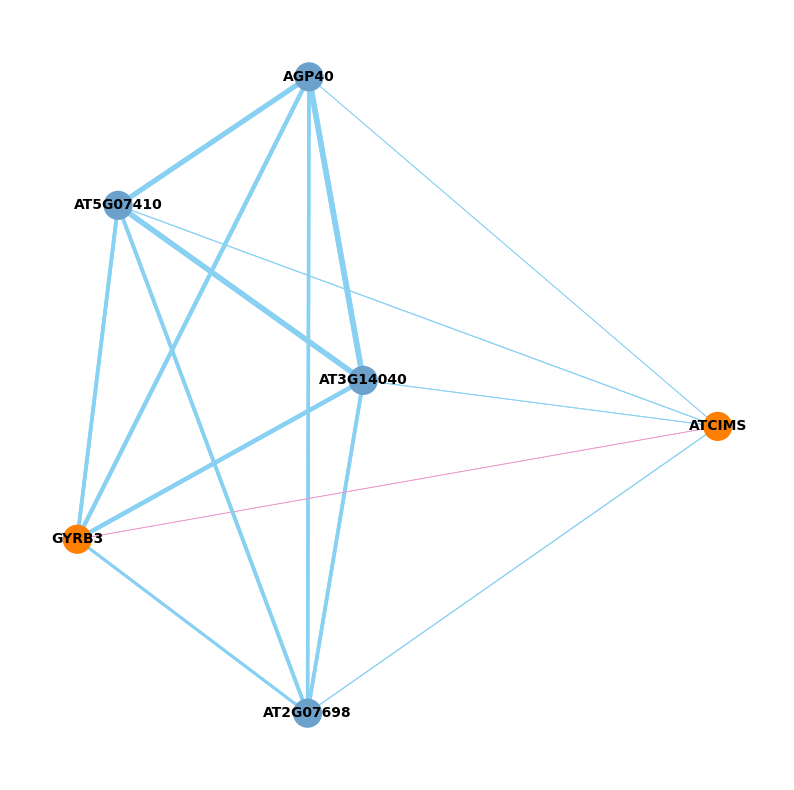

In [57]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import random
from adjustText import adjust_text
import pandas as pd
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42


def extract_multiple_genes_subgraph(G, center_genes, k, depth):
    """
    从基因调控网络中提取多个指定基因及其前 k 个相关基因的子图，深度为 depth。

    参数：
    G (networkx.DiGraph): 原始基因调控网络（完整图）。
    center_genes (list of str): 作为中心的基因 ID 列表。
    k (int): 获取前 k 个最相关的基因。
    depth (int): 提取子图的递归深度。

    返回：
    subgraph (networkx.DiGraph): 提取的子图。
    """
    nodes_to_include = set(center_genes)
    current_genes = center_genes

    for _ in range(depth):
        next_genes = []
        for gene in current_genes:
            top_related_genes = get_top_related_genes(G, gene, k)
            for related_gene, _ in top_related_genes:
                if related_gene not in nodes_to_include:
                    nodes_to_include.add(related_gene)
                    next_genes.append(related_gene)
        current_genes = next_genes

    subgraph = G.subgraph(nodes_to_include).copy()
    return subgraph

def visualize_subgraph(subgraph, output_file, center_genes=None):
    """
    可视化基因调控子图。

    参数：
    subgraph (networkx.DiGraph): 要可视化的基因调控子图。
    title (str): 图标题。
    center_genes (list of str): 中心基因列表，用于标记直接相连的节点。
    """
    plt.figure(figsize=(10, 10))
    # 设置节点之间的距离与边的权重成反比，权重越大，距离越近
    # 使用 spring 布局，并设置边的权重为 weight 的倒数，以确保权重越大距离越短
    pos = nx.spring_layout(subgraph, seed=42, weight='weight', scale=1.5, iterations=100)

    # 设置节点的颜色和大小，使图更加美观
    node_colors = []
    for node in subgraph.nodes:
        if center_genes and node in center_genes:
            node_colors.append("#ff7f00")  # 中心基因的节点颜色 #ff0000
        elif center_genes and any(node in subgraph.neighbors(gene) for gene in center_genes):
            node_colors.append("#6ca1cb")  # 与中心基因直接相连的节点颜色 ff7f00
        else:
            node_colors.append("#6ca1cb")  # 间接相连的节点颜色

    node_sizes = [400 for _ in subgraph.nodes]

    # 设置边的宽度和颜色，基于边的权重和连接类型
    edges = subgraph.edges(data=True)
    edge_weights = [edge[2]['weight'] for edge in edges]
    edge_widths = [10 * weight for weight in edge_weights]  # 将边的权重与可视化的宽度关联
    edge_colors = ["#ec98ce" if (edge[0] in center_genes and edge[1] in center_genes) else "#89d1f3" for edge in edges] #"#ec98ce" "#89d1f3" 
    # 获取替换后的基因名称
    labels = {node: gene_mapping.get(node, node) for node in subgraph.nodes}

    # 绘制节点、边和标签
    nx.draw_networkx_nodes(subgraph, pos, node_color=node_colors, node_size=node_sizes, alpha=1, node_shape="o")
    nx.draw_networkx_edges(subgraph, pos, width=edge_widths, edge_color=edge_colors, arrows=False)  # 去除箭头
    nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=10, font_weight='bold')
    # nx.draw_networkx_edge_labels(subgraph, pos, edge_labels={(edge[0], edge[1]): edge[2]['weight'] for edge in edges}, font_size=8)
    # plt.title(title, fontsize=15, fontweight='bold')
    plt.axis('off')
    plt.savefig(output_file, format="pdf", bbox_inches="tight")

    plt.show()

def get_related_genes(G, center_gene):
    """
    获取与指定基因相关的所有基因，基于边的权重进行排序，并去除回环和重复节点。

    参数：
    G (networkx.DiGraph): 基因调控网络。
    center_gene (str): 作为中心的基因 ID。

    返回：
    List[Tuple[str, float]]: 包含基因和对应权重的列表，按权重降序排序。
    """
    related_genes = []

    # 获取所有与中心基因相连的边（包括前驱和后继），并去除回环和重复节点
    for neighbor in G.successors(center_gene):
        if neighbor != center_gene:  # 去除回环
            weight = G[center_gene][neighbor]['weight']
            if neighbor not in [gene for gene, _ in related_genes]:  # 去除重复节点
                related_genes.append((neighbor, weight))

    for neighbor in G.predecessors(center_gene):
        if neighbor != center_gene:  # 去除回环
            weight = G[neighbor][center_gene]['weight']
            if neighbor not in [gene for gene, _ in related_genes]:  # 去除重复节点
                related_genes.append((neighbor, weight))

    # 按权重降序排序
    related_genes = sorted(related_genes, key=lambda x: x[1], reverse=True)
    return related_genes

def get_top_related_genes(G, center_gene, k):
    """
    获取与指定基因相关的前 k 个基因，基于边的权重进行排序。

    参数：
    G (networkx.DiGraph): 基因调控网络。
    center_gene (str): 作为中心的基因 ID。
    k (int): 获取前 k 个最相关的基因。

    返回：
    List[Tuple[str, float]]: 包含基因和对应权重的列表，按权重降序排序。
    """
    related_genes = get_related_genes(G, center_gene)
    return related_genes[:k]

# 创建一个有向图对象 G
G = nx.DiGraph()

# 遍历显著的基因对列表并添加到网络中
for gene_pair in significant_gene_pairs_list:
    gene_i = gene_pair["gene_i"]
    gene_j = gene_pair["gene_j"]
    if gene_i == gene_j:
        continue
    weight = gene_pair["frequency"]

    # 在图 G 中添加边，边的权重为频次
    G.add_edge(gene_i, gene_j, weight=weight)

# 检查网络是否构建成功
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")

# 示例：输入多个基因和前 k 个相关基因，绘制子图
center_gene_names = ["GYRB3",  "ATCIMS"]  # 示例基因，可以替换为你感兴趣的基因列表
center_genes = [gene_mapping_df[gene_mapping_df["Gene_Name"] == name]["Gene_ID"].values[0] for name in center_gene_names]
k = 2  # 选择最相关的前 5 个基因
depth = 1  # 指定深度

# 打印前 k 个相关基因
for center_gene in center_genes:
    if G.has_node(center_gene):
        top_related_genes = get_top_related_genes(G, center_gene, k)
        print(f"Top {k} genes related to {center_gene}:")
        for gene, weight in top_related_genes:
            print(f"{gene}: {weight}")

# 提取并可视化与这些基因相关的子图
subgraph = extract_multiple_genes_subgraph(G, center_genes, k, depth)
output_file = "/mnt/public6/caoguangshuo/scPlantGPT/GPB_revised/inference_result/GRN_analysis/attention_map_result/network_fig/4_subgraph_k_2_depth_1.pdf"
visualize_subgraph(subgraph, output_file, center_genes=center_genes)
